In [1]:
# Copyright 2020 Bimghi Choi. All Rights Reserved.
# 예측 + 투자전략 시스템

# _*_ coding: utf-8 _*_

from tensorflow import keras
import tensorflow as tf

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
#import os
#os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
#os.environ["CUDA_VISIBLE_DEVICES"]='0, 1'

In [2]:
import util
import preprocess as prepro
import models
import learn
from learn import GenerateResult
import math
import datetime

In [3]:
import matplotlib.pyplot as plt

def plot_graphs(history, metric):
  plt.plot(history.history[metric])
  plt.plot(history.history['val_'+metric], '')
  plt.xlabel("Epochs")
  plt.ylabel(metric)
  plt.legend([metric, 'val_'+metric])
  plt.show()

In [4]:
#tf.keras.backend.set_floatx('float64')

In [5]:
import gc
gc.collect()

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # 텐서플로가 첫 번째 GPU에 1GB 메모리만 할당하도록 제한
  try:
#    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')    
#    tf.config.experimental.set_visible_devices(gpus[1], 'GPU')    
    tf.config.experimental.set_virtual_device_configuration(
        gpus[0],
        [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=2048)])
  except RuntimeError as e:
    # 프로그램 시작시에 가장 장치가 설정되어야만 합니다
    print(e)

In [6]:
file_name = '~/Data/kospi200f_809_0515.csv'
item_name = 'kospi200f_loss_cut'
train_start = '2000-01-31'
train_end = '2017-01-02'
test_start = '2017-01-02'
test_end = '2020-05-15'

remove_columns = ['date', '종가']
target_column = '종가'
input_columns = []
target_type = 'rate'

model_name = 'loss_cut-2'
channel = False

trans_day = 1

target_alpha = 100
future_day = 2
train_end_back = -1
n_timestep = 30
time_interval = 4
input_size = 809
n_unit = 500
batch_size = 30
learning_rate = 0.0005
epochs = 2000

alpha = 0.0005
beta = 0.0001

comment = "1일후 예측, 모델1은 지수예측(mse) 모델2는 최적의 손절값 예측, 모델2 input = 모델1 input + target + output"

from datetime import datetime
now = datetime.now().strftime('%Y-%m-%d-%H:%M:%S')
checkpoint_path = model_name + "/pred"+str(future_day)+":"+now+".ckpt"

In [7]:
dataframe = util.read_datafile(file_name)
df = dataframe.copy()
#df = prepro.target_conversion(df, target_column, future_day, type=target_type)
a = []
b = []
for i in range(len(df[target_column]) -future_day):
    df.loc[i, target_column] = ((df.loc[i + future_day, target_column] - df.loc[i, target_column]) 
                                / df.loc[i, target_column]) * target_alpha 
    df.loc[i, '시가'] = df.loc[i + future_day + train_end_back + 1, '시가']
    a.append(max(df.loc[i + future_day + train_end_back + 1:i + future_day + 1, '고가']))
    b.append(min(df.loc[i + future_day + train_end_back + 1:i + future_day + 1, '저가']))
for i in range(len(df[target_column]) -future_day):
    df.loc[i, '고가'] = a[i]
    df.loc[i, '저가'] = b[i]

In [8]:
df.head(20)

,date,시가지수(포인트),고가지수(포인트),저가지수(포인트),종가지수(포인트),수익률(%),수익률 (1주)(%),수익률 (1개월)(%),수익률 (3개월)(%),수익률 (6개월)(%),...,"주요상품선물_천연가스(선물, NYMEX)($/mmBtu)",주요상품선물_금(선물)($/ounce),주요상품선물_은(선물)($/ounce),주요상품선물_알루미늄(선물)($/ton),주요상품선물_옥수수(최근월물)(￠/bu),대두박(￠/bu),종가,시가,고가,저가
0,2000-01-31,-0.218225,-0.493106,-0.400439,-0.223565,0.212872,1.352924,-0.851790,-0.382658,-0.162615,...,1.653438,-0.853010,0.974513,0.827681,0.373581,0.614542,-0.961538,116.55,120.25,115.95
1,2000-02-01,-0.213200,-0.230417,-0.373954,-0.595373,-0.407635,1.808646,-1.074203,-1.707405,-0.490731,...,1.687061,-0.039689,0.193571,1.002058,0.594935,0.706918,3.381014,119.35,123.45,116.80
2,2000-02-02,-0.208520,-0.448886,-0.367787,-0.200398,0.696677,2.107257,-0.769928,-1.558400,0.074389,...,1.809524,0.800355,0.031266,0.069626,0.430159,0.725768,3.292528,120.40,123.60,119.75
3,2000-02-03,-0.204125,-0.216603,-0.062403,-0.021445,0.366314,1.488978,-0.625155,-1.268930,-0.079967,...,1.213642,1.515992,0.623370,0.378121,0.084769,0.352875,1.677149,122.90,124.10,120.95
4,2000-02-07,-0.200000,0.378008,0.426748,0.592789,0.949260,1.101574,1.281908,-1.288431,1.273730,...,0.689954,3.856851,0.568635,-0.322023,0.518339,0.702038,0.653862,122.40,125.05,120.40
5,2000-02-08,-0.196110,0.353748,0.677387,0.254527,-0.366454,1.138729,0.998930,-1.329397,0.942469,...,0.332052,2.657684,1.222974,-0.720402,0.474125,0.440887,1.319588,120.85,125.05,119.85
6,2000-02-09,-0.192447,0.306497,0.819824,0.658684,0.641075,1.076862,1.233568,-1.637689,0.994675,...,0.557674,3.026664,2.114708,-0.407511,0.622228,0.721716,-1.867641,123.60,124.75,115.25
7,2000-02-10,0.330923,0.617187,0.552762,0.366383,-0.311193,0.651653,0.275024,-1.607973,0.269679,...,0.812787,3.316674,1.871659,-0.157431,0.985272,1.379493,-5.575906,118.85,119.00,110.45
8,2000-02-11,0.977388,0.576306,0.048738,-0.013448,-0.428351,0.326747,0.131530,-1.828185,0.546650,...,0.675096,2.384344,0.988933,-0.154629,0.473525,0.907189,-8.274721,116.45,116.80,105.25
9,2000-02-14,-0.649462,-0.806483,-0.954529,-1.222378,-1.533955,-1.217328,-0.075927,-2.486079,0.140712,...,0.504701,1.935983,0.085505,-0.246361,0.529501,0.923675,-1.422414,112.05,114.35,105.25


In [9]:
column_list = df.columns
column_list

Index(['date', '시가지수(포인트)', '고가지수(포인트)', '저가지수(포인트)', '종가지수(포인트)', '수익률(%)',
       '수익률 (1주)(%)', '수익률 (1개월)(%)', '수익률 (3개월)(%)', '수익률 (6개월)(%)',
       ...
       '주요상품선물_천연가스(선물, NYMEX)($/mmBtu)', '주요상품선물_금(선물)($/ounce)',
       '주요상품선물_은(선물)($/ounce)', '주요상품선물_알루미늄(선물)($/ton)',
       '주요상품선물_옥수수(최근월물)(￠/bu)', '대두박(￠/bu)', '종가', '시가', '고가', '저가'],
      dtype='object', length=814)

In [10]:
import pandas_profiling
data = df.loc[:, ['미국 SP 500 Index(종가)(Pt)', '거래량(주)', '외국인보유비중(%)', '종가']]
data = data[:-future_day]
pr = data.profile_report()
pr

In [11]:
train_start_index = max(df.loc[df['date']<=train_start].index) + time_interval*(n_timestep-1) - 1
train_end_index = max(df.loc[df['date']<=train_end].index)
base_prices = tf.reduce_mean(df.loc[train_start_index:train_end_index+1, '시가'])  

@tf.function
def loss_fn_model1_1(targets, preds):
 
    preds = tf.reshape(preds[:, n_timestep-1, :], [-1])
    targets = tf.reshape(targets[:, n_timestep-1, :], [-1])
    
   
    if alpha != 0:
        # add RRL cost - maximize downside sharp ratio

        # 1 if (pred - base) * (target - base) > 0, -1 otherwise
        F = tf.math.sign(targets*preds)
        F = tf.reshape(F, [-1])

        # calc returns from each step in batches
        R = tf.math.divide(tf.math.multiply(tf.math.abs(targets), (F - 0.00003)), base_prices)
        R = tf.reshape(R, [-1])

        # calc downside sharp ratio

        # downside returns
        DR = tf.minimum(0.0, R)
        DR = tf.reshape(DR, [-1])

        # calc. downside sharp ratio
        #s = []
        #for i in range(batch_size):
        #   std =  tf.keras.backend.std(DR[i, :, 0])
        #   s.append(tf.reduce_mean(R[i, :, 0])/tf.maximum(0.01, std))

        # calc. downside sharp ratio
        loss1 = tf.reduce_mean(R) / (tf.keras.backend.std(DR) + 0.001)
    else:
        loss1 = 0

    """
    # average profits, loss
    avg_plusR = [0.0]
    avg_minusR = [0.0]

    global num_of_profits
    global num_of_losses

    num_of_profits = 0
    num_of_losses = 0

    for i in range(batch_size):
        res = tf.cond(R[i, num_steps - 1, 0] > 0, lambda: return_one(), lambda: return_zero())
        if res == 1:
            avg_plusR.append(R[i, num_steps - 1, 0])
        else:
            avg_minusR.append(R[i, num_steps - 1, 0])
    avg_profit = tf.reduce_mean(avg_plusR) 
    avg_loss = tf.reduce_mean(avg_minusR) 
    """

    if beta != 0:
        #compute maximum drawdown

        #accm_profit = [0.0]
        #for i in range(batch_size):
        #    for j in range(num_steps):
        #        r = tf.cond((predict_prices[i, num_steps-1, 0] - base_prices[i, num_steps-1, 0]) *
        #                   (target_prices[i, num_steps-1, 0] - base_prices[i, num_steps-1, 0]) > 0,
        #                   lambda: return_one(),
        #                   lambda: return_zero())
        #        if r == 1: accm_profit.append(accm_profit[i*num_steps + j] + tf.abs(target_prices[i, j, 0] - base_prices[i, j, 0]))
        #        else:      accm_profit.append(accm_profit[i*num_steps + j] - tf.abs(target_prices[i, j, 0] - base_prices[i, j, 0]))

        accm_profit = [0.0 for i in range(batch_size)]
        for i in range(batch_size):
            if i == 0:
                accm_profit[0] = tf.sign(preds * targets) * tf.math.abs(targets)
            else:
                accm_profit[i] = accm_profit[i-1] + tf.sign(preds * targets) * tf.math.abs(targets)
        loss2 = (tf.reduce_max(accm_profit) - tf.reduce_min(accm_profit))/batch_size
    else:
        loss2 = 0

    return beta*loss2 - alpha*loss1

In [12]:
@tf.function
def loss_fn_model1(train_y, preds):
    
    #preds = tf.cast(preds, dtype=tf.float64)
    #train_y = tf.cast(train_y, dtype=tf.float64)
    rates = train_y / 100
    updown = tf.math.sign(train_y)
    profits = 1 + rates*tf.math.sign(preds)
    
    loss1 = keras.losses.MSE(preds, train_y)
    
    batches = tf.shape(train_y)[0]

    return_plus = 0.000000000
    return_minus = 0.000000000
    for i in range(batches):
        if profits[i, -1, 0] - 1 > 0.0: return_plus += profits[i, -1, 0]-1      
        else: return_minus += 1-profits[i, -1, 0]    

    loss2 = (return_plus - return_minus)/tf.cast(batches, dtype=tf.float32)
    
    return loss1 - loss2


In [13]:
#@tf.function
def loss_fn_model2(m1, m2, train_x, train_y):
    
    train_y_target = np.expand_dims(train_y[:, :, 3], axis=2)
    
    rates = train_y_target / 100
    updown = tf.math.sign(train_y_target)
    preds = tf.cast(tf.math.sign(m1(train_x)), dtype=tf.float64)
    profits = tf.cast(1 + tf.convert_to_tensor(rates, dtype=tf.float64)*preds, dtype=tf.float64)
    
    batches = tf.cast(train_y.shape[0], dtype=tf.int32)
    steps = train_y.shape[1]     

    targets = train_y_target.copy()
    targets[:, -max(1, int(future_day/time_interval)):, :] = 0
    train_x_m2 = tf.concat([train_x, preds, targets], 2)
    loss_cuts = tf.reshape(m2(train_x_m2)[:, -1, 0]*10, [-1])
    
    # 시가, 고가, 저가
    train_open_high_low = train_y[:, -1, :3].reshape((batches, 3))
    
    m2_targets = []
    for i in range(batches):
        if preds[i, -1, 0] > 0:
            if rates[i, -1, 0] > 0:
                m2_targets.append((train_open_high_low[i, 0] - train_open_high_low[i, 2])*0.5)# 상승 예측시 손절값은 (시가 - 저가)*a
            else: m2_targets.append(abs(train_open_high_low[i, 0]*train_y_target[i, -1, 0]/100)*0.3) # 손실*a(0~1)을 손절값으로
        else:
            if rates[i, -1, 0] < 0:
                m2_targets.append((train_open_high_low[i, 1] - train_open_high_low[i, 0])*0.5)# 하락 예측시 손절값은 (고가 - 시가)*a
            else: m2_targets.append(abs(train_open_high_low[i, 0]*train_y_target[i, -1, 0]/100)*0.3) # 손실*a(0~1)을 손절값으로
    return keras.losses.MSE(m2_targets, loss_cuts)


In [14]:
#@tf.function
def gradient1(model1, input_data, output_data):
    with tf.GradientTape() as tape:
        loss = loss_fn_model1(model1, input_data, output_data)
    return tape.gradient(loss, model1.trainable_variables)
#@tf.function
def gradient2(model1, model2, input_data, output_data):
    with tf.GradientTape() as tape:
        loss = loss_fn_model2(model1, model2, input_data, output_data)
    return tape.gradient(loss, model2.trainable_variables)

In [15]:

#strategy = tf.distribute.MirroredStrategy()
#with strategy.scope():
"""
model1 = tf.keras.Sequential([
    tf.keras.Input(shape=(n_timestep, input_size)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])
model1.summary()
model2 = tf.keras.Sequential([
    tf.keras.Input(shape=(n_timestep, input_size+1)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='tanh')
])
model2.summary()
"""
model1 = models.LSTM(n_timestep,input_size,n_unit,regularizers_alpha=0.01,drop_rate=0.5)
model2 = models.LSTM_sigm(n_timestep,input_size+2,n_unit,regularizers_alpha=0.01,drop_rate=0.5)

    #cp_callback = tf.keras.callbacks.ModelCheckpoint(
    #    checkpoint_path, verbose=1, save_weights_only=True,
        # 다섯 번째 에포크마다 가중치를 저장합니다
    #    save_freq=5)

model1.compile(optimizer='adam',
              loss='mse')
                  #callbacks=[cp-callback]
              #metrics=['accuracy'])
model1.save_weights(checkpoint_path)            

#    model2 = models.LSTM(n_timestep,input_size,n_unit,regularizers_alpha=0.01,drop_rate=0.5)
#    model2.compile(optimizer='adam',
#                  loss='mse')
                  #callbacks=[cp-callback]
              #metrics=['accuracy'])            

#modle_name = model_name + "tanh"            
#model2.save_weights("modle2_"+ checkpoint_path)

Train on 4066 samples, validate on 1 samples
Epoch 1/3
4066/4066 [==============================] - 9s 2ms/sample - loss: 24.9969 - val_loss: 3.4298
Epoch 2/3
4066/4066 [==============================] - 2s 377us/sample - loss: 1.9344 - val_loss: 1.1709
Epoch 3/3
4066/4066 [==============================] - 1s 366us/sample - loss: 0.9744 - val_loss: 0.6229

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porti

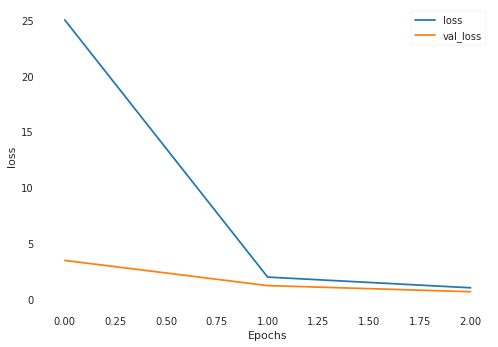

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.5147 - val_loss: 0.4385
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.3595 - val_loss: 0.3472
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.2807 - val_loss: 0.3145
loss cuts = tf.Tensor([1.0726832], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45250273, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7936538], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1549633, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.59329736], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03736387, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6419413], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.058535594, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6375894], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.056448717, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.74887

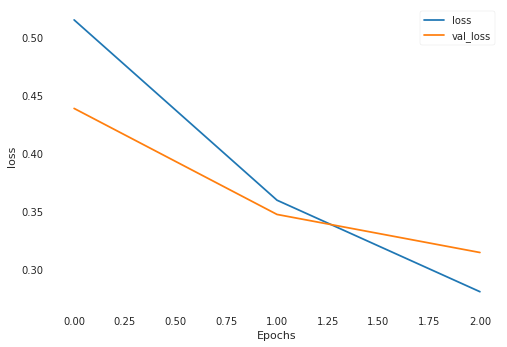

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.2340 - val_loss: 0.2285
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.2035 - val_loss: 0.2099
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.1857 - val_loss: 0.2198
loss cuts = tf.Tensor([0.7098493], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13893545, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1195097], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0013630828, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0655636], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.000289891, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82631755], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06567544, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9019077], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.032646008, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.00

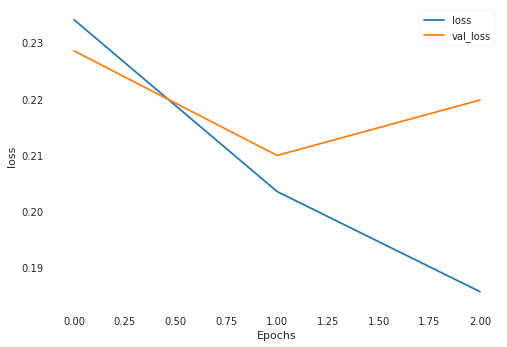

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.1734 - val_loss: 0.1437
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.1578 - val_loss: 0.1322
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.1456 - val_loss: 0.1314
loss cuts = tf.Tensor([0.71625245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1472622, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5971048], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2529036, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.687334], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17029324, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7606357], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11516816, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7382252], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13088101, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.85586244]

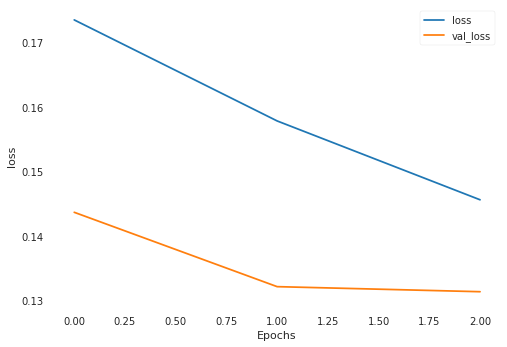

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.1387 - val_loss: 0.1707
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.1333 - val_loss: 0.1638
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.1391 - val_loss: 0.1976
loss cuts = tf.Tensor([0.46700042], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10063729, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5045433], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12586649, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5441413], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15553138, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5767816], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18234177, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.567814], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1747636, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7757443]

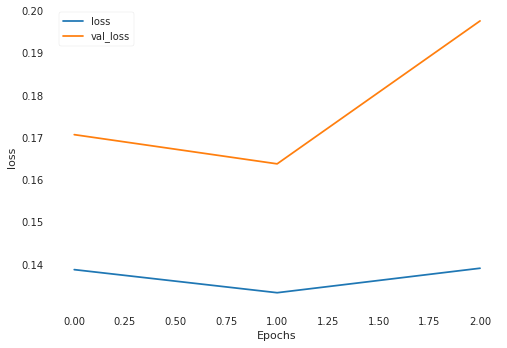

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.1318 - val_loss: 0.1379
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.1191 - val_loss: 0.1330
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.1180 - val_loss: 0.1579
loss cuts = tf.Tensor([0.49962127], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.041586578, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4728722], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.053211857, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5546338], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.022175781, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5610903], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.020294527, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5825143], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.014649438, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5

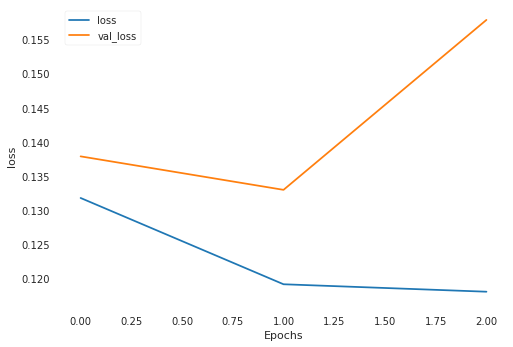

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.1238 - val_loss: 0.1243
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.1151 - val_loss: 0.1292
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.1097 - val_loss: 0.1265
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.42281452], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06156376, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.34143412], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.027802248, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.33016327], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024170674, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.38742554], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04525468, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.398122], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04992005, shape=(), dtype=float32)

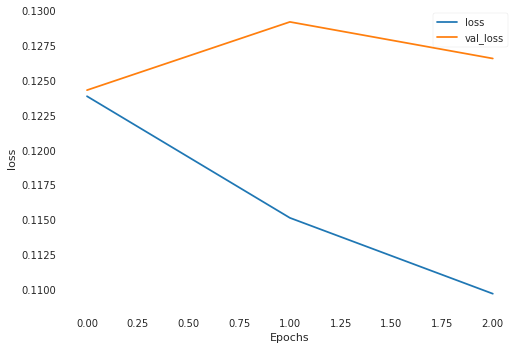

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.1054 - val_loss: 0.2235
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.1071 - val_loss: 0.2330
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.1031 - val_loss: 0.1871
loss cuts = tf.Tensor([0.59473455], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2967357, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.51297635], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2143471, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6417176], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35012972, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.62632793], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33215386, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6316039], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33826306, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.615941

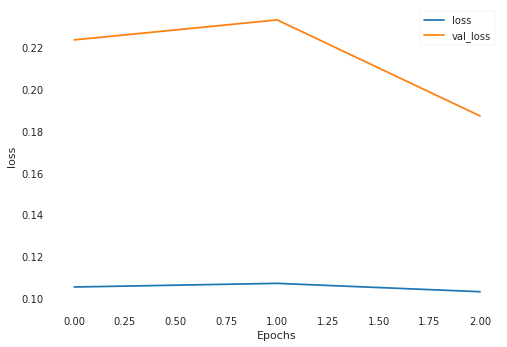

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.1015 - val_loss: 0.2411
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.1027 - val_loss: 0.2276
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0988 - val_loss: 0.2392
loss cuts = tf.Tensor([0.5288524], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.052373417, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7734486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22415355, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.61866295], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10154607, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83308375], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28417826, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5917349], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.085109234, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.621

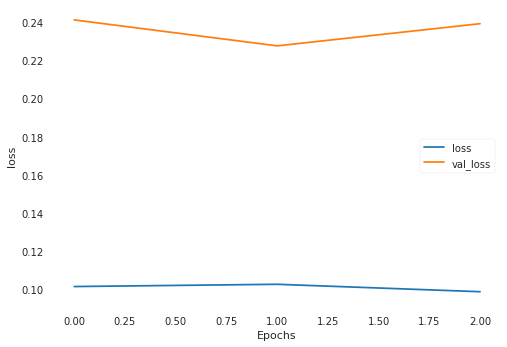

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.1005 - val_loss: 0.1615
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0966 - val_loss: 0.1209
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0932 - val_loss: 0.1365
loss cuts = tf.Tensor([1.575845], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8933682, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3220608], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.259362, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4211755], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4916413, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3771952], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3861469, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3733114], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3770168, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4675686], shap

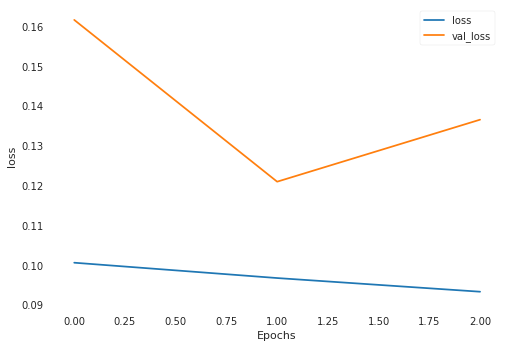

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0945 - val_loss: 0.1041
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0947 - val_loss: 0.1314
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0985 - val_loss: 0.1095
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2319978], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.110222585, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.244149], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11843853, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2489661], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.121777356, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3722255], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22299697, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2811822], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14529987, shape=(), dtype=float32)
los

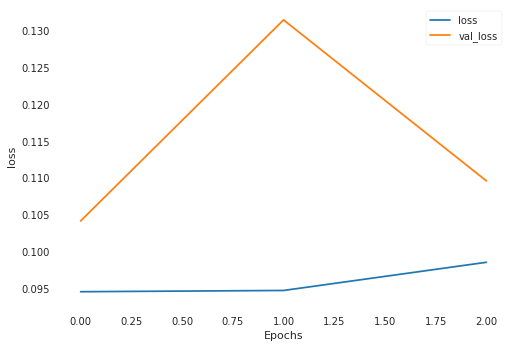

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0912 - val_loss: 0.1134
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0878 - val_loss: 0.1008
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0864 - val_loss: 0.1298
loss cuts = tf.Tensor([0.33347535], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.043700643, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.26910794], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.020932179, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.27899817], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.023891825, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2852067], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.025849676, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.28715953], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026481435, shape=(), dtype=float32)
loss cuts = tf.Tensor([

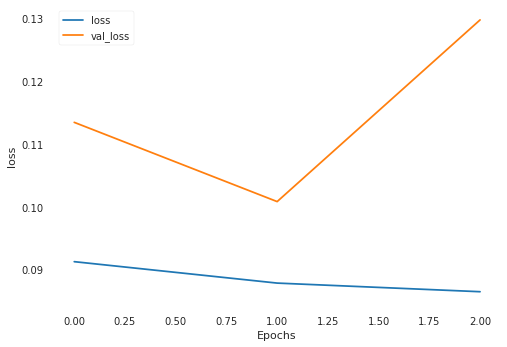

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0890 - val_loss: 0.1521
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0898 - val_loss: 0.1631
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0926 - val_loss: 0.1541
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8012636], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5593425, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.74335575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.707319, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7637429], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6544571, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7887718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5906963, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8294555], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4897288, shape=(), dtype=float32)
loss cuts

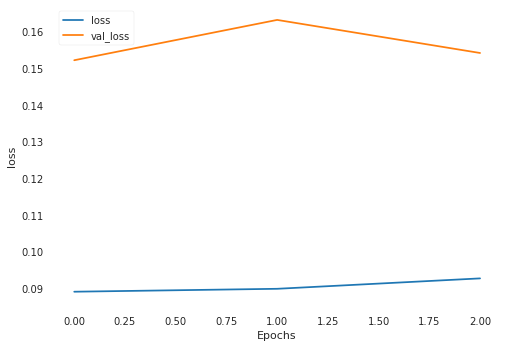

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0853 - val_loss: 0.1306
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0822 - val_loss: 0.1023
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0828 - val_loss: 0.1273
loss cuts = tf.Tensor([1.0635296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2878005, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.24318], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1273205, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.251642], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12135332, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2895153], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09640079, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2808523], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.101855256, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2909411], s

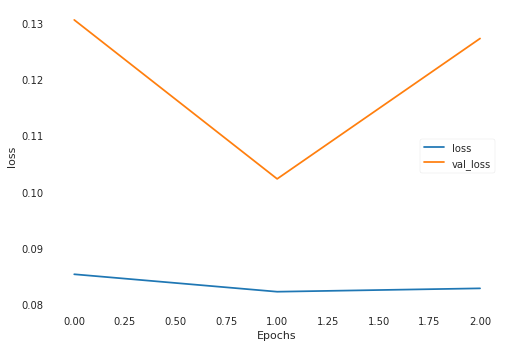

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0880 - val_loss: 0.1649
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0878 - val_loss: 0.1725
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0813 - val_loss: 0.1922
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.9062512], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5354131, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67618585], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25165665, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7158407], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29301518, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6823296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2578585, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68791246], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26355958, shape=(), dtype=float32)
loss

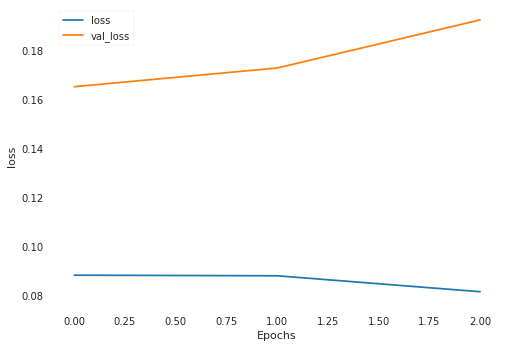

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0786 - val_loss: 0.1399
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0883 - val_loss: 0.1419
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0839 - val_loss: 0.1278
loss cuts = tf.Tensor([1.4556773], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9166061, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4325199], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8728009, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5120901], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0278071, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3410025], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.71017814, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.129167], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39801612, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1176178], s

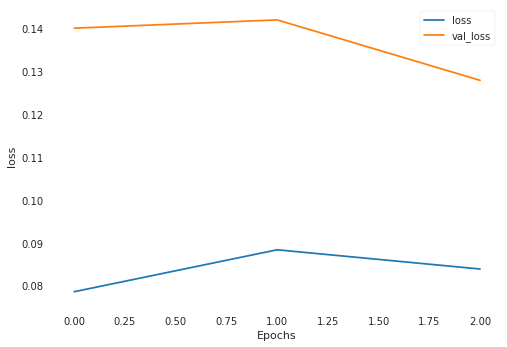

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0809 - val_loss: 0.1684
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0804 - val_loss: 0.1528
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0862 - val_loss: 0.1857
loss cuts = tf.Tensor([0.34084663], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.019848553, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.25543708], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0030775133, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.24793997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0023019114, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.27091268], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005034036, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.27591568], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005769002, shape=(), dtype=float32)
loss cuts = tf.Tenso

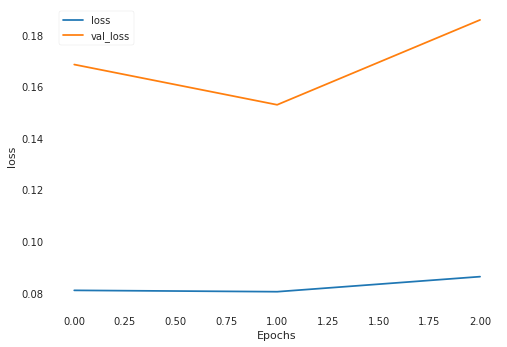

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0800 - val_loss: 0.1966
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0789 - val_loss: 0.1717
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0767 - val_loss: 0.1782
loss cuts = tf.Tensor([0.4794663], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005698393, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44469234], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012157631, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.43313083], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.014840883, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.43098196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015369064, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44373092], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0123705715, shape=(), dtype=float32)
loss cuts = tf.Tensor(

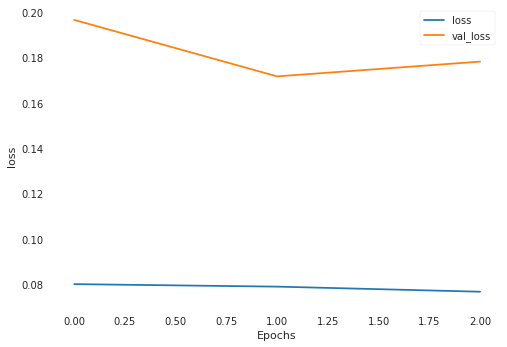

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0765 - val_loss: 0.1197
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0759 - val_loss: 0.1383
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0793 - val_loss: 0.1555
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.47961488], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.073108114, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4200751], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10885045, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4546741], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08721739, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.47140315], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07761621, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4610086], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.083516024, shape=(), dtype=float32)


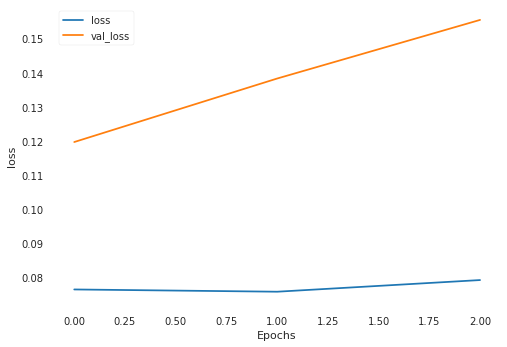

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0797 - val_loss: 0.0923
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0766 - val_loss: 0.0895
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0749 - val_loss: 0.0893
loss cuts = tf.Tensor([0.3185225], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3987638, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37982047], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32510468, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3761251], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32933238, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36045128], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34756768, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.40389207], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29823384, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.41462

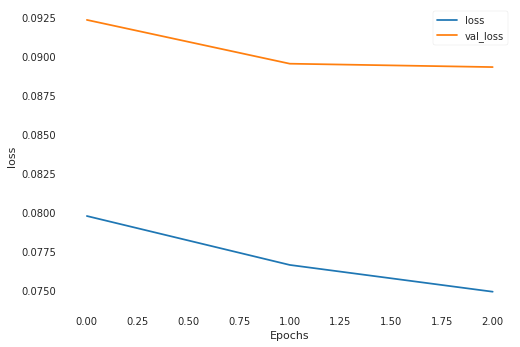

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0714 - val_loss: 0.0580
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0768 - val_loss: 0.0640
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0758 - val_loss: 0.0588
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.4159711], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5091476, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.51888365], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1937056, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7773249], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4949343, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83848655], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3491135, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87616867], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2629967, shape=(), dtype=float32)
loss c

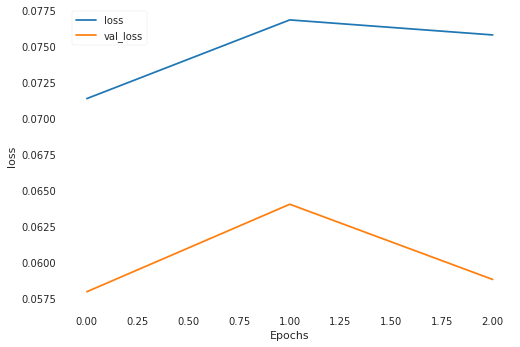

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 426us/sample - loss: 0.0713 - val_loss: 0.0905
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0713 - val_loss: 0.1079
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0730 - val_loss: 0.0781
loss cuts = tf.Tensor([1.2208277], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4904202, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2020841], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4450061, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2324326], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5188901, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1953017], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.428746, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0853122], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1779027, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0887419], sha

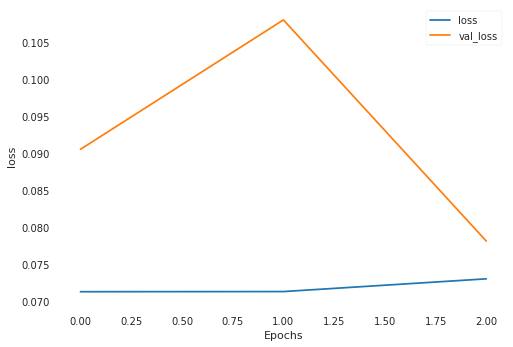

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0786 - val_loss: 0.0696
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0735 - val_loss: 0.0705
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0708 - val_loss: 0.0986
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.69582665], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7008681, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6867331], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7246699, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72289854], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6309882, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.81315464], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4086018, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8075517], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4219332, shape=(), dtype=float32)
loss c

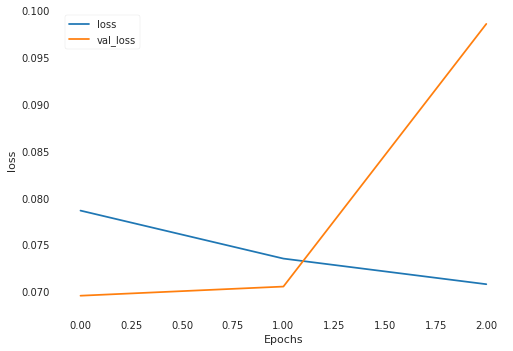

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0721 - val_loss: 0.0574
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0698 - val_loss: 0.0861
Epoch 3/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0668 - val_loss: 0.0533
loss cuts = tf.Tensor([1.2262468], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.497572, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1619506], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6590714, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1729449], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6308699, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1534107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.681144, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2078737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5428779, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.619023], shape

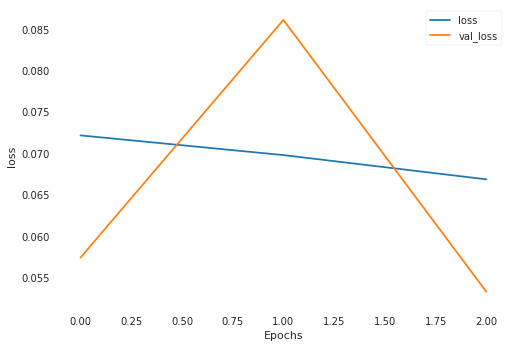

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0685 - val_loss: 0.1187
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0736 - val_loss: 0.0996
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0680 - val_loss: 0.1112
loss cuts = tf.Tensor([0.45326412], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.051890366, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5280931], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.091581024, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.50064975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.075724155, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5144819], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08352815, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4003157], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03057118, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39

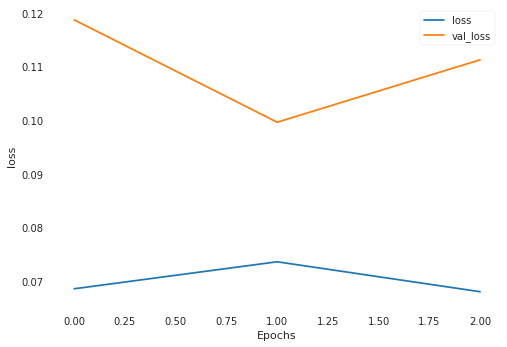

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0674 - val_loss: 0.1150
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0665 - val_loss: 0.1629
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0703 - val_loss: 0.1519
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.9695791], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00542773, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9116266], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00024713745, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91066253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00021775607, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8944503], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1189596e-06, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0408106], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.020997347, shape=(), dtype=fl

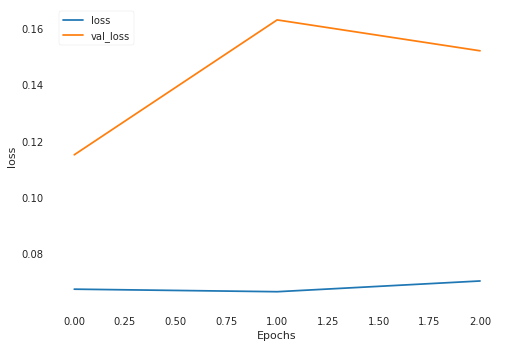

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0748 - val_loss: 0.0909
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0662 - val_loss: 0.0715
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0621 - val_loss: 0.0648
loss cuts = tf.Tensor([0.92775965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0449754, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8365759], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2397132, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8197444], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.277478, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80401474], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3132825, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.62625706], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7522955, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64353335],

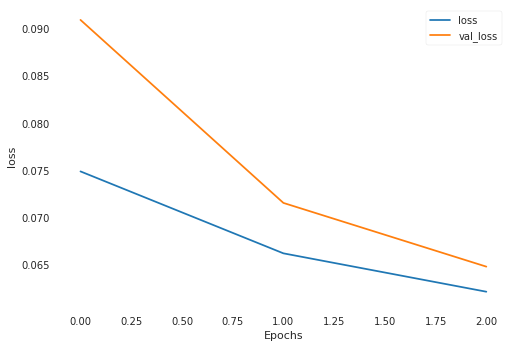

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0625 - val_loss: 0.0876
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0644 - val_loss: 0.0807
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0726 - val_loss: 0.0766
loss cuts = tf.Tensor([0.8615171], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23861559, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80439687], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2976828, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8751556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2254772, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.81587243], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2852923, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83067393], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2696996, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8347747]

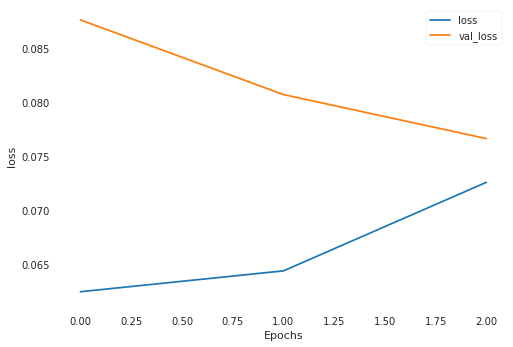

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0704 - val_loss: 0.0734
Epoch 2/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0619 - val_loss: 0.0745
Epoch 3/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0624 - val_loss: 0.0971
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0591793], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7817141, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3470325], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3735821, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4627732], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6582739, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4731524], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6851131, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5421383], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8689761, shape=(), dtype=float32)
loss cuts

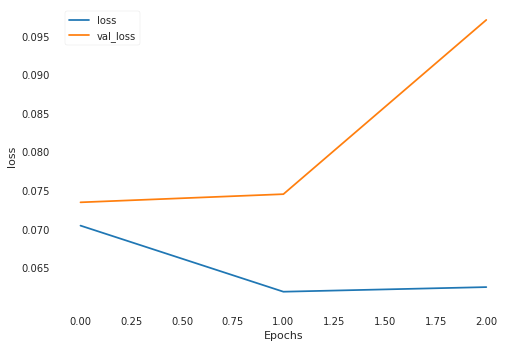

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0633 - val_loss: 0.0753
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0591 - val_loss: 0.0631
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0550 - val_loss: 0.0584
loss cuts = tf.Tensor([1.3229439], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.89589125, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2577183], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7766716, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0085303], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3995525, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1579789], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.61082083, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2733281], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.80442864, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5148689],

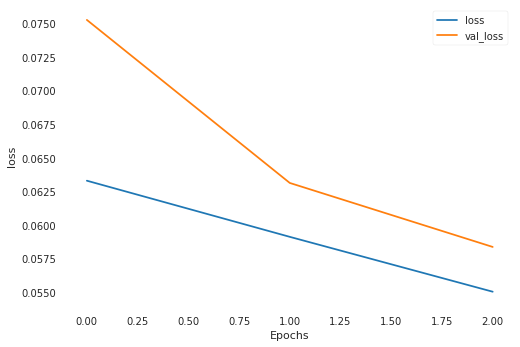

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0604 - val_loss: 0.0785
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0617 - val_loss: 0.0887
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0705 - val_loss: 0.0581
loss cuts = tf.Tensor([0.94030094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19386491, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9062398], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16503078, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.84888405], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.121720076, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8899], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15202203, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8202292], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10254672, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8102905

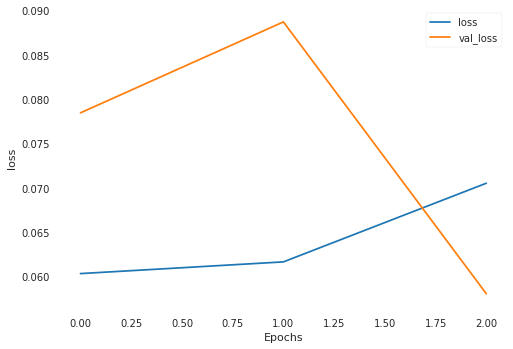

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0603 - val_loss: 0.0561
Epoch 2/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0555 - val_loss: 0.0552
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0579 - val_loss: 0.0708
loss cuts = tf.Tensor([1.3773428], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07434192, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3751422], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.075546786, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4058084], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.059629504, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3841225], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07069084, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.96955335], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4630076, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92164

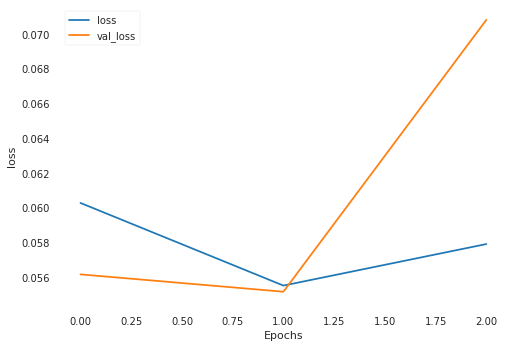

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0606 - val_loss: 0.0553
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0597 - val_loss: 0.0753
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0600 - val_loss: 0.0692
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6167071], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32137272, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7458102], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4844168, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6128023], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31696078, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6331153], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3402455, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64297885], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3518497, shape=(), dtype=float32)
loss c

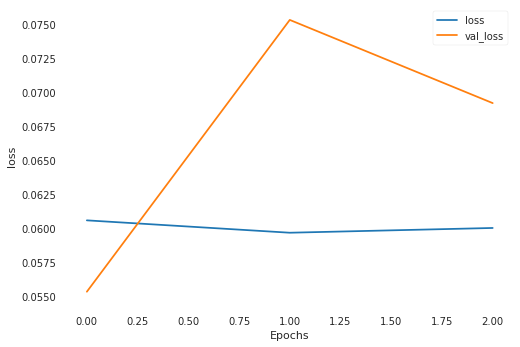

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0591 - val_loss: 0.0576
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0650 - val_loss: 0.0640
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0580 - val_loss: 0.0631
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.528644], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006184885, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44658917], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1633667e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39352334], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0031896122, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.378393], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0051275617, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.32237482], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.016288184, shape=(), dtype=flo

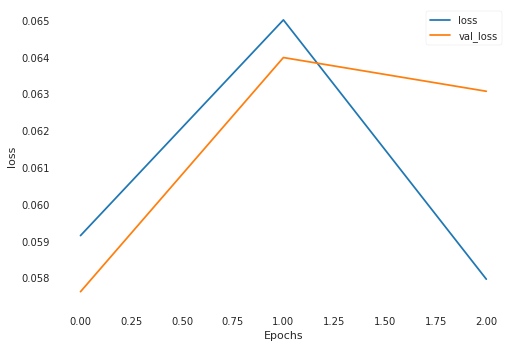

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0579 - val_loss: 0.0816
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0576 - val_loss: 0.0796
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0597 - val_loss: 0.0757
loss cuts = tf.Tensor([1.0707421], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7581919, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0447303], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7135693, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1985488], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9970997, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1855443], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9712975, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1684848], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.93796283, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1458557], s

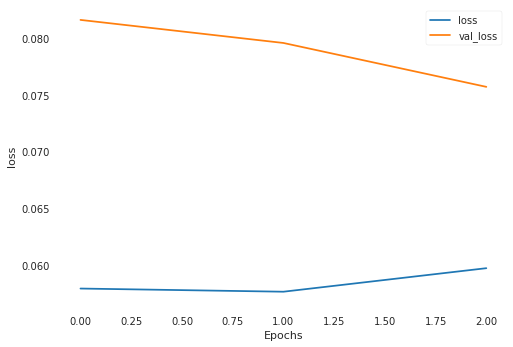

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0571 - val_loss: 0.0629
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0601 - val_loss: 0.0939
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0623 - val_loss: 0.0663
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0412362], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4778074, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0771624], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5287651, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2099404], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7394975, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.142816], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6285571, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.180873], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.69034994, shape=(), dtype=float32)
loss cuts 

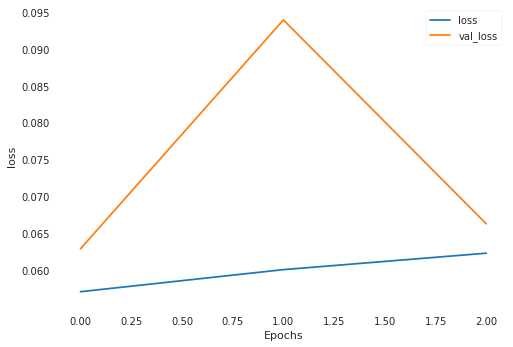

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0572 - val_loss: 0.0564
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0521 - val_loss: 0.0551
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0561 - val_loss: 0.0431
loss cuts = tf.Tensor([0.60950935], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.387406, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6452132], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2572558, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55647504], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.585437, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5562159], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5864184, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.50770175], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7725227, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44338173], 

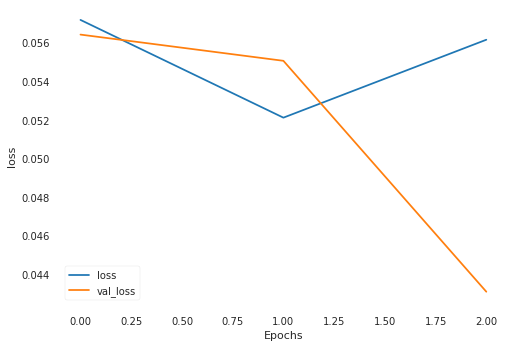

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0552 - val_loss: 0.0533
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0526 - val_loss: 0.0513
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0532 - val_loss: 0.0822
loss cuts = tf.Tensor([0.19528258], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.041909225, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.17299771], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05153004, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.12928279], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07328781, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.09933253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09040093, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.10039199], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08976497, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.1

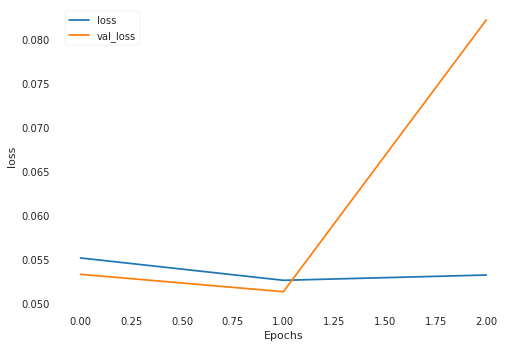

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0540 - val_loss: 0.0682
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0531 - val_loss: 0.0547
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0520 - val_loss: 0.0474
loss cuts = tf.Tensor([0.68662727], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08215519, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64402825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.059549782, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67514426], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07570436, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60903245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.043694563, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60376716], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04152105, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.

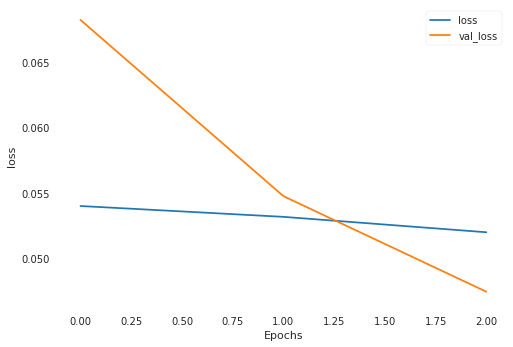

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0515 - val_loss: 0.1294
Epoch 2/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0501 - val_loss: 0.1046
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0481 - val_loss: 0.0900
loss cuts = tf.Tensor([1.293847], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.789573, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.329416], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.6196685, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1278558], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.6159263, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3996195], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.2917514, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4356158], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.127436, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3207047], shape=

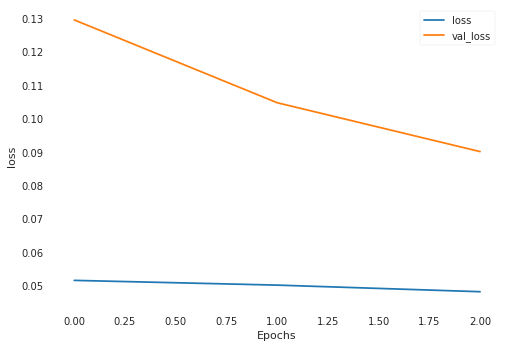

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0502 - val_loss: 0.0897
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0553 - val_loss: 0.0850
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0509 - val_loss: 0.0877
loss cuts = tf.Tensor([1.1038815], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.226042, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1456832], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.077628, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1032215], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.228413, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1128496], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.193907, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2579455], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6963432, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0959277], shape=

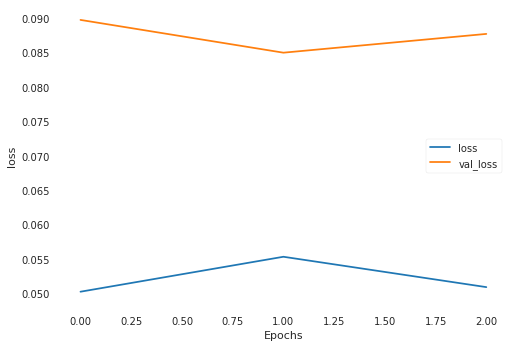

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0482 - val_loss: 0.1371
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0505 - val_loss: 0.1478
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0518 - val_loss: 0.1522
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.43180794], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14553832, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5071184], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2086711, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64057297], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3484067, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5718078], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2719567, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.556637], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25636387, shape=(), dtype=float32)
loss c

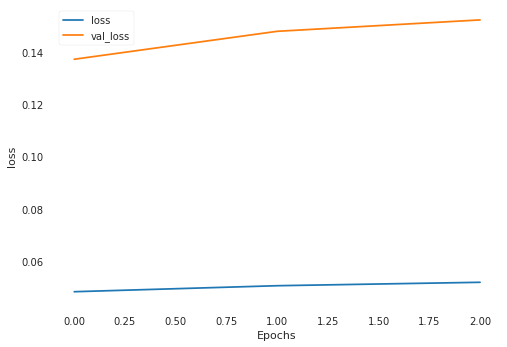

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0540 - val_loss: 0.0701
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0524 - val_loss: 0.1012
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0497 - val_loss: 0.0790
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4965016], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6233068, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6126411], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.194652, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.690809], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9213343, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6953336], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9058878, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7125833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8473754, shape=(), dtype=float32)
loss cuts =

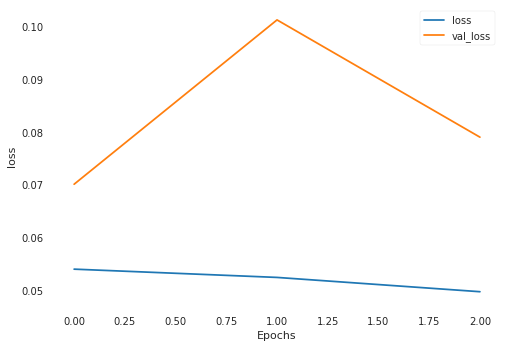

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0457 - val_loss: 0.0839
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0482 - val_loss: 0.0946
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0458 - val_loss: 0.0943
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0544622], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0026056224, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2478412], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05974326, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0731072], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0048567443, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1086326], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011070337, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1060467], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010532872, shape=(), dtype=float32

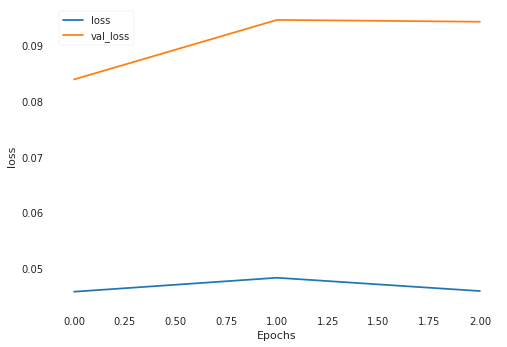

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0469 - val_loss: 0.0973
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0485 - val_loss: 0.0916
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0465 - val_loss: 0.0751
loss cuts = tf.Tensor([0.9076035], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25766134, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95204943], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30475855, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9547874], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30778906, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92005527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2704575, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91734254], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26764333, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95838

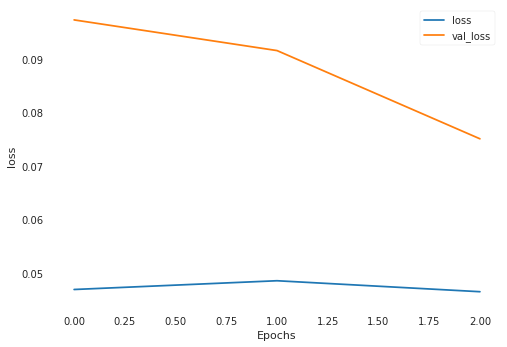

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0462 - val_loss: 0.1059
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0490 - val_loss: 0.1015
Epoch 3/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0509 - val_loss: 0.1078
loss cuts = tf.Tensor([2.0806153], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.921867, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9941865], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.587015, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.021445], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.69101, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9818939], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.540603, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.978998], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5297132, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9755673], shape=(1,

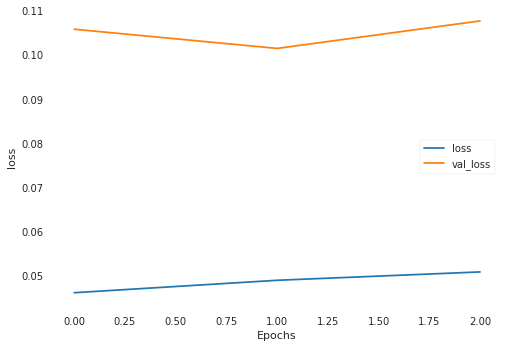

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0472 - val_loss: 0.0788
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0545 - val_loss: 0.0947
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0533 - val_loss: 0.0778
loss cuts = tf.Tensor([1.6049187], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3412986, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5885496], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.291473, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5756273], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2525172, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5652807], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2215672, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5635097], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.216291, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5641828], shap

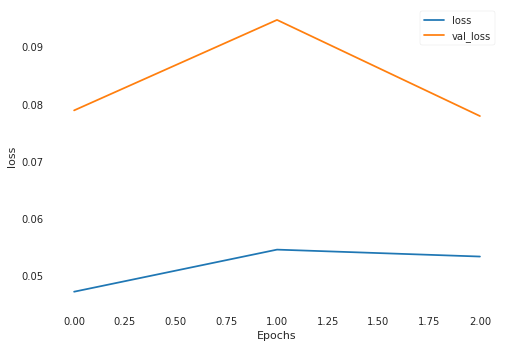

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 444us/sample - loss: 0.0482 - val_loss: 0.2604
Epoch 2/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0462 - val_loss: 0.2396
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0436 - val_loss: 0.1817
loss cuts = tf.Tensor([1.1752311], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.78290284, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1404641], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.84563655, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1147032], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.89367884, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.103373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.91522896, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1116097], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8995372, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1136637],

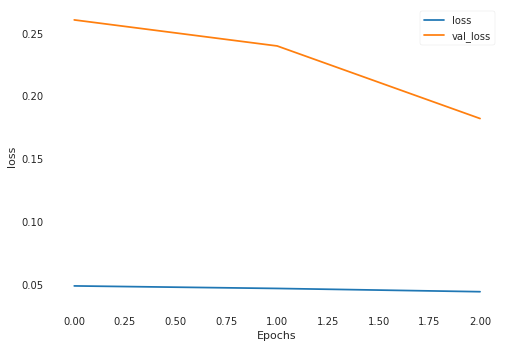

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.0474 - val_loss: 0.2101
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0473 - val_loss: 0.1886
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0436 - val_loss: 0.1748
loss cuts = tf.Tensor([0.8181744], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2685047, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.878862], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33508122, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99737954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4863382, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.017238], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.51443034, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99446833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48228624, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97231376]

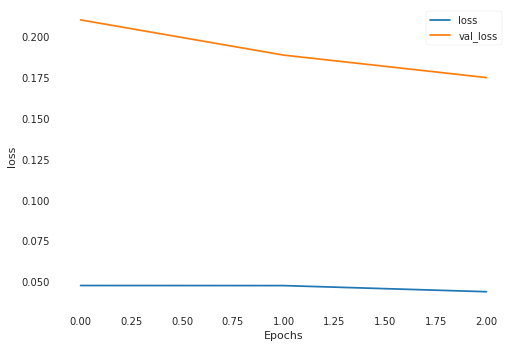

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0430 - val_loss: 0.1872
Epoch 2/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0456 - val_loss: 0.1436
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0444 - val_loss: 0.1431
loss cuts = tf.Tensor([1.0219766], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17150827, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.784757], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42426354, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76494527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.450465, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7879817], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42007312, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78089887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42930445, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78045785

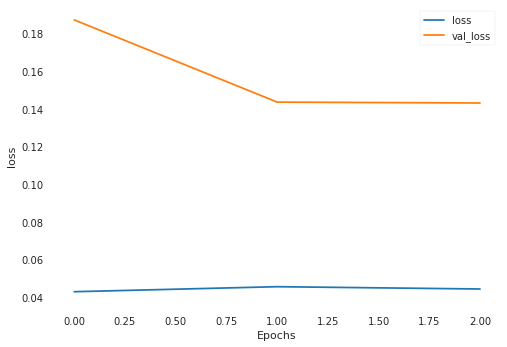

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0439 - val_loss: 0.0538
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0462 - val_loss: 0.0671
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0546 - val_loss: 0.0809
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.85077584], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.421492, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82170177], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4600885, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7741528], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.52685416, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7357459], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.58408433, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7298679], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.59310347, shape=(), dtype=float32)
loss 

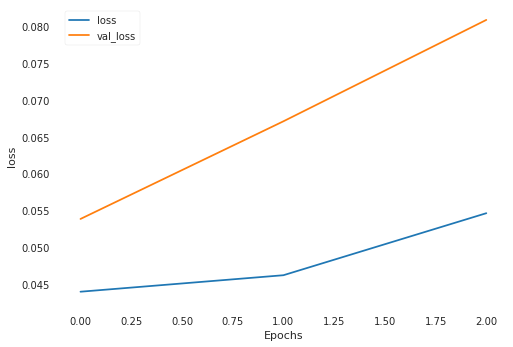

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0462 - val_loss: 0.1433
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0473 - val_loss: 0.1244
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0409 - val_loss: 0.1189
loss cuts = tf.Tensor([1.3106546], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9228573, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0730712], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.522832, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0911843], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5493541, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0834731], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.53798276, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.10386], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5683049, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.095625], shape

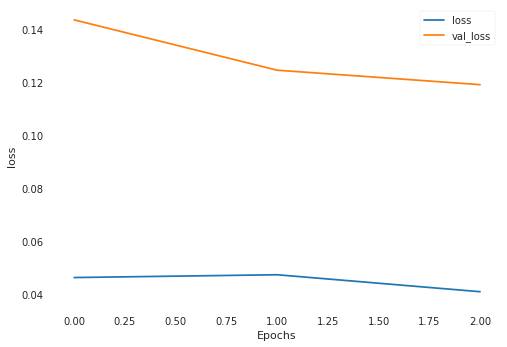

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0385 - val_loss: 0.0863
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0404 - val_loss: 0.1030
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0429 - val_loss: 0.0590
loss cuts = tf.Tensor([1.0912163], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23850334, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0700059], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21823622, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1203836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26784283, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1508144], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30026686, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1848159], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3386863, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1812028]

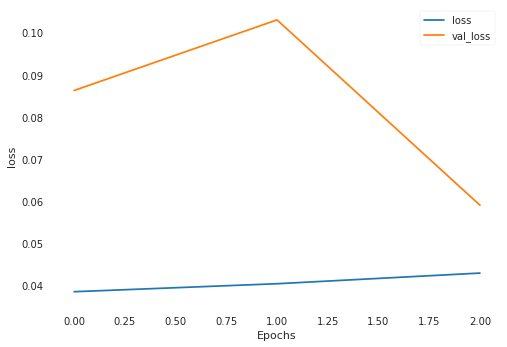

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0449 - val_loss: 0.2064
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0458 - val_loss: 0.1722
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0398 - val_loss: 0.1856
loss cuts = tf.Tensor([1.6116922], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09510014, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3955063], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00850032, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4170027], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012926234, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.29831], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4990417e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3108717], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.7193483e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.31

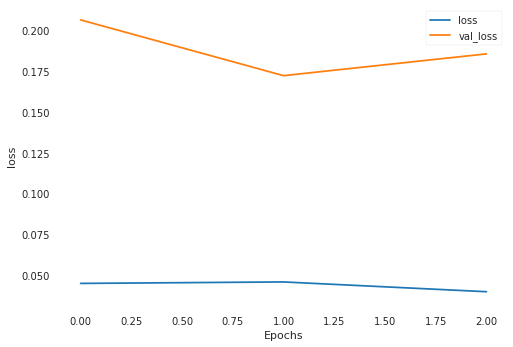

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0389 - val_loss: 0.0536
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0406 - val_loss: 0.0835
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0441 - val_loss: 0.0510
loss cuts = tf.Tensor([0.92933744], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18433064, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.162222], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.438538, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2783909], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.60589236, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2074053], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5004223, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1835021], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4671751, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0587432], s

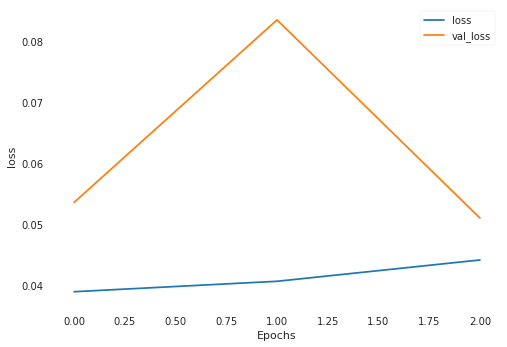

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 453us/sample - loss: 0.0454 - val_loss: 0.0682
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0488 - val_loss: 0.0701
Epoch 3/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0431 - val_loss: 0.0789
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5294671], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2206931, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.540678], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2455915, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5577557], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2840027, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5942066], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3679391, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5948106], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3693523, shape=(), dtype=float32)
loss cuts 

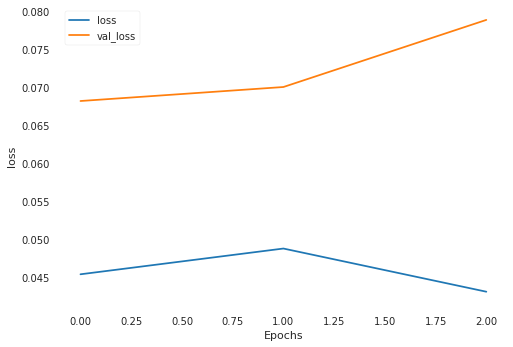

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0410 - val_loss: 0.0799
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0424 - val_loss: 0.0625
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0443 - val_loss: 0.1018
loss cuts = tf.Tensor([1.0038139], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72830254, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78237057], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3993774, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57644105], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18150462, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6025308], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20441549, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6051476], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2067886, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5984616

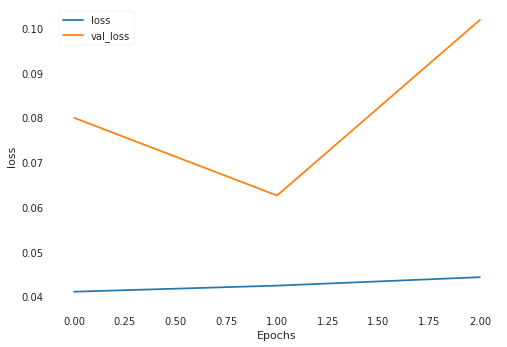

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0408 - val_loss: 0.0705
Epoch 2/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0457 - val_loss: 0.1066
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0460 - val_loss: 0.0644
loss cuts = tf.Tensor([0.7709224], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1841076, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8224149], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14257056, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71758956], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23271988, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67504144], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27558154, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66576374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28540844, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68622

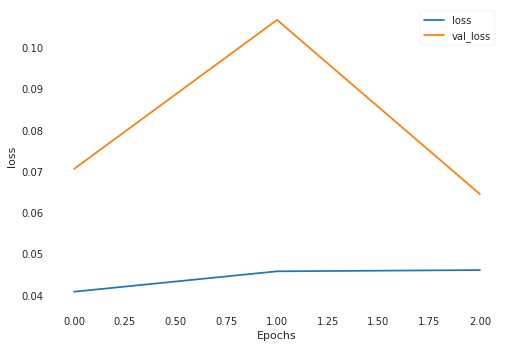

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0413 - val_loss: 0.0856
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0427 - val_loss: 0.1247
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0401 - val_loss: 0.1066
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4312929], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6104186, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2703595], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38484597, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3578866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5011034, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3505299], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49074218, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3647045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.51080257, shape=(), dtype=float32)
loss c

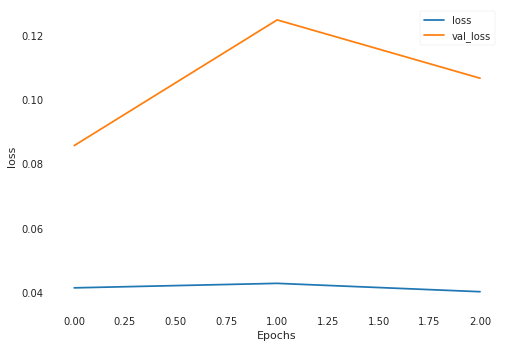

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0428 - val_loss: 0.1443
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0406 - val_loss: 0.1567
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0367 - val_loss: 0.1418
loss cuts = tf.Tensor([1.5318619], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07944613, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3353139], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0072784643, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3159107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00434422, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2853904], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0012524788, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2689826], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00036034096, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.

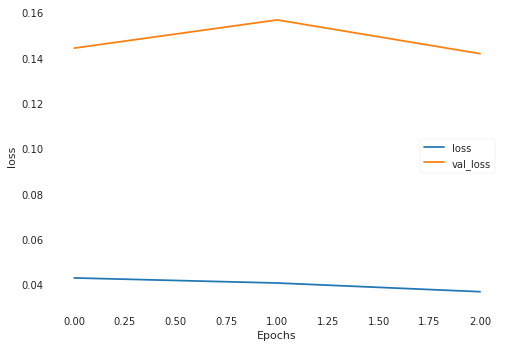

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0389 - val_loss: 0.0534
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0404 - val_loss: 0.0701
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0412 - val_loss: 0.0620
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2024213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0095215915, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1657717], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018017218, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1409894], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.025284348, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.156713], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.020531148, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2052586], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.008975922, shape=(), dtype=float32)

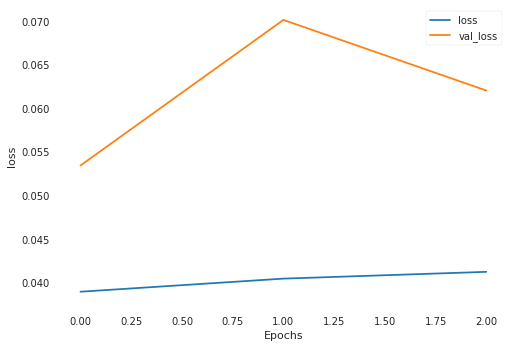

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0414 - val_loss: 0.0839
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0441 - val_loss: 0.0718
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0379 - val_loss: 0.0858
loss cuts = tf.Tensor([0.9365716], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0013374835, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9219812], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0004831749, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87510115], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0006199516, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8578763], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0017744041, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83740985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.003917523, shape=(), dtype=float32)
loss cuts = tf.Tensor

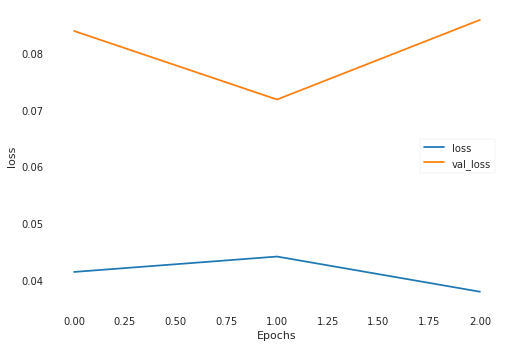

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0448 - val_loss: 0.0489
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0410 - val_loss: 0.0446
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0414 - val_loss: 0.0825
loss cuts = tf.Tensor([1.0413107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0034444404, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98324203], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013632428, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.00924], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.008237376, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1151009], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00022803526, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1180167], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00032460134, shape=(), dtype=float32)
loss cuts = tf.Tensor([

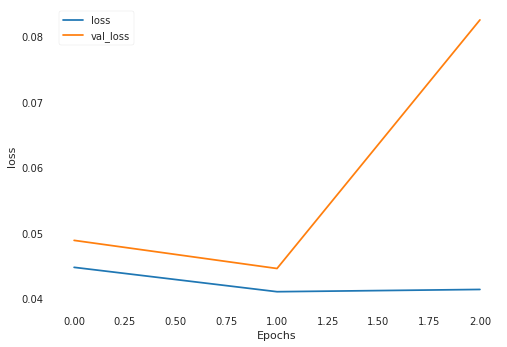

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0493 - val_loss: 0.0614
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0416 - val_loss: 0.0431
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0394 - val_loss: 0.0588
loss cuts = tf.Tensor([0.95680445], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.69182307, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0255246], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8108628, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0119448], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.78659046, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98924375], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.74683875, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98660326], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7422819, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.993348

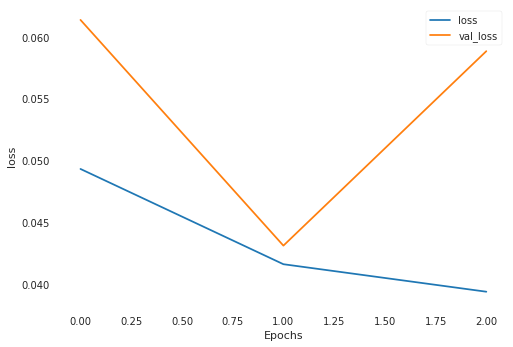

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0423 - val_loss: 0.0533
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0430 - val_loss: 0.0540
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0415 - val_loss: 0.0580
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.93793637], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3456692, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9855499], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4039237, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8839769], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28513134, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88644385], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28777197, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8676758], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26798818, shape=(), dtype=float32)
loss

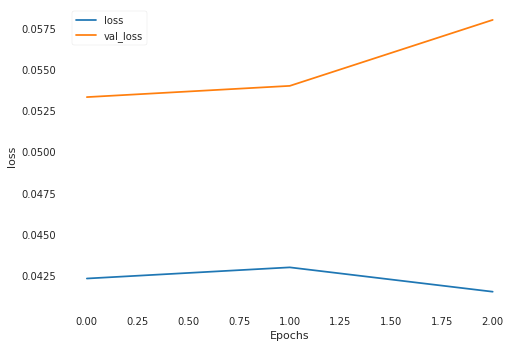

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0368 - val_loss: 0.1128
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0362 - val_loss: 0.1414
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0346 - val_loss: 0.1121
loss cuts = tf.Tensor([1.0145448], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.086064525, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1919684], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22164431, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1619291], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19426219, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2217221], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25054514, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3225305], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3616257, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3172379

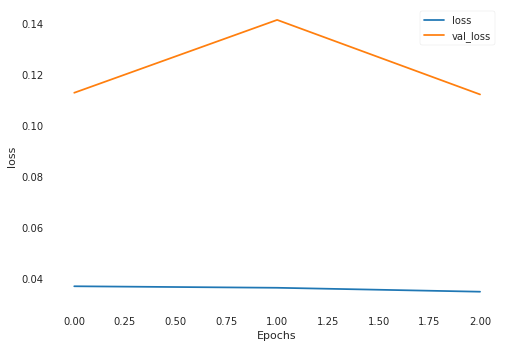

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0362 - val_loss: 0.0433
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0359 - val_loss: 0.0918
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0457 - val_loss: 0.0664
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.951359], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5645403, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8189603], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38311186, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8082925], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3700198, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78040606], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3368712, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64992243], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2024302, shape=(), dtype=float32)
loss cu

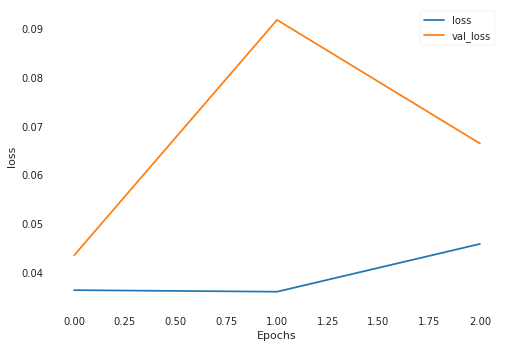

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0415 - val_loss: 0.0789
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0382 - val_loss: 0.0836
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0394 - val_loss: 0.0998
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.96306384], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02529925, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0849574], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.001381152, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0474308], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005578665, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0649478], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0032687944, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0802529], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.001752957, shape=(), dtype=float32

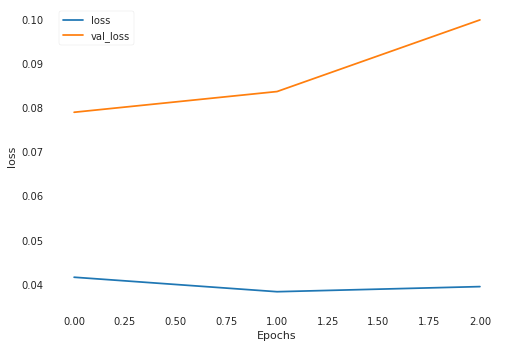

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0379 - val_loss: 0.0781
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0408 - val_loss: 0.0882
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0352 - val_loss: 0.0711
loss cuts = tf.Tensor([0.92410254], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015401439, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.872954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005322286, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82109517], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00044500563, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7671279], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0010805776, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82640016], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0006969679, shape=(), dtype=float32)
loss cuts = tf.Tensor

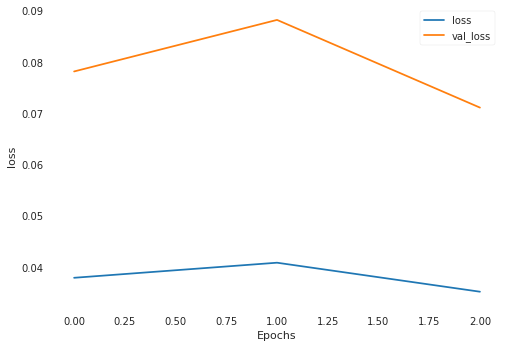

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0333 - val_loss: 0.0723
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0346 - val_loss: 0.0994
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0371 - val_loss: 0.0792
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.78568137], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19133887, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7914514], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19642006, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7167438], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13578153, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7166735], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1357297, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71506375], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13454618, shape=(), dtype=float32)
los

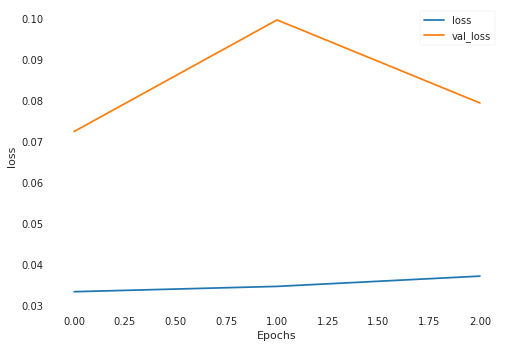

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0407 - val_loss: 0.1035
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0431 - val_loss: 0.0859
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0395 - val_loss: 0.1127
loss cuts = tf.Tensor([0.7176861], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.833644, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7670492], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7459397, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76508963], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7493284, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8272341], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.64560115, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7777462], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72757655, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7856551], 

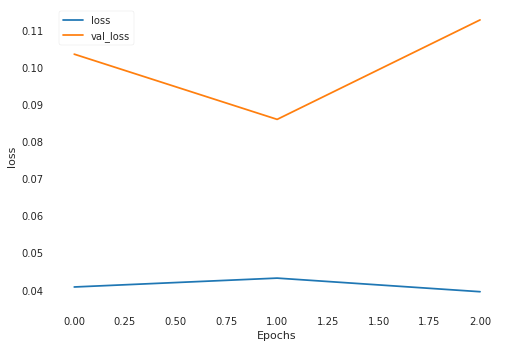

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0400 - val_loss: 0.0474
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0446 - val_loss: 0.0548
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0358 - val_loss: 0.0307
loss cuts = tf.Tensor([0.8641695], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23779774, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92227757], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29784653, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.949929], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32879284, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92343223], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29910818, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9232357], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29889327, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.909666

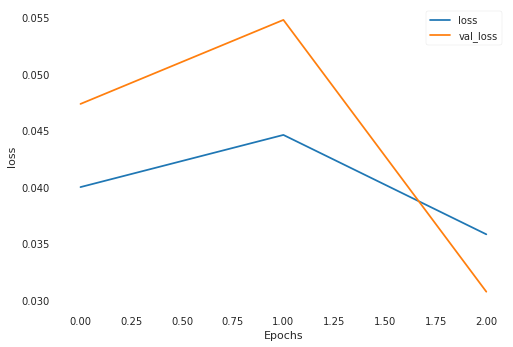

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0342 - val_loss: 0.0348
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0329 - val_loss: 0.0318
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0332 - val_loss: 0.0420
loss cuts = tf.Tensor([0.8910423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5760168, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88282585], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5885561, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8570423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62878186, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8786461], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.59498686, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8652444], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6158413, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.85877943]

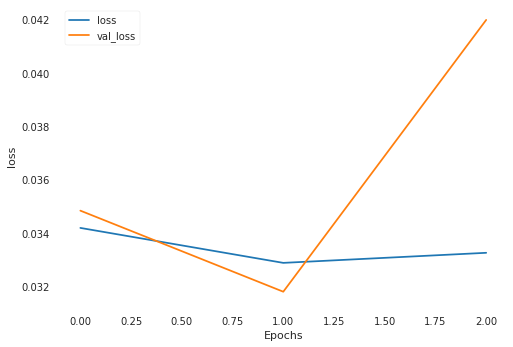

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0389 - val_loss: 0.0820
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0421 - val_loss: 0.0861
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0405 - val_loss: 0.0726
loss cuts = tf.Tensor([2.018068], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.663202, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9390442], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9273698, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9858092], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7695312, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7624302], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.56292, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7866398], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.4721115, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9935105], shape=

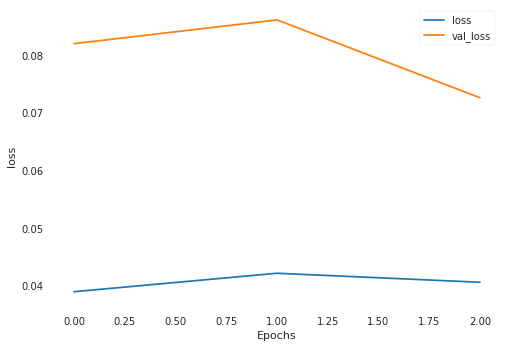

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0346 - val_loss: 0.1415
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0335 - val_loss: 0.1633
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0379 - val_loss: 0.1745
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8585841], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0014524279, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.833396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0040067406, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82901746], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0045802277, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8520018], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.001997469, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.86436814], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0010450154, shape=(), dtype=flo

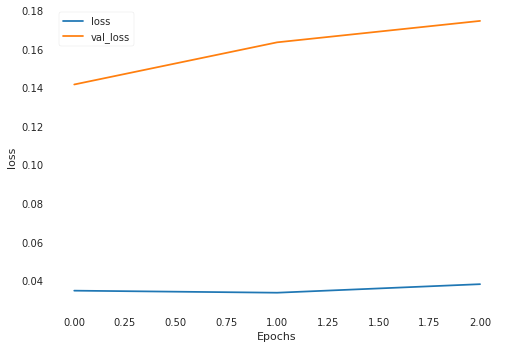

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0384 - val_loss: 0.0794
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0347 - val_loss: 0.0874
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0350 - val_loss: 0.0730
loss cuts = tf.Tensor([1.6058862], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.573539, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6637685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.2187, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8297944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.4976683, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.7449458], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9121282, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.5738153], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2682915, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.3512316], shape=

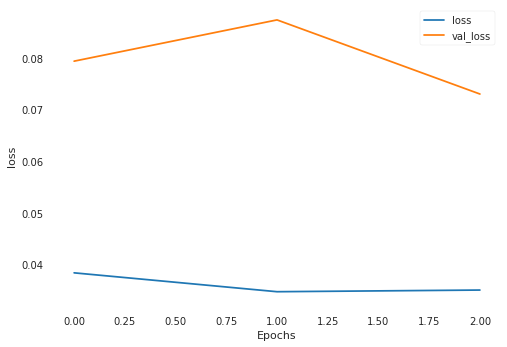

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0340 - val_loss: 0.0920
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0337 - val_loss: 0.0870
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0363 - val_loss: 0.0983
loss cuts = tf.Tensor([1.4795775], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1654878, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5055536], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2222488, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3216498], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.84943837, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3688283], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9386283, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3492577], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.90109026, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3950093], 

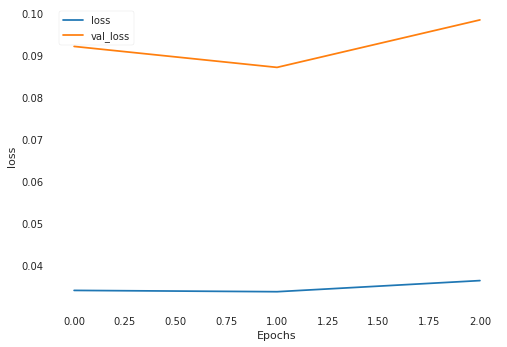

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0396 - val_loss: 0.1579
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0379 - val_loss: 0.1628
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0352 - val_loss: 0.1707
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2106096], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3764482, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.271291], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3056678, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2575449], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32105646, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2592258], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31915435, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2675719], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30979398, shape=(), dtype=float32)
loss cu

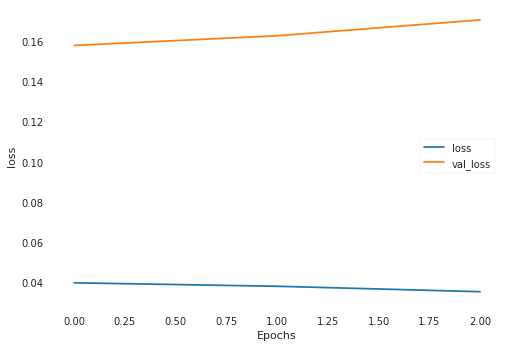

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.0341 - val_loss: 0.1332
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0369 - val_loss: 0.1376
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0348 - val_loss: 0.1465
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3902932], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7963861, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3316965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6427461, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4288379], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9011941, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4090676], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.847065, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4836907], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0554693, shape=(), dtype=float32)
loss cuts 

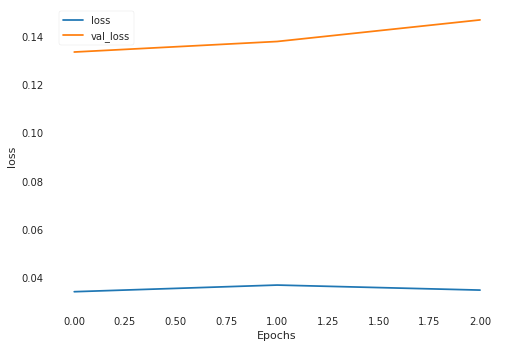

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0395 - val_loss: 0.0921
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0394 - val_loss: 0.0979
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0317 - val_loss: 0.1042
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.3302307], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.3273597, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0967216], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.4103808, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9995582], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0609539, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0288787], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1644094, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0499966], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2399879, shape=(), dtype=float32)
loss cuts

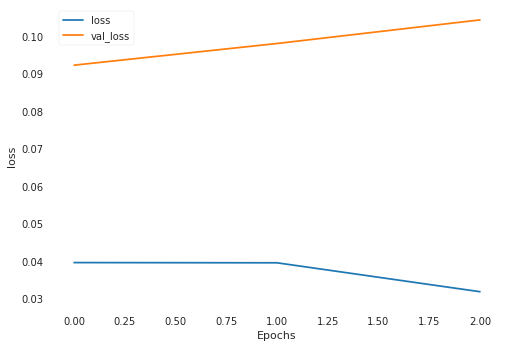

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0311 - val_loss: 0.0318
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0325 - val_loss: 0.0547
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0375 - val_loss: 0.0423
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1531258], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.56719846, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1338491], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5385346, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0339925], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40194654, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1238099], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.52390087, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1575602], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.57389754, shape=(), dtype=float32)
loss 

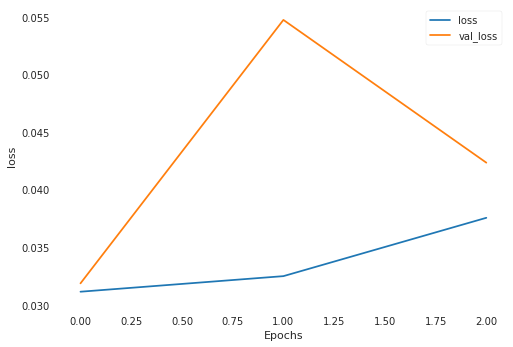

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0362 - val_loss: 0.0787
Epoch 2/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0311 - val_loss: 0.0810
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0325 - val_loss: 0.0780
loss cuts = tf.Tensor([1.3995351], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5216389, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4411759], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5835227, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4208425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5528713, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4308999], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5679288, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4759436], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.63784856, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4531244], s

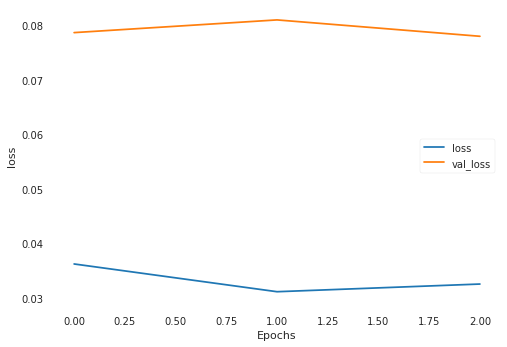

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0397 - val_loss: 0.1203
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0370 - val_loss: 0.1230
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0365 - val_loss: 0.2924
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1413201], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.046918582, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2727588], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0072536296, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1860324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.029547777, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1545602], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.041358087, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1633583], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.037857, shape=(), dtype=float32)
l

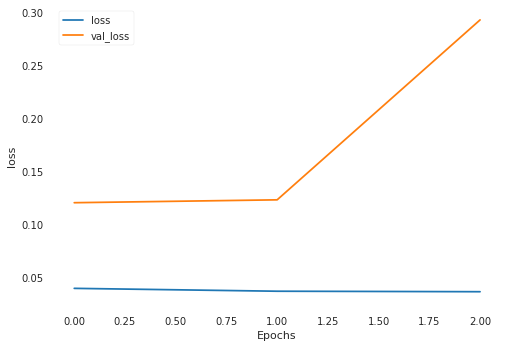

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0542 - val_loss: 0.1689
Epoch 2/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0400 - val_loss: 0.1493
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0320 - val_loss: 0.1367
loss cuts = tf.Tensor([0.41787338], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07175615, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3466132], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03865675, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.31468308], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.027120516, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.30401617], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02372098, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3109526], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02590574, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.315

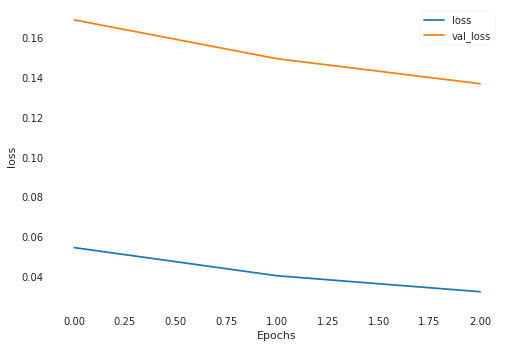

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0323 - val_loss: 0.4150
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0319 - val_loss: 0.4007
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0321 - val_loss: 0.3773
loss cuts = tf.Tensor([0.87705135], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.60380876, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7774503], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4589389, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8191464], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5171715, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83757246], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5440131, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8410954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.54922235, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8094198]

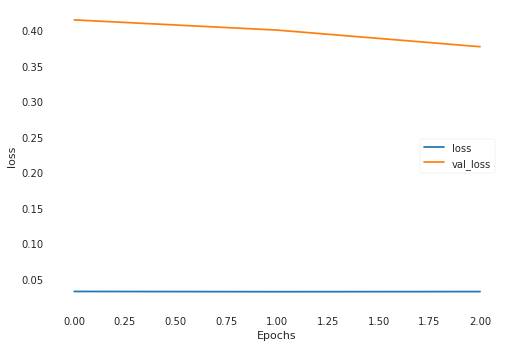

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0365 - val_loss: 0.0968
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0384 - val_loss: 0.0892
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0346 - val_loss: 0.0620
loss cuts = tf.Tensor([0.96641636], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.8689375, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0054681], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.55933, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97452486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.8044, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94627404], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.029821, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9439048], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.048796, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93908006], 

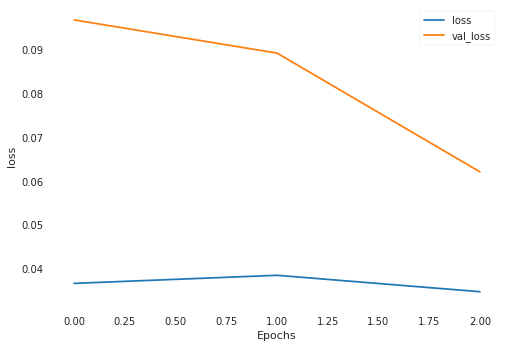

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0345 - val_loss: 0.0339
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0334 - val_loss: 0.0440
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0331 - val_loss: 0.0491
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.69659775], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15948008, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.86764944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3253576, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83148456], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2854085, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80371034], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2565039, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8502859], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3058507, shape=(), dtype=float32)
loss

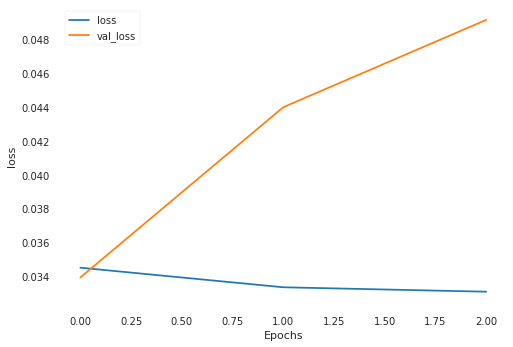

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0335 - val_loss: 0.0733
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0343 - val_loss: 0.0361
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0338 - val_loss: 0.0483
loss cuts = tf.Tensor([1.1991111], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.324545, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1544145], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4294244, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0959568], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5726241, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0756989], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6238432, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1261754], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4977465, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2166816], sha

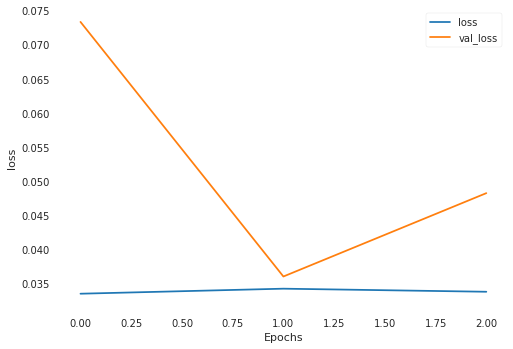

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0345 - val_loss: 0.1263
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0339 - val_loss: 0.1233
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0314 - val_loss: 0.1376
loss cuts = tf.Tensor([1.3494961], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8917134, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4911156], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4301205, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4994035], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4043493, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4845109], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.450756, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4542855], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5463047, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5254253], sha

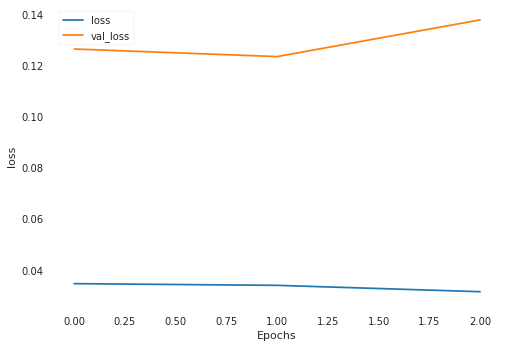

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0312 - val_loss: 0.0732
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0798 - val_loss: 0.1325
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0601 - val_loss: 0.0766
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.7217844], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7641567, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4304043], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.62309, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2303206], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.311233, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2950051], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.080007, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2984135], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0680552, shape=(), dtype=float32)
loss cuts = t

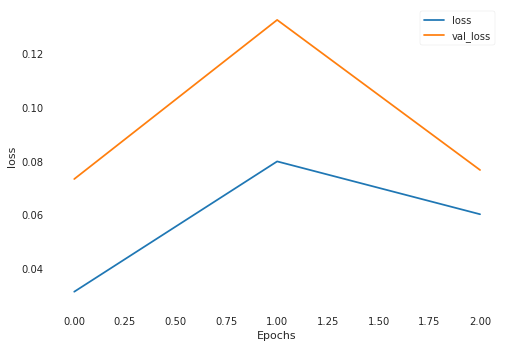

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0406 - val_loss: 0.1047
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0337 - val_loss: 0.0961
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0328 - val_loss: 0.1232
loss cuts = tf.Tensor([1.0122567], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8788576, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7502357], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45623678, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.69635546], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38635275, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73920554], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44145775, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66879654], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35285246, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71362

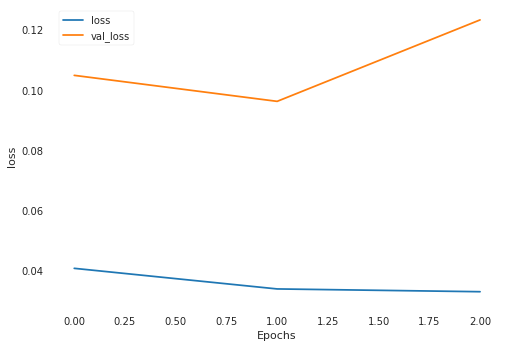

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 434us/sample - loss: 0.0336 - val_loss: 0.0304
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0332 - val_loss: 0.0455
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0306 - val_loss: 0.0317
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.53125226], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.054884195, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58995456], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.085834965, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88146454], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3416239, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8959527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35877013, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8715825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3301698, shape=(), dtype=float32)
l

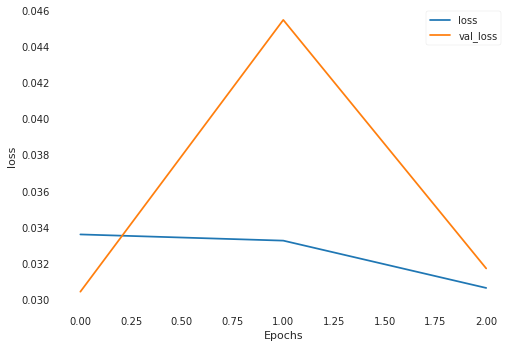

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0336 - val_loss: 0.0615
Epoch 2/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0326 - val_loss: 0.0685
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0315 - val_loss: 0.0677
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6576831], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0356684, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63360125], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.120165, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4676895], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7338243, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4603117], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7623913, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4562927], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7779987, shape=(), dtype=float32)
loss cuts

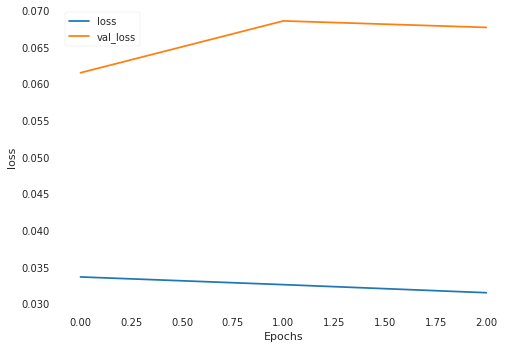

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0295 - val_loss: 0.0638
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0314 - val_loss: 0.0696
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0327 - val_loss: 0.0637
loss cuts = tf.Tensor([1.0932446], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012748123, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.893257], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0075829164, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98128235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.937609e-07, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.021447], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0016900303, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0225571], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0017825431, shape=(), dtype=float32)
loss cuts = tf.Tensor([1

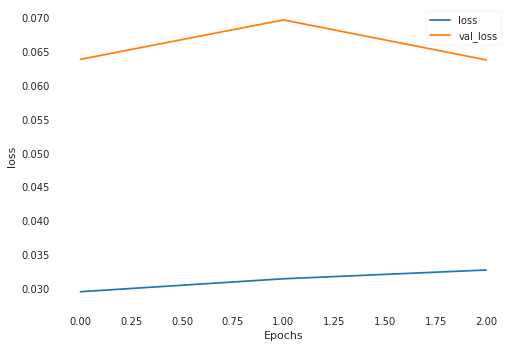

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0340 - val_loss: 0.1961
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0301 - val_loss: 0.1506
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0300 - val_loss: 0.1546
loss cuts = tf.Tensor([0.87136835], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29383004, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60900635], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6470962, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7358855], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45906556, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7364998], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4582335, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6321838], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.61034447, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6174568

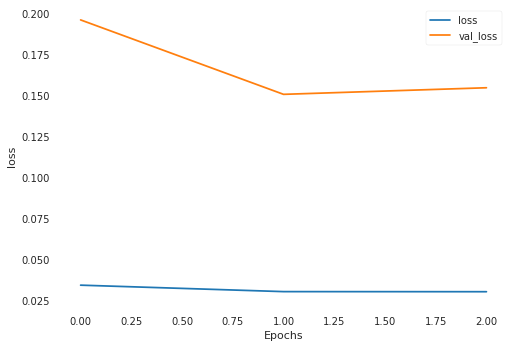

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0305 - val_loss: 0.0538
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0321 - val_loss: 0.0423
Epoch 3/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0308 - val_loss: 0.0360
loss cuts = tf.Tensor([1.5208635], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45005783, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5076811], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43254444, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5867078], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5427384, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.567658], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5150329, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5577579], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50092113, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5471859], 

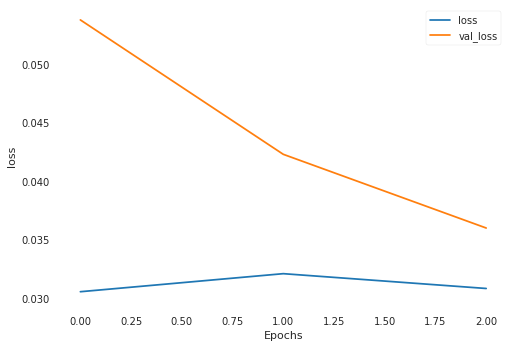

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0313 - val_loss: 0.1307
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0322 - val_loss: 0.1120
Epoch 3/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0305 - val_loss: 0.1441
loss cuts = tf.Tensor([1.4109015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6900766, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1716095], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1449012, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3262409], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8379007, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3041753], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.878784, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3233867], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.84313416, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.367691], sha

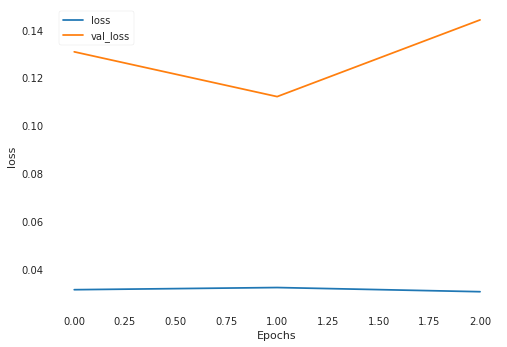

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0329 - val_loss: 0.2799
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0319 - val_loss: 0.2964
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0313 - val_loss: 0.2520
loss cuts = tf.Tensor([1.2270963], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.344255, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.248578], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2789354, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3483717], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.987594, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2762895], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.196036, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2682726], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2198606, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3103023], shape=

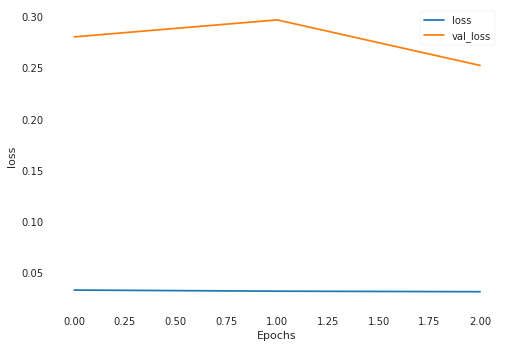

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0321 - val_loss: 0.1087
Epoch 2/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0388 - val_loss: 0.0614
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0358 - val_loss: 0.0388
loss cuts = tf.Tensor([0.43527305], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.836731, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.49468842], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.297832, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46822372], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.536997, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4918189], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.323696, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48324737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.401054, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5659538]

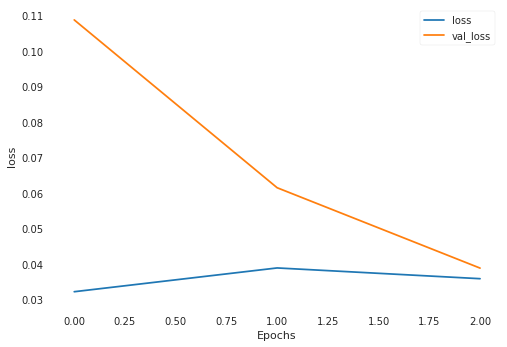

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0300 - val_loss: 0.1082
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0299 - val_loss: 0.1079
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0297 - val_loss: 0.1052
loss cuts = tf.Tensor([0.7838448], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5096712, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7761153], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5207674, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5642912], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8713592, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4961221], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0032732, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48863995], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.018318, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63974077], s

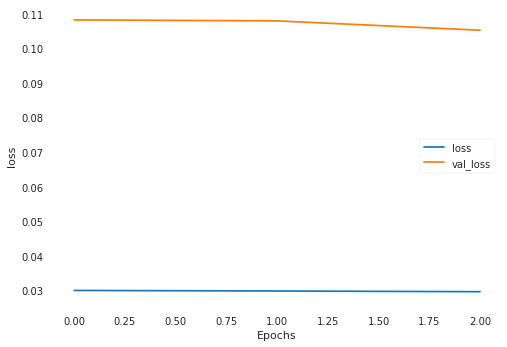

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0313 - val_loss: 0.1664
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0388 - val_loss: 0.1514
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0365 - val_loss: 0.1471
loss cuts = tf.Tensor([0.97819173], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012365567, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2666095], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15969485, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3105935], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19678302, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4131551], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29829502, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4058684], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2903887, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.601498

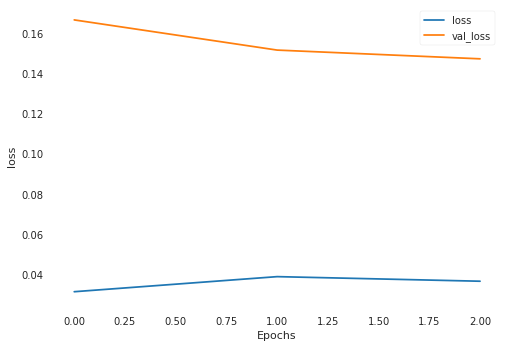

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.0330 - val_loss: 0.1144
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0299 - val_loss: 0.0724
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0320 - val_loss: 0.0840
loss cuts = tf.Tensor([3.201935], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03922976, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8132172], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34431422, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6145139], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6169886, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.583127], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6672816, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3928616], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0143279, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3637857], sh

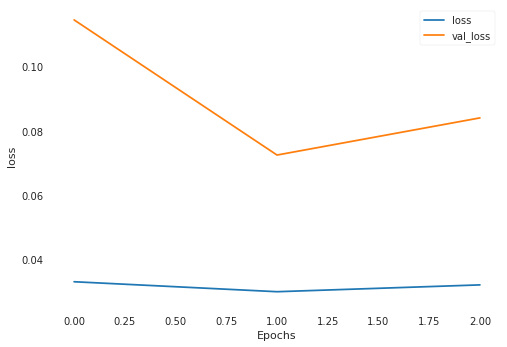

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0291 - val_loss: 0.0814
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0268 - val_loss: 0.0636
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0292 - val_loss: 0.0824
loss cuts = tf.Tensor([1.2281287], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1623615, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2201087], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1451328, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2125434], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1289985, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2484782], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2066543, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2305708], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1676333, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2248529], sh

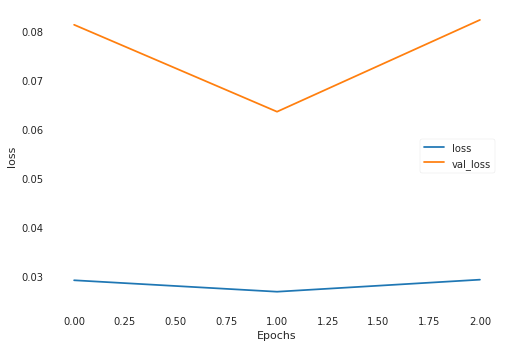

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0302 - val_loss: 0.1132
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0328 - val_loss: 0.0665
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0313 - val_loss: 0.0811
loss cuts = tf.Tensor([1.2681543], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9094979, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.534457], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2444365, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.622869], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0549983, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6139884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0733203, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6617985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9765424, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6617228], shap

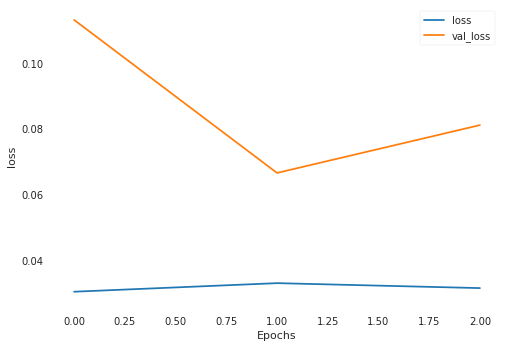

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0316 - val_loss: 0.0999
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0313 - val_loss: 0.0931
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0314 - val_loss: 0.0776
loss cuts = tf.Tensor([0.6788621], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24306783, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7562765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17272727, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72294956], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2015396, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7243272], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20030458, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65450513], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.267678, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6706959]

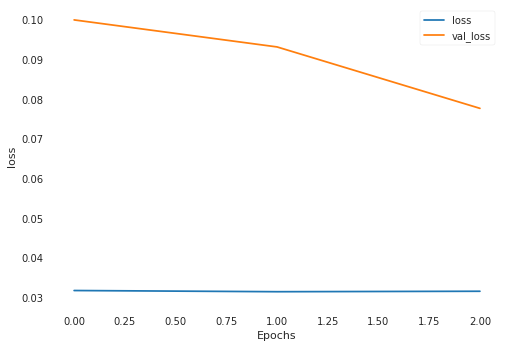

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0330 - val_loss: 0.0445
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0302 - val_loss: 0.0397
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0280 - val_loss: 0.0340
loss cuts = tf.Tensor([1.1134692], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.182835, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78403425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.9296627, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60240376], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.985583, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55164105], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.292492, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53936905], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.367461, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.50317836], s

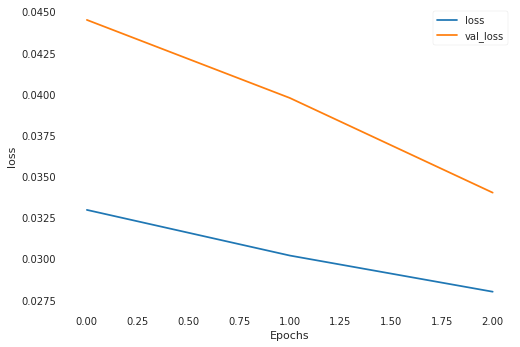

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0323 - val_loss: 0.1102
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0322 - val_loss: 0.2229
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0348 - val_loss: 0.1419
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0913526], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23981014, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1599263], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17735083, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2496979], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10979865, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3016461], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07807028, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.286577], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08671831, shape=(), dtype=float32)
loss 

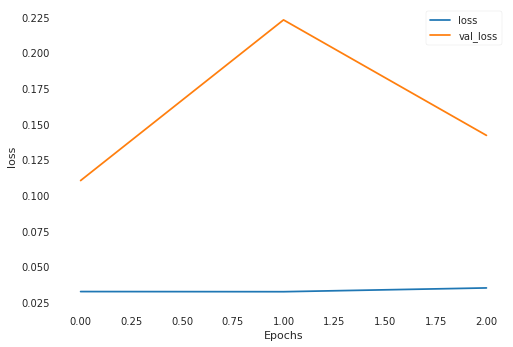

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0349 - val_loss: 0.0915
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0372 - val_loss: 0.0608
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0327 - val_loss: 0.4044
loss cuts = tf.Tensor([1.0427811], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03716455, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0742759], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05029965, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9044255], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0029621327, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68145967], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.028405853, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6807417], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02864837, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.681

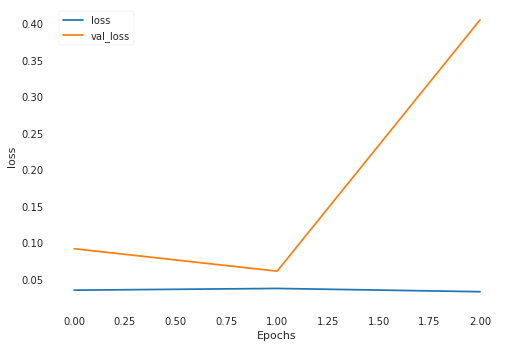

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0377 - val_loss: 0.0435
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0346 - val_loss: 0.0478
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0277 - val_loss: 0.0492
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4567364], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50987846, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3795521], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40560776, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3277438], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34230113, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3283505], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3430115, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3161459], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32886463, shape=(), dtype=float32)
loss 

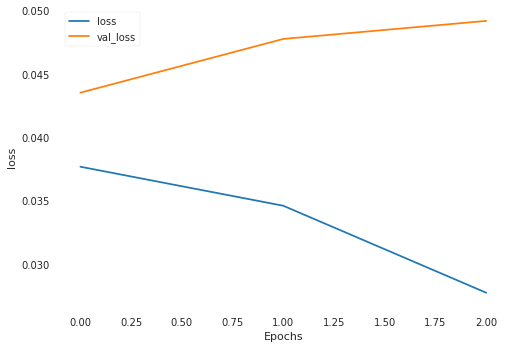

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0275 - val_loss: 0.0400
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0296 - val_loss: 0.0368
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0297 - val_loss: 0.0444
loss cuts = tf.Tensor([0.7346734], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.325421, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.851478], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.552894, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8318884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.6805525, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.84218204], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.613377, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.861583], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.487344, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8688709], sh

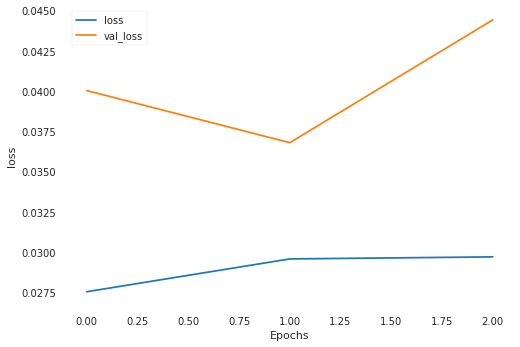

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0322 - val_loss: 0.1268
Epoch 2/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0339 - val_loss: 0.1095
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0306 - val_loss: 0.1551
loss cuts = tf.Tensor([0.54820293], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.022971736, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5365989], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026623897, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68918216], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0001120437, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7419601], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0017802388, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7486821], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0023926625, shape=(), dtype=float32)
loss cuts = tf.Tensor(

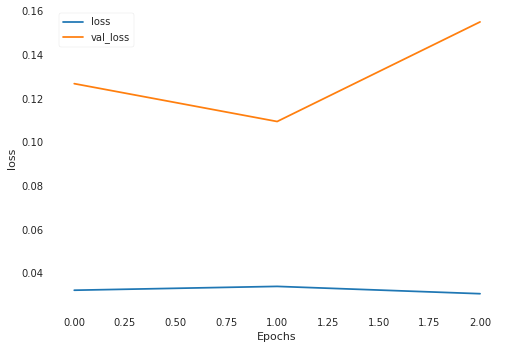

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0300 - val_loss: 0.0711
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0287 - val_loss: 0.0714
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0268 - val_loss: 0.0393
loss cuts = tf.Tensor([2.9953265], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.087217726, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.538315], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026142037, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5105271], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.035899986, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7582041], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8869796, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6629221], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.001374771, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.67632

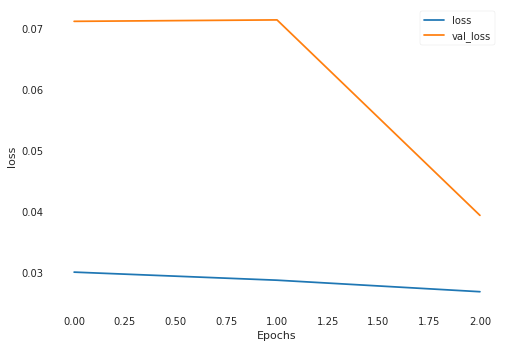

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 425us/sample - loss: 0.0268 - val_loss: 0.0305
Epoch 2/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0267 - val_loss: 0.0277
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0322 - val_loss: 0.0408
loss cuts = tf.Tensor([3.5023246], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.423489, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.3239822], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.4200797, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.3236268], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.418142, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.223596], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.883257, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.3300796], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.453335, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.989603], shape=(1

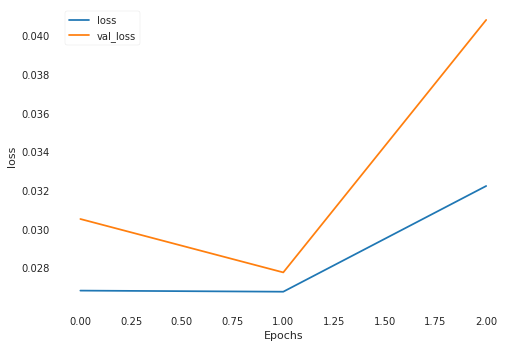

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0314 - val_loss: 0.0429
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0271 - val_loss: 0.0406
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0305 - val_loss: 0.0427
loss cuts = tf.Tensor([1.309531], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.4539824, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5872692], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.11995, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5863566], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.1240807, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2354935], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.835643, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2779257], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.615566, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2814678], shape=(

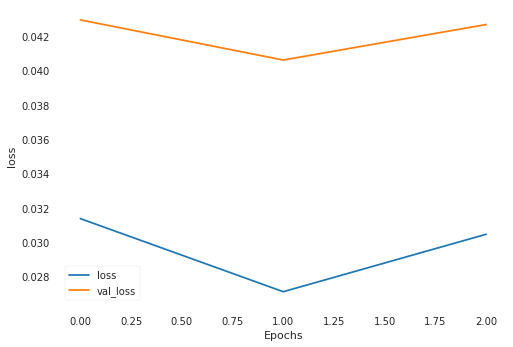

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0292 - val_loss: 0.1061
Epoch 2/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0331 - val_loss: 0.0916
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0364 - val_loss: 0.0798
loss cuts = tf.Tensor([1.1244597], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3923359, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.223517], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5262406, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2893217], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62604356, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2966073], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.63762575, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3147597], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.66694534, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2995551], 

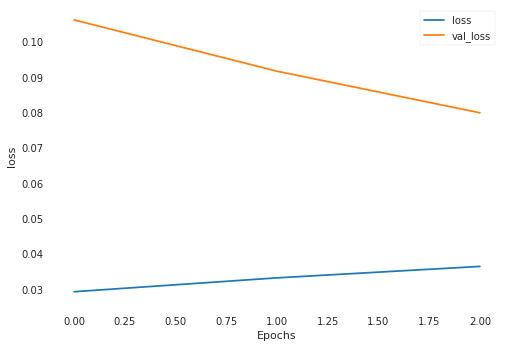

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0311 - val_loss: 0.0683
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0280 - val_loss: 0.0553
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0280 - val_loss: 0.0622
loss cuts = tf.Tensor([1.6247091], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.52520335, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6406559], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.54857117, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6894298], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6231994, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1157528], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.046549287, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1312015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.053454146, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.127661

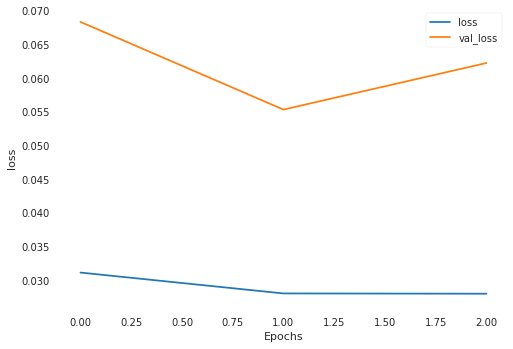

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0297 - val_loss: 0.0557
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0320 - val_loss: 0.0376
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0284 - val_loss: 0.0464
loss cuts = tf.Tensor([1.5510672], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8253826, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.547313], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8152521, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8120878], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.598827, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8246764], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6395733, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2112796], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.0452456, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6250707], shap

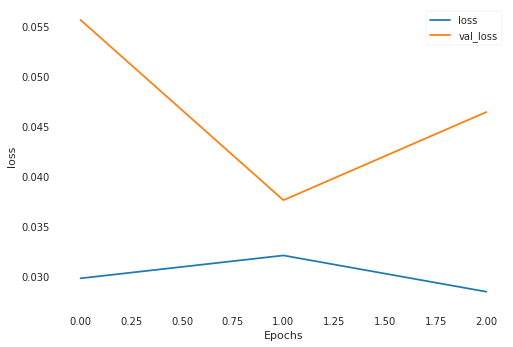

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0276 - val_loss: 0.0504
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0306 - val_loss: 0.7387
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0284 - val_loss: 0.0704
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.6267495], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.4137635, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.4359062], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.833908, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5258965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.9546156, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.184299], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.550583, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.826107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.381217, shape=(), dtype=float32)
loss cuts = tf

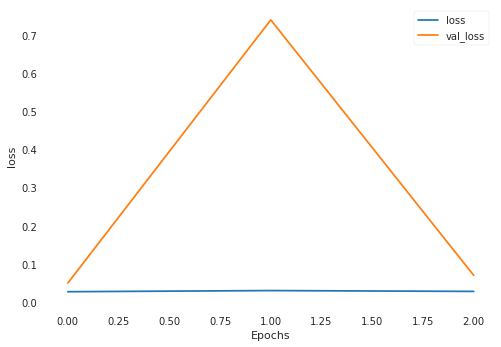

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0325 - val_loss: 0.1911
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.7482 - val_loss: 0.5558
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.2491 - val_loss: 0.1230
loss cuts = tf.Tensor([0.92865855], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0008213136, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7584798], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.020027967, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8890117], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00012074263, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0311415], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017198104, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.96692884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004479473, shape=(), dtype=float32)
loss cuts = tf.Tensor(

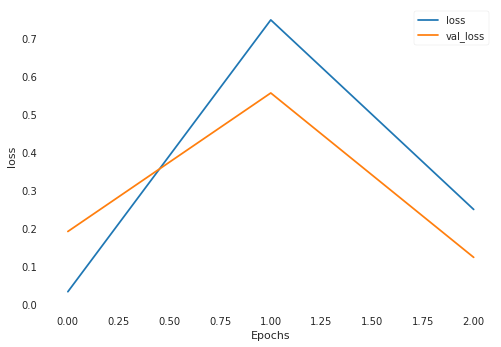

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 442us/sample - loss: 0.0581 - val_loss: 0.0765
Epoch 2/3
882/882 [==============================] - 0s 429us/sample - loss: 0.0336 - val_loss: 0.0662
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0278 - val_loss: 0.0742
loss cuts = tf.Tensor([1.1316606], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.964529, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9450502], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.63281065, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98116195], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6915681, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0169159], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.75231284, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93332267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6142898, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88291997]

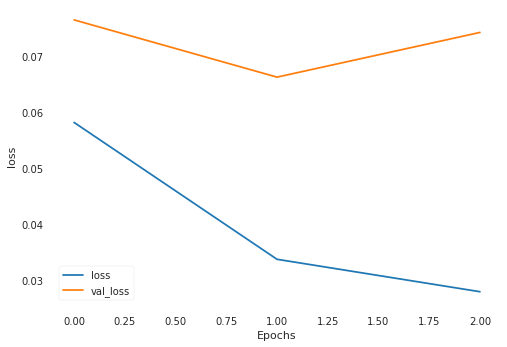

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0255 - val_loss: 0.0436
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0239 - val_loss: 0.0449
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0235 - val_loss: 0.0422
loss cuts = tf.Tensor([0.9194244], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08578236, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0772483], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20313966, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.123869], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24733791, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1213713], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24485981, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1247783], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24824321, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1229215]

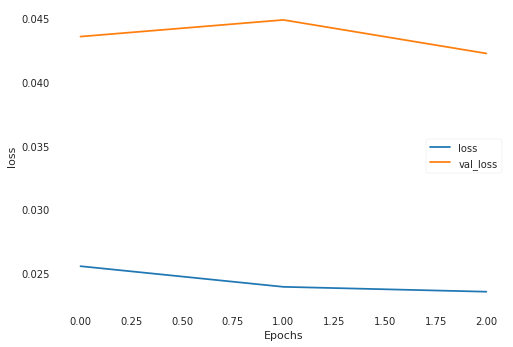

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0244 - val_loss: 0.0351
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0264 - val_loss: 0.0489
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0253 - val_loss: 0.5265
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.9787889], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.4247518, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8167834], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.696341, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5322983], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5442548, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2795904], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6566105, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.412652], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1080732, shape=(), dtype=float32)
loss cuts =

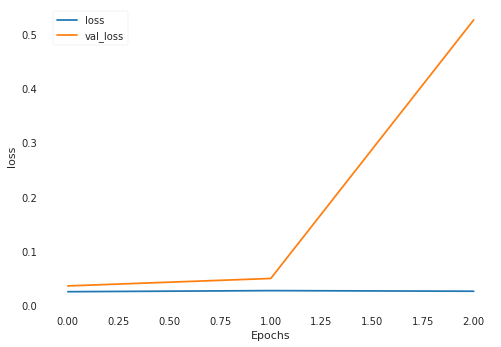

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0237 - val_loss: 0.6015
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0252 - val_loss: 0.6613
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0264 - val_loss: 0.4609
loss cuts = tf.Tensor([1.0552232], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4293175, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1761765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6024501, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8794358], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22985865, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1189158], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.51684, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3495085], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9015665, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1467776], sha

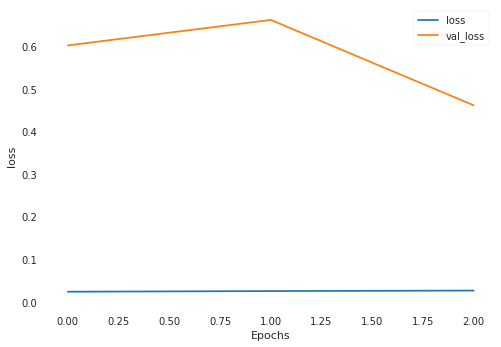

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0414 - val_loss: 0.2087
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0308 - val_loss: 0.2218
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0274 - val_loss: 0.2501
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0102658], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0034834498, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.85337394], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.009578757, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83686596], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013082581, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8436762], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01157106, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1585238], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04296447, shape=(), dtype=float32

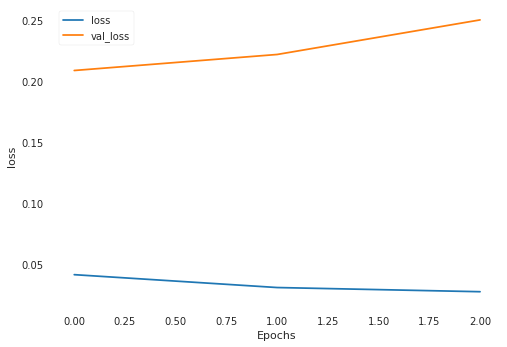

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 438us/sample - loss: 0.0262 - val_loss: 0.0848
Epoch 2/3
882/882 [==============================] - 0s 425us/sample - loss: 0.0264 - val_loss: 0.0332
Epoch 3/3
882/882 [==============================] - 0s 450us/sample - loss: 0.0264 - val_loss: 0.0449
loss cuts = tf.Tensor([1.1218644], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49086747, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0326684], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3738384, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99002784], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3235138, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.014704], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35219344, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.033053], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37430894, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0312668], 

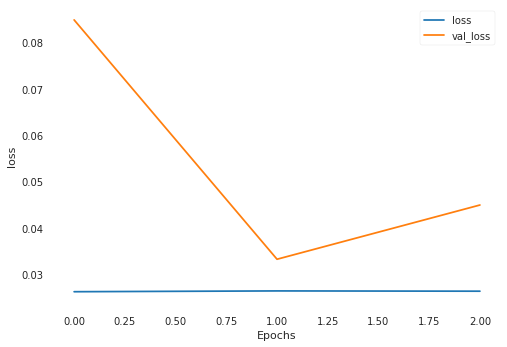

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0266 - val_loss: 0.1536
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0261 - val_loss: 0.1182
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0242 - val_loss: 0.1328
loss cuts = tf.Tensor([1.2298265], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24944842, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1491693], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17538589, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1512859], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17716317, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0350022], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09279572, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0558226], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10591398, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0373287

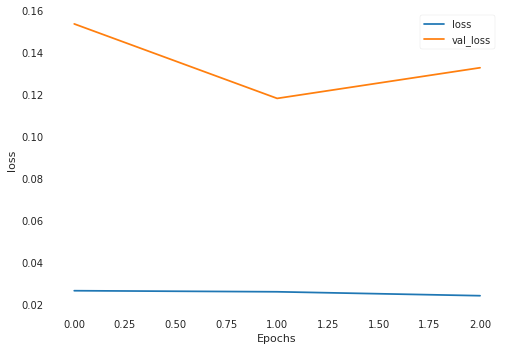

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0253 - val_loss: 0.0668
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0288 - val_loss: 0.0763
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0286 - val_loss: 0.0615
loss cuts = tf.Tensor([0.42065817], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.709238e-06, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4095428], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0001823789, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.41105792], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00014375178, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3871866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0012860103, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.38595843], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0013756043, shape=(), dtype=float32)
loss cuts = tf.Ten

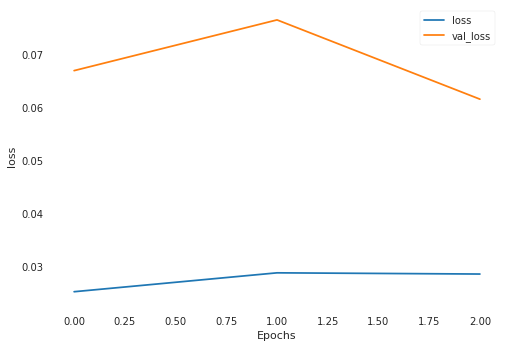

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0268 - val_loss: 0.0876
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0258 - val_loss: 0.0631
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0258 - val_loss: 0.0762
loss cuts = tf.Tensor([0.82683957], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2614895, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90714204], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0875528, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82564306], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2641786, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2796495], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44936985, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3137711], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40478724, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2906566

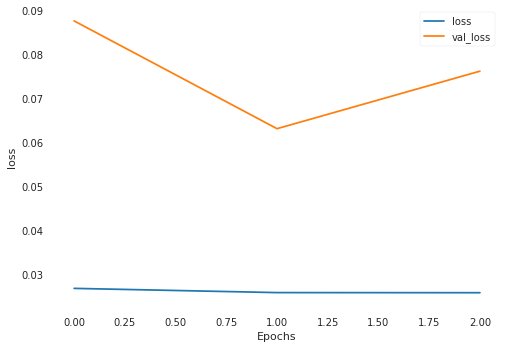

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0347 - val_loss: 0.3091
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.1545 - val_loss: 0.1482
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0597 - val_loss: 0.1458
loss cuts = tf.Tensor([0.638793], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.349095, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2613666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0010068569, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93630064], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0860454, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1429086], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0075215767, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3336831], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01082589, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.348388

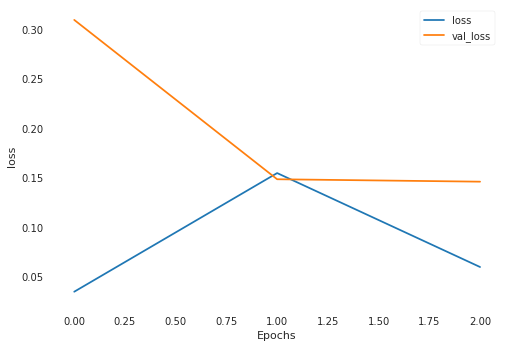

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0397 - val_loss: 0.0589
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0326 - val_loss: 0.0517
Epoch 3/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0331 - val_loss: 0.0656
loss cuts = tf.Tensor([0.6792006], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.051331215, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6655639], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.057696346, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67609036], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05275022, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6833894], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.049450684, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55728364], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12143892, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.51

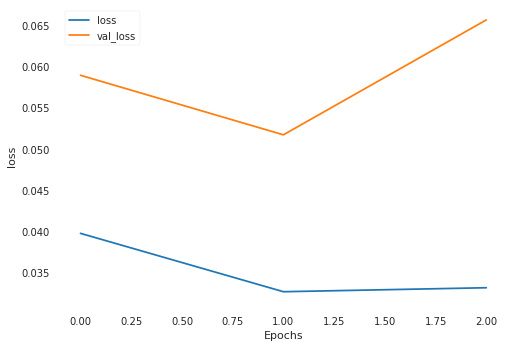

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 425us/sample - loss: 0.0390 - val_loss: 0.1328
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0317 - val_loss: 0.1491
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0289 - val_loss: 0.1488
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.7659575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3697265, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89824224], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.077586, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6831775], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06407641, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.806339], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.016892623, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8054413], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017126797, shape=(), dtype=float32)
loss 

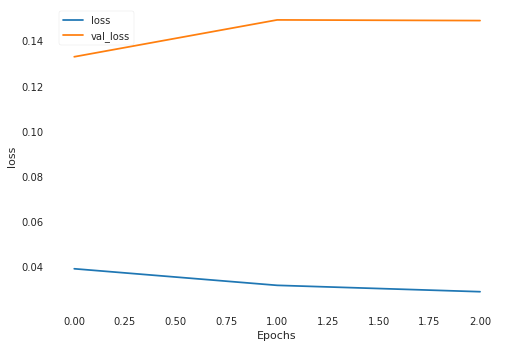

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0313 - val_loss: 0.1031
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0343 - val_loss: 0.0970
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0294 - val_loss: 0.1000
loss cuts = tf.Tensor([0.43417618], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7069356, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44728053], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.663987, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46047148], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6211011, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5909825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2155447, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78943825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6641381, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7612486],

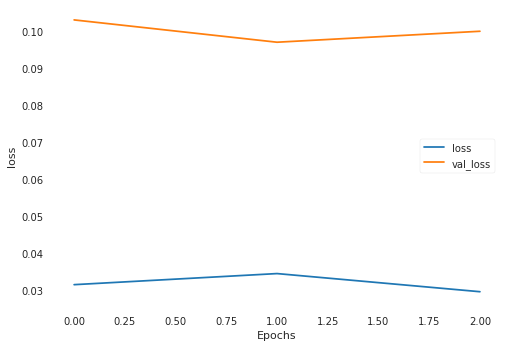

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0265 - val_loss: 0.1338
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0260 - val_loss: 0.1022
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0255 - val_loss: 0.1301
loss cuts = tf.Tensor([1.7970598], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7391479, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6191286], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3015076, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6162009], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2948362, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5945446], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2460195, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7224543], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5479393, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7718328], sh

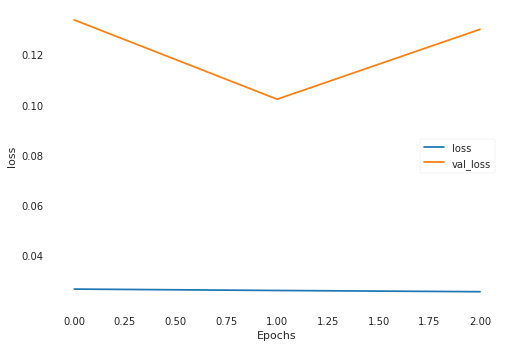

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0269 - val_loss: 0.0371
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0272 - val_loss: 0.0338
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0273 - val_loss: 0.0411
loss cuts = tf.Tensor([0.3965075], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12495694, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.28552058], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21574113, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.47291514], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07677602, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4879917], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06864835, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.50573933], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.059663273, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.503

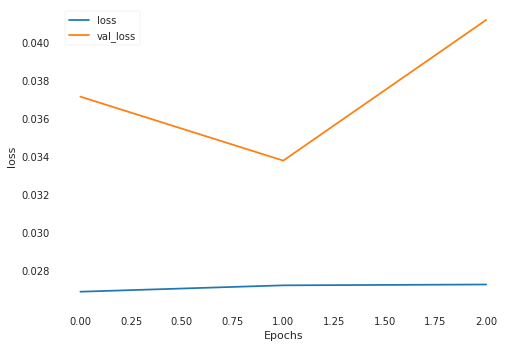

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0282 - val_loss: 0.0327
Epoch 2/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0280 - val_loss: 0.0335
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0284 - val_loss: 0.0643
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.50373065], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8032987, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6587982], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.54938006, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7039594], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48447248, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6974015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4936446, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7012975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4881851, shape=(), dtype=float32)
loss c

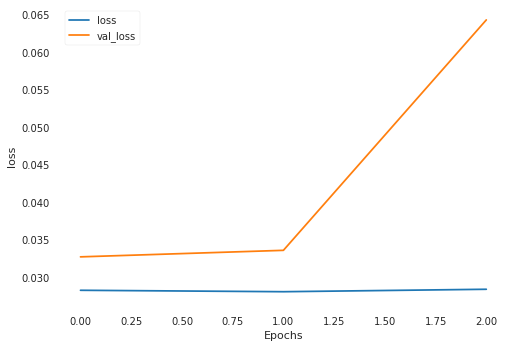

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 440us/sample - loss: 0.0283 - val_loss: 0.0961
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0278 - val_loss: 0.0881
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0274 - val_loss: 0.1237
loss cuts = tf.Tensor([1.2158669], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19185065, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4770073], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48880783, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5062141], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5305007, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5163332], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5453437, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5149301], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5432734, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2409011], 

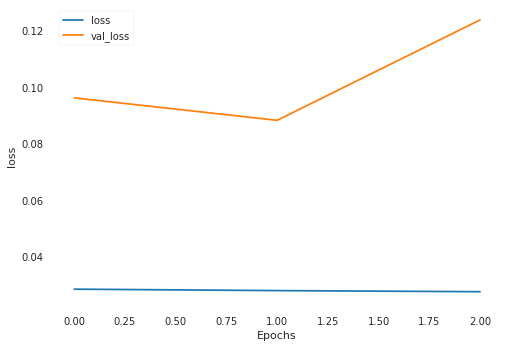

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0282 - val_loss: 0.0515
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0258 - val_loss: 0.0320
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0258 - val_loss: 0.0402
loss cuts = tf.Tensor([0.6686604], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44710672, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7419696], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5505189, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7017374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4924354, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8586348], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7372538, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8503432], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7230836, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.70934165], 

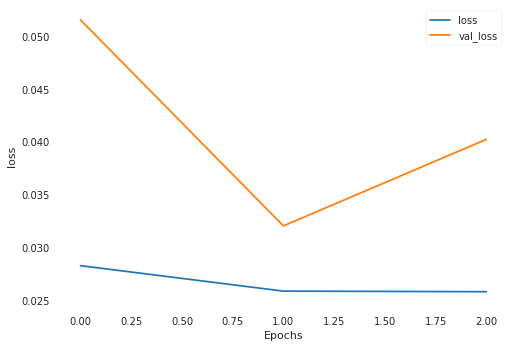

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0230 - val_loss: 0.0411
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0262 - val_loss: 0.0492
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0294 - val_loss: 0.0457
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.74606526], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2186719, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8898657], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.92185795, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8804958], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9399385, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8924579], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9168869, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8956775], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9107315, shape=(), dtype=float32)
loss cu

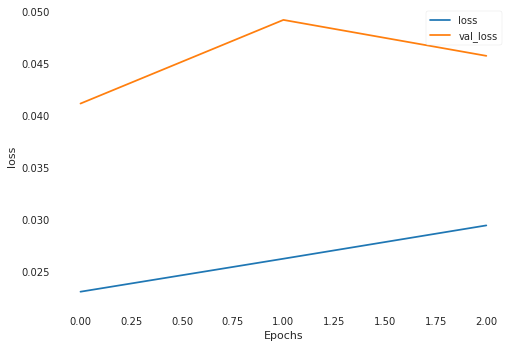

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0282 - val_loss: 0.1169
Epoch 2/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0257 - val_loss: 0.0924
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0248 - val_loss: 0.0842
loss cuts = tf.Tensor([0.38635135], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11483897, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36141765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13235967, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4113436], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09852488, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.42540494], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08989527, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39013684], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.112287655, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39

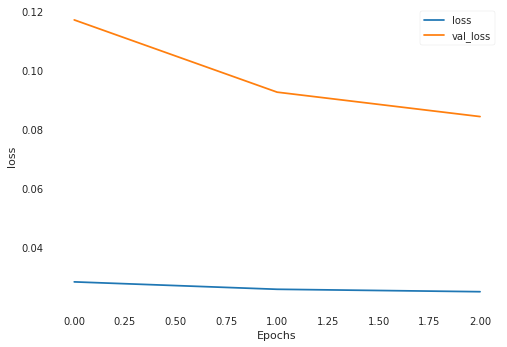

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 429us/sample - loss: 0.0254 - val_loss: 0.0805
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0275 - val_loss: 0.0563
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0251 - val_loss: 0.0808
loss cuts = tf.Tensor([1.2739565], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3294261, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3904939], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47678182, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.374296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45467505, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.323176], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38834837, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4636707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.583193, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3614571], sh

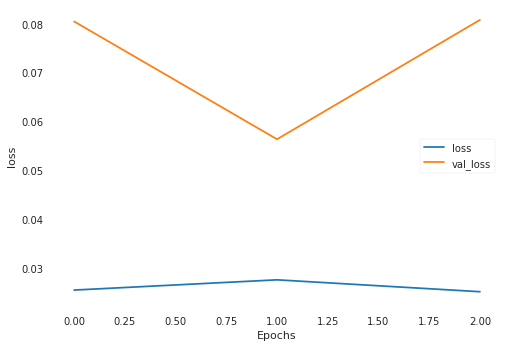

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0273 - val_loss: 0.0594
Epoch 2/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0265 - val_loss: 0.0312
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0322 - val_loss: 0.0529
loss cuts = tf.Tensor([0.95075476], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(40.31292, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.870429], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(41.339386, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80348027], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(42.204773, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77649355], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(42.556137, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7971039], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(42.28766, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78990525], s

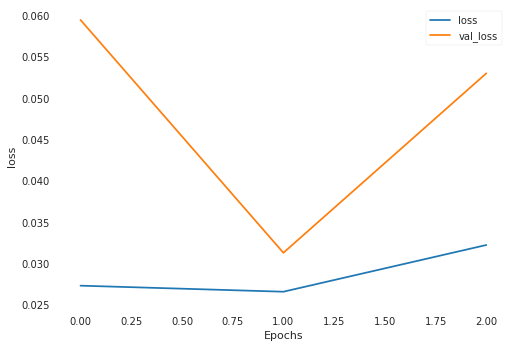

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0301 - val_loss: 0.6978
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0249 - val_loss: 0.2458
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0241 - val_loss: 0.2597
loss cuts = tf.Tensor([1.2862884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6505475, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3134421], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5475228, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2916702], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.630011, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3142798], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.544368, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3003432], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5970378, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3113825], shap

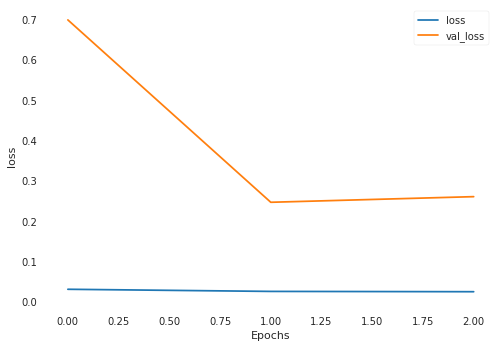

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0247 - val_loss: 0.1417
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0276 - val_loss: 0.1440
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0248 - val_loss: 0.1284
loss cuts = tf.Tensor([1.4794093], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(21.34986, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4623435], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(21.507854, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4270711], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(21.836264, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3036417], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.00505, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1046735], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(24.953287, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65626526], sha

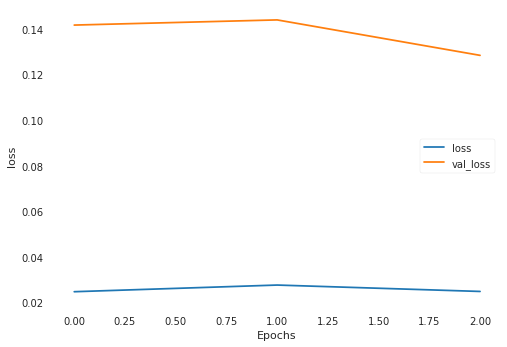

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0264 - val_loss: 0.0878
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0293 - val_loss: 0.0867
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0257 - val_loss: 0.1319
loss cuts = tf.Tensor([1.5184253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23348957, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3674929], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40213355, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.419866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3384528, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4830751], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26890218, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7744552], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5059652, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65826356],

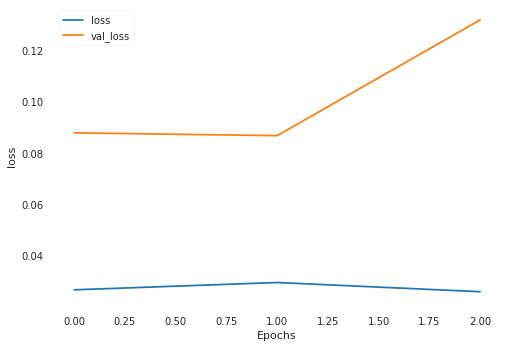

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0242 - val_loss: 0.0431
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0305 - val_loss: 0.0678
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0315 - val_loss: 0.1093
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.74508065], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(53.36185, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5808702], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(55.787903, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6241454], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(55.14332, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6222127], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(55.172024, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44573152], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(57.8249, shape=(), dtype=float32)
loss cuts =

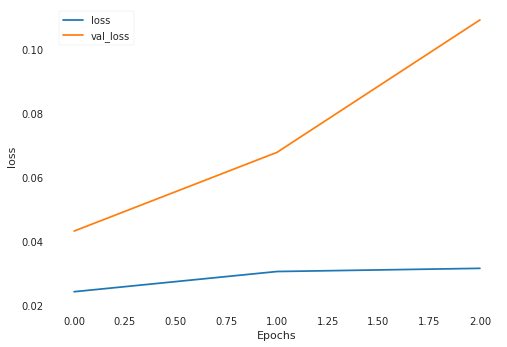

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0272 - val_loss: 0.2070
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0289 - val_loss: 0.5396
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0530 - val_loss: 0.2634
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.6608291], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6184352, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4550592], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.98441404, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4692376], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.95648015, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4587433], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.97711694, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4581327], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9783244, shape=(), dtype=float32)
loss c

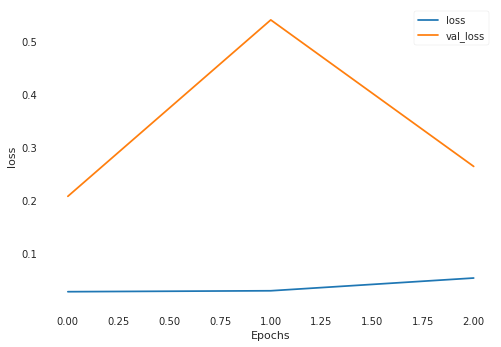

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0309 - val_loss: 0.0707
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0266 - val_loss: 0.1149
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0263 - val_loss: 0.1048
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.84416395], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.5322986, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.86655086], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.4183645, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.86298525], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.4364448, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8308038], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.600769, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82517207], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.6297398, shape=(), dtype=float32)
loss c

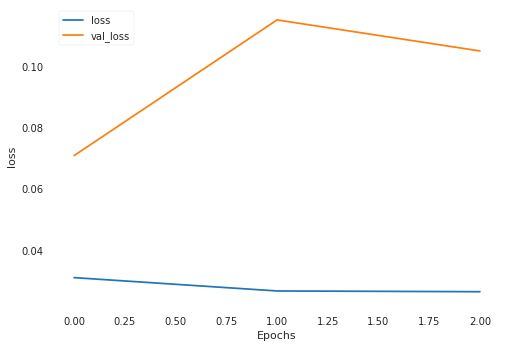

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0310 - val_loss: 0.0878
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0258 - val_loss: 0.1433
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0301 - val_loss: 0.1004
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.4008946], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9964225, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8372451], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.442203, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7918786], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5860548, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.79140365], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5875826, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5824497], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3034894, shape=(), dtype=float32)
loss cuts

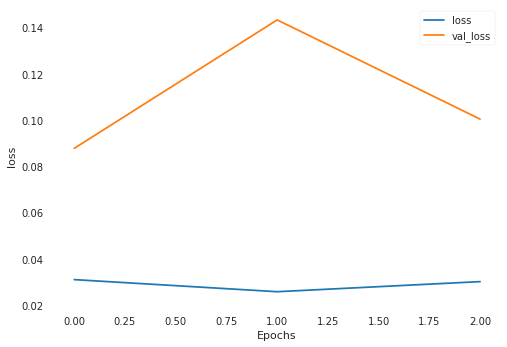

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0296 - val_loss: 0.0418
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0287 - val_loss: 0.0754
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0284 - val_loss: 0.0397
loss cuts = tf.Tensor([1.3380939], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7904953, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2135956], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4728143, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2780505], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6334132, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3707696], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8790094, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9426626], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.773938, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6921128], sha

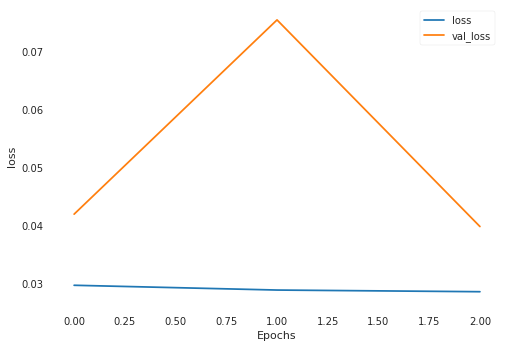

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0258 - val_loss: 0.0789
Epoch 2/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0250 - val_loss: 0.1273
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0314 - val_loss: 0.8490
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4349756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45205155, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4842095], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38827088, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4470088], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4360153, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4586916], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42072323, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3146275], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62836677, shape=(), dtype=float32)
loss 

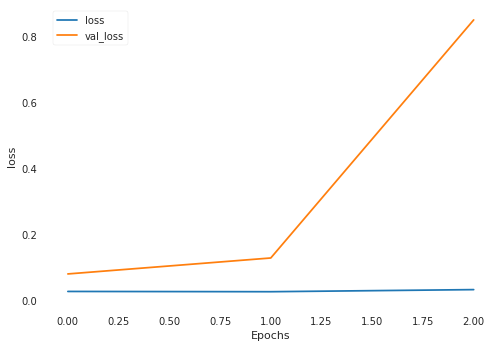

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0312 - val_loss: 0.6798
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.7138 - val_loss: 0.6912
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.3312 - val_loss: 0.3281
loss cuts = tf.Tensor([1.0519783], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8917603, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0681729], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.836944, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1242162], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6512952, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1500431], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5678551, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1503791], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5667787, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1548015], sha

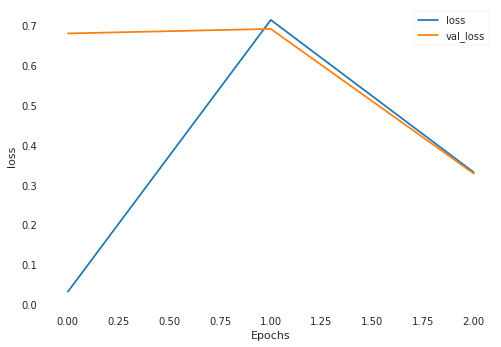

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0832 - val_loss: 0.4761
Epoch 2/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0497 - val_loss: 0.4491
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0409 - val_loss: 0.4512
loss cuts = tf.Tensor([1.0136442], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.1962028, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0268902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.1304336, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99878716], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.270388, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7254645], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.7139335, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7244301], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.7196813, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.70338076], s

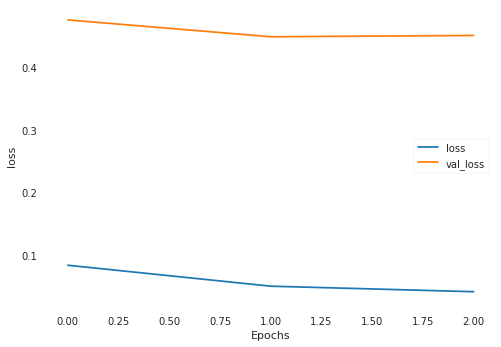

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0374 - val_loss: 0.1661
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0338 - val_loss: 0.1350
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0320 - val_loss: 0.1316
loss cuts = tf.Tensor([2.197137], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7869622, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1622975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72636294, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3560138], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0940858, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3464487], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0741674, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.285418], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9513853, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.292313], shap

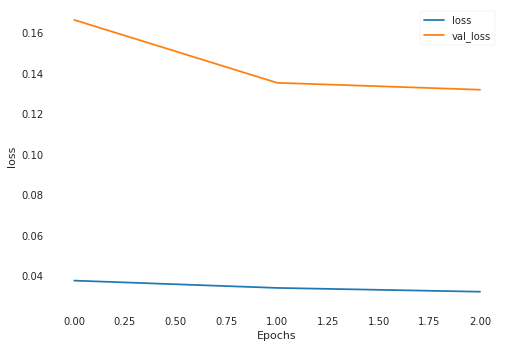

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0320 - val_loss: 0.0738
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0298 - val_loss: 0.0770
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0285 - val_loss: 0.0735
loss cuts = tf.Tensor([1.1722853], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2282113, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2313884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17523561, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4416736], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.043399863, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4413661], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.043528102, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4271508], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.049661733, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.42972

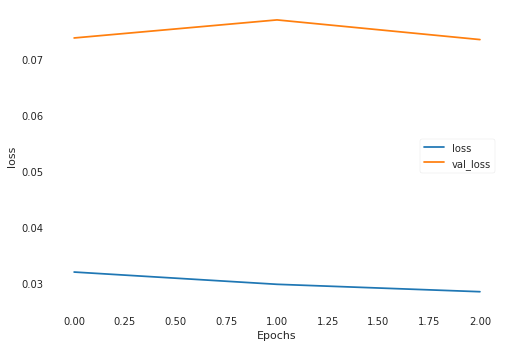

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0289 - val_loss: 0.0511
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0289 - val_loss: 0.0483
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0283 - val_loss: 0.0566
loss cuts = tf.Tensor([1.1711178], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.53126925, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2005434], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48923948, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.263108], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40563136, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2124194], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47276706, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1625936], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.54376817, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1604358]

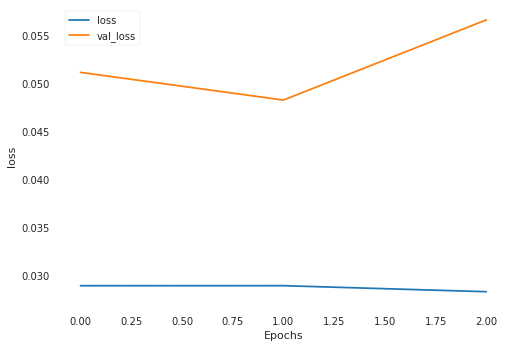

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0263 - val_loss: 0.0672
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0248 - val_loss: 0.0574
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0263 - val_loss: 0.0874
loss cuts = tf.Tensor([1.137584], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15236133, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1953582], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20080176, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.241242], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24402907, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2311507], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23416084, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0137976], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07104814, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.009552], 

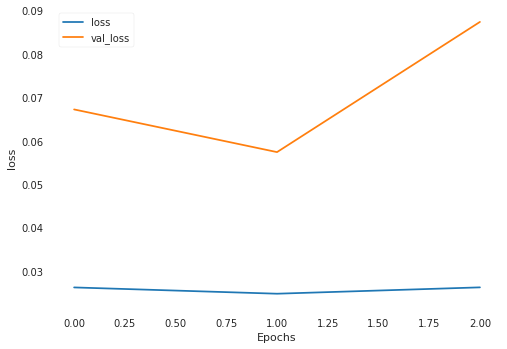

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0274 - val_loss: 0.0351
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0283 - val_loss: 0.0478
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0298 - val_loss: 0.0479
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1734132], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32880262, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2444699], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4153414, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1983134], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35797885, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1944145], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35332856, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2893004], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47513506, shape=(), dtype=float32)
loss 

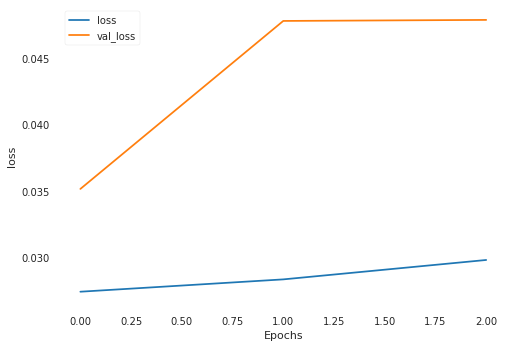

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0273 - val_loss: 0.0770
Epoch 2/3
882/882 [==============================] - 0s 434us/sample - loss: 0.0300 - val_loss: 0.0923
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0286 - val_loss: 0.0683
loss cuts = tf.Tensor([1.3267256], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7602009, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3656554], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8650148, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3204974], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7437134, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.320277], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7431313, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3214495], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7462288, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.319987], shap

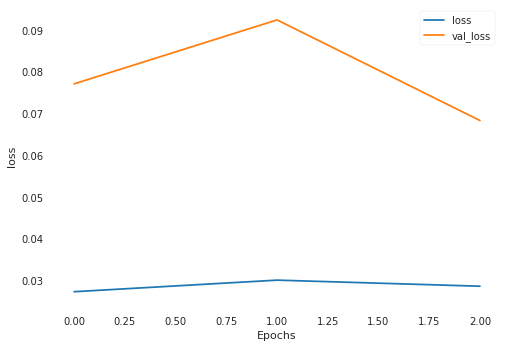

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0254 - val_loss: 0.0287
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0253 - val_loss: 0.0505
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0232 - val_loss: 0.0284
loss cuts = tf.Tensor([0.9636145], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6547878, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0499883], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4400282, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0372045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4708729, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0592053], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.417992, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98657554], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5962412, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3428123], sh

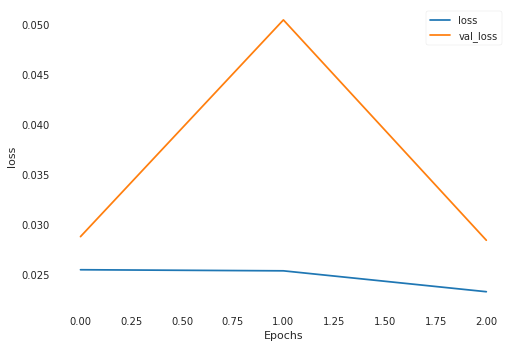

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0258 - val_loss: 0.0574
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0247 - val_loss: 0.0434
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0286 - val_loss: 0.0280
loss cuts = tf.Tensor([1.1793332], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2753936, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.304643], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5741292, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3421354], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6696141, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3203765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6138566, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3004225], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5635567, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2257012], sha

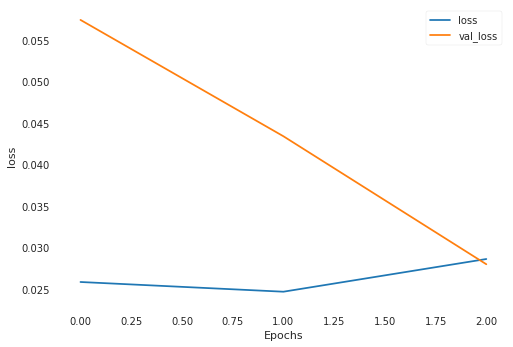

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0297 - val_loss: 0.0652
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0237 - val_loss: 0.0243
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0225 - val_loss: 0.0416
loss cuts = tf.Tensor([1.3905394], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2784715, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3863256], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2912104, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3774174], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3182578, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4248564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1760488, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.426323], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.171724, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4326296], shap

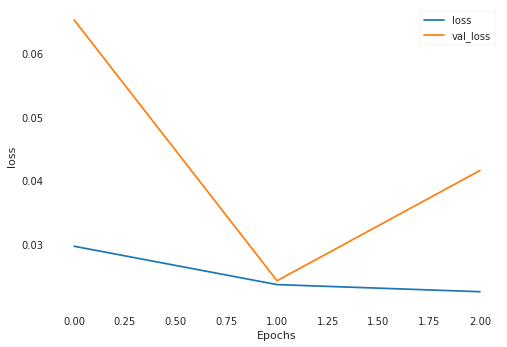

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0239 - val_loss: 0.0505
Epoch 2/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0246 - val_loss: 0.0428
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0283 - val_loss: 0.0512
loss cuts = tf.Tensor([1.0001651], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0025165388, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97223437], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0004943677, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89091927], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0034905316, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99333555], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0018779705, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9942058], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0019541513, shape=(), dtype=float32)
loss cuts = tf.Tens

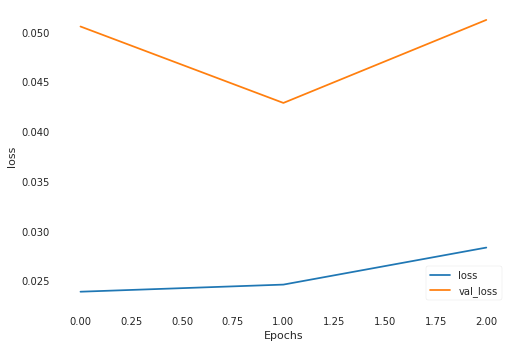

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0301 - val_loss: 0.0613
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0258 - val_loss: 0.0516
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0255 - val_loss: 0.0585
loss cuts = tf.Tensor([1.6043463], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.633065, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5526042], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7180798, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5785267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.67481846, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5655007], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6963892, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0643263], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1126769, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0304587], sh

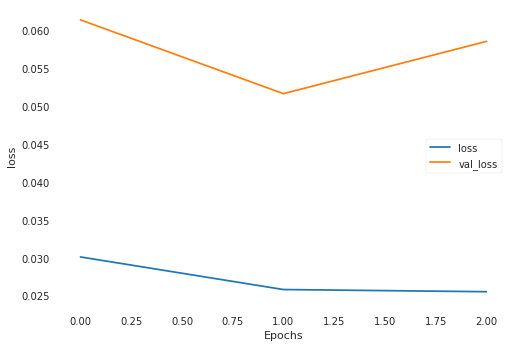

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0262 - val_loss: 0.0950
Epoch 2/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0254 - val_loss: 0.1100
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0234 - val_loss: 0.1282
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5557065], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29625532, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3618284], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5448971, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3708858], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.53160733, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3267531], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5979106, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0433246], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1165627, shape=(), dtype=float32)
loss cu

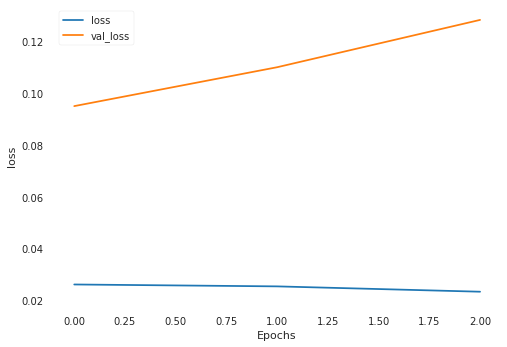

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0227 - val_loss: 0.0594
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0240 - val_loss: 0.0664
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0245 - val_loss: 0.0522
loss cuts = tf.Tensor([1.4752688], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6810687, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3833671], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.53782725, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4133741], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.58274, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4812082], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6909071, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.472349], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.67625797, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4783223], sha

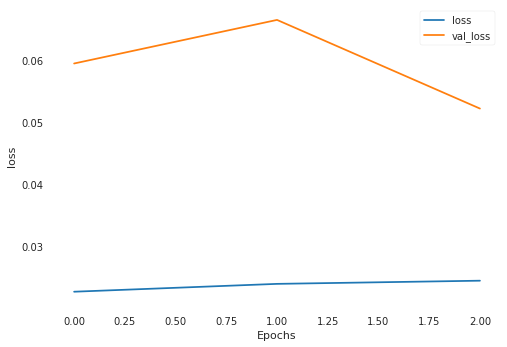

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0264 - val_loss: 0.0904
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0285 - val_loss: 0.0943
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0274 - val_loss: 0.0747
loss cuts = tf.Tensor([0.92979836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17191462, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9800026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13280316, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0053798], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11495114, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0057975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11466807, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8904321], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20610885, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.892353

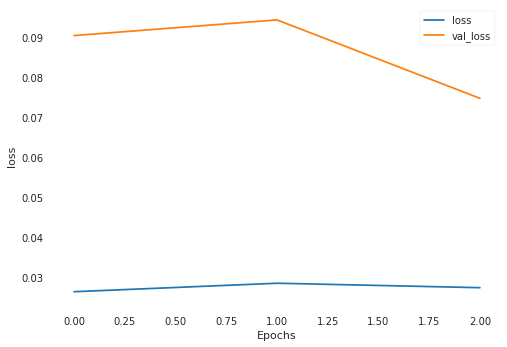

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0286 - val_loss: 0.3540
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0261 - val_loss: 0.3288
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0247 - val_loss: 0.2751
loss cuts = tf.Tensor([0.9706097], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3348832, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88403314], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44258088, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9643913], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34211898, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.871948], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45880663, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8700372], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.46139887, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.863916],

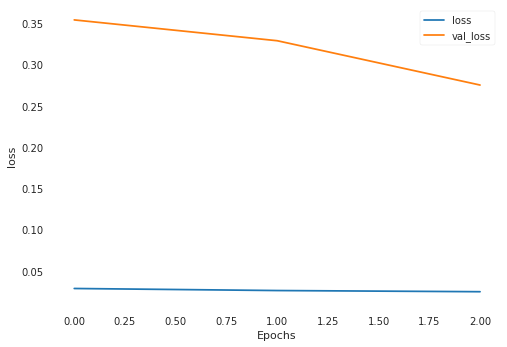

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0260 - val_loss: 0.0767
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0248 - val_loss: 0.0902
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0238 - val_loss: 0.1128
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6448722], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3108557, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.61269826], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3855643, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53126556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5839047, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5561954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5217761, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5568294], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.520212, shape=(), dtype=float32)
loss cut

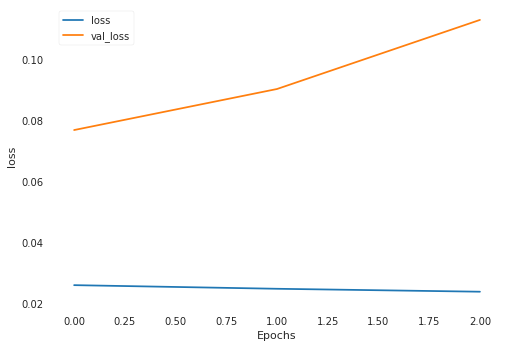

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0261 - val_loss: 0.0305
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0243 - val_loss: 0.0210
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0253 - val_loss: 0.0325
loss cuts = tf.Tensor([1.3862373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.9007454, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1489887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.007456, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.143692], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.033448, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4565713], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.594286, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4304847], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.7067957, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4315559], shape=

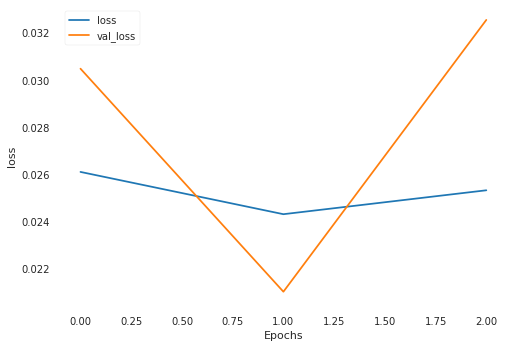

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0264 - val_loss: 0.0661
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0266 - val_loss: 0.0882
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0287 - val_loss: 0.0713
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.6591587], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.8040457, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6764586], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.034784, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7609543], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2829828, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7627181], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.288316, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7690386], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3074782, shape=(), dtype=float32)
loss cuts =

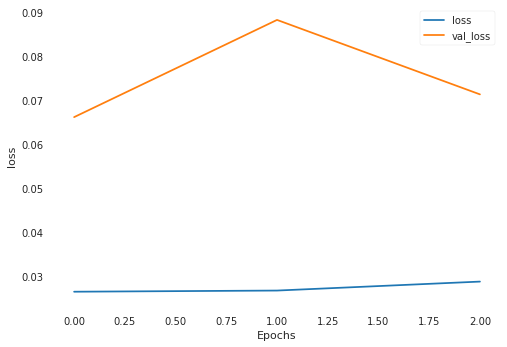

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0246 - val_loss: 0.1115
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0219 - val_loss: 0.1258
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0232 - val_loss: 0.0977
loss cuts = tf.Tensor([2.9894433], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.973673, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.0101118], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0148894, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.978589], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.95237, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9596603], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.91578335, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9347208], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8686727, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9385593], shape

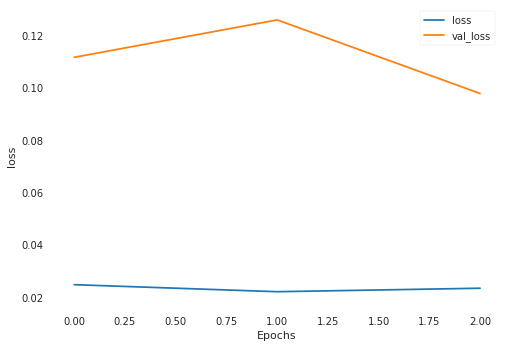

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0232 - val_loss: 0.1831
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0244 - val_loss: 0.1664
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0226 - val_loss: 0.1656
loss cuts = tf.Tensor([1.2258306], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0935021, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1724836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.128973, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1705302], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13037984, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.145755], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14888534, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2330272], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08915268, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7755194], s

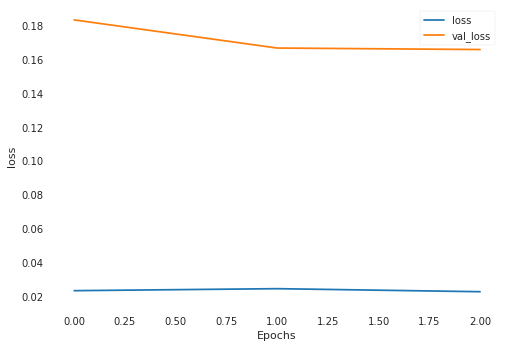

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0249 - val_loss: 0.0314
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0242 - val_loss: 0.0352
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0283 - val_loss: 0.0338
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.8154068], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.080993235, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.792731], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09441415, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7650366], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.112200424, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3998462], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4902152, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.220396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.773703, shape=(), dtype=float32)
loss cu

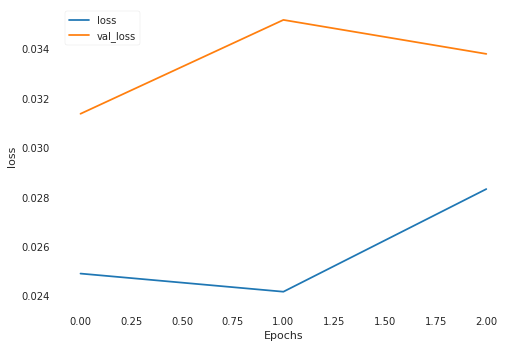

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0291 - val_loss: 0.0481
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0280 - val_loss: 0.0597
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0248 - val_loss: 0.0622
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.92170686], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32632047, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9679443], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38128418, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94648445], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35524252, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95297366], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36302006, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9748983], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3899204, shape=(), dtype=float32)
lo

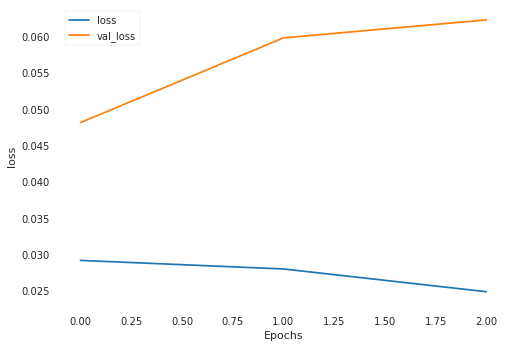

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0992 - val_loss: 0.1710
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0640 - val_loss: 0.0754
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0414 - val_loss: 0.0492
loss cuts = tf.Tensor([1.028195], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0007949594, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2149241], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.046192367, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2057633], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.042338554, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2069234], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04281728, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2118082], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.044862717, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.207

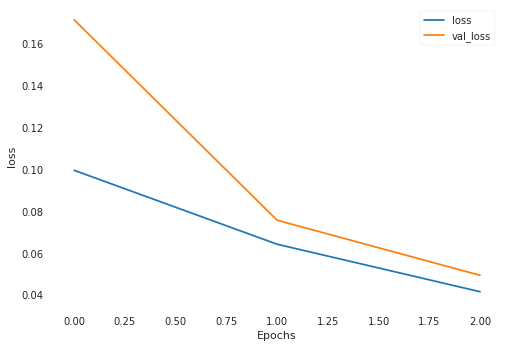

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0300 - val_loss: 0.0689
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0252 - val_loss: 0.0711
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0248 - val_loss: 0.0695
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.54191935], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06660563, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5587464], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.058203306, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5315066], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07208871, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5369692], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06918521, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5364821], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06944169, shape=(), dtype=float32)
lo

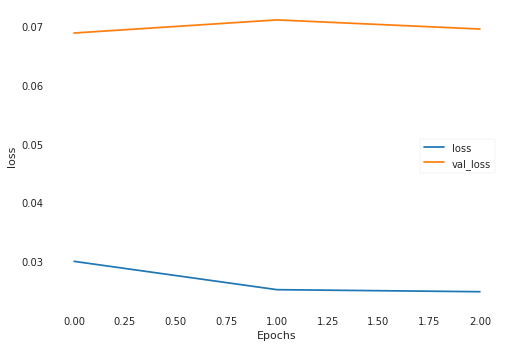

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0249 - val_loss: 0.4536
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0274 - val_loss: 0.4837
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0300 - val_loss: 0.4405
loss cuts = tf.Tensor([1.5949662], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.700431, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6439183], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5419416, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5951496], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6998281, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6249381], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6028237, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6748275], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4443371, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.663681], shap

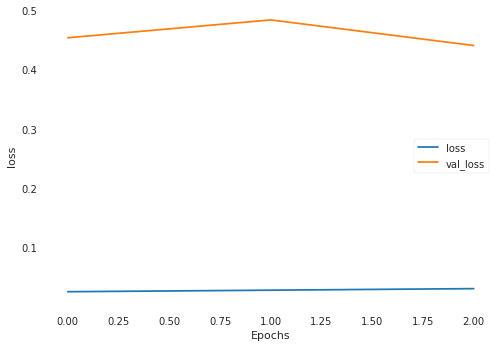

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0282 - val_loss: 0.1892
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0288 - val_loss: 0.1934
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0260 - val_loss: 0.1888
loss cuts = tf.Tensor([0.86375165], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5658188, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8572533], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5866795, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8747138], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5308204, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87567955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5277488, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.81259704], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7323165, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7993085],

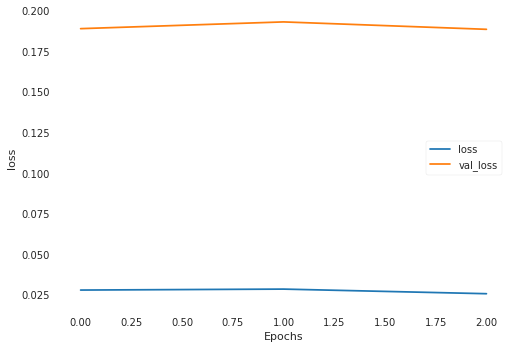

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0229 - val_loss: 0.0375
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0226 - val_loss: 0.0360
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0262 - val_loss: 0.0500
loss cuts = tf.Tensor([0.9896412], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26046613, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0223167], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22818135, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9965099], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25350228, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9924019], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25765583, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9923107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25774843, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9996784

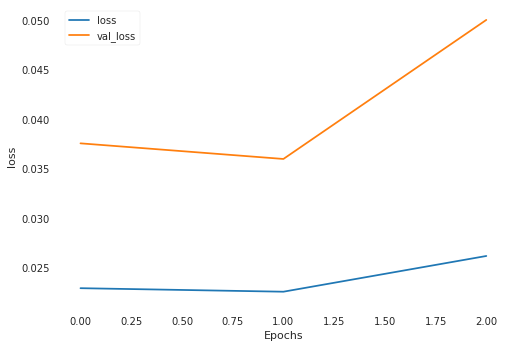

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0265 - val_loss: 0.0374
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0238 - val_loss: 0.0430
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0263 - val_loss: 0.0537
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.9912401], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9825569, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2014194], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4434085, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2171171], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4813739, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2164615], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4797786, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2201918], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4888681, shape=(), dtype=float32)
loss cuts

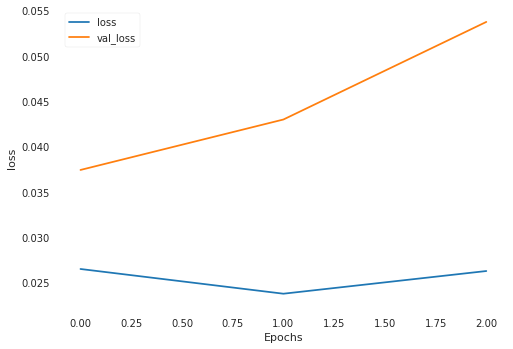

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 441us/sample - loss: 0.0282 - val_loss: 0.0705
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0298 - val_loss: 0.1222
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0269 - val_loss: 0.0803
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1047374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006464139, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1899364], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.027422985, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1377571], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012863991, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1953659], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.029250706, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5546674], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28124973, shape=(), dtype=float32)


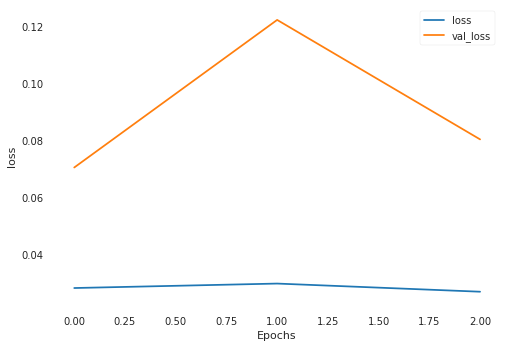

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0232 - val_loss: 0.0396
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0230 - val_loss: 0.0474
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0221 - val_loss: 0.0450
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4932139], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4237595, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6463807], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.812741, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0135633], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50917256, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.048234], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5598541, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9759699], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45693532, shape=(), dtype=float32)
loss cuts

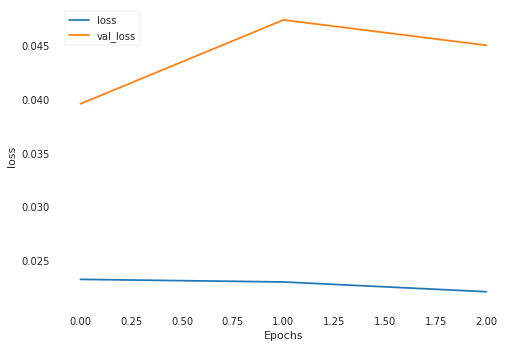

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0251 - val_loss: 0.0670
Epoch 2/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0292 - val_loss: 0.1007
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0250 - val_loss: 0.1151
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0056119], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0012065343, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9747733], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5183446e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9602313], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00011332432, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99293005], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00048635073, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0008676], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00089945475, shape=(), dtyp

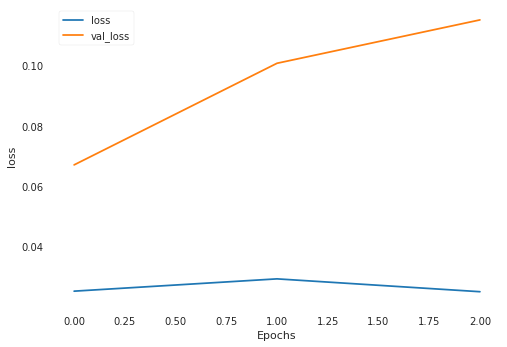

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0231 - val_loss: 0.0725
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0242 - val_loss: 0.0674
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0259 - val_loss: 0.0821
loss cuts = tf.Tensor([0.23812431], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.91323006, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.22320347], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9419703, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.22353205], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9413326, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.22425146], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9399372, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.30134293], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7963993, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.306259

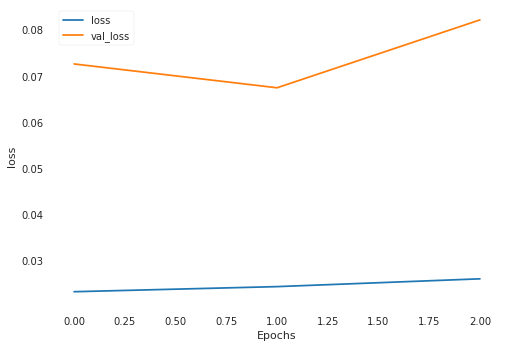

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0266 - val_loss: 0.0398
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0250 - val_loss: 0.0375
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0230 - val_loss: 0.0508
loss cuts = tf.Tensor([0.35245544], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.063791625, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39137748], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08496763, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3969617], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08825432, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.40474027], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09293649, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.40470782], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.092916705, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2

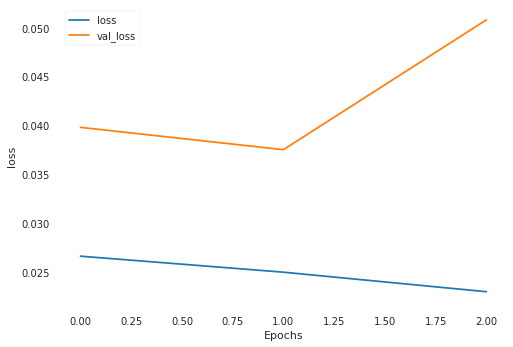

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0252 - val_loss: 0.1648
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0278 - val_loss: 0.2298
Epoch 3/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0250 - val_loss: 0.1492
loss cuts = tf.Tensor([0.5664678], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7835716, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5449685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.82209605, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5799467], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7598904, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57757324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.764034, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5825775], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.75531065, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6621477], 

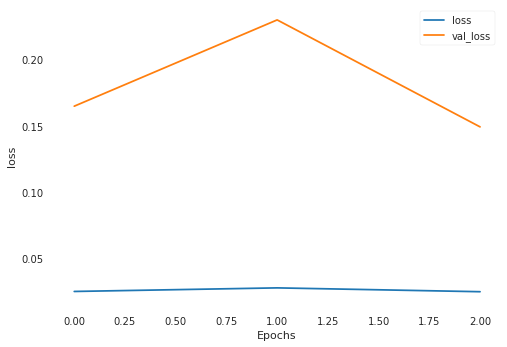

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0230 - val_loss: 0.5897
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0244 - val_loss: 0.5497
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0294 - val_loss: 0.5768
loss cuts = tf.Tensor([0.25271416], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.017454, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.25235686], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.020401, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.26811457], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.89063, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.26901767], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.88321, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.26545823], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.912474, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.23703294]

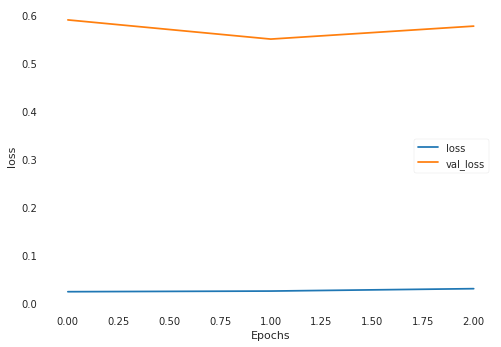

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0308 - val_loss: 0.4715
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0266 - val_loss: 0.3514
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0259 - val_loss: 0.3051
loss cuts = tf.Tensor([0.10735881], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.085638866, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.12910606], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.073383525, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.12749611], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07425838, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.12984093], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07298592, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13094352], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0723914, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.1

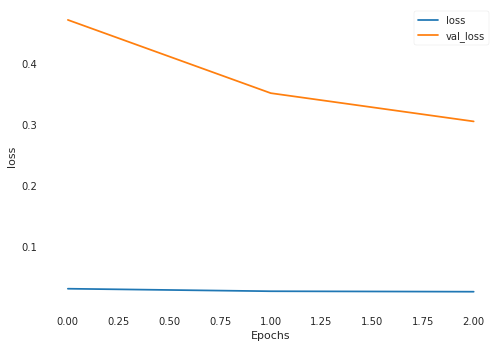

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0281 - val_loss: 0.1463
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0276 - val_loss: 0.3725
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0253 - val_loss: 0.2970
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.32478553], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.029229, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3504196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.904, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.344651], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.9320664, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35104302], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.9009705, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35070777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.9025993, shape=(), dtype=float32)
loss cuts = 

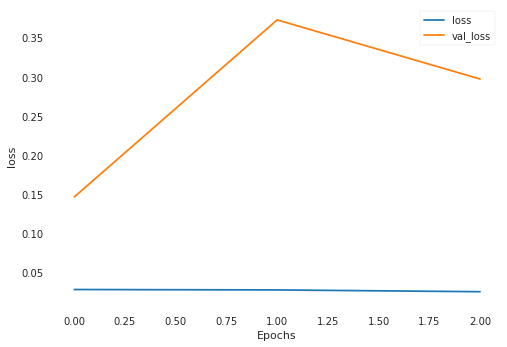

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0230 - val_loss: 0.0771
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0239 - val_loss: 0.1760
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0247 - val_loss: 0.1022
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1771439], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.021410096, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1167859], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0073897825, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0650756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0011733089, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1009828], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00492253, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1286545], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.009571186, shape=(), dtype=float32

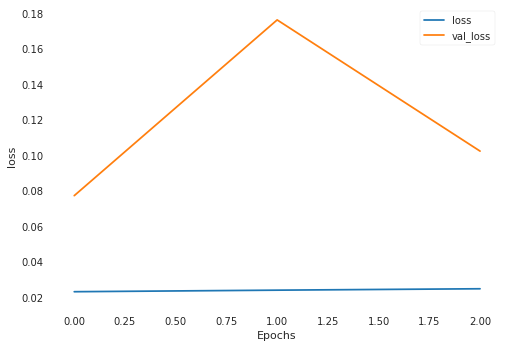

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0286 - val_loss: 0.1331
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0269 - val_loss: 0.0923
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0256 - val_loss: 0.0975
loss cuts = tf.Tensor([1.045923], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9426915, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99524176], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8468449, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9997066], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8550824, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9980179], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8519621, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0009458], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8573757, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0066711], sh

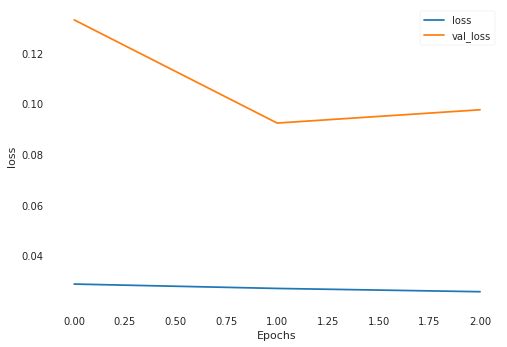

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0241 - val_loss: 0.0611
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0262 - val_loss: 0.0618
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0270 - val_loss: 0.0661
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.22776908], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13855588, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.21381511], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1491388, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.19657695], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16275017, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.17767794], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17835595, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.17804489], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17804614, shape=(), dtype=float32)


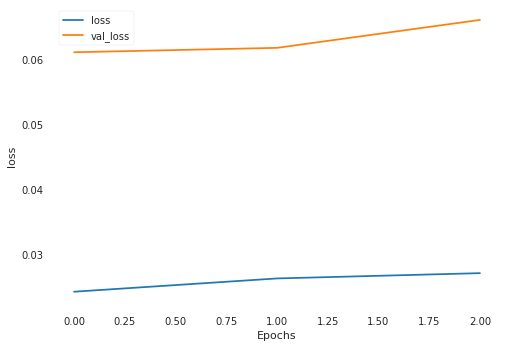

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0330 - val_loss: 0.2061
Epoch 2/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0290 - val_loss: 0.1126
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0269 - val_loss: 0.2528
loss cuts = tf.Tensor([0.59585166], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3320584, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5403591], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4632313, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53765965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4697691, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7353756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0294626, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73453254], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0311741, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72387546]

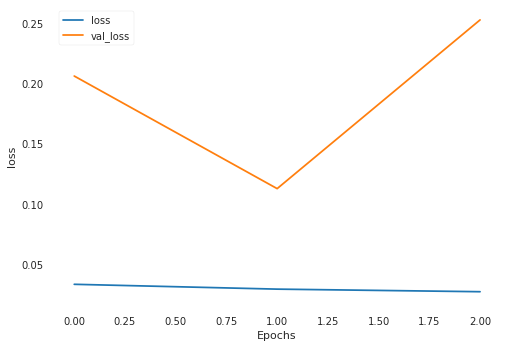

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0232 - val_loss: 0.0674
Epoch 2/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0252 - val_loss: 0.0659
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0239 - val_loss: 0.0440
loss cuts = tf.Tensor([0.7392997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2908442, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73862225], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29011393, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.62553096], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1810766, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5681213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1355133, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.59941524], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15953255, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5908407

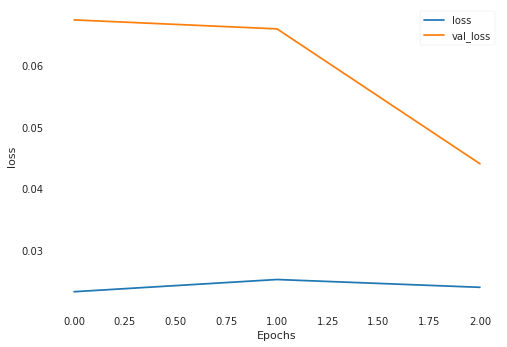

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0217 - val_loss: 0.1200
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0289 - val_loss: 0.3453
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0390 - val_loss: 0.1261
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.33595532], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018757189, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36273333], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026809117, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36076164], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026167335, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.31119698], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012588514, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.26711655], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004640077, shape=(), dtype=flo

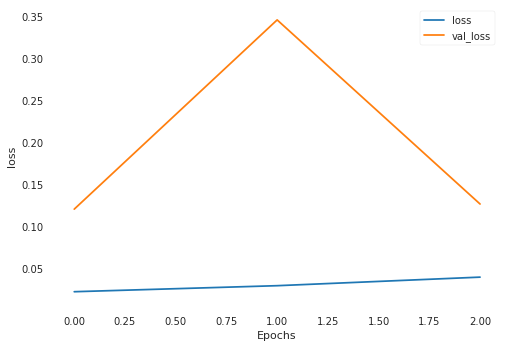

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0273 - val_loss: 0.2070
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0260 - val_loss: 0.1389
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0248 - val_loss: 0.0997
loss cuts = tf.Tensor([0.59124094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8066722, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5318511], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9168812, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5448667], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8921248, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60850585], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.77595735, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6041856], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.78358734, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60479766

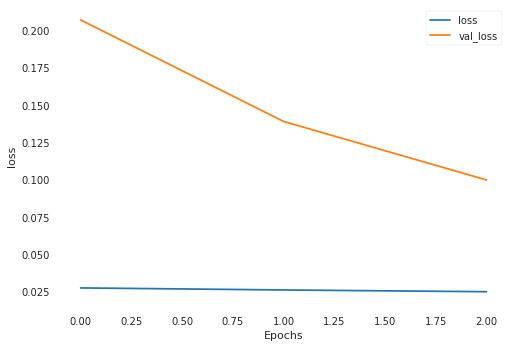

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0297 - val_loss: 0.1411
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0284 - val_loss: 0.2229
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0251 - val_loss: 0.2164
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.09211093], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9821517, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13841455], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8539151, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2526689], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.555835, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4338125], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1367558, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.31581187], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4023015, shape=(), dtype=float32)
loss cu

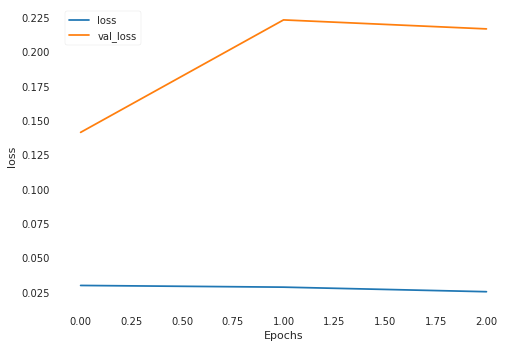

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0244 - val_loss: 0.0310
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0267 - val_loss: 0.0721
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0262 - val_loss: 0.0611
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.65052205], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25068623, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6205129], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22153646, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7091812], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31286672, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73114586], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3379208, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73401576], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34126565, shape=(), dtype=float32)
lo

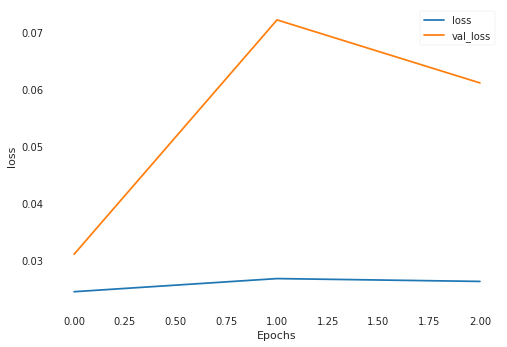

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0375 - val_loss: 0.1639
Epoch 2/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0331 - val_loss: 0.1559
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0335 - val_loss: 0.1320
loss cuts = tf.Tensor([0.53393567], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.74968874, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5474723], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7264307, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.49507007], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8185024, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.31803668], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1701715, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.33216578], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1398029, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3841219

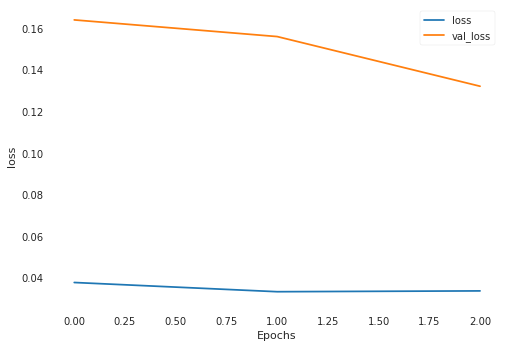

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0271 - val_loss: 0.0695
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0246 - val_loss: 0.0544
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0230 - val_loss: 0.0935
loss cuts = tf.Tensor([0.4408384], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01983545, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2295165], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0049679247, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.20131725], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.009738287, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.17266315], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.016214676, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.12303887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.031315245, shape=(), dtype=float32)
loss cuts = tf.Tensor([0

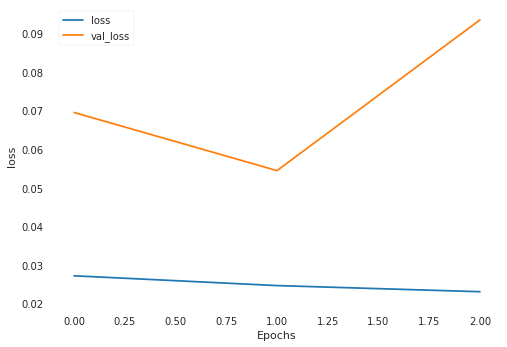

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0241 - val_loss: 0.2635
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0247 - val_loss: 0.2112
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0254 - val_loss: 0.2022
loss cuts = tf.Tensor([0.49009436], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9270278, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5966543], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6425356, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9346083], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.890495, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7234427], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3336232, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8887258], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9791952, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8965438], sh

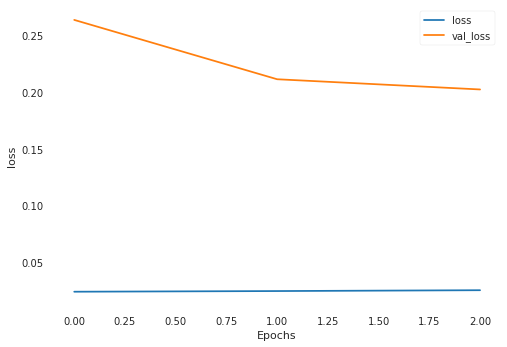

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0278 - val_loss: 0.4227
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0328 - val_loss: 0.4761
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 1.4117 - val_loss: 1.0467
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.7205958], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9172444, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8067368], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6861151, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7114618], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9426227, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68542475], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0158803, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6714401], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.055787, shape=(), dtype=float32)
loss cuts

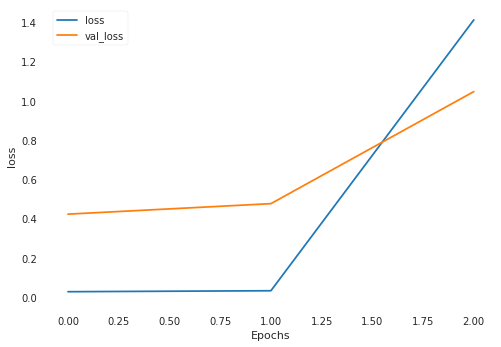

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.4943 - val_loss: 0.4022
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.1356 - val_loss: 0.2996
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0818 - val_loss: 0.2471
loss cuts = tf.Tensor([0.2374918], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09766139, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4695681], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006469292, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8031715], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06409581, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7857954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.055599462, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6611905], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012363327, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6572

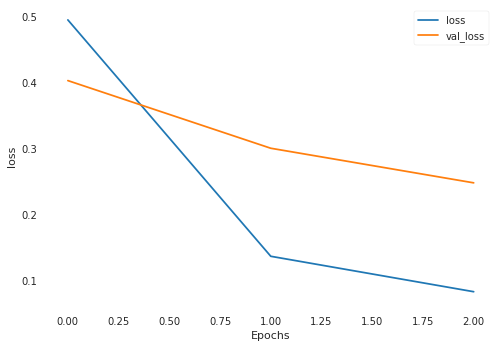

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0648 - val_loss: 0.1403
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0553 - val_loss: 0.1422
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0484 - val_loss: 0.1474
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.173133], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.73664546, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2687391], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5816723, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1647022], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.75118864, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3219004], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50340897, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3262011], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49732465, shape=(), dtype=float32)
loss c

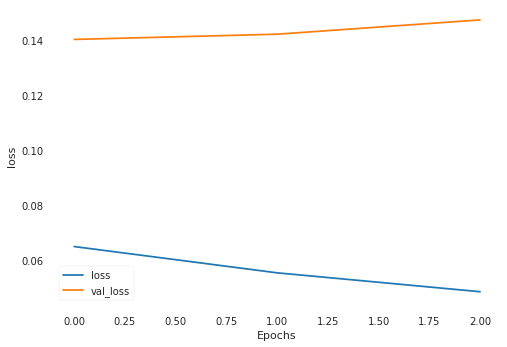

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0450 - val_loss: 0.1769
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0415 - val_loss: 0.0841
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0382 - val_loss: 0.0941
loss cuts = tf.Tensor([1.0058527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.82089835, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8148832], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5113178, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82355833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.52379966, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8252013], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.52618045, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8315122], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.535376, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7310704],

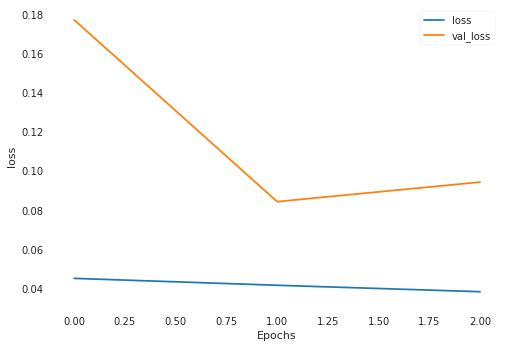

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0373 - val_loss: 0.1336
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0353 - val_loss: 0.1023
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0332 - val_loss: 0.1436
loss cuts = tf.Tensor([0.7878578], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1135935, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80648875], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12649925, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82755595], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1419289, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9571734], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2563923, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9361542], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23554789, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8989142]

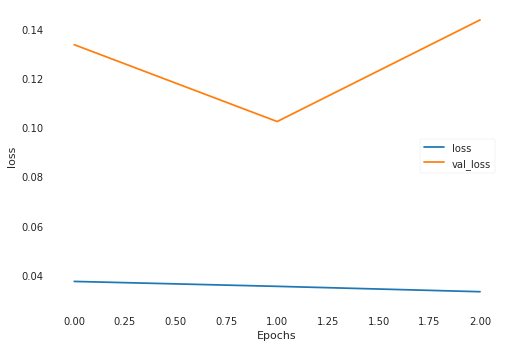

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 423us/sample - loss: 0.0314 - val_loss: 0.0945
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0318 - val_loss: 0.1117
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0299 - val_loss: 0.0793
loss cuts = tf.Tensor([0.8460194], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4495692, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90340936], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.31467, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91235435], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2942375, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90528595], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3103701, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9093368], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3011124, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9070843], s

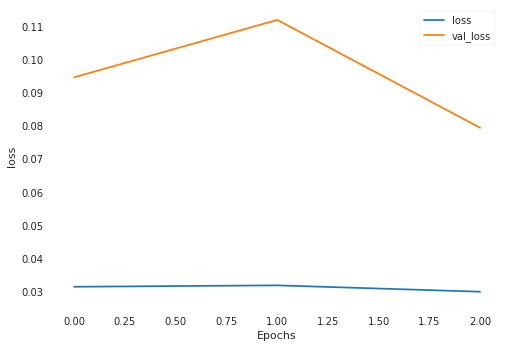

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 425us/sample - loss: 0.0293 - val_loss: 0.1114
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0299 - val_loss: 0.0704
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0342 - val_loss: 0.0646
loss cuts = tf.Tensor([0.91313183], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13406728, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9106299], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13224138, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7626876], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.046529844, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7528296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.042374127, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5629123], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00025384268, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3

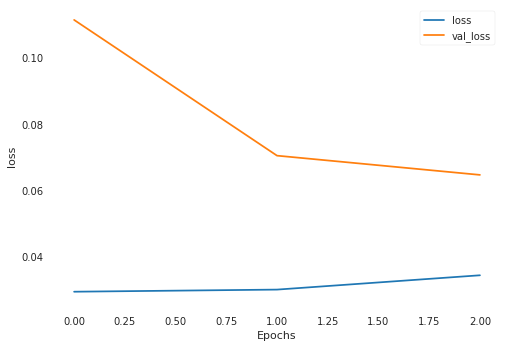

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0315 - val_loss: 0.0554
Epoch 2/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0290 - val_loss: 0.0564
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0256 - val_loss: 0.0510
loss cuts = tf.Tensor([0.88375247], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6142679, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8910715], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62579405, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90411377], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.64659894, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8927436], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62844235, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89022005], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6244477, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.893147

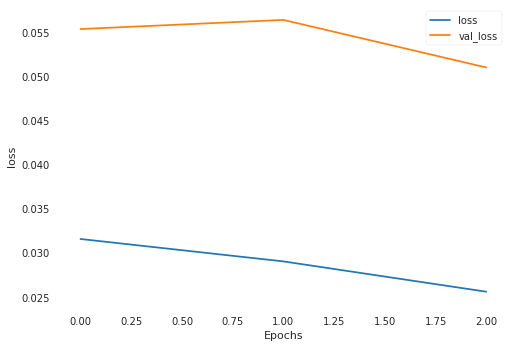

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0259 - val_loss: 0.1206
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0282 - val_loss: 0.0880
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0270 - val_loss: 0.0959
loss cuts = tf.Tensor([0.9383439], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.050806385, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9273302], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.055892713, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9289731], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.055118605, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0839996], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006359578, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9741051], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03596389, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.822

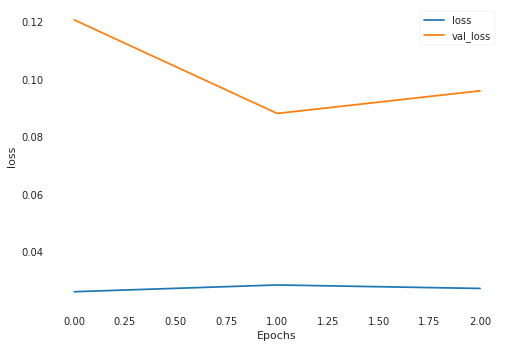

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0250 - val_loss: 0.1582
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0245 - val_loss: 0.1637
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0257 - val_loss: 0.1358
loss cuts = tf.Tensor([1.6773083], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39633814, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4035606], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12659808, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3847731], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11358162, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4080355], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12980248, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3696733], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10363174, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4763426

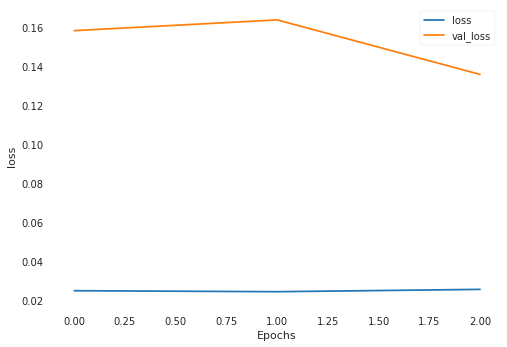

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0253 - val_loss: 0.0494
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0272 - val_loss: 0.0515
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0262 - val_loss: 0.0784
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.0552702], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4188654, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0444944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.385463, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9496608], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1015165, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0765712], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4855769, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.095513], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5456622, shape=(), dtype=float32)
loss cuts =

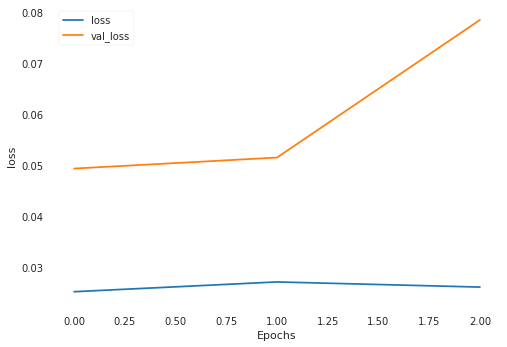

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0246 - val_loss: 0.0636
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0237 - val_loss: 0.0638
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0257 - val_loss: 0.0621
loss cuts = tf.Tensor([1.1862494], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0040641422, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1443601], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011159795, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1353525], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013144051, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98104686], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.072335795, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.24666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1155639e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.

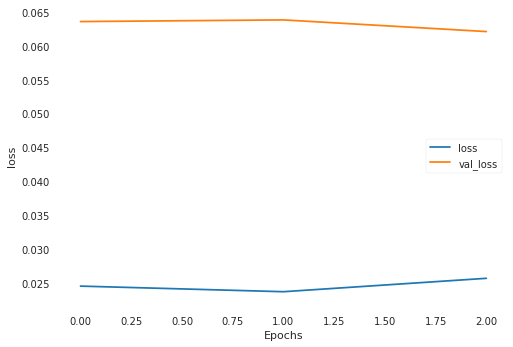

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0256 - val_loss: 0.0674
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0288 - val_loss: 0.0788
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0260 - val_loss: 0.0614
loss cuts = tf.Tensor([0.97000545], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9409106, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.951429], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9052172, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9276376], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8605115, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92136437], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8489123, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5081754], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25824222, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.51622546],

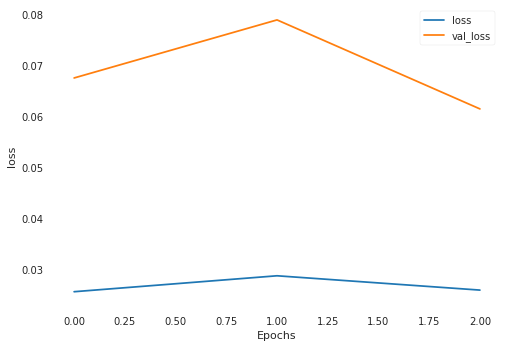

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0246 - val_loss: 0.0317
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0286 - val_loss: 0.0398
Epoch 3/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0245 - val_loss: 0.0399
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.4673165], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19637208, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5341859], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14157875, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64831024], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06872009, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7486824], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026170513, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6941521], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.046787113, shape=(), dtype=float32)
l

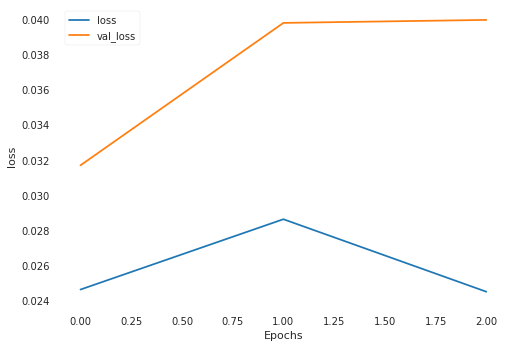

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0220 - val_loss: 0.0547
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0213 - val_loss: 0.0515
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0249 - val_loss: 0.0609
loss cuts = tf.Tensor([0.72510207], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03066073, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3847997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.027291147, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3814754], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.028400548, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39686197], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02345126, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39039686], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.025473164, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4

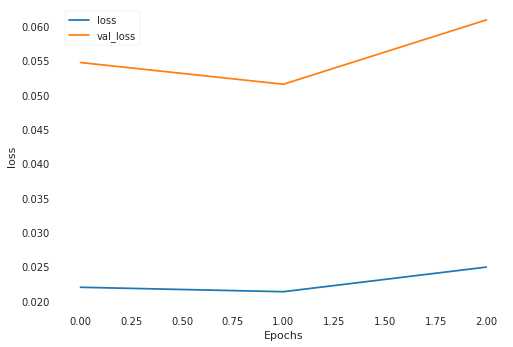

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0309 - val_loss: 0.0636
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0270 - val_loss: 0.1412
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0238 - val_loss: 0.0452
loss cuts = tf.Tensor([0.62843895], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3346005, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.70820785], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4332477, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6155599], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31986666, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60230917], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3050539, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57952595], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28040585, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.620185

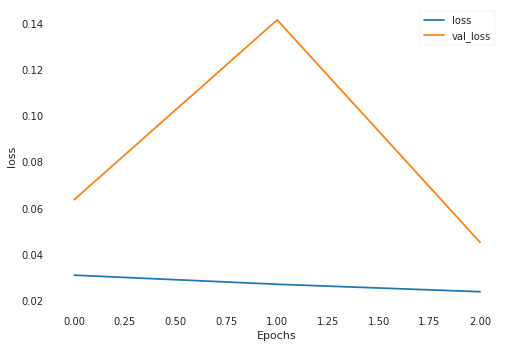

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0222 - val_loss: 0.1072
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0225 - val_loss: 0.0628
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0229 - val_loss: 0.0447
loss cuts = tf.Tensor([0.64584976], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72957265, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66768205], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6927532, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.70746607], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62811005, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7040578], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.63352394, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6936112], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6502629, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.500186

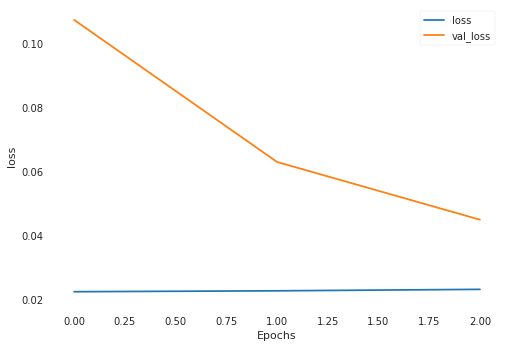

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0266 - val_loss: 0.0848
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0237 - val_loss: 0.0959
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0235 - val_loss: 0.0528
loss cuts = tf.Tensor([0.7353416], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18787576, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6813806], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14400917, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.034595], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5368489, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0480677], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5567733, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0518742], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.56246835, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.009008], s

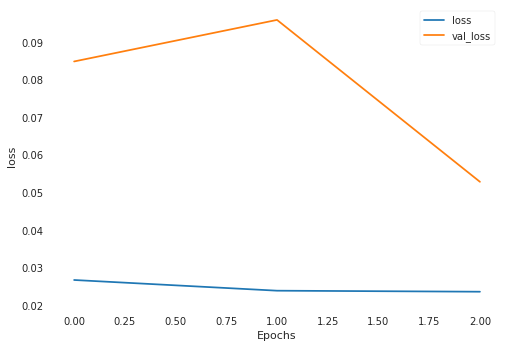

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.0227 - val_loss: 0.0409
Epoch 2/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0227 - val_loss: 0.0487
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0221 - val_loss: 0.0371
loss cuts = tf.Tensor([0.6251539], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005601937, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6047593], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.009070793, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7733687], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0053829704, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4249289], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0756641, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4955876], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.041784428, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.468

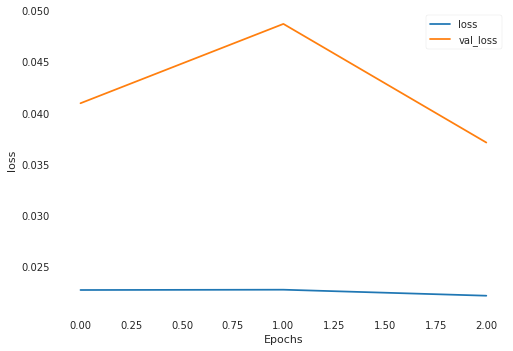

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0248 - val_loss: 0.1169
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0265 - val_loss: 0.1044
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0228 - val_loss: 0.1175
loss cuts = tf.Tensor([0.68029475], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28121254, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6935563], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2954535, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.097555], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8978606, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.128491], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9574448, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0162656], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.75041616, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9378194], s

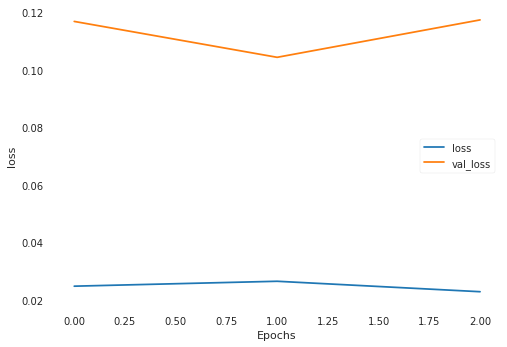

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.0226 - val_loss: 0.0251
Epoch 2/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0237 - val_loss: 0.0791
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0300 - val_loss: 0.0455
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5685375], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3542554, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5858285], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2912185, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5797155], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.313436, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5807208], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3097773, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60462797], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.223361, shape=(), dtype=float32)
loss cuts 

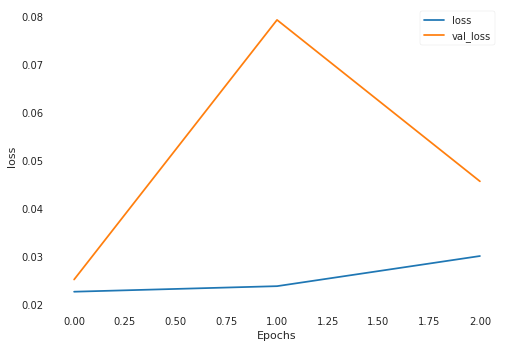

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0241 - val_loss: 0.0492
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0230 - val_loss: 0.0524
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0233 - val_loss: 0.0593
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.9265711], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(26.249527, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.952722], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(25.982244, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7155135], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.45675, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7188046], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.42165, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7234418], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.372221, shape=(), dtype=float32)
loss cuts = 

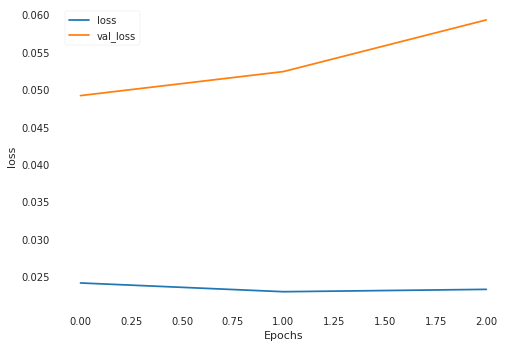

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0242 - val_loss: 0.1276
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0250 - val_loss: 0.1192
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0266 - val_loss: 0.1071
loss cuts = tf.Tensor([0.6789304], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17729963, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7018274], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15854143, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5748497], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27578282, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5776931], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27280453, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63125026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21972634, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.635975

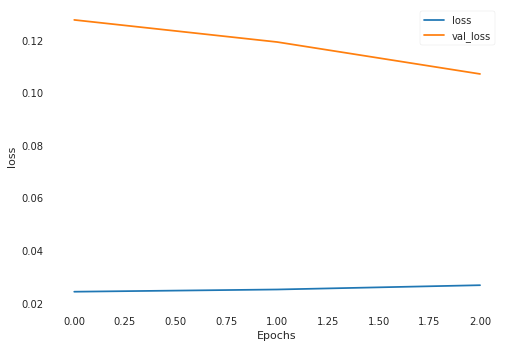

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0256 - val_loss: 0.1301
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0239 - val_loss: 0.1167
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0218 - val_loss: 0.1130
loss cuts = tf.Tensor([0.9398586], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3459277, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9118428], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4117173, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4165841], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4670571, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4245535], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45622784, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.791845], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.711269, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83716446], sh

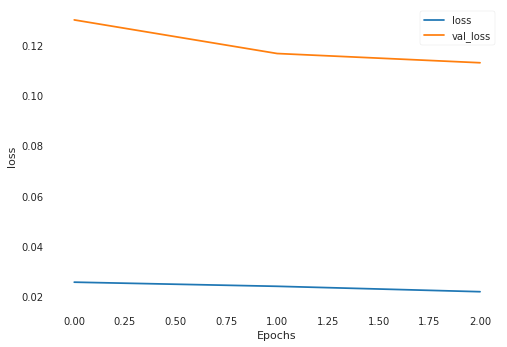

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0215 - val_loss: 0.0253
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0237 - val_loss: 0.0308
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0246 - val_loss: 0.0399
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.60807973], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.79552174, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63029087], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.75639397, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63713574], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.74453473, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53811616], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.92522055, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5091017], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9818795, shape=(), dtype=float32)
l

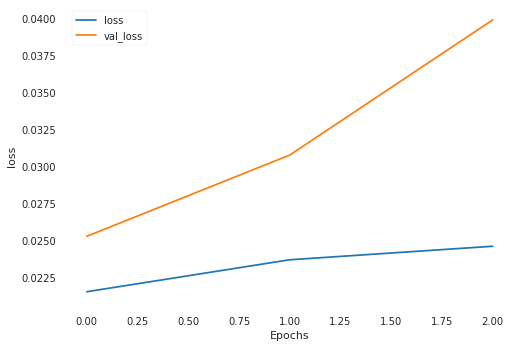

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0313 - val_loss: 0.0946
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0267 - val_loss: 0.0695
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0260 - val_loss: 0.1238
loss cuts = tf.Tensor([0.6576712], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6972437, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73142076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4604406, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71268296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.519575, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.685227], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.607492, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67173606], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6512434, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6778341], sh

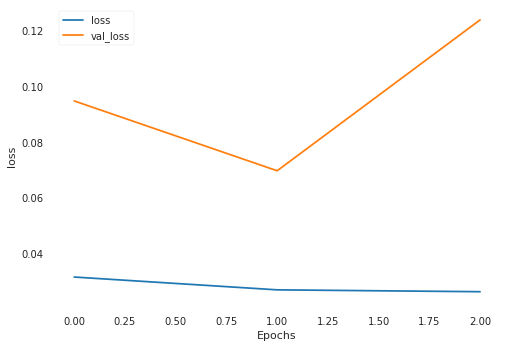

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0456 - val_loss: 0.1434
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0658 - val_loss: 0.0655
Epoch 3/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0322 - val_loss: 0.0464
loss cuts = tf.Tensor([0.33921245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08364383, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35663027], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09402211, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.38678235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11342234, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39570537], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11951219, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4707008], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17698915, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.478

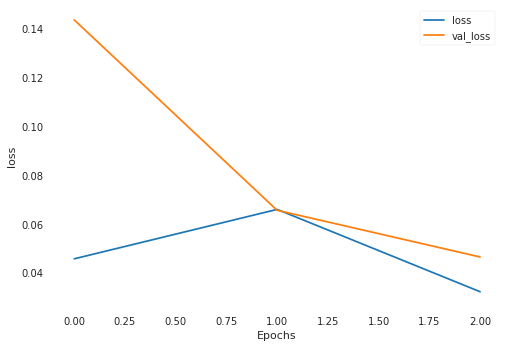

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0252 - val_loss: 0.1061
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0233 - val_loss: 0.1176
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0242 - val_loss: 0.1270
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.81641686], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5873948, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6822428], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39973095, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6679651], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38188088, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6625289], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3751916, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.013808], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9289259, shape=(), dtype=float32)
loss cu

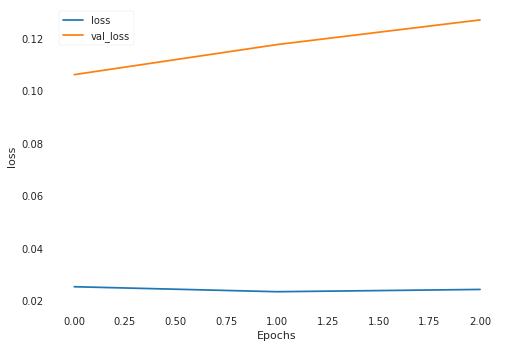

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0236 - val_loss: 0.0599
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0247 - val_loss: 0.0556
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0232 - val_loss: 0.0369
loss cuts = tf.Tensor([2.2172136], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.377773, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9719133], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.411455, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9485784], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3257992, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9630255], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3787017, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0296679], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.628137, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0346503], shape

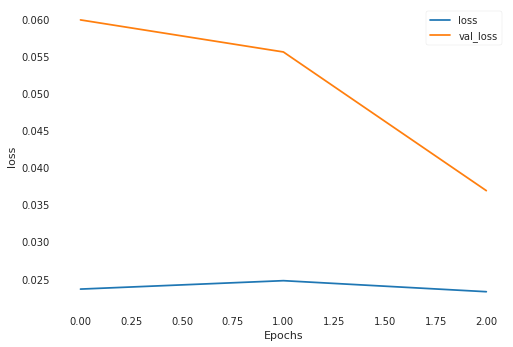

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0221 - val_loss: 0.0430
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0234 - val_loss: 0.0349
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0249 - val_loss: 0.0302
loss cuts = tf.Tensor([1.3764875], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27406532, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2872769], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3754296, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1273806], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5969407, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1222389], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.60491234, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1075383], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62799543, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1746211],

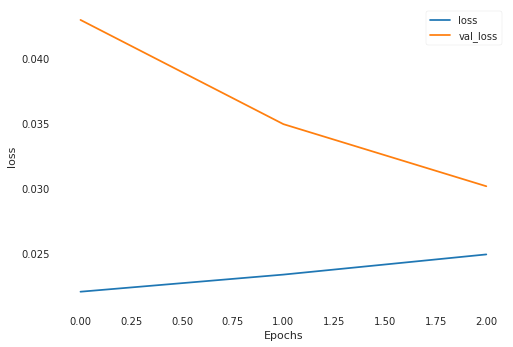

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0274 - val_loss: 0.0450
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0297 - val_loss: 0.0425
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0248 - val_loss: 0.0745
loss cuts = tf.Tensor([1.0545062], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33547807, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9915567], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26651937, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9486768], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22408417, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8727935], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15799986, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8727109], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15793419, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9018606

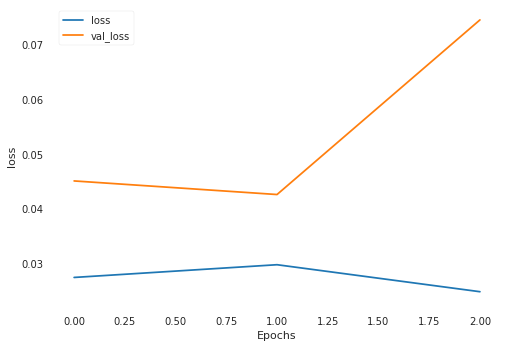

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0231 - val_loss: 0.0377
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0225 - val_loss: 0.0568
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0249 - val_loss: 0.0425
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5182846], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.71293616, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5969744], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8520126, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6073252], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8712283, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5112698], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.70113945, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6383535], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9301144, shape=(), dtype=float32)
loss cu

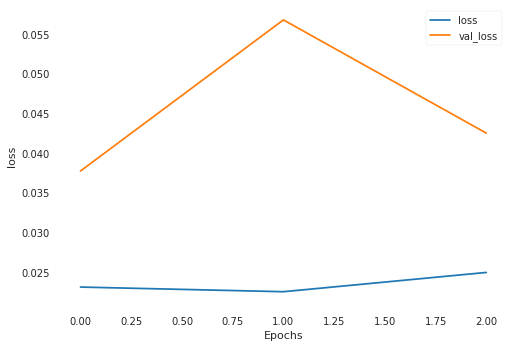

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0265 - val_loss: 0.0458
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0229 - val_loss: 0.0315
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0230 - val_loss: 0.0367
loss cuts = tf.Tensor([0.9116607], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0014699032, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63424045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09970409, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58563393], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13276263, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58040947], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13659716, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58040094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13660346, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5

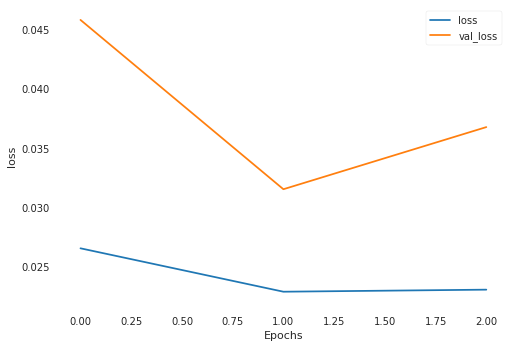

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0233 - val_loss: 0.0366
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0257 - val_loss: 0.0536
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0248 - val_loss: 0.0430
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2661577], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4782903, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2726185], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4940428, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2412236], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4182796, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3119699], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5917904, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3203464], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6129972, shape=(), dtype=float32)
loss cuts

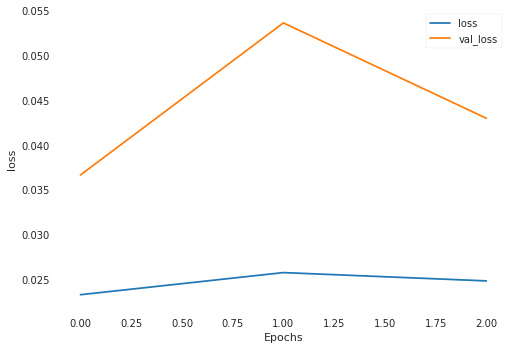

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0222 - val_loss: 0.1025
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0224 - val_loss: 0.1018
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0229 - val_loss: 0.0947
loss cuts = tf.Tensor([0.81308866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.7825813, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8202345], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.7513776, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.818589], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.758554, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7701829], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.9720845, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.768579], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.9792395, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7747341], shap

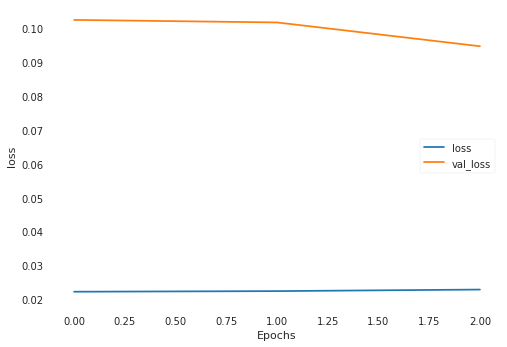

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0225 - val_loss: 0.0576
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0238 - val_loss: 0.0574
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0246 - val_loss: 0.0489
loss cuts = tf.Tensor([0.79513013], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.058480475, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.752609], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.039722983, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.75740933], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.041659493, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76284283], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04390704, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0842245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28187785, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.07

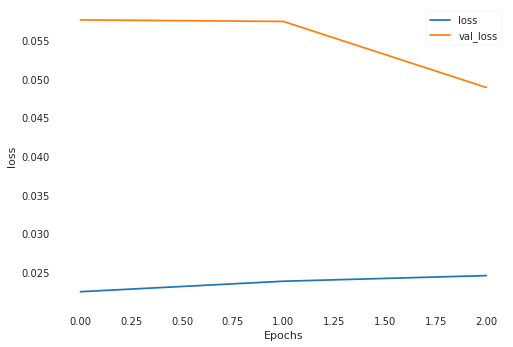

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0247 - val_loss: 0.0992
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0275 - val_loss: 0.1154
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0236 - val_loss: 0.1083
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.79318017], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24392553, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8006656], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25137553, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80115134], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25186276, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88273776], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34040898, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87232006], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32836118, shape=(), dtype=float32)


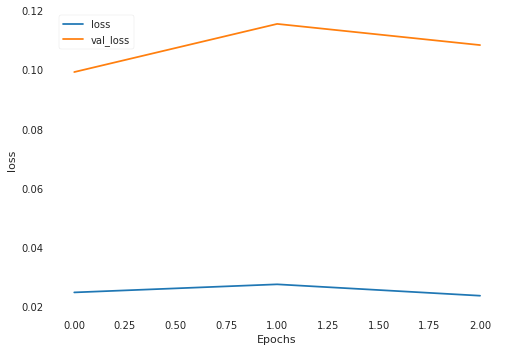

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0222 - val_loss: 0.3433
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0265 - val_loss: 0.3071
Epoch 3/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0238 - val_loss: 0.2712
loss cuts = tf.Tensor([1.1519196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.443815, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1845131], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.2927837, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2208463], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.1269264, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2522838], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.985549, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2568691], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.965094, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.254295], shape=

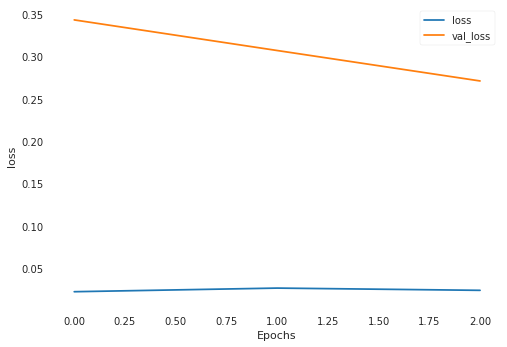

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0228 - val_loss: 0.0789
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0239 - val_loss: 0.0721
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0233 - val_loss: 0.0609
loss cuts = tf.Tensor([0.9156165], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.7715306, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8898718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.884666, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8844062], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.908856, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9034401], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.8248754, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89855164], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.846374, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89913696], sha

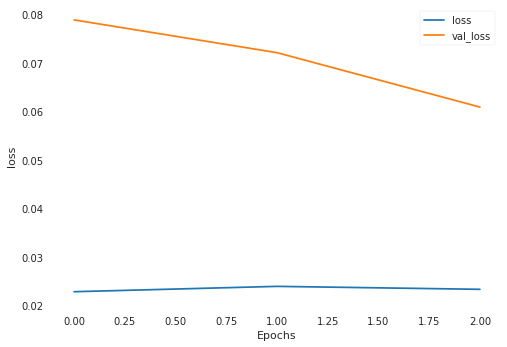

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0219 - val_loss: 0.0720
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0221 - val_loss: 0.0692
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0224 - val_loss: 0.0636
loss cuts = tf.Tensor([1.1301088], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3686452, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1948518], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2213526, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1348088], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3576704, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1387398], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.348525, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1336844], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.360292, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1650815], shap

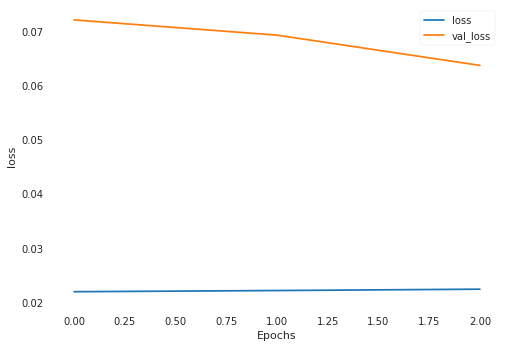

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0224 - val_loss: 0.0460
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0241 - val_loss: 0.0808
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0244 - val_loss: 0.0719
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.7242602], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0057365173, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72080797], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0062713795, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71577513], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0070938305, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7126698], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0076265675, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7379775], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0038467913, shape=(), dtype=f

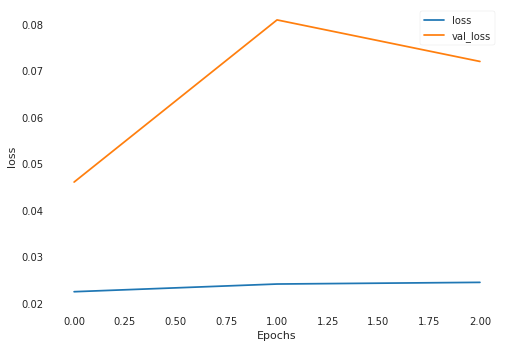

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0283 - val_loss: 0.4593
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0245 - val_loss: 0.4457
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0245 - val_loss: 0.4285
loss cuts = tf.Tensor([0.7000778], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.879796, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65463054], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.1951475, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.79193246], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.255039, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78998196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.268132, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7973617], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.218642, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0992174]

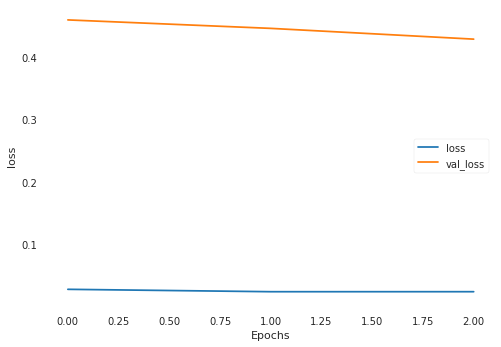

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0277 - val_loss: 0.2973
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0286 - val_loss: 0.2247
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0277 - val_loss: 0.2325
loss cuts = tf.Tensor([2.2551491], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19017698, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2858891], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16431092, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0817695], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37145674, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0290687], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43847343, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9635305], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.52956396, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.102443]

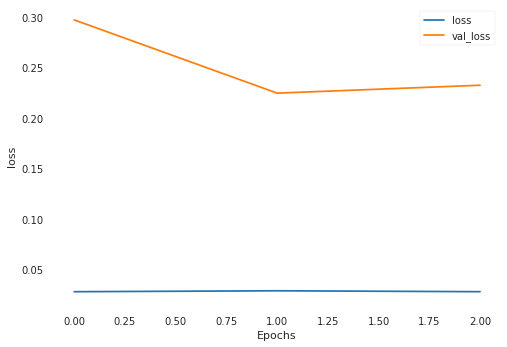

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0248 - val_loss: 0.6389
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0221 - val_loss: 0.3885
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0228 - val_loss: 0.3140
loss cuts = tf.Tensor([1.5149449], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23426197, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5494528], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2688568, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5303564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.249418, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5235317], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2426478, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.615279], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3414535, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6028452], sha

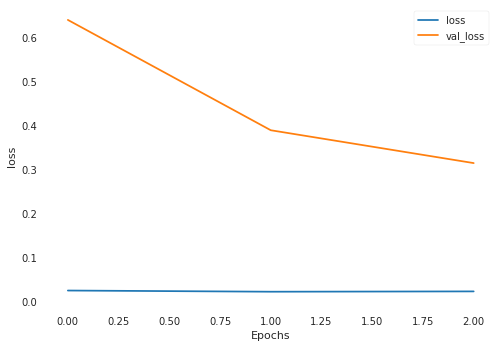

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0770 - val_loss: 0.1498
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0635 - val_loss: 0.0682
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0325 - val_loss: 0.0539
loss cuts = tf.Tensor([1.0144455], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.66332155, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92180306], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.52099967, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9382795], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.54505664, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92888665], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.53127575, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89178115], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47856116, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8989

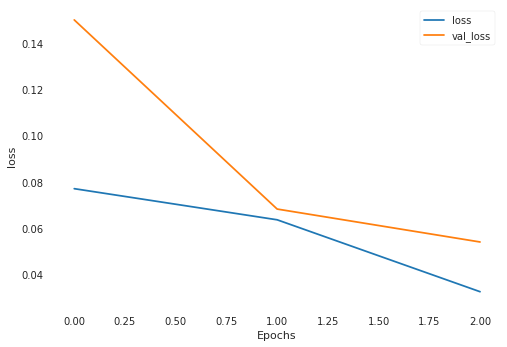

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0267 - val_loss: 0.1706
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0236 - val_loss: 0.1685
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0232 - val_loss: 0.1817
loss cuts = tf.Tensor([0.7441915], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015005739, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8210471], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.039741825, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0006015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14357121, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8400303], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.047670916, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82258093], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.040355716, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82

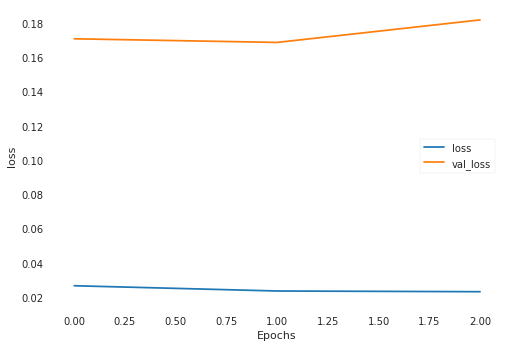

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0222 - val_loss: 0.2348
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0219 - val_loss: 0.2521
Epoch 3/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0265 - val_loss: 0.2541
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1910138], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9674566, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1665221], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.065624, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2534587], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7225943, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1546066], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.113817, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1922841], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9623976, shape=(), dtype=float32)
loss cuts =

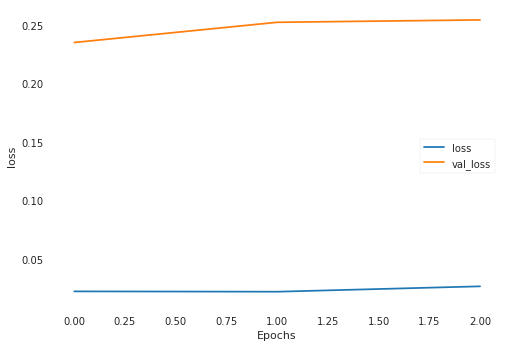

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0255 - val_loss: 0.0808
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0253 - val_loss: 0.0860
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0269 - val_loss: 0.1086
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5942131], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.025553739, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6297919], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015444668, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6466902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0115301, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6228717], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0172126, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.610624], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.020576319, shape=(), dtype=float32)
loss

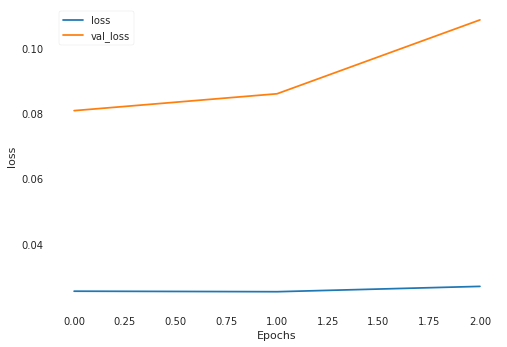

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0262 - val_loss: 0.1128
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0233 - val_loss: 0.1045
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0240 - val_loss: 0.0794
loss cuts = tf.Tensor([1.0677493], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9365386, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98473996], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.78276473, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9993504], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.80883116, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0292507], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8635069, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.79101014], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47749498, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7835263

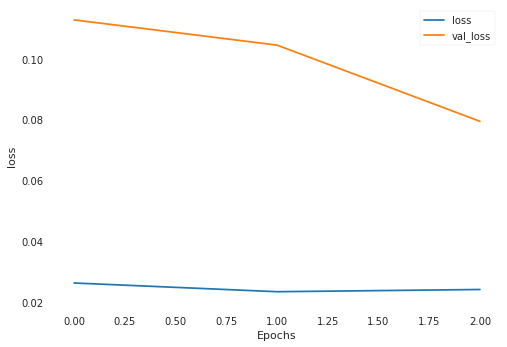

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0230 - val_loss: 0.1043
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0232 - val_loss: 0.1322
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0254 - val_loss: 0.1648
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.6017884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9059012, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7629975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2387635, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6405374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.98116434, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4333477], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.61363363, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3417674], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4785422, shape=(), dtype=float32)
loss cu

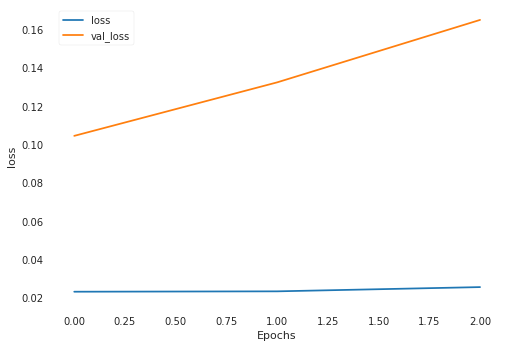

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0335 - val_loss: 0.0477
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0244 - val_loss: 0.0663
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0230 - val_loss: 0.0551
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5609123], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15138932, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4949253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20709306, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5761707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1397484, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5442421], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16463947, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5231583], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18219386, shape=(), dtype=float32)
loss 

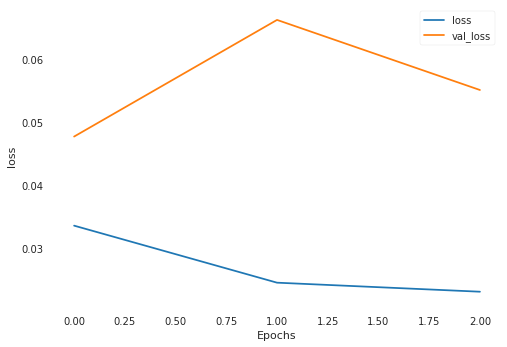

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0230 - val_loss: 0.0618
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0222 - val_loss: 0.0671
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0267 - val_loss: 0.0907
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.6334003], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5151185, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5726063], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3691515, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.545677], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3068562, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5438509], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3026845, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6586509], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5779179, shape=(), dtype=float32)
loss cuts 

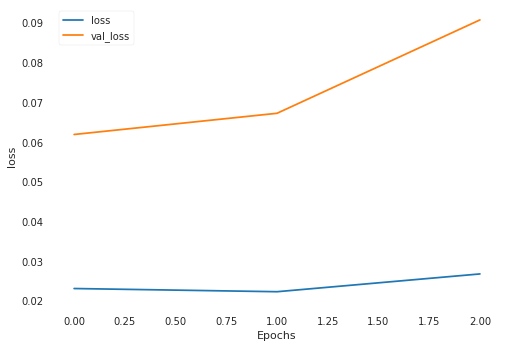

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0361 - val_loss: 0.1727
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0487 - val_loss: 0.1643
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0286 - val_loss: 0.1746
loss cuts = tf.Tensor([1.5306542], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08883205, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5093274], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.101999655, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4599457], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13598068, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.410342], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17502448, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.458849], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13679072, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4702768]

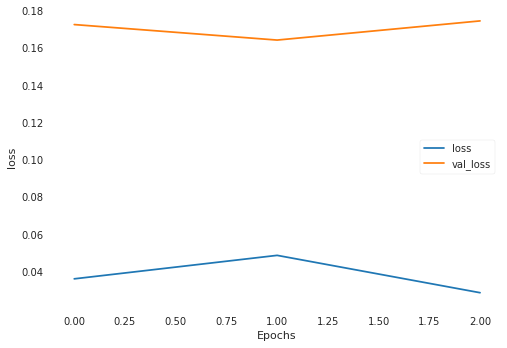

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0246 - val_loss: 0.1258
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0219 - val_loss: 0.1389
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0224 - val_loss: 0.1760
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6642183], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08534906, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6376913], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.101552226, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65102124], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09323415, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6911368], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07034543, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6874469], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07231636, shape=(), dtype=float32)
lo

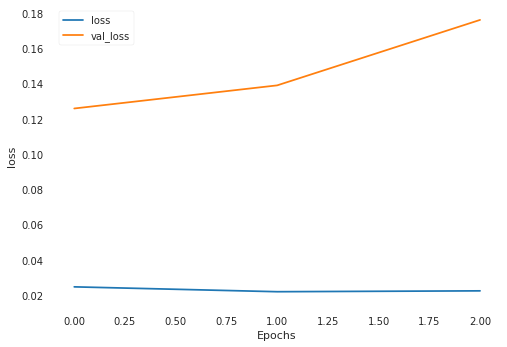

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.1135 - val_loss: 0.2627
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.1208 - val_loss: 0.1605
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0559 - val_loss: 0.0590
loss cuts = tf.Tensor([0.6170661], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6129855, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.62116814], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.606579, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78069997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3835325, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.75385845], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4174989, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.70287657], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48598105, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6981013]

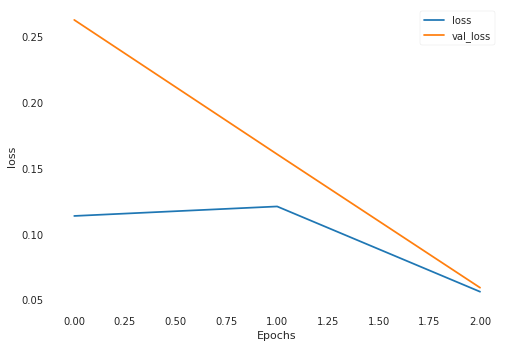

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0361 - val_loss: 0.0618
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0285 - val_loss: 0.0576
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0256 - val_loss: 0.0524
loss cuts = tf.Tensor([0.8905426], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47625044, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89090836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47675538, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8917495], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47791767, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2949469], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1979593, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2571324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1166123, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.252808],

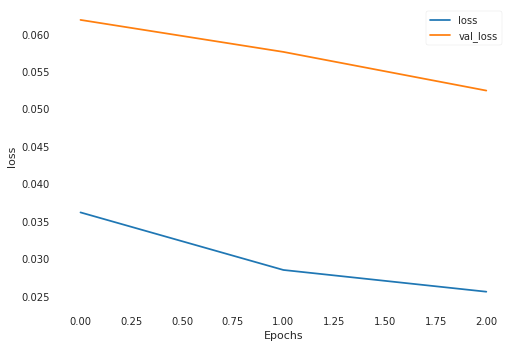

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0244 - val_loss: 0.1152
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0247 - val_loss: 0.1196
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0250 - val_loss: 0.1242
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.33778742], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5319016, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.33869904], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5296458, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.34166962], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5223064, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.42199576], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3305432, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.41943473], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3364581, shape=(), dtype=float32)
loss

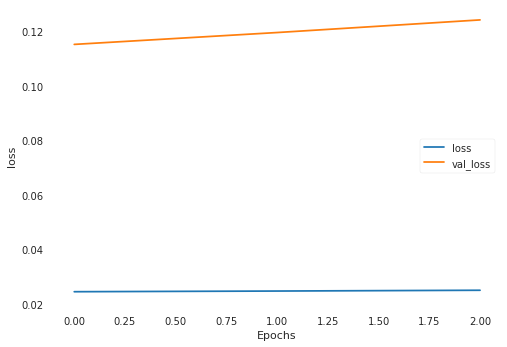

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 418us/sample - loss: 0.0273 - val_loss: 0.0605
Epoch 2/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0278 - val_loss: 0.0607
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0261 - val_loss: 0.0836
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.70806795], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012533973, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6521119], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.028194202, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6026219], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04726331, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6101888], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.044030473, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63001907], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03610156, shape=(), dtype=float32)

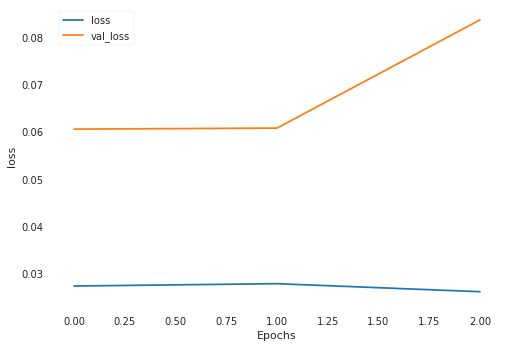

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0237 - val_loss: 0.1361
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0233 - val_loss: 0.1122
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0234 - val_loss: 0.1031
loss cuts = tf.Tensor([1.1689471], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2520428, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2078141], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3405336, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.199722], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3218609, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1903138], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3003157, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.197499], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3167541, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2022258], shap

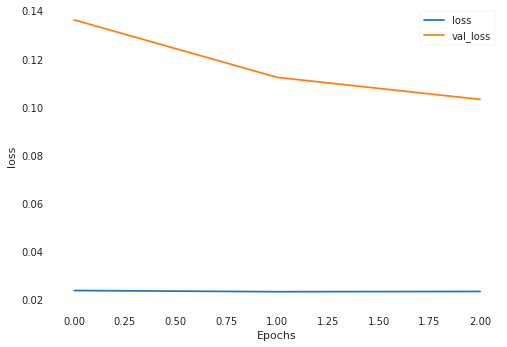

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0237 - val_loss: 0.1306
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0234 - val_loss: 0.0984
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0215 - val_loss: 0.0961
loss cuts = tf.Tensor([1.4760662], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0020837488, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6128652], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.008308483, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5869175], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004251456, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6088833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0075984225, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.545776], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0005789644, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.

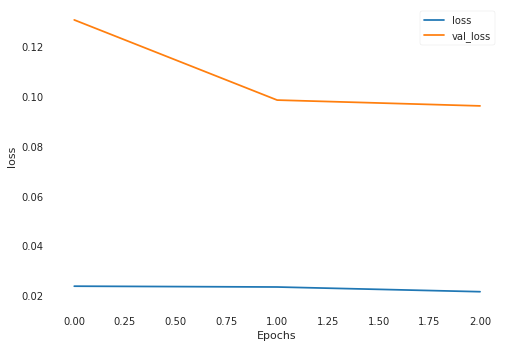

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0211 - val_loss: 0.0742
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0265 - val_loss: 0.0917
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0251 - val_loss: 0.0762
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1919199], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24198522, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1869136], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23708488, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1630921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21445434, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77794045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006074716, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7090777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.240514e-05, shape=(), dtype=float32)


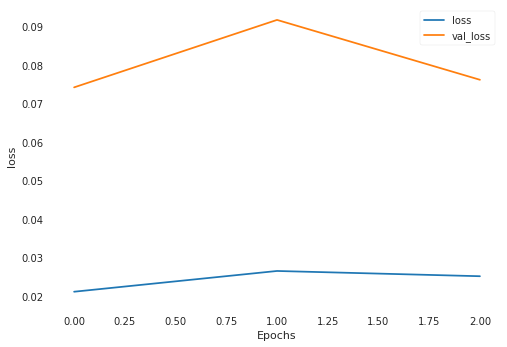

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0249 - val_loss: 0.0457
Epoch 2/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0259 - val_loss: 0.0480
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0263 - val_loss: 0.0641
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.96986127], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.113283, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0792727], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.429366, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0828133], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.407635, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93224233], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.353965, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9399965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.304123, shape=(), dtype=float32)
loss cuts

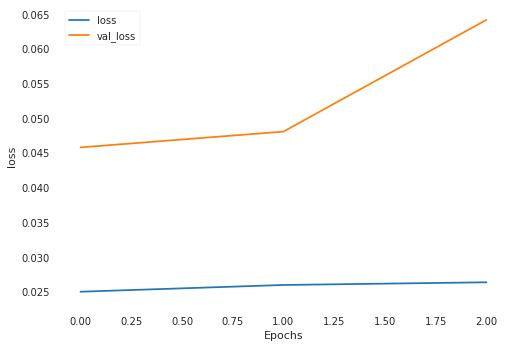

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0261 - val_loss: 0.0883
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0230 - val_loss: 0.0791
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0239 - val_loss: 0.0760
loss cuts = tf.Tensor([1.1820103], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02283169, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2110637], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03245584, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2373054], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.042599596, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2385274], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04310553, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2594719], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05224113, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.258060

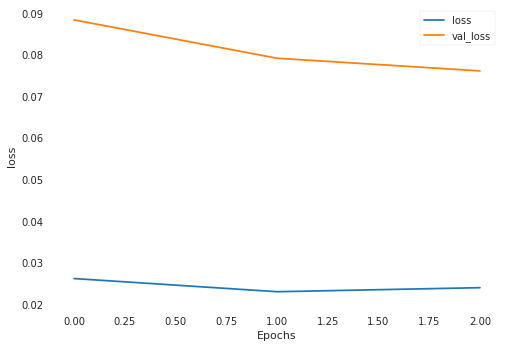

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0231 - val_loss: 0.0378
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0238 - val_loss: 0.0541
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0244 - val_loss: 0.0317
loss cuts = tf.Tensor([0.9602678], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.909483, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78808993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(25.622934, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6378578], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(27.166424, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4676937], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.96922, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48656976], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.766382, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5330644], s

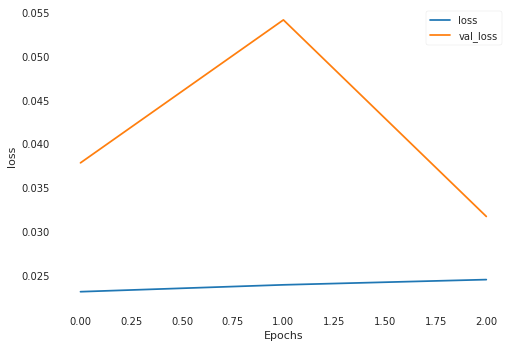

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0215 - val_loss: 0.0684
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0207 - val_loss: 0.0870
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0221 - val_loss: 0.0752
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.100862], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9516365, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2411175], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2449517, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4419005], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7333225, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.401006], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6273149, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1801476], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1126119, shape=(), dtype=float32)
loss cuts =

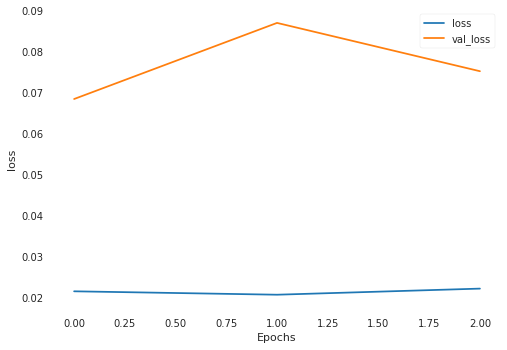

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0230 - val_loss: 0.4624
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0233 - val_loss: 0.5127
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0245 - val_loss: 0.4897
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6241163], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.306399, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6967287], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.8931212, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82260025], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.201701, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8263418], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.1816325, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82708883], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.1776295, shape=(), dtype=float32)
loss cuts

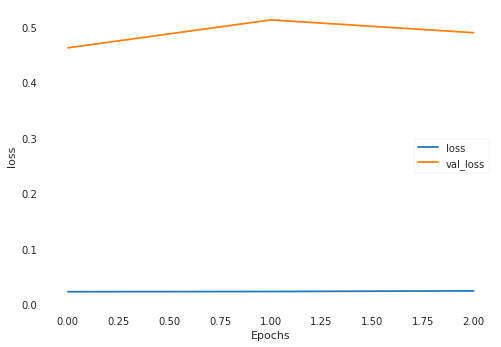

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0289 - val_loss: 0.2026
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0303 - val_loss: 0.1724
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0300 - val_loss: 0.2633
loss cuts = tf.Tensor([0.47215876], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.685321, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3961347], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8169723, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39872584], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.81229496, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.41476876], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.78363425, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.42028844], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.77389234, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.411731

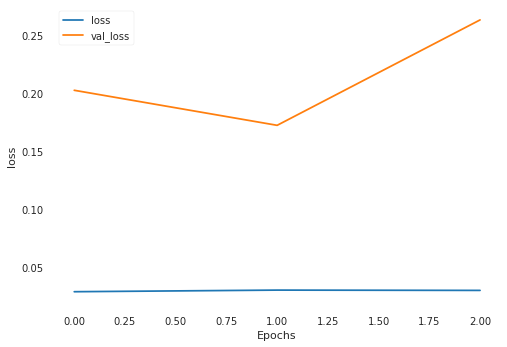

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0250 - val_loss: 0.1406
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0209 - val_loss: 0.1535
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0211 - val_loss: 0.1637
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6090722], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.985468, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58981305], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.14919, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58140624], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.220894, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55901957], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.412512, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5695132], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.322565, shape=(), dtype=float32)
loss cu

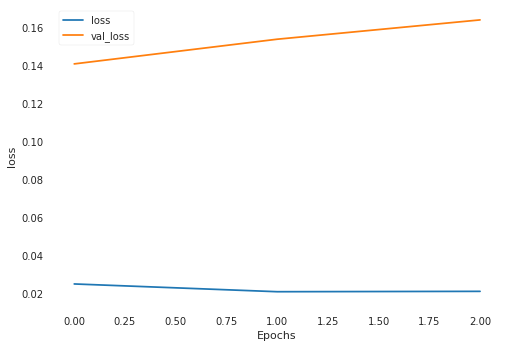

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0227 - val_loss: 0.4207
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0250 - val_loss: 0.4060
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0254 - val_loss: 0.4678
loss cuts = tf.Tensor([1.0998712], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6397939, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0126511], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50787157, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0792403], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.60721546, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0874306], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6200469, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2052562], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8194888, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3303683], 

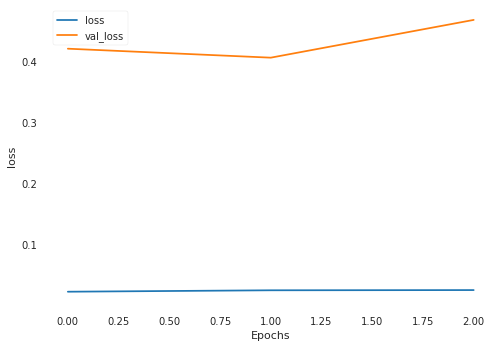

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0240 - val_loss: 0.1641
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0229 - val_loss: 0.0675
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0235 - val_loss: 0.1170
loss cuts = tf.Tensor([1.2893761], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.8868575, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2652359], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.9941707, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2334177], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.137395, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2324781], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.1416554, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2144316], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.223822, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2712986], shap

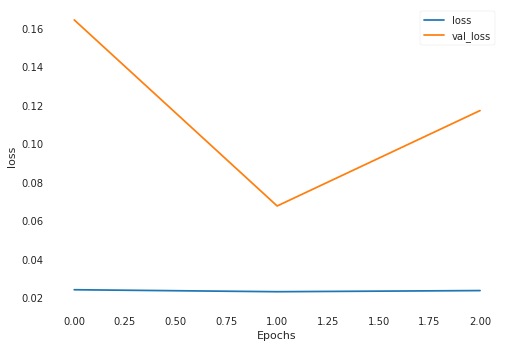

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0247 - val_loss: 0.1041
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0250 - val_loss: 0.0937
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0231 - val_loss: 0.1029
loss cuts = tf.Tensor([0.9856376], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(30.408192, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9739033], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(30.537746, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97460145], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(30.530031, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91676897], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.172468, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91784894], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.16041, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91349864],

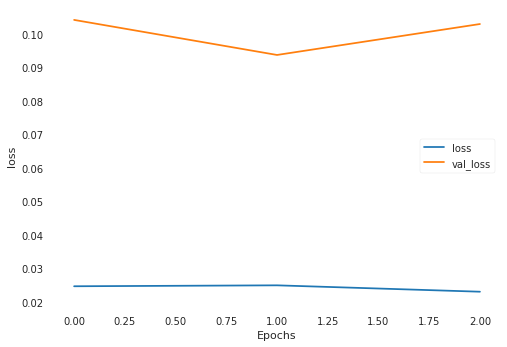

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0249 - val_loss: 0.0817
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0237 - val_loss: 0.0542
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0221 - val_loss: 0.0330
loss cuts = tf.Tensor([1.5218387], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(36.33873, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5148039], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(36.423595, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5374548], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(36.150703, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5240123], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(36.312527, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5199565], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(36.361427, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5004494], sha

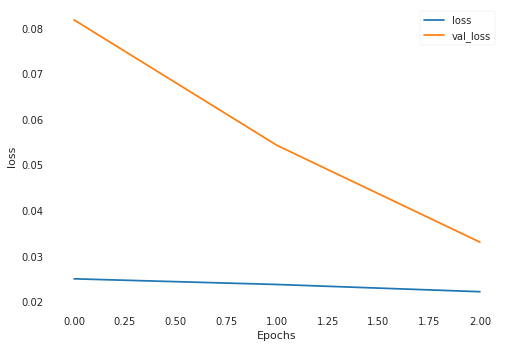

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0220 - val_loss: 0.4129
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0245 - val_loss: 0.3567
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0292 - val_loss: 0.4482
loss cuts = tf.Tensor([0.7859432], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.4265375, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8301825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.156842, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6798475], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.089279, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67757857], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.103697, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6817057], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.077477, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6635045], sh

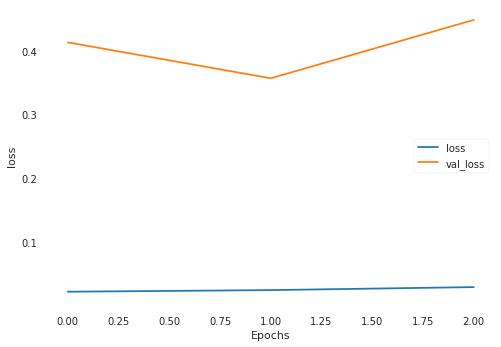

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0262 - val_loss: 0.1408
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0287 - val_loss: 0.0935
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0275 - val_loss: 0.0765
loss cuts = tf.Tensor([0.94372857], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.79875076, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.84954655], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.63927466, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80205864], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.56559217, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.85289466], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.64463985, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78990823], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5474642, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.911

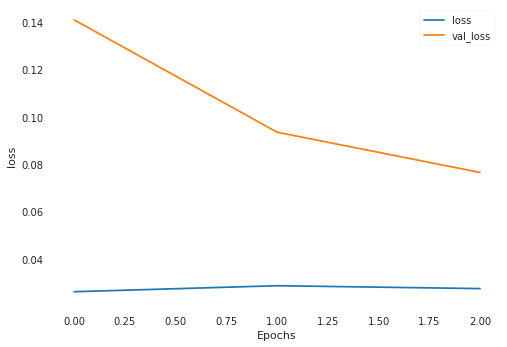

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0296 - val_loss: 0.0781
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0280 - val_loss: 0.0784
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0244 - val_loss: 0.0541
loss cuts = tf.Tensor([1.1240582], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(33.361504, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.168871], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(32.84584, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3905377], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(30.354176, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2666582], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.734539, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1780244], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(32.74101, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2293898], shape

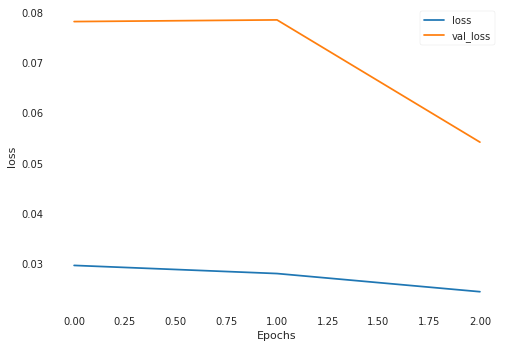

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0256 - val_loss: 0.2008
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0233 - val_loss: 0.3530
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0221 - val_loss: 0.2389
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3837185], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.053322982, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3749995], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.049372274, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3848565], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05384983, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.384999], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.053916022, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8121386], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11605072, shape=(), dtype=float32)
lo

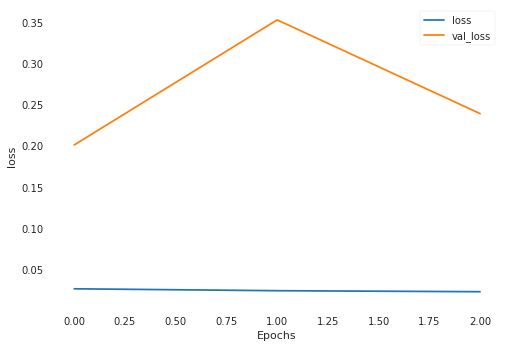

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0237 - val_loss: 0.1605
Epoch 2/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0302 - val_loss: 0.1589
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0271 - val_loss: 0.1564
loss cuts = tf.Tensor([0.3887753], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48708388, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39827394], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4739156, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.38258198], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49576706, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.38901412], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48675054, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3700893], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5135155, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.359426

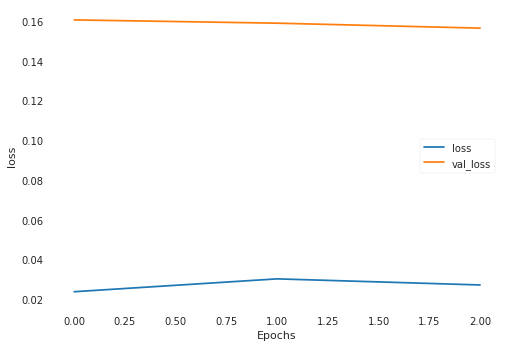

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0256 - val_loss: 0.0979
Epoch 2/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0227 - val_loss: 0.0908
Epoch 3/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0249 - val_loss: 0.0470
loss cuts = tf.Tensor([2.3217456], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.0477552, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3817718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.3210826, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3742719], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.286538, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9554402], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.535963, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9665732], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5779567, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.955708], shape

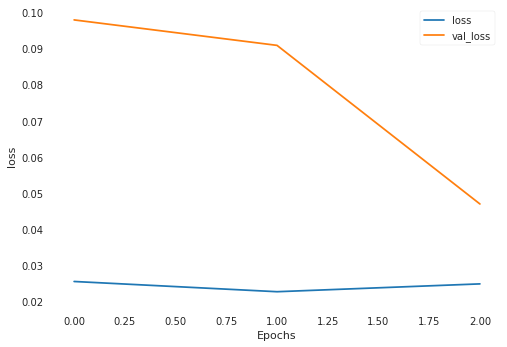

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0243 - val_loss: 0.1067
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0257 - val_loss: 0.1993
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0693 - val_loss: 0.1747
Epoch 00003: early stopping
loss cuts = tf.Tensor([3.8789928], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(13.905387, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.007324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.878949, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.351242], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.845466, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3027358], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3287998, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3091943], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3437315, shape=(), dtype=float32)
loss cuts = 

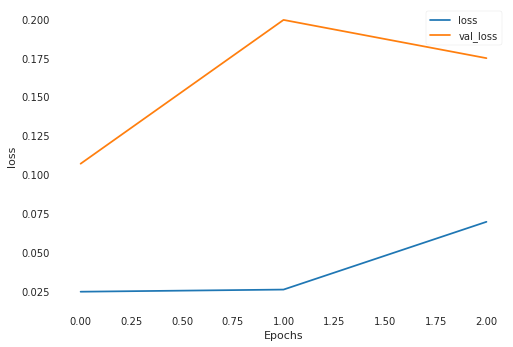

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0449 - val_loss: 0.1475
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0322 - val_loss: 0.1212
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0253 - val_loss: 0.1290
loss cuts = tf.Tensor([1.1022376], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8164637, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5286401], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6916244, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.31485957], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.5588245, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.322886], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.5246143, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3418116], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.4444585, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.34316823], s

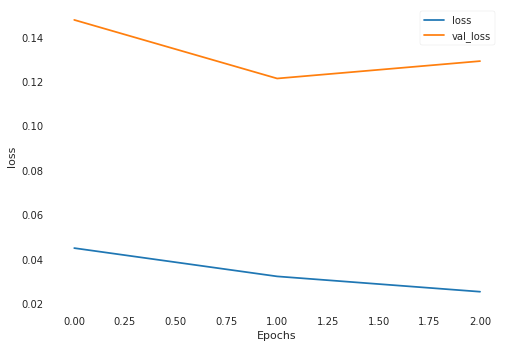

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0240 - val_loss: 0.0975
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0227 - val_loss: 0.1226
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0230 - val_loss: 0.1300
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5548223], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.002395573, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.34937644], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06471451, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.25781292], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11968417, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.25728524], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12004956, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.24986678], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1252453, shape=(), dtype=float32)


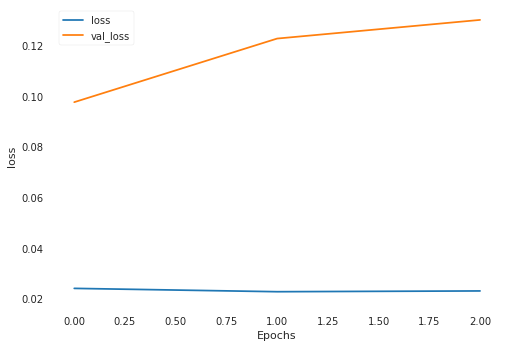

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0226 - val_loss: 0.1044
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0233 - val_loss: 0.1176
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0250 - val_loss: 0.0683
loss cuts = tf.Tensor([0.75597954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1552521, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78532183], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13299015, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7877239], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13124396, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7912303], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12871566, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71776867], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1868239, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.717634

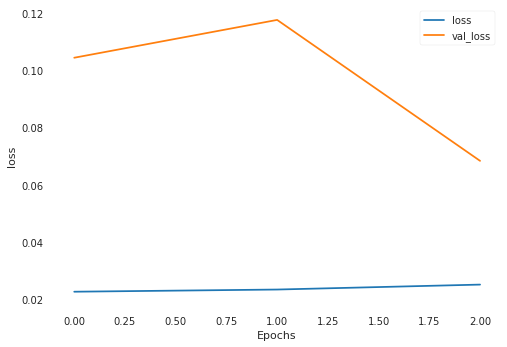

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0279 - val_loss: 0.1587
Epoch 2/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0270 - val_loss: 0.2203
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0242 - val_loss: 0.1751
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.0530849], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2592642, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1696777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.623356, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0594974], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2785823, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.072571], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3182228, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.091601], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3765335, shape=(), dtype=float32)
loss cuts = 

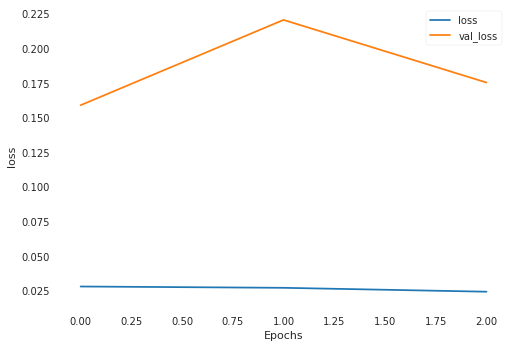

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0224 - val_loss: 0.2856
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0244 - val_loss: 0.4088
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0236 - val_loss: 0.4325
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3222163], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.43341, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5485547], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.1700506, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6433011], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.6716237, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5881778], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.959424, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6010914], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.891456, shape=(), dtype=float32)
loss cuts = t

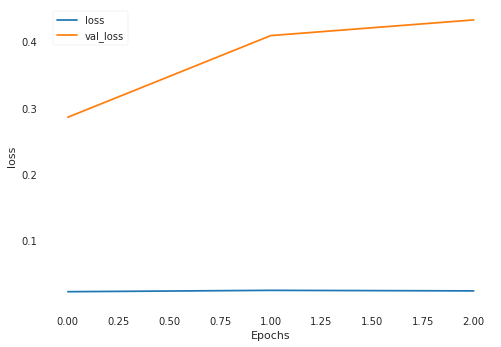

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0246 - val_loss: 0.3592
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0327 - val_loss: 0.1876
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0301 - val_loss: 0.2142
loss cuts = tf.Tensor([1.2647166], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.038048223, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2735754], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04158269, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2704895], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04033364, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2852799], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.046493184, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2887175], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04798747, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.28671

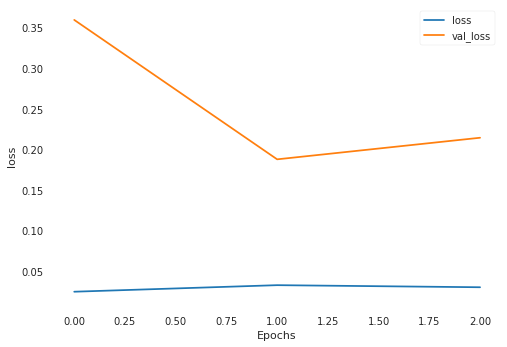

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0290 - val_loss: 0.2217
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0238 - val_loss: 0.1924
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0217 - val_loss: 0.2065
loss cuts = tf.Tensor([0.49415547], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.088835, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.85767317], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.580901, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8208958], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.721443, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.788386], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8479295, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7858238], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.857988, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7880653], shape

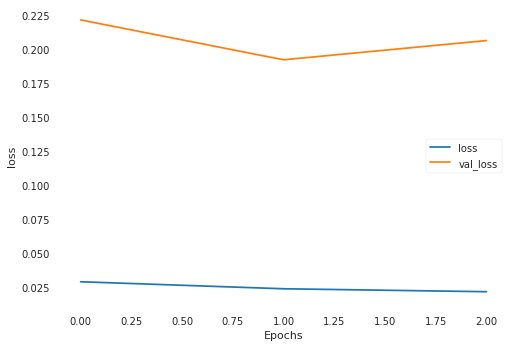

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0229 - val_loss: 0.1398
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0275 - val_loss: 0.6533
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0278 - val_loss: 0.1882
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.8053561], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9893163, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8652396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.87377685, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5462213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.571961, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5044056], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6785647, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4428282], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8419152, shape=(), dtype=float32)
loss cuts

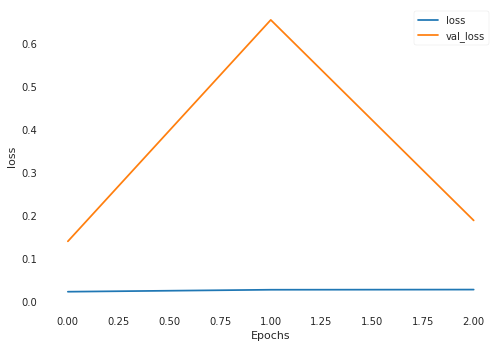

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0518 - val_loss: 0.3251
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0390 - val_loss: 0.2691
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0304 - val_loss: 0.2608
loss cuts = tf.Tensor([1.5949268], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48292333, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5237842], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38910672, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6399724], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.54755926, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6634033], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5827846, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6472068], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.558318, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6438235], 

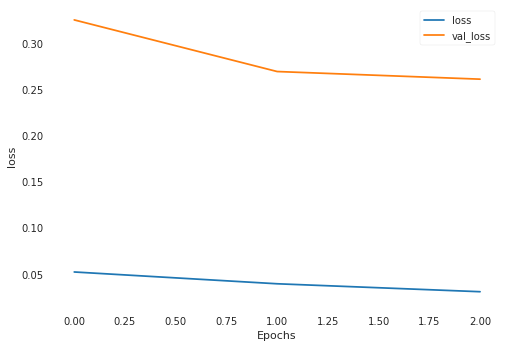

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0303 - val_loss: 0.1877
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0239 - val_loss: 0.2008
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0220 - val_loss: 0.2202
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5127921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2844658, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6125144], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.932955, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3249269], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.000699, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5247014], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.241441, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.84634614], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.144229, shape=(), dtype=float32)
loss cuts = 

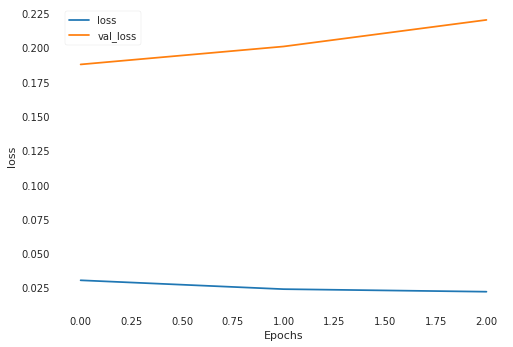

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0245 - val_loss: 0.1237
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0246 - val_loss: 0.1021
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0244 - val_loss: 0.0833
loss cuts = tf.Tensor([2.0196745], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.84580123, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8729724], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.59748626, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7120868], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3746502, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7039642], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36477277, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7713323], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.450687, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7687533], 

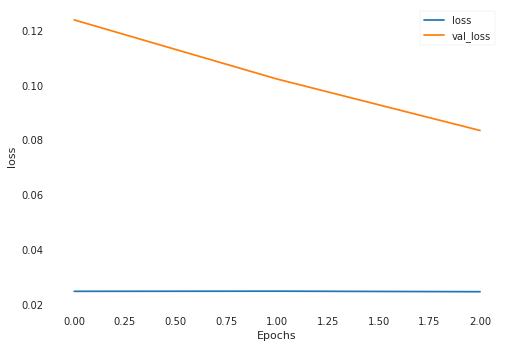

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0235 - val_loss: 0.0986
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0229 - val_loss: 0.0911
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0282 - val_loss: 0.1107
loss cuts = tf.Tensor([1.6007565], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.404846, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2808104], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5148942, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1759893], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.267852, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0387319], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9775908, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1807688], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2786382, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0020102], shap

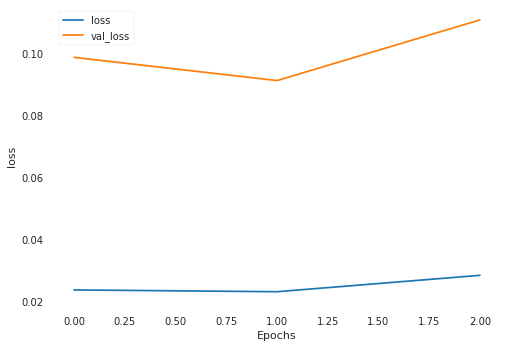

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0264 - val_loss: 0.0618
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0248 - val_loss: 0.1266
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0242 - val_loss: 0.0728
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1897086], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2632739, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1801877], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25359416, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2060134], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28027186, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0804024], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16305122, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2543685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33380914, shape=(), dtype=float32)
loss 

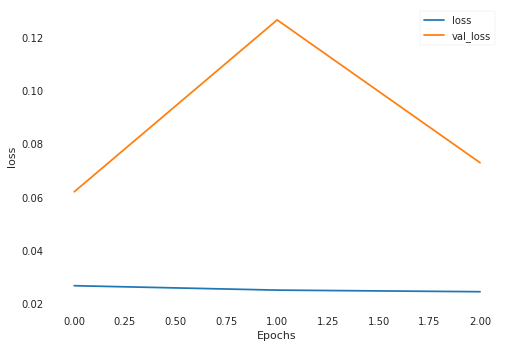

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0275 - val_loss: 0.1009
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0250 - val_loss: 0.0861
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0240 - val_loss: 0.0928
loss cuts = tf.Tensor([1.0652324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7053908, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8035639], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3343233, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78078026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30849507, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82116926], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35499233, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8238921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35824436, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8408954

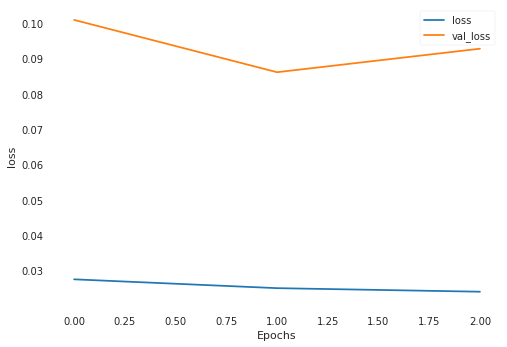

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0249 - val_loss: 0.0573
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0288 - val_loss: 0.1035
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0282 - val_loss: 0.1071
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.9296579], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28053743, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7562905], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12694292, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78436345], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14773525, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3925185], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.98509306, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5336626], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2851908, shape=(), dtype=float32)
loss

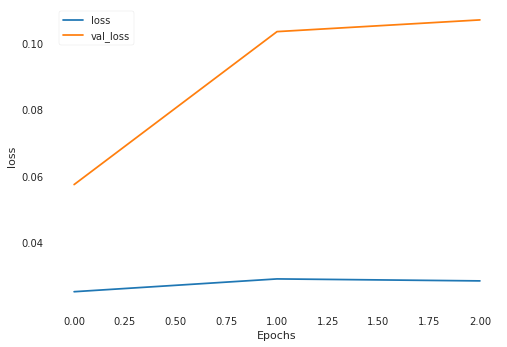

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0242 - val_loss: 0.1095
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0209 - val_loss: 0.1637
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0221 - val_loss: 0.0492
loss cuts = tf.Tensor([1.9910467], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.5646605, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0970254], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.0758944, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1419642], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.8754215, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1261992], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.945289, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1660306], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.7697215, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5764492], sha

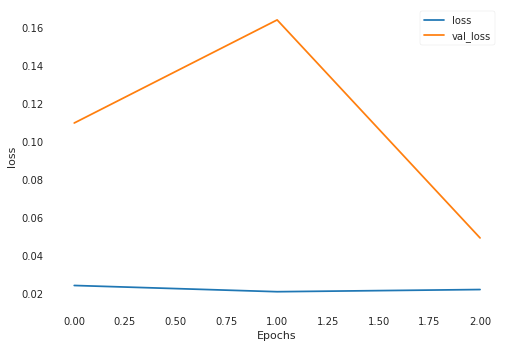

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 433us/sample - loss: 0.0265 - val_loss: 0.1173
Epoch 2/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0267 - val_loss: 0.0831
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0247 - val_loss: 0.1281
loss cuts = tf.Tensor([1.2700756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15312164, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0607823], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.033129223, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0683798], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03595263, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0726621], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03759494, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.075203], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0385867, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.986837],

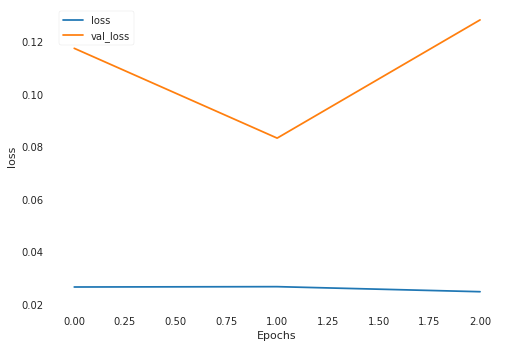

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 418us/sample - loss: 0.0287 - val_loss: 0.1096
Epoch 2/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0296 - val_loss: 0.0604
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0255 - val_loss: 0.0986
loss cuts = tf.Tensor([0.600982], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.040240765, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6060687], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.042307418, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5939177], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.037456464, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.59273434], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.036999807, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.573836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.030086648, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.544

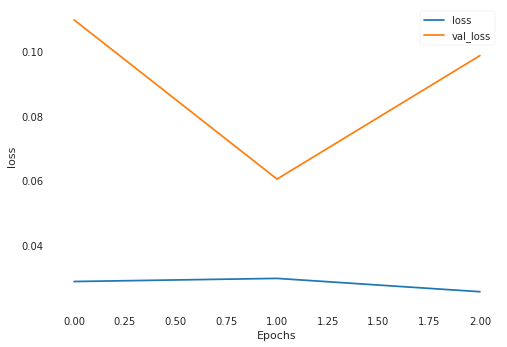

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 423us/sample - loss: 0.0222 - val_loss: 0.4046
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0218 - val_loss: 0.4806
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0227 - val_loss: 0.3663
loss cuts = tf.Tensor([0.91564983], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11179004, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93383753], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0999587, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9420681], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09482206, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.180941], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0047691474, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1754838], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0055526607, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.171

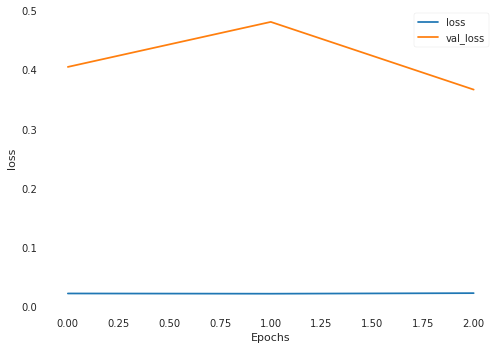

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 428us/sample - loss: 0.0254 - val_loss: 0.1328
Epoch 2/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0243 - val_loss: 0.1121
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0238 - val_loss: 0.1793
loss cuts = tf.Tensor([1.1599041], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.426529, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1647294], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.379845, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1868186], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.166716, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1416138], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.603914, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2701907], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.371096, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2086426], sh

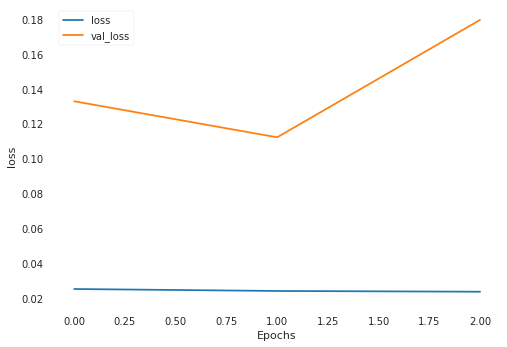

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0257 - val_loss: 0.0881
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0247 - val_loss: 0.0936
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0255 - val_loss: 0.1006
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.4162405], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.78147, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1351378], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(21.296955, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2758958], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.017607, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2567427], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.189363, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2616937], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.144892, shape=(), dtype=float32)
loss cuts 

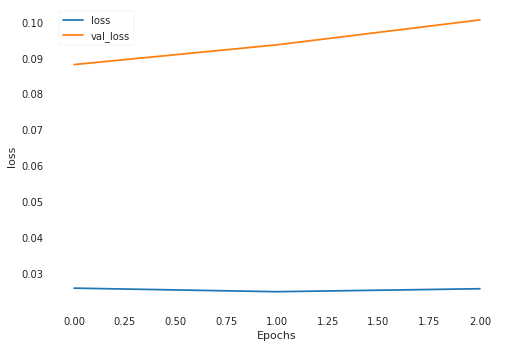

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0321 - val_loss: 0.3019
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0267 - val_loss: 0.3275
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0249 - val_loss: 0.2597
loss cuts = tf.Tensor([0.9601915], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8974095, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9127155], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9896131, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90287733], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0092838, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8049569], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.21562, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76368564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3083309, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99175245], s

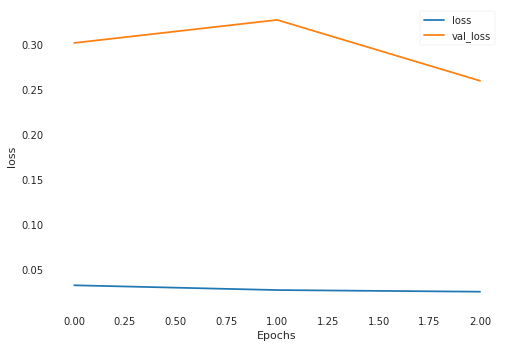

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0244 - val_loss: 0.2143
Epoch 2/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0245 - val_loss: 0.1160
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0260 - val_loss: 0.1830
loss cuts = tf.Tensor([1.4876323], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.690465, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4620422], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.873442, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4730824], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.79434, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3125407], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(13.968605, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7040954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.195079, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6736476], sha

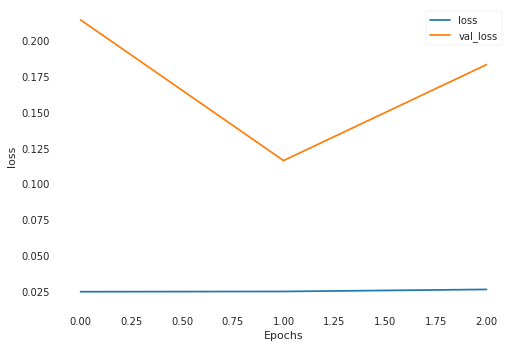

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.0274 - val_loss: 0.2347
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0266 - val_loss: 0.3415
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0234 - val_loss: 0.1968
loss cuts = tf.Tensor([2.4271536], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19613385, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.266614], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.079710454, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.9745023], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9609706, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.2403054], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.0896354, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.2066875], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.9390798, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.3676214], 

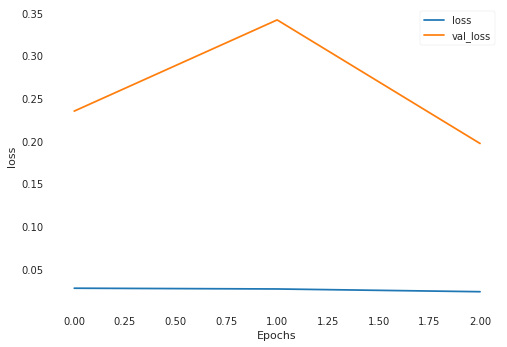

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0257 - val_loss: 0.0612
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0261 - val_loss: 0.0610
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0266 - val_loss: 0.0356
loss cuts = tf.Tensor([2.4039814], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5851163e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5711524], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.029293127, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8966963], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25331467, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.522302], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7703539, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6157289], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.61508137, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.45086

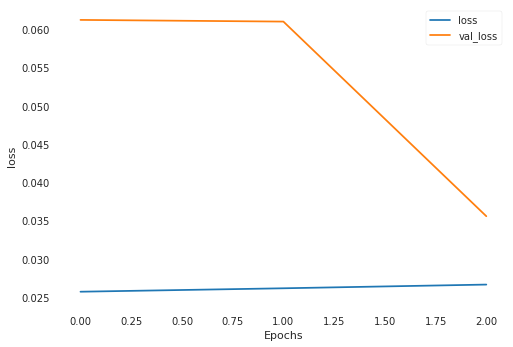

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0279 - val_loss: 0.0456
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0305 - val_loss: 0.1496
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0317 - val_loss: 0.0843
Epoch 00003: early stopping
loss cuts = tf.Tensor([6.6054955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.043995, shape=(), dtype=float32)
loss cuts = tf.Tensor([6.181283], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.825588, shape=(), dtype=float32)
loss cuts = tf.Tensor([6.455447], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.864474, shape=(), dtype=float32)
loss cuts = tf.Tensor([5.110038], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.30029, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.6818566], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.3341274, shape=(), dtype=float32)
loss cuts = tf

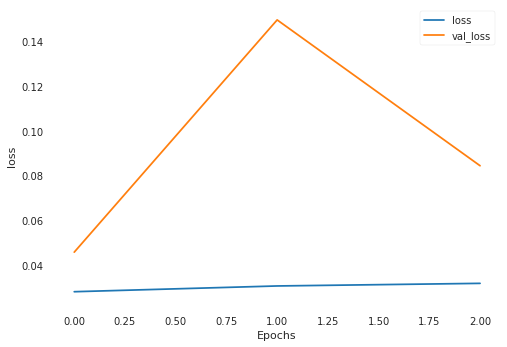

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0260 - val_loss: 0.8965
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0206 - val_loss: 0.1883
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0199 - val_loss: 0.2267
loss cuts = tf.Tensor([0.8615584], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1693803, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4211872], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9432045, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4643675], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0289416, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9399819], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.220046, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8843374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0573237, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8947177], sha

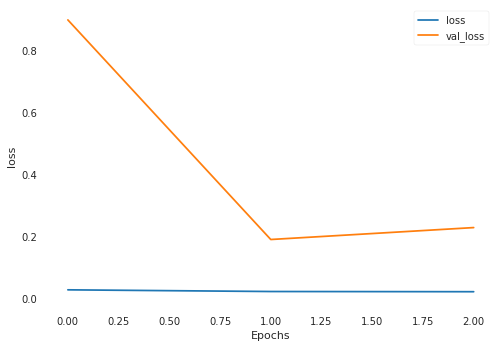

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0223 - val_loss: 0.0881
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0288 - val_loss: 0.0603
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0257 - val_loss: 0.0783
loss cuts = tf.Tensor([4.040034], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.725764, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.7655284], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(13.623974, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.6210272], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.578127, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.4876142], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.649611, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.4842143], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.626414, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.5567567], sha

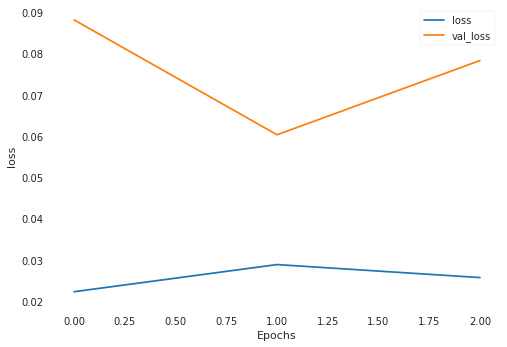

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0217 - val_loss: 0.0691
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0244 - val_loss: 0.0803
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0251 - val_loss: 0.0535
loss cuts = tf.Tensor([2.5784311], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2733567, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6166165], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3609939, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.628826], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3896304, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.672171], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4937022, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.000286], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4033868, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8975863], shape

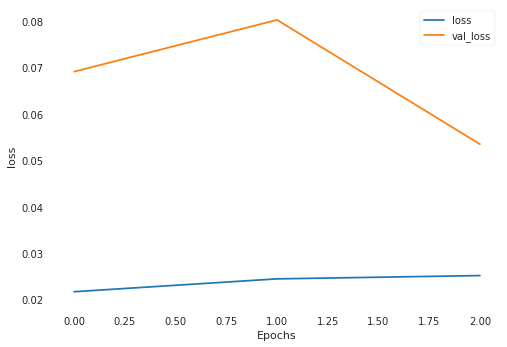

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0260 - val_loss: 0.0981
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0255 - val_loss: 0.0911
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0216 - val_loss: 0.0924
loss cuts = tf.Tensor([1.5415051], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3762379, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4899368], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2199118, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4834902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2007432, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4403381], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.074574, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3228707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.749987, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4771836], shap

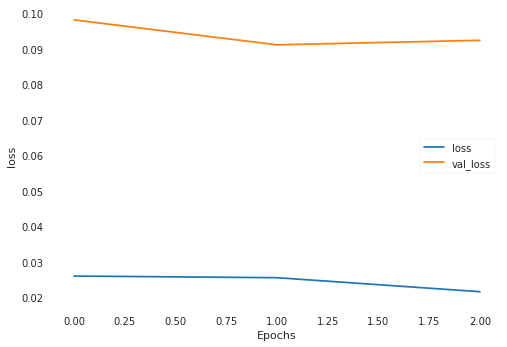

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0283 - val_loss: 0.1395
Epoch 2/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0285 - val_loss: 0.1562
Epoch 3/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0247 - val_loss: 0.1766
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1451272], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4176297, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89200824], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.268834, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1081824], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5338833, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1037462], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5480263, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2299836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1609485, shape=(), dtype=float32)
loss cuts

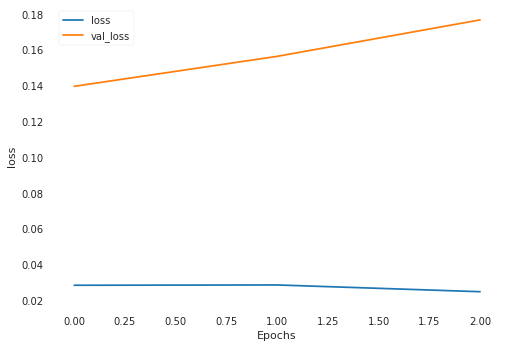

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0255 - val_loss: 1.3000
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0255 - val_loss: 0.1275
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0239 - val_loss: 0.1627
loss cuts = tf.Tensor([1.8322341], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.69261366, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8015273], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6424459, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8427502], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7102279, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2429855], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.545013, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5028257], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.258485, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0683396], sha

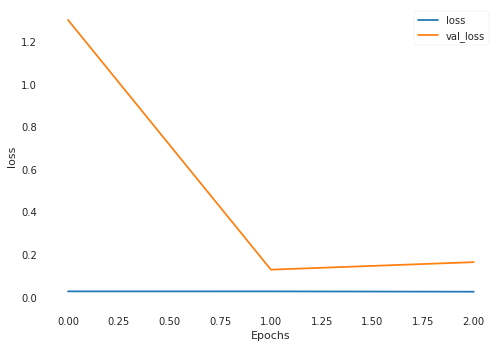

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0222 - val_loss: 0.0843
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0373 - val_loss: 0.1907
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.1872 - val_loss: 1.0100
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5679209], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13536577, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4253188], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.050768558, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4652711], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07036874, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4820396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.079546295, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5758944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14129654, shape=(), dtype=float32)
lo

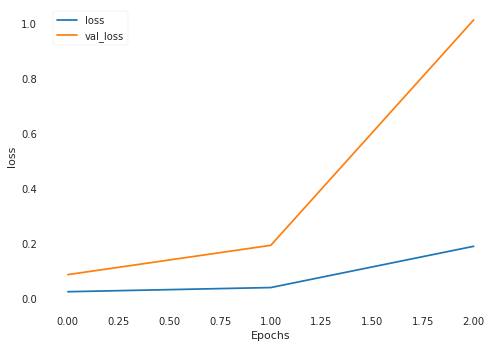

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 423us/sample - loss: 0.5363 - val_loss: 0.3981
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.1715 - val_loss: 0.1535
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0664 - val_loss: 0.0997
loss cuts = tf.Tensor([1.065972], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37942147, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1578203], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50100964, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2175362], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.58911186, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1708574], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.51963544, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1843239], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5392316, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.17698], s

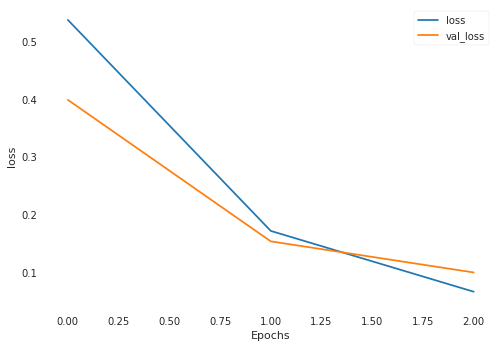

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 433us/sample - loss: 0.0476 - val_loss: 0.1114
Epoch 2/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0391 - val_loss: 0.1219
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0343 - val_loss: 0.1090
loss cuts = tf.Tensor([1.1713378], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.634977, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1694076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.639917, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89674175], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4126112, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0282501], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.021373, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0292], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.018673, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0612745], shape=(1

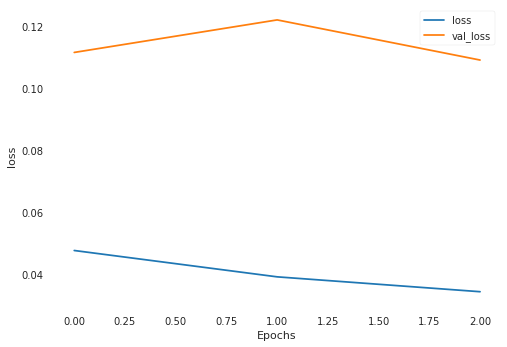

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0318 - val_loss: 0.0702
Epoch 2/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0292 - val_loss: 0.0606
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0282 - val_loss: 0.0584
loss cuts = tf.Tensor([1.0784938], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.434151, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1079566], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.254028, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1054592], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.269229, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0785203], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.433989, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0622323], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.53431, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1101661], shape=(1

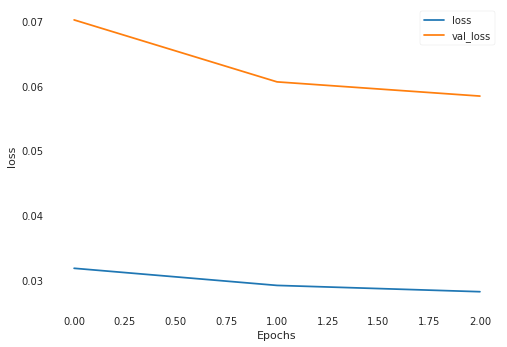

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0264 - val_loss: 0.1773
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0261 - val_loss: 0.1703
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0264 - val_loss: 0.1684
loss cuts = tf.Tensor([1.3727341], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08247136, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3905972], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.072530635, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4000534], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06752668, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.350072], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09600102, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3441449], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09970906, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3593891

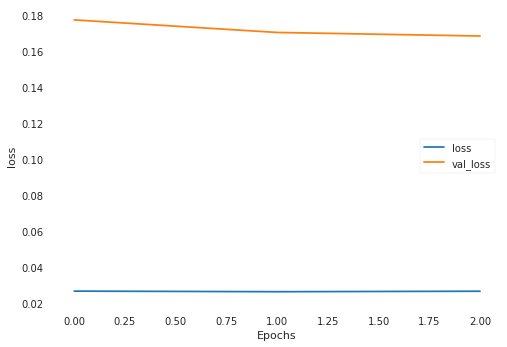

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0245 - val_loss: 0.1102
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0272 - val_loss: 0.1312
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0267 - val_loss: 0.1066
loss cuts = tf.Tensor([0.8741117], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2676246, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8796878], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2550994, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0047884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.99044615, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0497965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.90288675, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0788176], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.848577, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0908471], s

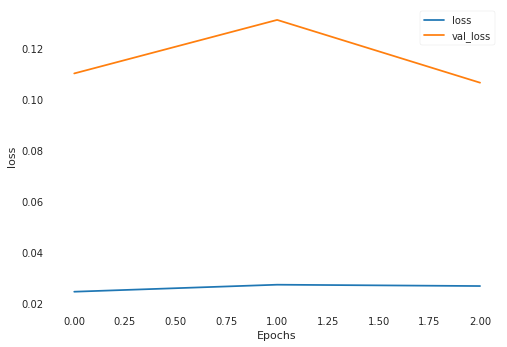

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0274 - val_loss: 0.1135
Epoch 2/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0233 - val_loss: 0.0941
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0219 - val_loss: 0.0759
loss cuts = tf.Tensor([0.93221223], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33929852, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91821104], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32318336, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9194112], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32454932, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7919889], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19560279, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.81210107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2137973, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76132

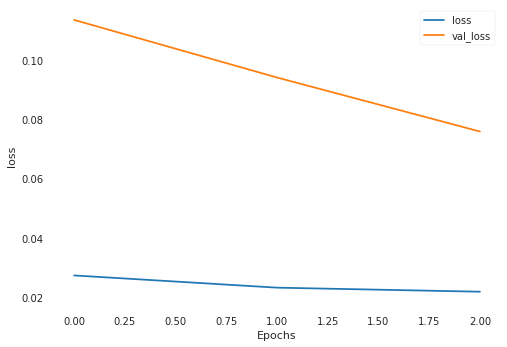

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.0215 - val_loss: 0.0386
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0239 - val_loss: 0.0414
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0235 - val_loss: 0.0379
loss cuts = tf.Tensor([1.4569825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12743649, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4489045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12173434, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4602357], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12976976, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4183575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10135148, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.388008], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.082948595, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3884313

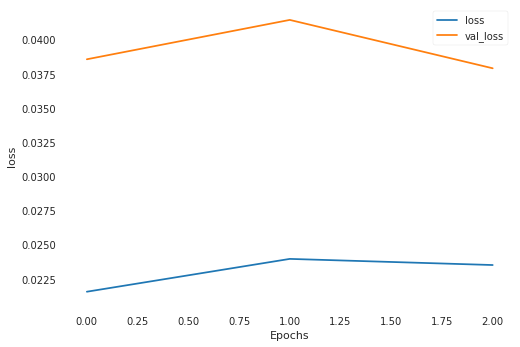

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0238 - val_loss: 0.0817
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0222 - val_loss: 0.0456
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0216 - val_loss: 0.0885
loss cuts = tf.Tensor([1.3938719], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3809973, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3839697], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36887103, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2949209], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26863366, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3029952], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27706861, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3356024], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31245896, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3303533]

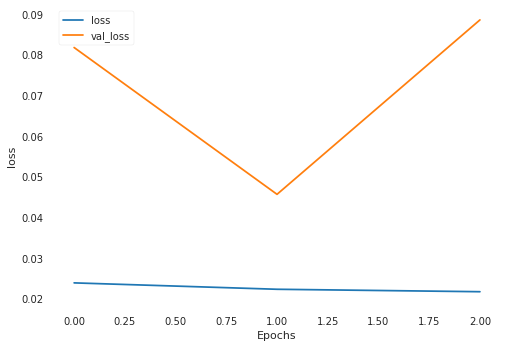

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0228 - val_loss: 0.1229
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0270 - val_loss: 0.3236
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0278 - val_loss: 0.1965
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.9607507], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1791145, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90069956], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.313136, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8803605], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3601638, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.873307], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.376666, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8469882], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4391191, shape=(), dtype=float32)
loss cuts =

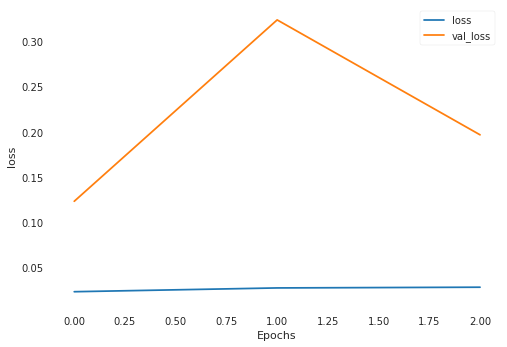

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0269 - val_loss: 0.0396
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0254 - val_loss: 0.0533
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0224 - val_loss: 0.0408
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0757964], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7670193, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0552425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7314398, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1213546], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8488943, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87515354], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45583233, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.917266], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5144706, shape=(), dtype=float32)
loss cut

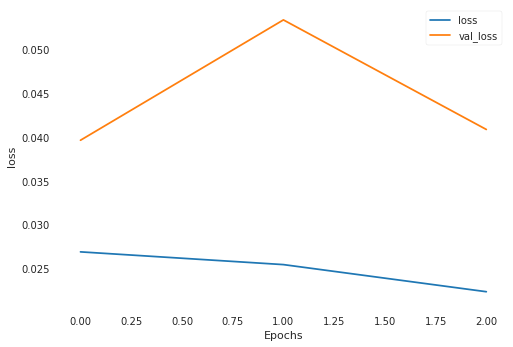

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0233 - val_loss: 0.1819
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0221 - val_loss: 0.1586
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0221 - val_loss: 0.1625
loss cuts = tf.Tensor([0.8463535], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36438918, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90466285], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29739267, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9335237], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2667478, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9340267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26622847, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9031343], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29906216, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8970576

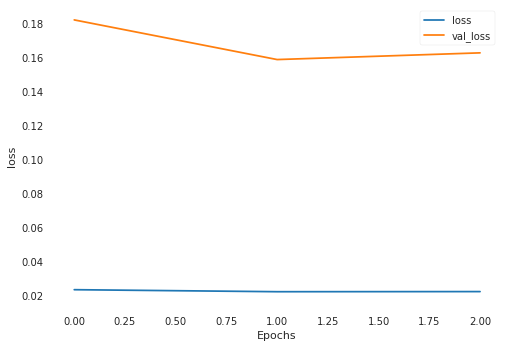

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0237 - val_loss: 0.1462
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0242 - val_loss: 0.1362
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0211 - val_loss: 0.1088
loss cuts = tf.Tensor([0.7055854], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0863335, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.70598507], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0851793, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7278669], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0224628, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7127902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.065572, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.70429087], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0900753, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7169419], s

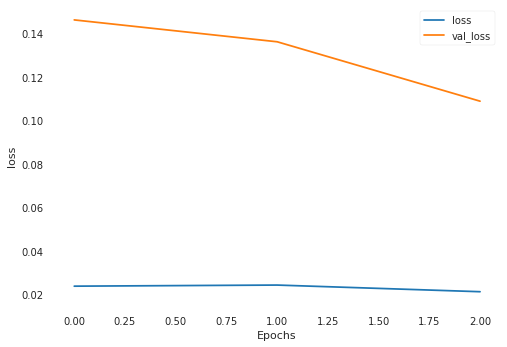

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0251 - val_loss: 0.0864
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0280 - val_loss: 0.1065
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0266 - val_loss: 0.1007
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8319669], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39861718, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8149752], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3774502, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6589278], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21005934, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6124567], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16962141, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6529227], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20459086, shape=(), dtype=float32)
loss 

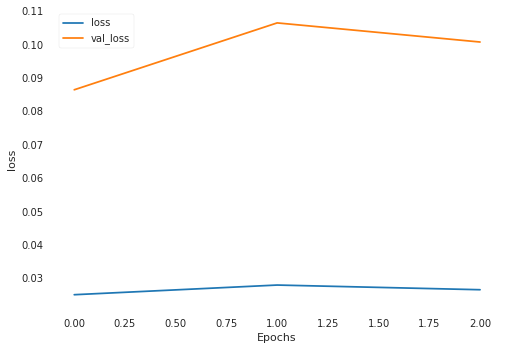

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0251 - val_loss: 0.0570
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0257 - val_loss: 0.0615
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0237 - val_loss: 0.7019
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.35703963], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11762181, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35131064], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12158426, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3732921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10673805, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37797922], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.103697374, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37909853], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.102977745, shape=(), dtype=float32

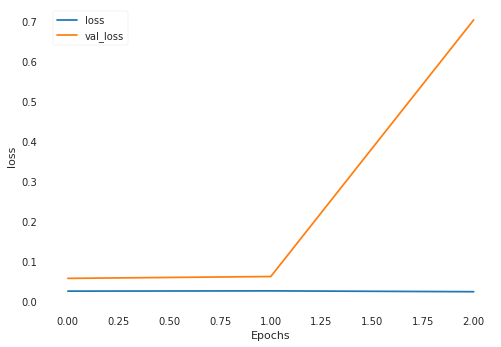

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0237 - val_loss: 0.0891
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0274 - val_loss: 0.1720
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0218 - val_loss: 0.0946
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.434878], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4624807, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.40359315], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5391268, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37812707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6029625, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3708037], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6215602, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3621538], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6436647, shape=(), dtype=float32)
loss cut

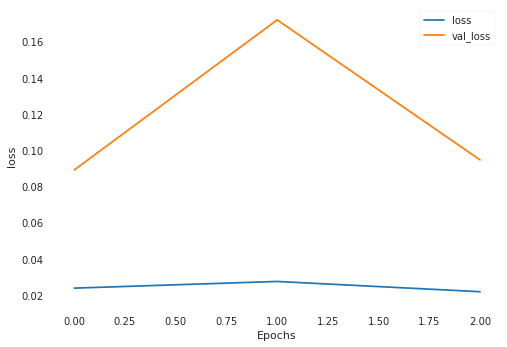

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0207 - val_loss: 0.3680
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0204 - val_loss: 0.0775
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0214 - val_loss: 0.0784
loss cuts = tf.Tensor([0.2287178], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32636335, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.22590974], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3295796, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.22319369], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33270553, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.22419447], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33155203, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2249372], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33069724, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.21879

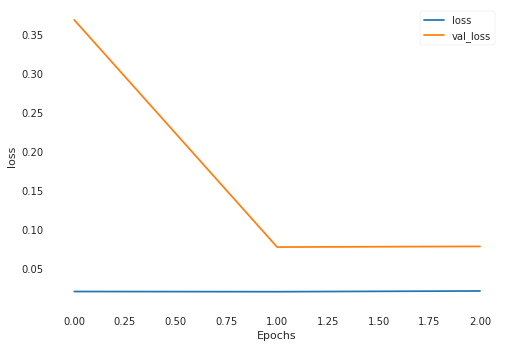

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.1380 - val_loss: 0.3477
Epoch 2/3
882/882 [==============================] - 0s 414us/sample - loss: 0.1469 - val_loss: 0.1581
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0557 - val_loss: 0.1308
loss cuts = tf.Tensor([0.43731022], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3518475, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39396322], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4545248, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.39488804], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4522948, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37038833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5119448, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5961994], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0076157, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57537353

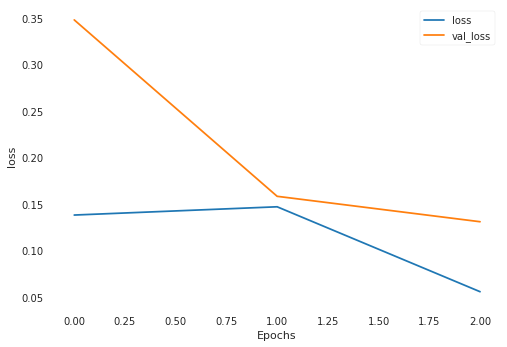

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0359 - val_loss: 0.2228
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0292 - val_loss: 0.1278
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0266 - val_loss: 0.1282
loss cuts = tf.Tensor([0.6069146], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08788205, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65676445], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.060811166, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66492176], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05685453, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6626764], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.057930354, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.69558835], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04317057, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.69

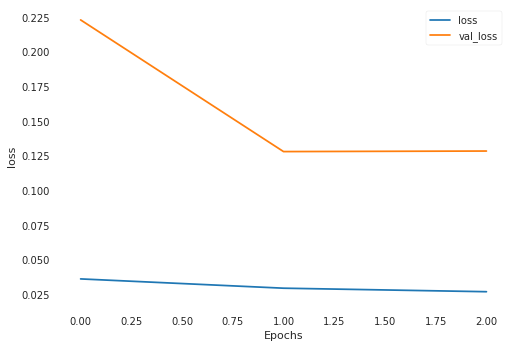

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0250 - val_loss: 0.0633
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0236 - val_loss: 0.0624
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0233 - val_loss: 0.0402
loss cuts = tf.Tensor([0.8219587], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.031698696, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8148426], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03428327, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8937814], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011282386, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9061121], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.008814942, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9902075], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.5893185e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0

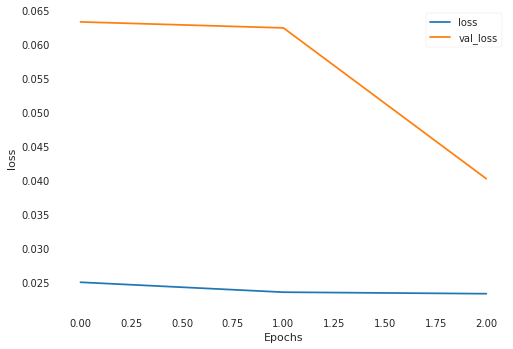

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0218 - val_loss: 0.0889
Epoch 2/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0228 - val_loss: 0.0973
Epoch 3/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0268 - val_loss: 0.0918
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6924575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.880636, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7202239], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.667187, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7067], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.770956, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.718218], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.682554, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0005585], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.598537, shape=(), dtype=float32)
loss cuts = t

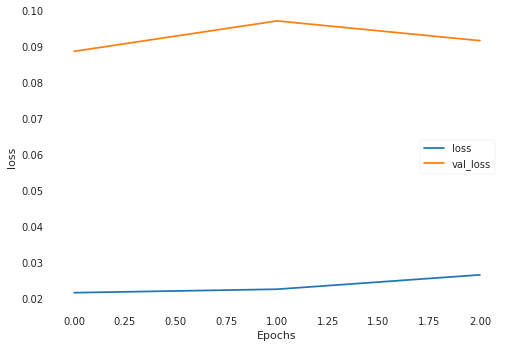

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0252 - val_loss: 0.2949
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0244 - val_loss: 0.2658
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0223 - val_loss: 0.2851
loss cuts = tf.Tensor([0.54422283], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9533806, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55121475], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.933885, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.54759187], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9439747, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55882084], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9127883, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5599695], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9096122, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55383134]

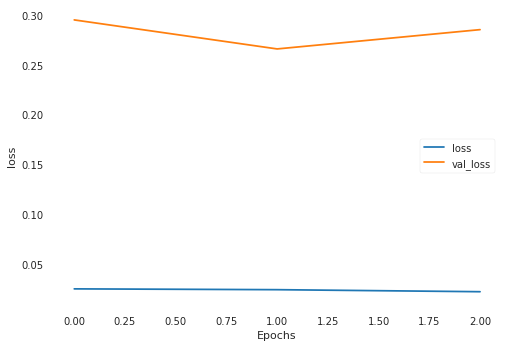

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0217 - val_loss: 0.0696
Epoch 2/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0231 - val_loss: 0.0436
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0218 - val_loss: 0.0709
loss cuts = tf.Tensor([0.69925964], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06909851, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7047399], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06624738, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6324613], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10867854, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6519628], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09620095, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72019887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.058528543, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0992

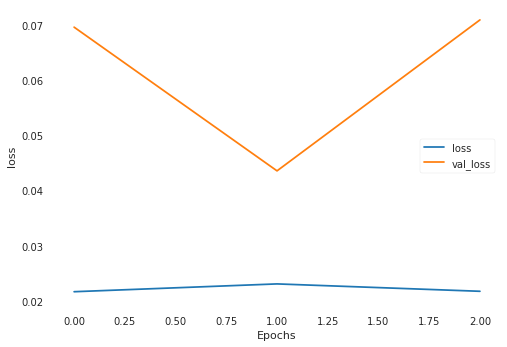

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0202 - val_loss: 0.0649
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0217 - val_loss: 0.0600
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0269 - val_loss: 0.0347
loss cuts = tf.Tensor([1.2033825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.054704, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4925128], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7321666, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2650908], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.185259, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2199672], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0890434, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2186645], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0863261, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2269968], shap

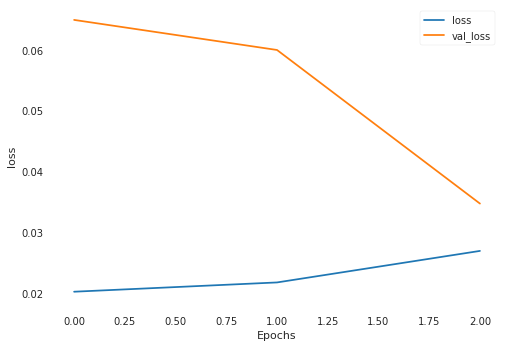

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0241 - val_loss: 0.1041
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0215 - val_loss: 0.1307
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0237 - val_loss: 0.1224
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.79977983], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0004401, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.79296815], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0141131, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0883622], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50642824, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1864809], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37640566, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2718642], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2789274, shape=(), dtype=float32)
loss 

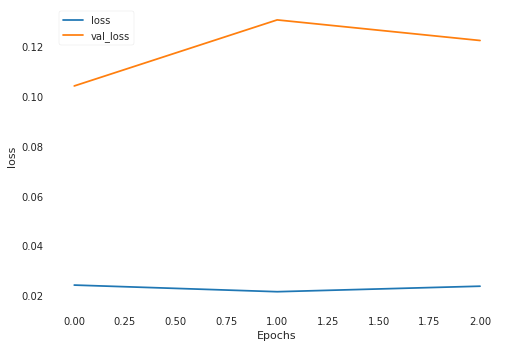

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0221 - val_loss: 0.0562
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0208 - val_loss: 0.0815
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0209 - val_loss: 0.0587
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1011586], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.060875382, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9910346], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01866103, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9557084], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010257464, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95881665], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01089673, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9658012], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012403708, shape=(), dtype=float32)


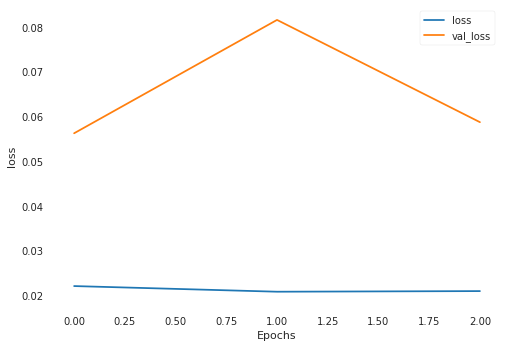

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 428us/sample - loss: 0.0227 - val_loss: 0.1304
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0213 - val_loss: 0.0860
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0242 - val_loss: 0.2459
loss cuts = tf.Tensor([1.4229954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.049207706, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5059688], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.092903934, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.310202], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011888556, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2191358], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00032286398, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.250128], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0023971486, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2

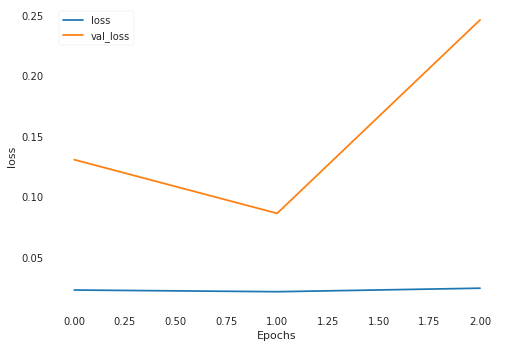

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 426us/sample - loss: 0.0262 - val_loss: 0.0682
Epoch 2/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0243 - val_loss: 0.0424
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0214 - val_loss: 0.0321
loss cuts = tf.Tensor([1.088869], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.670487, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1463791], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.4252214, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1474564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.4206896, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1495041], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.4120827, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3256588], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.703089, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0450351], shape

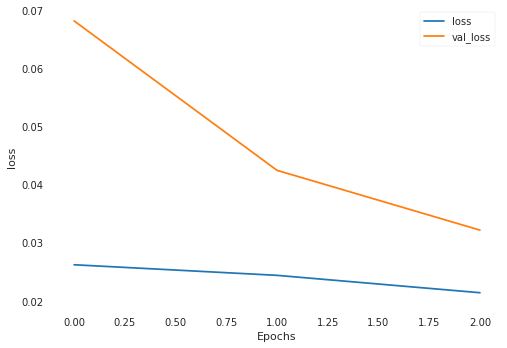

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0207 - val_loss: 0.0423
Epoch 2/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0223 - val_loss: 0.0634
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0221 - val_loss: 0.0605
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.263525], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4139398, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3308991], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5787072, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.505336], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0474837, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4595269], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9184852, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3419092], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.606496, shape=(), dtype=float32)
loss cuts = 

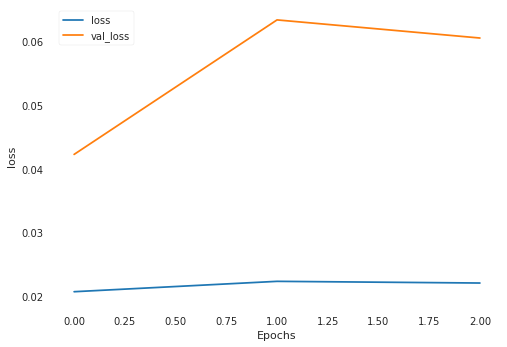

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0220 - val_loss: 0.0700
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0382 - val_loss: 0.0821
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0369 - val_loss: 0.0653
loss cuts = tf.Tensor([1.9025178], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2628596, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.393894], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.608698, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9614687], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3988293, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.414931], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6770964, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4144125], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6753998, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4142776], shape

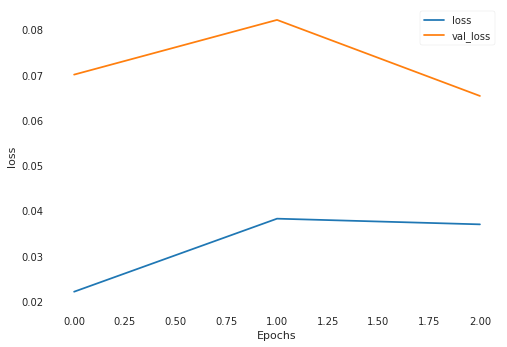

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0259 - val_loss: 0.0284
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0217 - val_loss: 0.0428
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0253 - val_loss: 0.0387
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.555188], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0104029, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6077404], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1188148, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5220577], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.94489604, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5018184], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9059583, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5107335], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9230088, shape=(), dtype=float32)
loss cuts

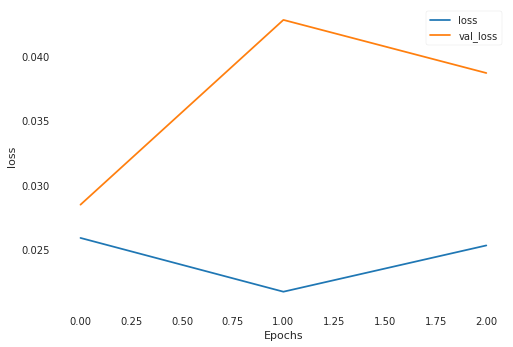

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0246 - val_loss: 0.1860
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0256 - val_loss: 0.2233
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0222 - val_loss: 0.1632
loss cuts = tf.Tensor([1.739279], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3693798, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5066813], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7074159, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4166939], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4803439, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2576091], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.118537, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2474699], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0971931, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2458482], shap

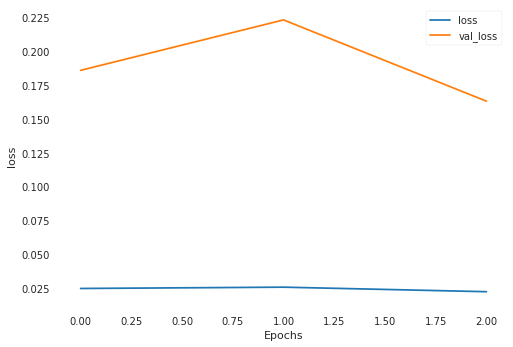

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0218 - val_loss: 0.0553
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0244 - val_loss: 0.0615
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0238 - val_loss: 0.0575
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5756721], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1541805, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2130592], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19091736, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2832563], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13450101, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.978243], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45125762, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0873802], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31654117, shape=(), dtype=float32)
loss c

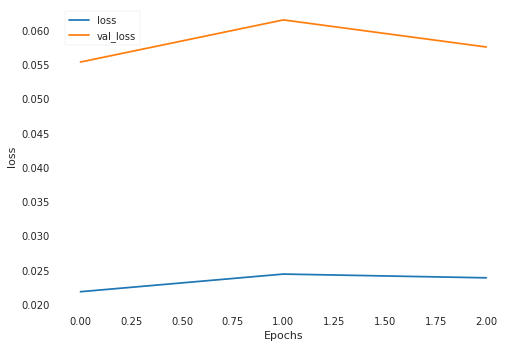

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0221 - val_loss: 0.0894
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0224 - val_loss: 0.1583
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0232 - val_loss: 0.1094
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0882365], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.71739084, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0789323], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.73323846, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1045461], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.69002867, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0858331], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72146785, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1560996], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6070376, shape=(), dtype=float32)
loss 

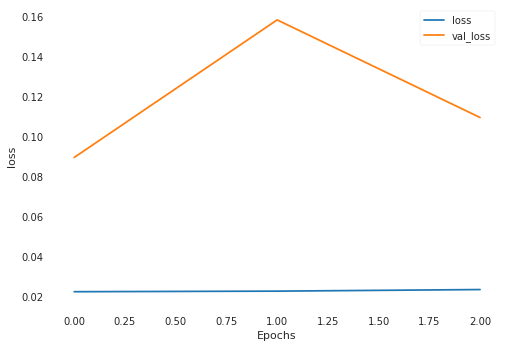

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0215 - val_loss: 0.4385
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0232 - val_loss: 0.2358
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0267 - val_loss: 0.3270
loss cuts = tf.Tensor([0.5107863], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2711911, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.52229404], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.236638, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4729825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3865645, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45022696], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.45739, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45241877], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4505231, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4513507], sh

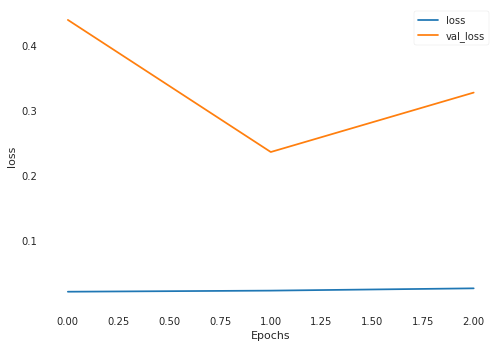

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0289 - val_loss: 0.0757
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0229 - val_loss: 0.1043
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0217 - val_loss: 0.1047
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.85613036], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1965508, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8259554], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2634764, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.79638726], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3308226, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.81448704], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.28939, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93994105], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0202192, shape=(), dtype=float32)
loss cu

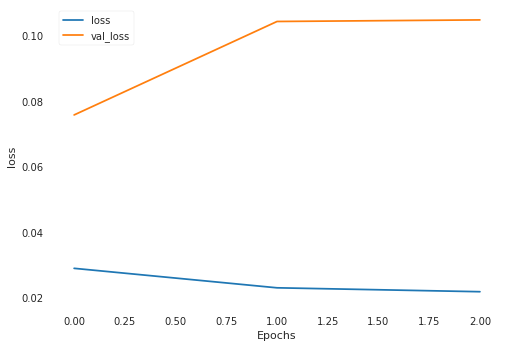

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0228 - val_loss: 0.0780
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0247 - val_loss: 0.0818
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0389 - val_loss: 0.1009
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.13292], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1523235, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2508047], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8203278, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2220497], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8987467, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2437273], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8394753, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1618195], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.068363, shape=(), dtype=float32)
loss cuts = 

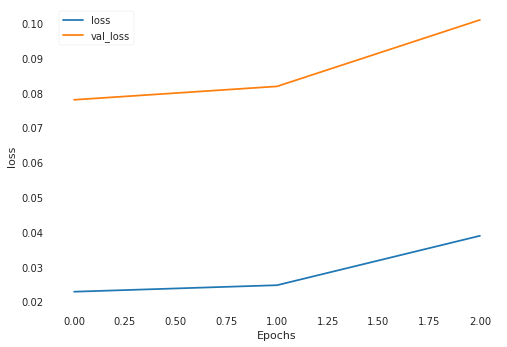

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0284 - val_loss: 0.1175
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0235 - val_loss: 0.0773
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0203 - val_loss: 0.1024
loss cuts = tf.Tensor([0.7577031], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2824485, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77654004], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30282536, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7756188], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3018123, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.800076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3292828, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77661365], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30290645, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6583459],

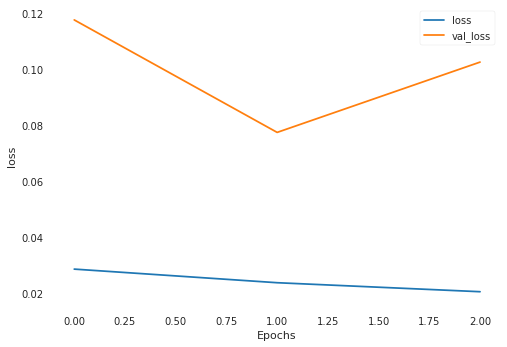

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0208 - val_loss: 0.1371
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0213 - val_loss: 0.1501
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0311 - val_loss: 0.2364
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2641993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.6920457, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.260076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.711737, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2318016], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.8476844, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1673073], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.163763, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0776458], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.617007, shape=(), dtype=float32)
loss cuts = t

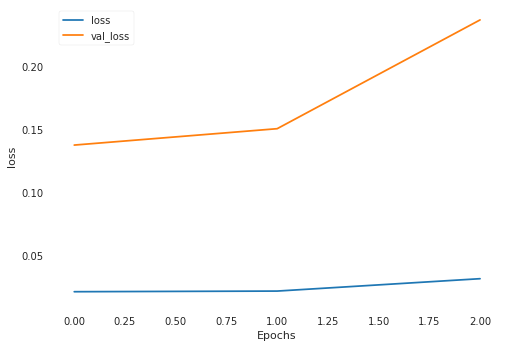

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0304 - val_loss: 0.1128
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0262 - val_loss: 0.1240
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0251 - val_loss: 0.1330
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.81017584], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(34.690025, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71659005], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(35.801193, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7423073], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(35.494102, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.75818884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(35.30512, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7693195], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(35.17297, shape=(), dtype=float32)
loss cut

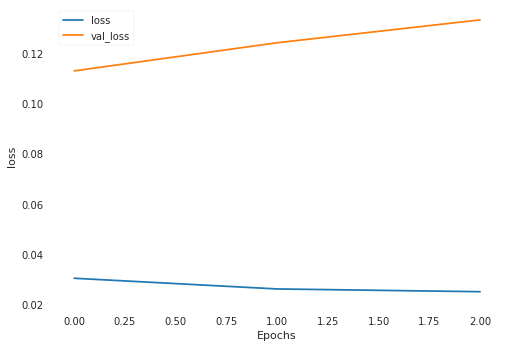

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0245 - val_loss: 0.1901
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0237 - val_loss: 0.1768
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0243 - val_loss: 0.1267
loss cuts = tf.Tensor([0.4629708], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1317478, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44417244], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11845467, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4602489], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12977926, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44138357], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11654275, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44088662], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11620369, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44199

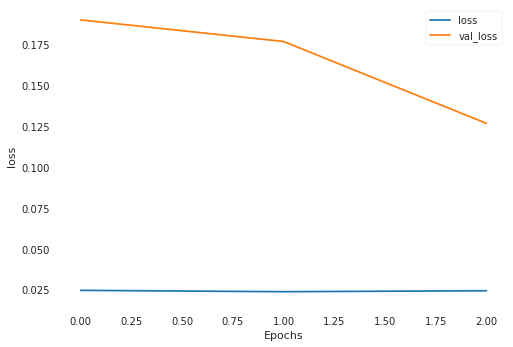

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0250 - val_loss: 0.2853
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0224 - val_loss: 0.2984
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0222 - val_loss: 0.3562
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2258129], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8542118, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1053253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.3418145, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1060331], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.3388658, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2096205], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9180524, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2187152], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8821309, shape=(), dtype=float32)
loss cuts

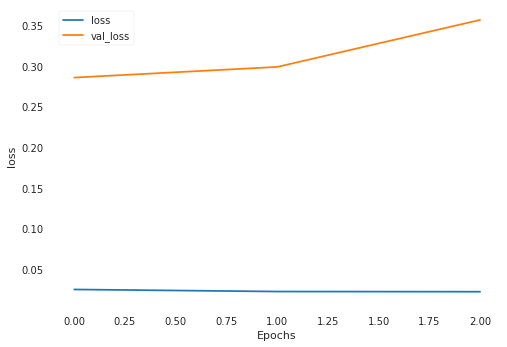

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0276 - val_loss: 0.7074
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0631 - val_loss: 0.2741
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0529 - val_loss: 0.4084
loss cuts = tf.Tensor([1.3232207], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8931105, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4076874], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7405954, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3694148], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8079334, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2127509], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.114112, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1683936], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2097192, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1726255], sha

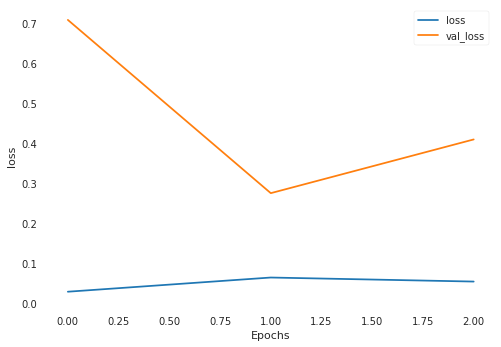

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0303 - val_loss: 0.7134
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0247 - val_loss: 0.7272
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0263 - val_loss: 0.7110
loss cuts = tf.Tensor([1.206997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.094605, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3655972], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.2748737, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3494089], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.356239, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.334266], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.4328237, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3403077], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.4022126, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3622458], shape=

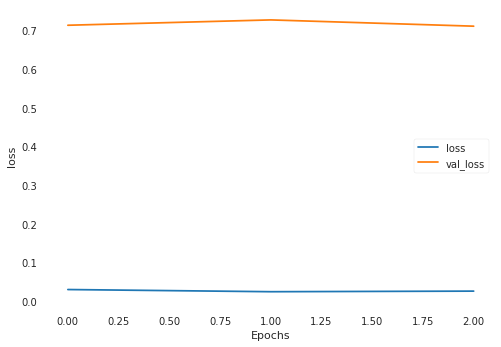

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0234 - val_loss: 0.0781
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0262 - val_loss: 0.0677
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0269 - val_loss: 0.0477
loss cuts = tf.Tensor([1.6848269], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2436111, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.623172], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3849239, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0003437], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2387626, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0104985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2023153, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0222132], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1605256, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0057663], sha

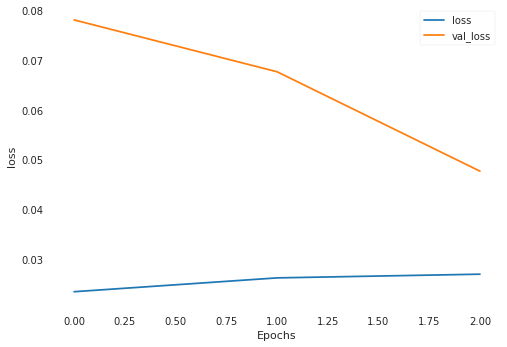

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0267 - val_loss: 0.0675
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0237 - val_loss: 0.0601
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0237 - val_loss: 0.0439
loss cuts = tf.Tensor([1.0267686], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5247245, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0083003], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49830955, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0158068], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5089637, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.706492], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16329856, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66720974], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13309357, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.720959], 

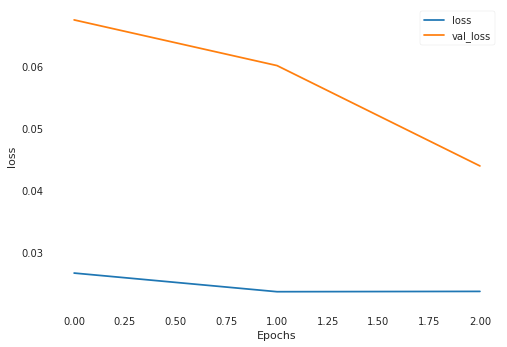

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0239 - val_loss: 0.1230
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0241 - val_loss: 0.1297
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0224 - val_loss: 0.1366
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0743045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.3322, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1617795], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(21.513092, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0426896], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.632008, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0544496], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.52025, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.958506], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.440065, shape=(), dtype=float32)
loss cuts = t

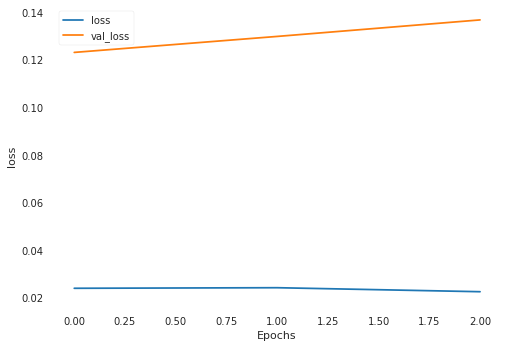

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0245 - val_loss: 0.3539
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0493 - val_loss: 0.2171
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0268 - val_loss: 0.1655
loss cuts = tf.Tensor([2.4109263], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3241936, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.377015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2472978, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4226449], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3513007, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4084997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3186146, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7642365], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.262155, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7993793], shap

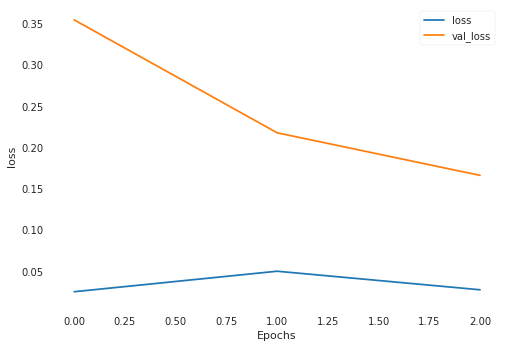

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0220 - val_loss: 0.0628
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0238 - val_loss: 0.1032
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0233 - val_loss: 0.0877
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.7020692], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1752982, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5173815], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.80896366, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95536673], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.113845006, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.96334696], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1192939, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1535939], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2869064, shape=(), dtype=float32)
loss

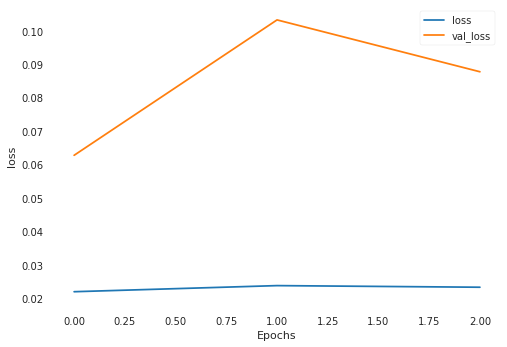

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0233 - val_loss: 0.0410
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0255 - val_loss: 0.0739
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0256 - val_loss: 0.0628
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.90894395], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1904035, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8664651], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2849014, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9658765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0694113, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93064344], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1435235, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.200884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6385864, shape=(), dtype=float32)
loss cut

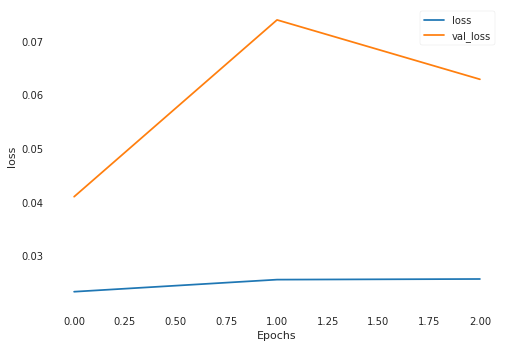

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0242 - val_loss: 0.2234
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0227 - val_loss: 0.1681
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0229 - val_loss: 0.1708
loss cuts = tf.Tensor([1.8862556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1799511, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.922112], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2591354, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9398074], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2991611, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9692485], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3671422, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3250518], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.325783, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9486184], shap

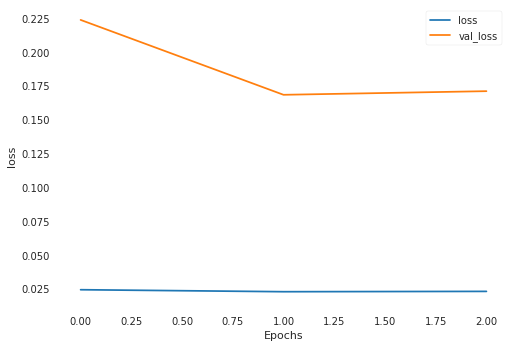

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0381 - val_loss: 0.1121
Epoch 2/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0290 - val_loss: 0.0845
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0264 - val_loss: 0.0828
loss cuts = tf.Tensor([2.7084708], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5871782, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7123804], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5997705, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.739775], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6888618, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6096835], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2791443, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9506886], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.425048, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9384727], shap

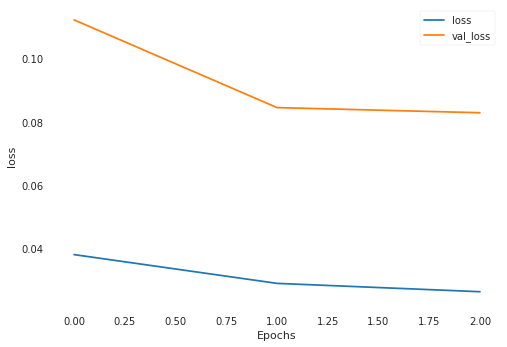

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0344 - val_loss: 0.1966
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0290 - val_loss: 0.1937
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0230 - val_loss: 0.1960
loss cuts = tf.Tensor([3.0516255], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.808842, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9287477], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.344318, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9752965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5167367, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.1201277], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.0809164, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.2742338], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.727293, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7790494], shape

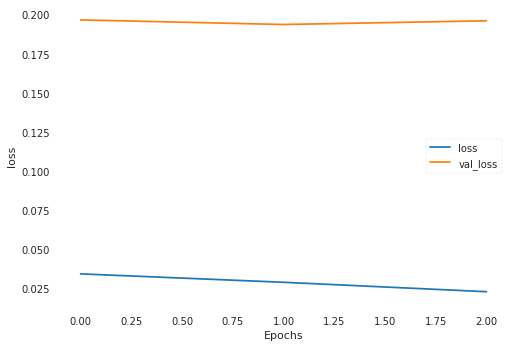

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0234 - val_loss: 0.3237
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0240 - val_loss: 0.2701
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0254 - val_loss: 0.7714
loss cuts = tf.Tensor([1.1824971], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5754633, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1840484], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5695992, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1306852], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7740889, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1732469], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6105313, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0861183], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9492354, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0339675], sh

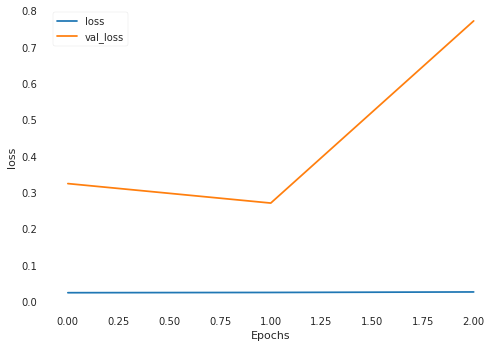

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0382 - val_loss: 0.1026
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0418 - val_loss: 0.1821
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0299 - val_loss: 0.1700
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1480347], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8623425e-06, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1282955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00047108252, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.014954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018237423, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0164832], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017826732, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0504335], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00991348, shape=(), dtype=float3

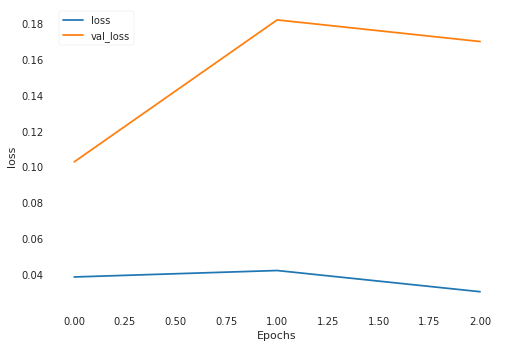

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0254 - val_loss: 0.0602
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0228 - val_loss: 0.0479
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0216 - val_loss: 0.0477
loss cuts = tf.Tensor([1.3238685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.033851, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3889251], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.852525, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3746531], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8915792, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7087307], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0842417, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1058519], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.703223, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1429992], shape

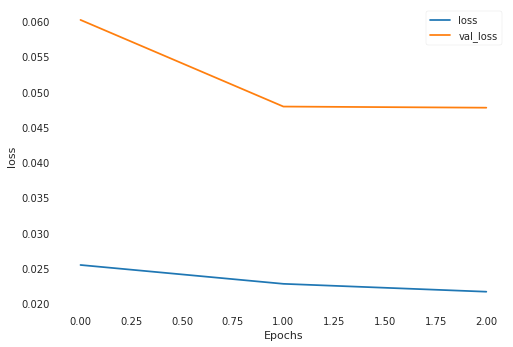

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0229 - val_loss: 0.1680
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0256 - val_loss: 0.1251
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0248 - val_loss: 0.1511
loss cuts = tf.Tensor([2.2897682], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1212087, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2790592], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0834842, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.286851], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1109095, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2862675], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1088517, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.295949], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.143086, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4698381], shape

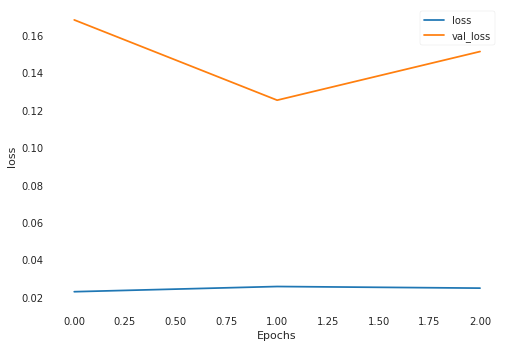

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.1315 - val_loss: 1.0760
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0643 - val_loss: 0.2924
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0342 - val_loss: 0.3050
loss cuts = tf.Tensor([1.0163629], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2664695, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0382402], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2177078, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0565296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1776775, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0395848], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2147422, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2013304], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.88436675, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1906482], s

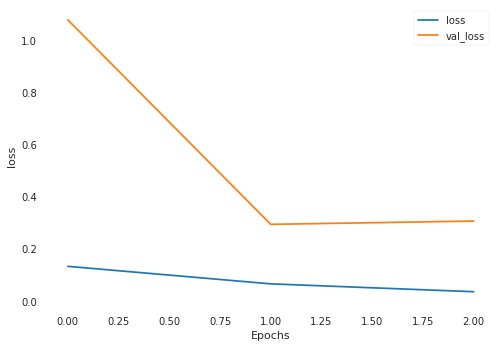

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0252 - val_loss: 0.1985
Epoch 2/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0225 - val_loss: 0.1035
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0213 - val_loss: 0.1689
loss cuts = tf.Tensor([1.8370671], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01990216, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8136154], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013835248, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8147229], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.014096999, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8294324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017806303, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7885262], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.008562554, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.624

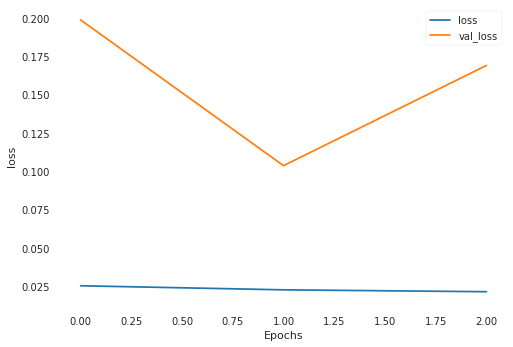

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0233 - val_loss: 0.1258
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0291 - val_loss: 0.1240
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0228 - val_loss: 0.1127
loss cuts = tf.Tensor([1.3720362], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.81071144, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.36607], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8000032, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1484765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4581062, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.14358], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45150188, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2653017], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62989724, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1186013], sha

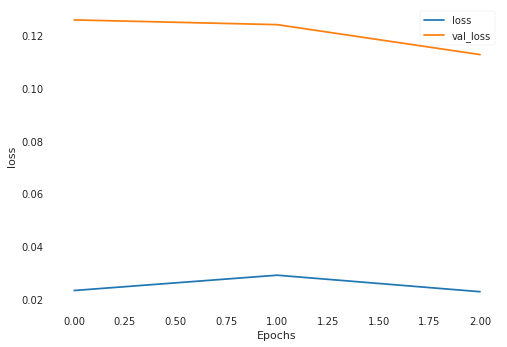

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0221 - val_loss: 0.0774
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0246 - val_loss: 0.0830
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0312 - val_loss: 0.1591
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2032614], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.391094, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1356287], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.787497, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.192549], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.453271, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.195343], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.437032, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1957237], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.434821, shape=(), dtype=float32)
loss cuts = tf.T

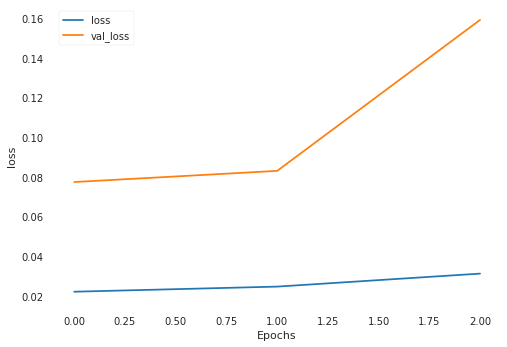

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0262 - val_loss: 0.3402
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0218 - val_loss: 0.4305
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0240 - val_loss: 0.5423
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3928695], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2618711, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1233011], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6104324, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1554556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.56122166, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2277571], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45812023, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.229715], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45547366, shape=(), dtype=float32)
loss cu

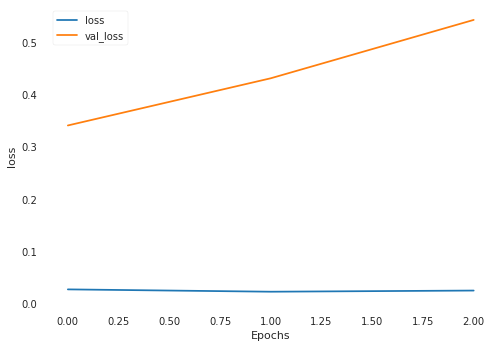

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0241 - val_loss: 0.0987
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0306 - val_loss: 0.0658
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0288 - val_loss: 0.0842
loss cuts = tf.Tensor([1.5583421], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0783775, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5932406], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.978972, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9069929], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1946645, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6445256], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8373107, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6484399], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8267148, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6374885], sha

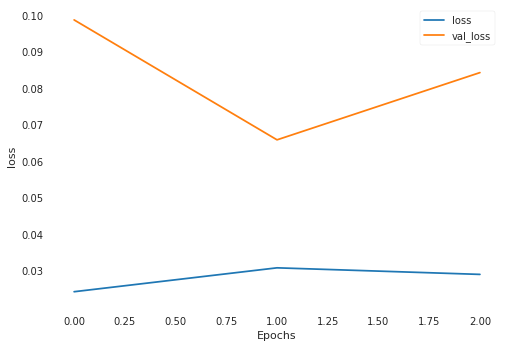

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0259 - val_loss: 0.1439
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0260 - val_loss: 0.0598
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0248 - val_loss: 0.0760
loss cuts = tf.Tensor([1.8844069], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0258532, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8015783], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.86492884, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8193362], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8982744, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3543397], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23307358, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.115968], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.059733905, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2113057],

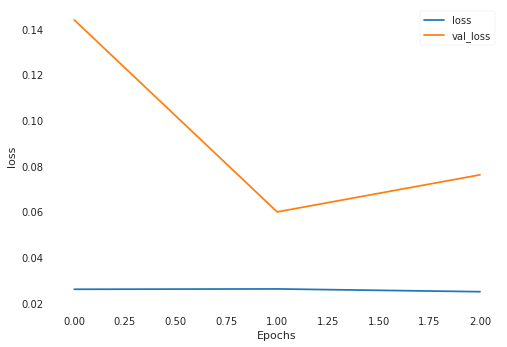

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0300 - val_loss: 0.1249
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0236 - val_loss: 0.1142
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0253 - val_loss: 0.1480
loss cuts = tf.Tensor([1.66264], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.178465, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.60849], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0638299, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.527611], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9035307, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4991409], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8502171, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4891467], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8318863, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4802365], shape=(1

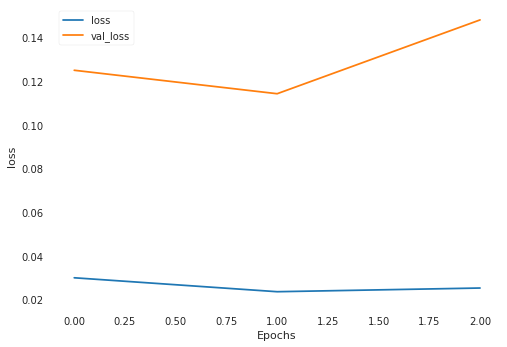

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0241 - val_loss: 0.4997
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0244 - val_loss: 0.2495
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0247 - val_loss: 0.2153
loss cuts = tf.Tensor([0.98057324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.107880205, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88317275], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05338444, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6541088], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0039774, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6787286], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.053921, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7001061], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0982708, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6990755]

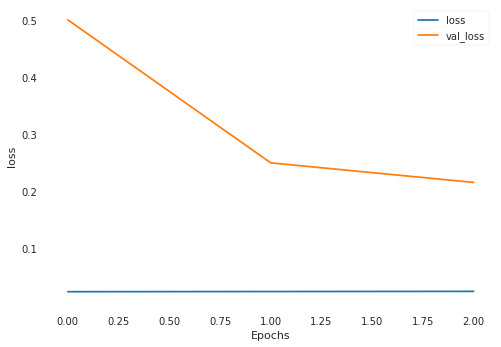

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0315 - val_loss: 0.2296
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.1137 - val_loss: 0.4682
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0933 - val_loss: 0.0896
loss cuts = tf.Tensor([1.1230971], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8073431, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9675758], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5520512, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9808643], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5719745, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.897801], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4532342, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8958066], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45055285, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90456635], s

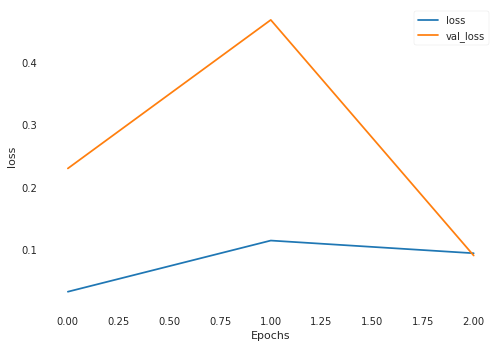

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0428 - val_loss: 0.0922
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0383 - val_loss: 0.0574
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0254 - val_loss: 0.0364
loss cuts = tf.Tensor([1.4827588], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3366414, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3561159], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0598482, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4076004], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1685042, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3927984], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1367222, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4285451], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2142243, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3870695], sh

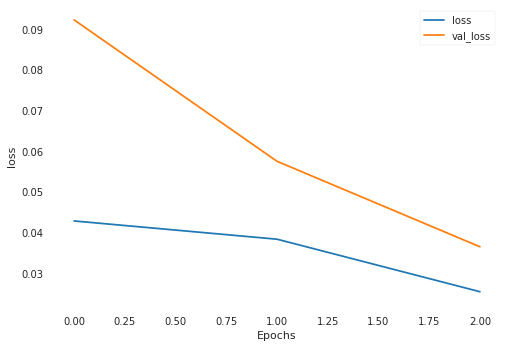

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0233 - val_loss: 0.2749
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0311 - val_loss: 0.1242
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0263 - val_loss: 0.2813
loss cuts = tf.Tensor([1.4600514], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7043194, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4708903], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72262967, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5985544], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9559762, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.725429], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2201742, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7516993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2789017, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7565975], sh

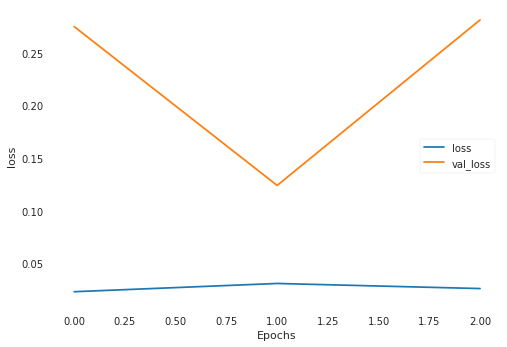

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0258 - val_loss: 0.1670
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0312 - val_loss: 0.1795
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0249 - val_loss: 0.2889
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.4670635], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9661643, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45937327], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9813415, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37545845], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1546396, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3563742], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1960174, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3602305], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1875978, shape=(), dtype=float32)
loss cu

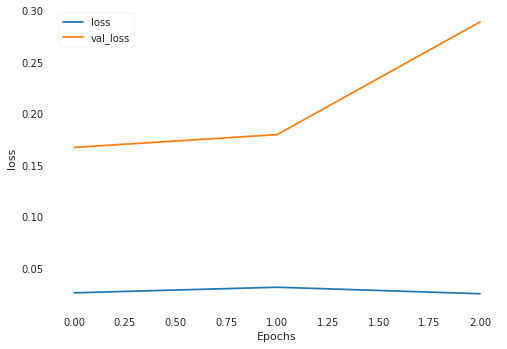

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0721 - val_loss: 0.3208
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.1014 - val_loss: 0.1251
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0414 - val_loss: 0.0598
loss cuts = tf.Tensor([0.3516597], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0757201, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.32707635], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08985378, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.33356404], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08600641, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.41597146], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.044462398, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.33443624], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0854956, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2976

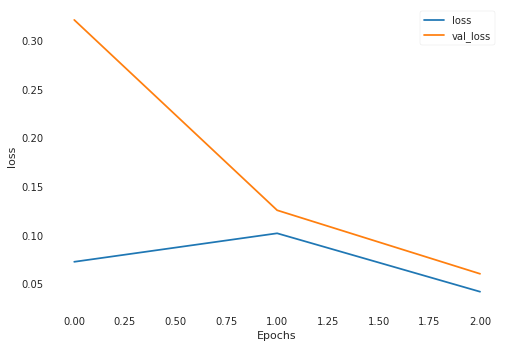

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0284 - val_loss: 0.0942
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0243 - val_loss: 0.0464
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0220 - val_loss: 0.0621
loss cuts = tf.Tensor([0.987755], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.507293, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.035375], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44172645, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0376015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43877187, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98699504], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5083761, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0042491], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48406938, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0194633], s

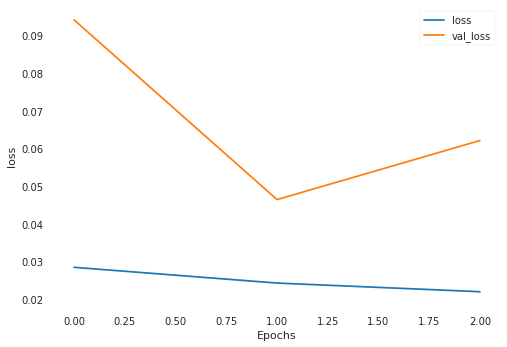

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0242 - val_loss: 0.0611
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0236 - val_loss: 0.1245
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0235 - val_loss: 0.0813
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.46722862], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2838453, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4346561], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31961367, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44952857], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30301878, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.43082553], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3239596, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6806271], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.101999044, shape=(), dtype=float32)
lo

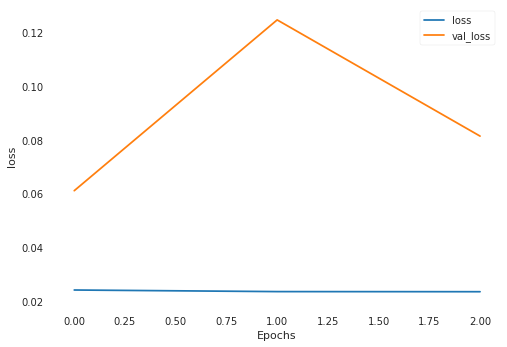

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0263 - val_loss: 0.1618
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0346 - val_loss: 0.2806
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0312 - val_loss: 0.2379
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.63661194], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11386124, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7316196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18700519, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8351191], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28723225, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76854575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22030549, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77238667], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22392584, shape=(), dtype=float32)
l

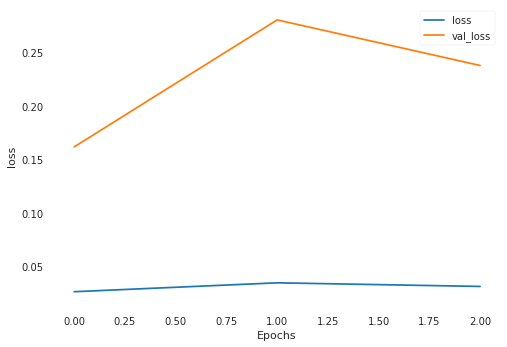

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0243 - val_loss: 0.1008
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0238 - val_loss: 0.0812
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0251 - val_loss: 0.0981
loss cuts = tf.Tensor([1.0628844], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.115725, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9539184], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.029207, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0121721], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.537899, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9642916], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.941225, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9915308], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.71121, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0357631], sha

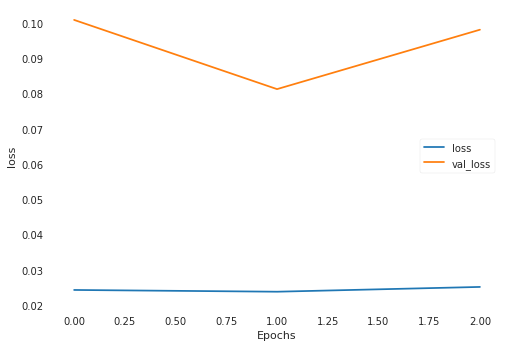

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0251 - val_loss: 0.1230
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0272 - val_loss: 0.1411
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0246 - val_loss: 0.1051
loss cuts = tf.Tensor([2.3031516], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.0766926, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3323343], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.20905, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.104679], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.2217064, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0919642], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.169618, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3661675], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.364632, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.349874], shape=(1

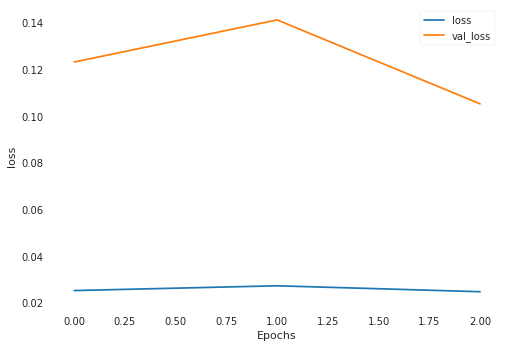

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0229 - val_loss: 0.1664
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0241 - val_loss: 0.0783
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0256 - val_loss: 0.3859
loss cuts = tf.Tensor([2.2068622], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7976949, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1771762], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8516035, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2011592], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.80791456, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.229722], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7573836, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2376308], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7436804, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1802216], sh

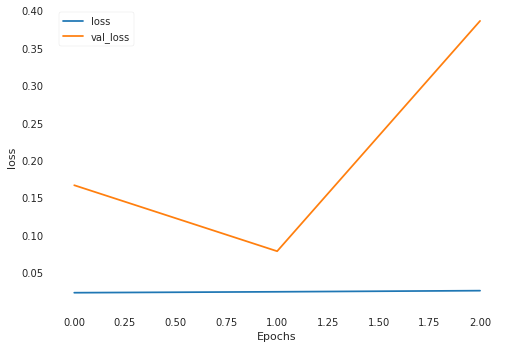

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0399 - val_loss: 0.2381
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0317 - val_loss: 0.1145
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0285 - val_loss: 0.1551
loss cuts = tf.Tensor([1.0719169], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27887174, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2174926], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14631194, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.96515894], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4030232, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.885005], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5112179, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8457923], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5688293, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82696295],

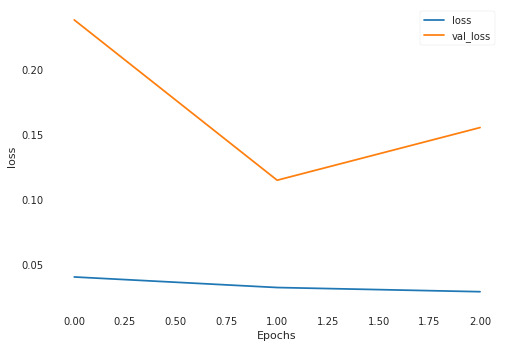

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0283 - val_loss: 0.1300
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0251 - val_loss: 0.1602
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0223 - val_loss: 0.1388
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.9953144], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0031107161, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3771796], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10633561, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3819284], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10945526, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3728774], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10354825, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3726674], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.103413194, shape=(), dtype=float32)
l

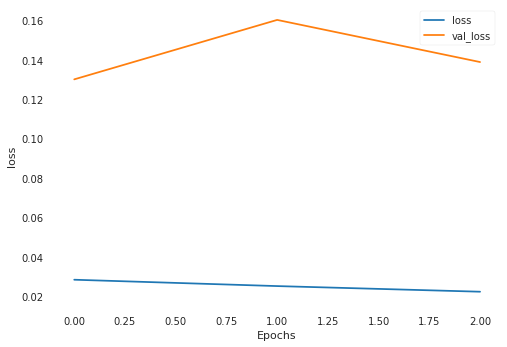

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0231 - val_loss: 0.1740
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0248 - val_loss: 0.1643
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0247 - val_loss: 0.1087
loss cuts = tf.Tensor([0.7797264], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03162081, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7604815], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03883553, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77506876], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.033298966, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.81827617], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.019396866, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3643534], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16549, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.316921

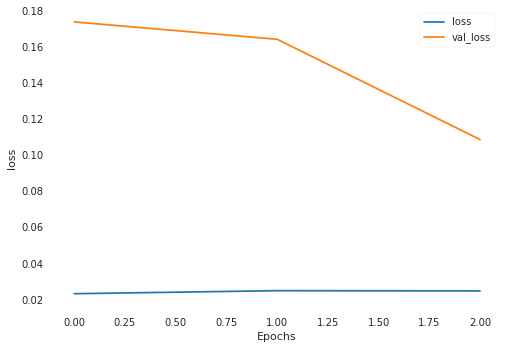

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0262 - val_loss: 0.2757
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0264 - val_loss: 0.3615
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0251 - val_loss: 0.4165
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3912449], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1908156, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3089858], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0180522, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4746511], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3798053, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5477657], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5569195, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.500828], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4419881, shape=(), dtype=float32)
loss cuts 

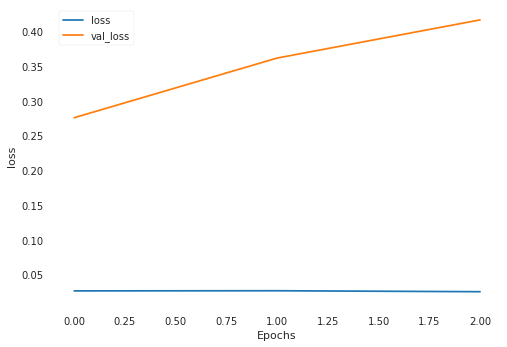

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.1730 - val_loss: 0.4160
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.1604 - val_loss: 0.3201
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.1075 - val_loss: 0.2692
loss cuts = tf.Tensor([0.51957244], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.686199, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63023245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4110522, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6343934], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4011843, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6821867], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2903209, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6781533], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2995005, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6829483], s

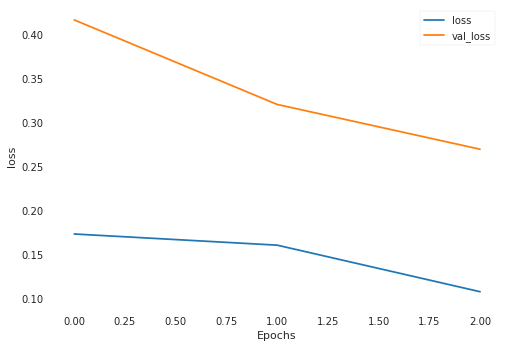

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0406 - val_loss: 0.3725
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0282 - val_loss: 0.2320
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0239 - val_loss: 0.3073
loss cuts = tf.Tensor([1.3729465], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.2524614, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3774765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.2337995, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2529399], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.761806, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8581443], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4867775, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0032067], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0503078, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.301799], shap

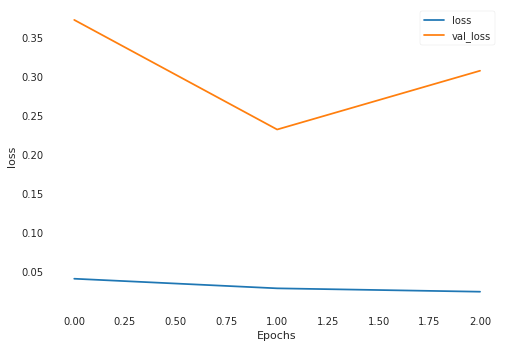

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0228 - val_loss: 0.1405
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0397 - val_loss: 0.0892
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0254 - val_loss: 0.0879
loss cuts = tf.Tensor([0.9253849], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.055471975, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91349113], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.061215986, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8955803], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07039973, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68533367], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22617263, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66774756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24320897, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60

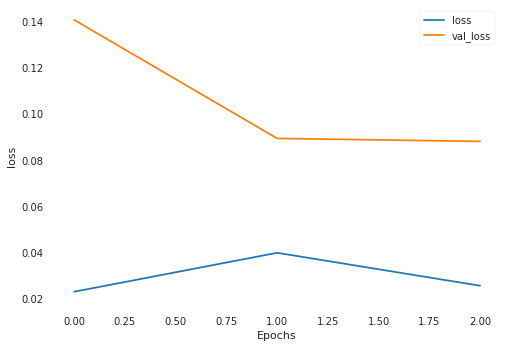

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0228 - val_loss: 0.2355
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0220 - val_loss: 0.1570
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0226 - val_loss: 0.2018
loss cuts = tf.Tensor([1.8085747], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.52090055, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8089705], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.521472, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7118456], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3906317, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6976343], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3730694, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9556036], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7547497, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8679202], sh

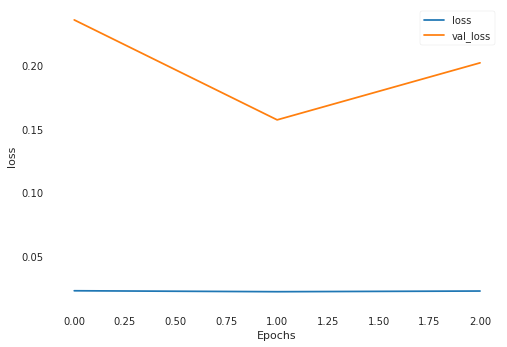

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0259 - val_loss: 0.1383
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0243 - val_loss: 0.2232
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0234 - val_loss: 0.1840
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4132235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3616822, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5198171], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0454233, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4128679], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3627753, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4245954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3268595, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2151563], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0096827, shape=(), dtype=float32)
loss cuts

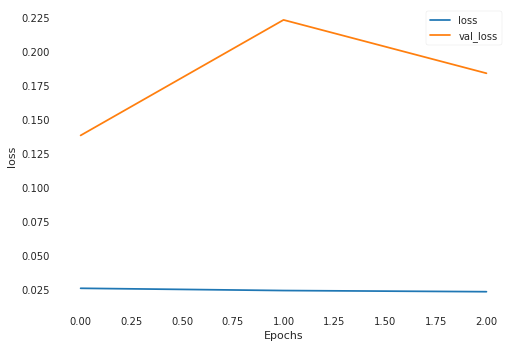

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0234 - val_loss: 0.1587
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0291 - val_loss: 0.1011
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0237 - val_loss: 0.1094
loss cuts = tf.Tensor([0.66404104], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1793069, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60687506], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3067347, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.61807007], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2812653, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6327912], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2481554, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63437986], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2446083, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6333921]

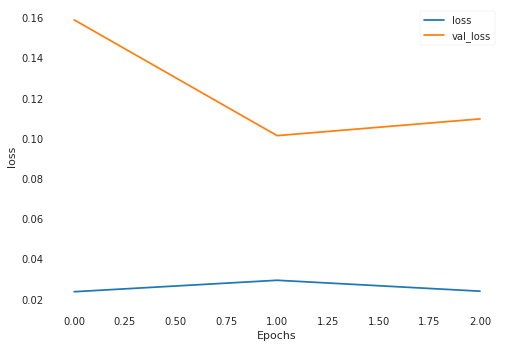

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0250 - val_loss: 0.0684
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0265 - val_loss: 0.0757
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0232 - val_loss: 0.0615
loss cuts = tf.Tensor([1.0732408], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32860497, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2082989], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50168735, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2697268], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5924793, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1375904], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6817024, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1433997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7007625, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.318351], s

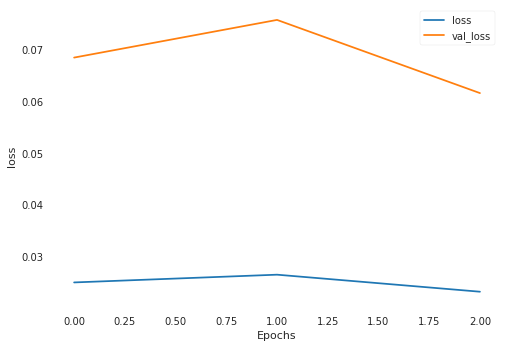

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0252 - val_loss: 0.1708
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0292 - val_loss: 0.3385
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0257 - val_loss: 0.1638
loss cuts = tf.Tensor([2.3326824], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3491154, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3344417], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3545113, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3482416], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.397052, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2609327], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1343246, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3340032], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.353166, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3730788], shap

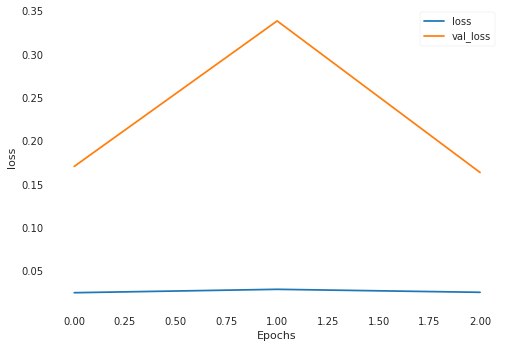

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0257 - val_loss: 0.0693
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0253 - val_loss: 0.0912
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0258 - val_loss: 0.0790
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.6424137], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09460934, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6051521], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11892009, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6331687], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.100382105, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6489798], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0906132, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6435469], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09391351, shape=(), dtype=float32)
loss

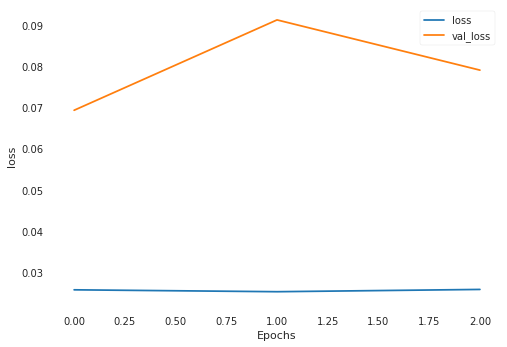

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0251 - val_loss: 0.3284
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0241 - val_loss: 0.3486
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0251 - val_loss: 0.2775
loss cuts = tf.Tensor([1.5899389], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.263429, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3728755], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.087728456, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4454561], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13599175, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97579664], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010178572, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9439364], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017622335, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94152

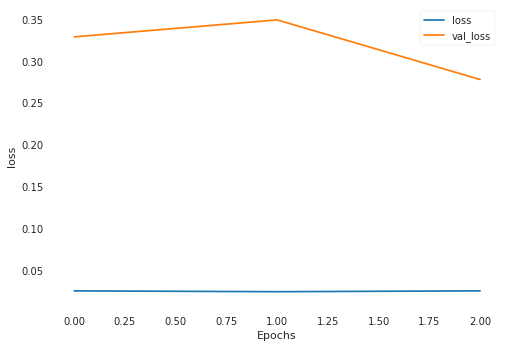

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0273 - val_loss: 0.1339
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0294 - val_loss: 0.1118
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0276 - val_loss: 0.0811
loss cuts = tf.Tensor([1.2659931], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04931767, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2884868], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.039833013, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4773874], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.000114094655, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4507669], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0013914405, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3799405], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0116917575, shape=(), dtype=float32)
loss cuts = tf.Tensor([

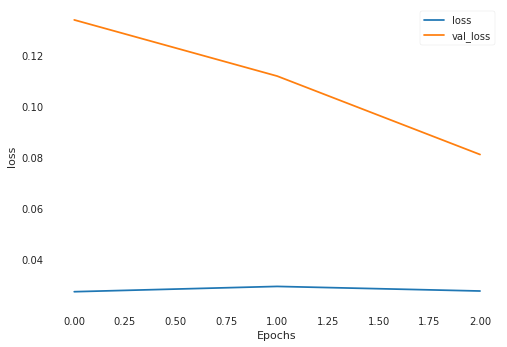

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0249 - val_loss: 0.0879
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0244 - val_loss: 0.0846
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0256 - val_loss: 0.1008
loss cuts = tf.Tensor([2.1120095], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2706494, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.114022], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2751906, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0611815], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1586432, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0061755], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0432516, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0960064], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2348272, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1927423], sha

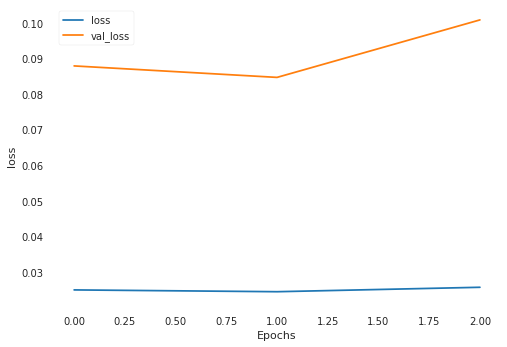

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0244 - val_loss: 0.1179
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0252 - val_loss: 0.1760
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0287 - val_loss: 0.1114
loss cuts = tf.Tensor([1.3990234], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8987369, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3408202], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7917692, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3371433], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7852392, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2722394], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6744243, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2015989], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5633896, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1653838], sh

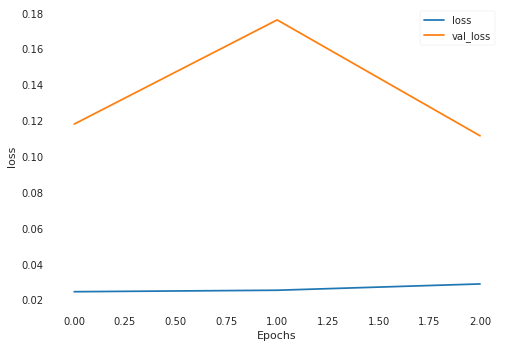

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0264 - val_loss: 0.3408
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0262 - val_loss: 0.3357
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0244 - val_loss: 0.2702
loss cuts = tf.Tensor([1.2392441], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6610928, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1957246], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.59221745, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1621131], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5416152, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2221265], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.63355, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2301875], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6464475, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2471737], sha

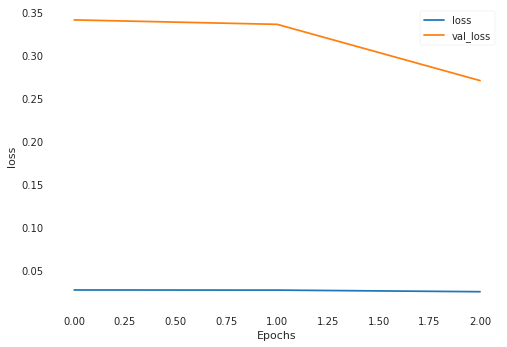

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0273 - val_loss: 0.1901
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0281 - val_loss: 0.1642
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0270 - val_loss: 0.1356
loss cuts = tf.Tensor([0.5305028], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.058358077, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53457713], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05640617, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.54705036], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.050636973, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.52571565], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.060693897, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45300347], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1018079, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2

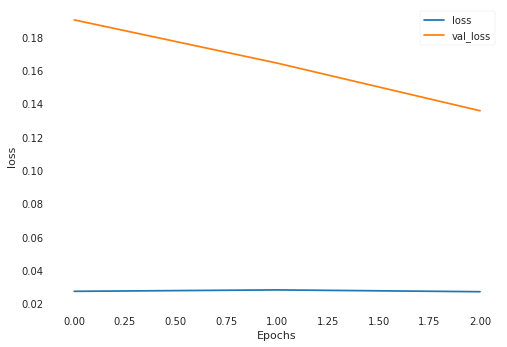

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0248 - val_loss: 0.0998
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0263 - val_loss: 0.0862
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0255 - val_loss: 0.1165
loss cuts = tf.Tensor([0.6443787], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24441032, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57182354], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1779351, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68895644], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.290474, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5941146], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19723777, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5897373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19336888, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.59220624

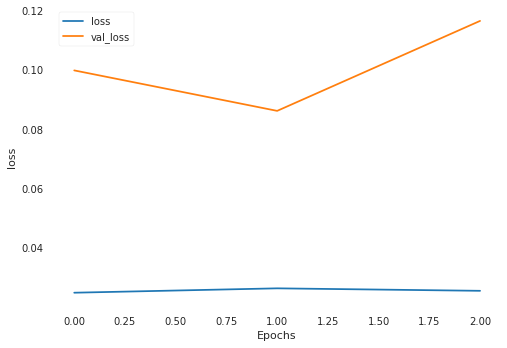

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0281 - val_loss: 0.1783
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0240 - val_loss: 0.0553
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0254 - val_loss: 0.0719
loss cuts = tf.Tensor([0.9580492], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29371068, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93763125], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3162586, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9534938], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29866907, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9388015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31494373, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93828315], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31552583, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.960844

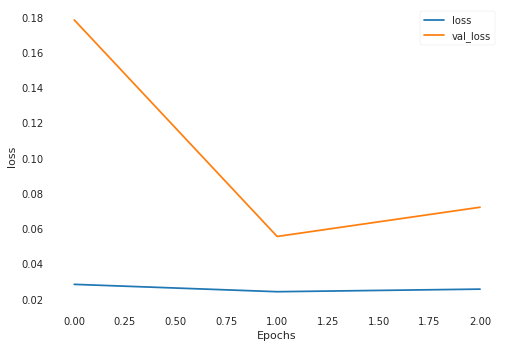

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0270 - val_loss: 0.2230
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0260 - val_loss: 0.2545
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0287 - val_loss: 0.2586
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6162035], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0043829, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5955819], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0020777076, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.59568787], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00208738, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8232285], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0746538, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7891705], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.057202525, shape=(), dtype=float32)
lo

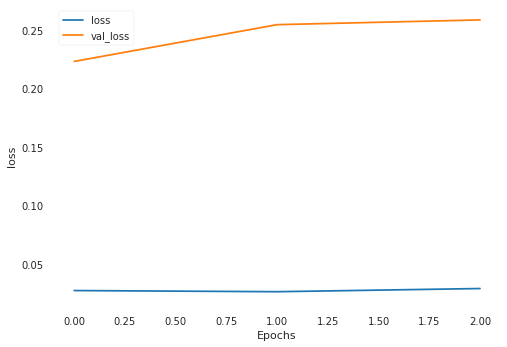

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0299 - val_loss: 0.1259
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0292 - val_loss: 0.1559
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0293 - val_loss: 0.1704
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4238954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.031012854, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3844777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04644986, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4173054], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.033377342, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4453052], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02393048, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4758968], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015401602, shape=(), dtype=float32)
l

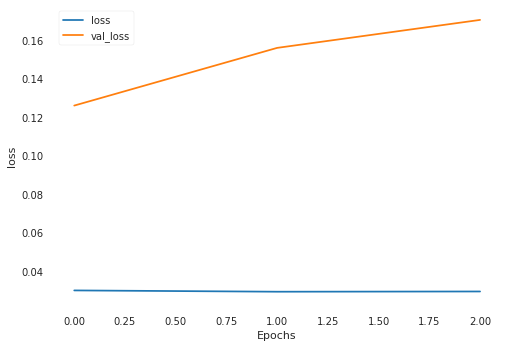

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0266 - val_loss: 0.1736
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0252 - val_loss: 0.1455
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0309 - val_loss: 0.1557
loss cuts = tf.Tensor([3.0562186], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.114964, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9879026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.8106203, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.98951], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.817674, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0097659], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4766524, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0907245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6799645, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7983756], shape=

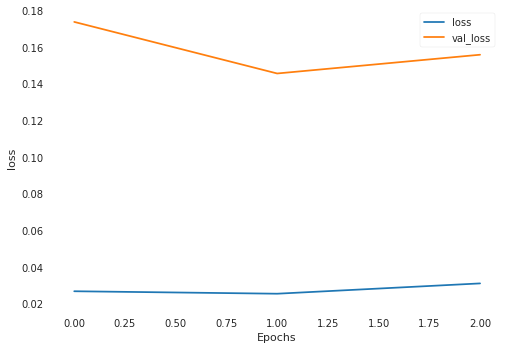

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0291 - val_loss: 0.0986
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0260 - val_loss: 0.0915
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0263 - val_loss: 0.0934
loss cuts = tf.Tensor([1.2329502], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6675703, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2260419], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.67890686, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2239025], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.68243706, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2695299], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6091334, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2614048], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6218824, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2488558], 

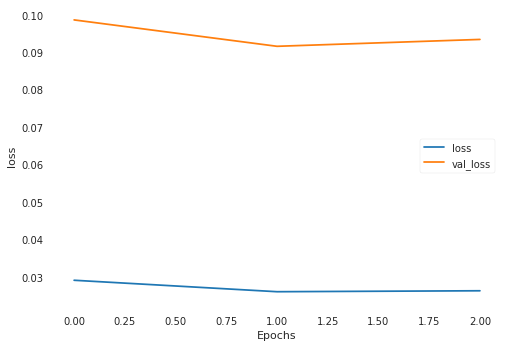

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0285 - val_loss: 0.1293
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0283 - val_loss: 0.0754
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0266 - val_loss: 0.0675
loss cuts = tf.Tensor([1.0081741], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2935753, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.985937], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.318167, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9937887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30937093, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99171245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31168494, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9709546], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33529353, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0638903], 

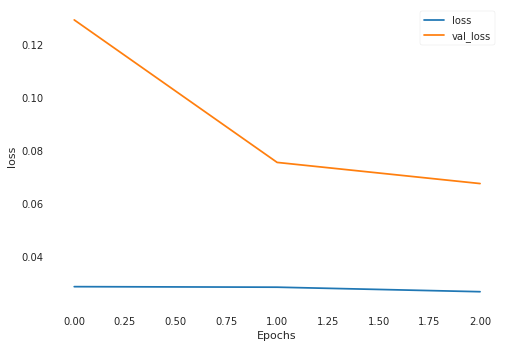

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0322 - val_loss: 0.1439
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0322 - val_loss: 0.1525
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0303 - val_loss: 0.1506
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.989555], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29255855, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.96248657], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26400933, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93528277], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23679376, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9435859], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24494351, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9411835], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24257134, shape=(), dtype=float32)
los

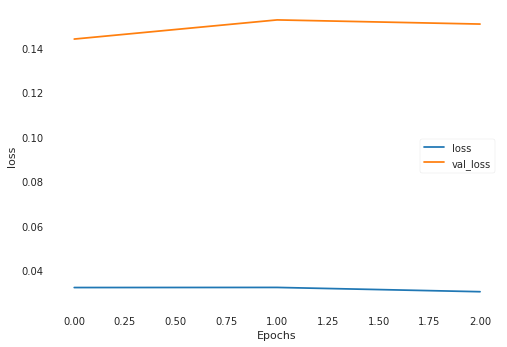

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0251 - val_loss: 0.0899
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0250 - val_loss: 0.0704
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0288 - val_loss: 0.4195
loss cuts = tf.Tensor([0.35070598], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.040230293, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3456087], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.038211506, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37929463], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.052515935, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.40398702], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06444284, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.41426235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06976533, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.

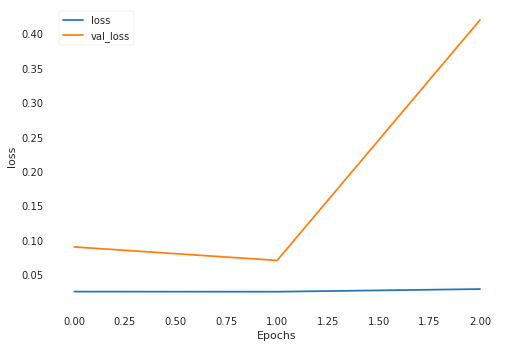

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.2689 - val_loss: 0.4758
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.1851 - val_loss: 0.2250
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0750 - val_loss: 0.2145
loss cuts = tf.Tensor([1.4864267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45743513, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5237823], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40830052, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5174146], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.41647875, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5645474], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35786572, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5779072], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34206006, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5829439

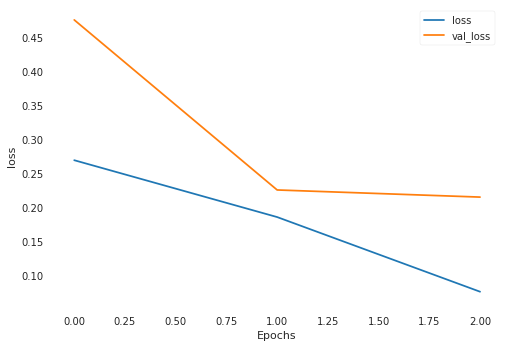

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0451 - val_loss: 0.0816
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0369 - val_loss: 0.0934
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0320 - val_loss: 0.0810
loss cuts = tf.Tensor([1.1922013], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.8006134, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1956512], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.782632, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1919494], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.801928, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1929475], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.796722, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1894777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.8148265, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1627858], shape

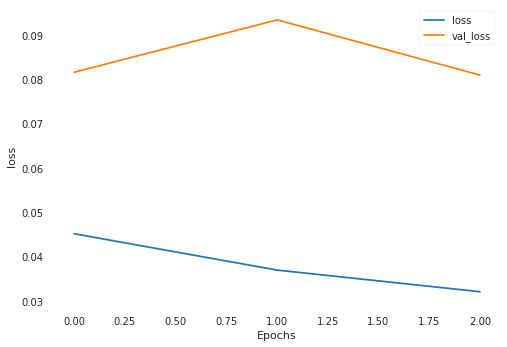

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0287 - val_loss: 0.0953
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0307 - val_loss: 0.0817
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0281 - val_loss: 0.0960
loss cuts = tf.Tensor([1.599725], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.017697, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4819331], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7939127, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.391881], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.641546, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4401333], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7211712, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4647211], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7635365, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4825718], shape=

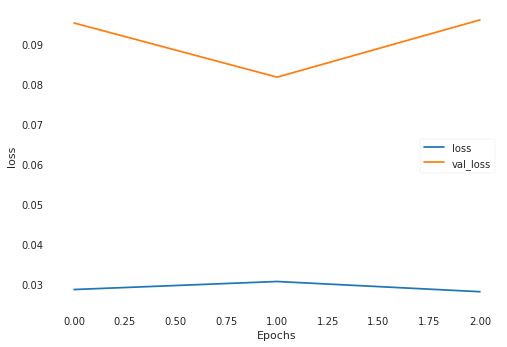

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0274 - val_loss: 0.0631
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0339 - val_loss: 0.0559
Epoch 3/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0270 - val_loss: 0.0499
loss cuts = tf.Tensor([1.6700673], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23033547, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5437927], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36748737, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5323572], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38148272, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.549303], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36083692, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5502161], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35974085, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5283067]

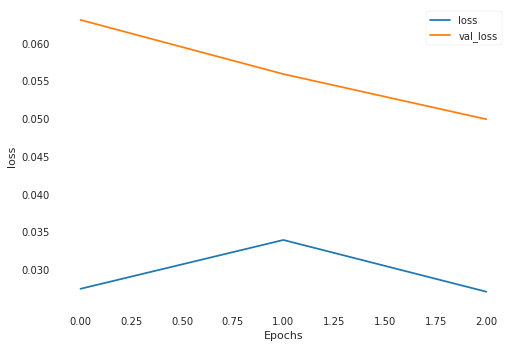

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0256 - val_loss: 0.1083
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0257 - val_loss: 0.0654
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0296 - val_loss: 0.0986
loss cuts = tf.Tensor([1.3253016], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8561832, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1976882], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6363065, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7495959], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8214091, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7163036], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7326552, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6995792], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6889063, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7257171], sh

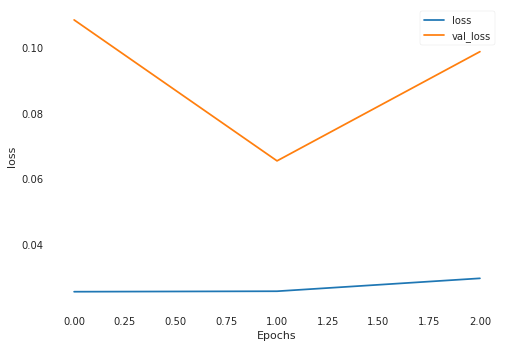

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0265 - val_loss: 0.0878
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0247 - val_loss: 0.0610
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0269 - val_loss: 0.0808
loss cuts = tf.Tensor([2.4587166], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9844826, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4501832], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.960513, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5282674], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1852746, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6111264], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.437116, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6139784], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4460285, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2253525], shap

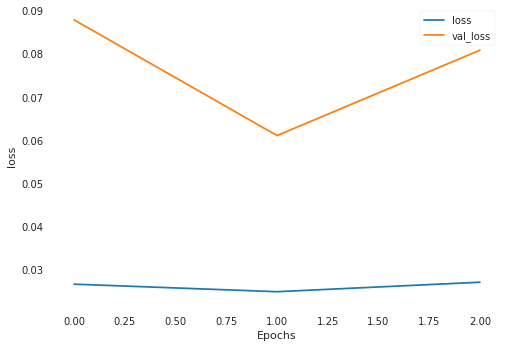

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0277 - val_loss: 0.0830
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0249 - val_loss: 0.1070
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0247 - val_loss: 0.0649
loss cuts = tf.Tensor([1.9187167], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.4921021, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6254998], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4822, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4754092], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0317914, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4833921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.054613, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4889214], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.070495, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4882265], shape=(

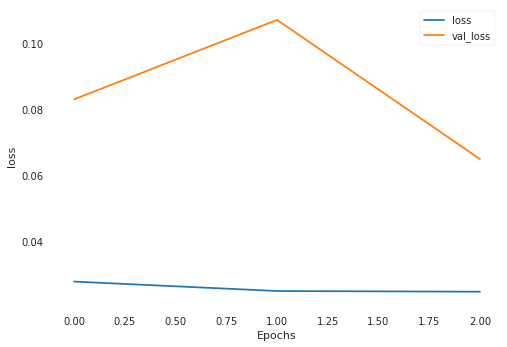

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0248 - val_loss: 0.1347
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0308 - val_loss: 0.1474
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0282 - val_loss: 0.1611
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.6282636], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.630029, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.588708], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.759891, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5990262], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7257144, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6488665], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5636284, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6701101], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.496052, shape=(), dtype=float32)
loss cuts = t

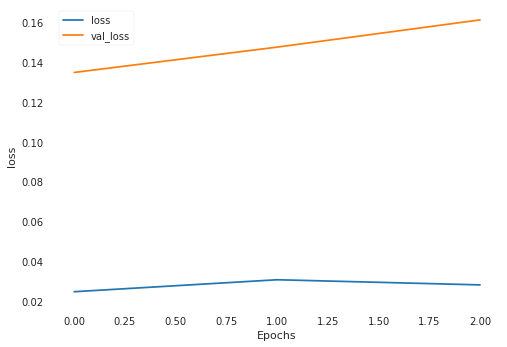

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0310 - val_loss: 0.1596
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0258 - val_loss: 0.1643
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0241 - val_loss: 0.2383
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0038302], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0018012697, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0958102], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.002454074, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0378208], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.141512e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.030267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.000256146, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0302196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00025766695, shape=(), dtype=float

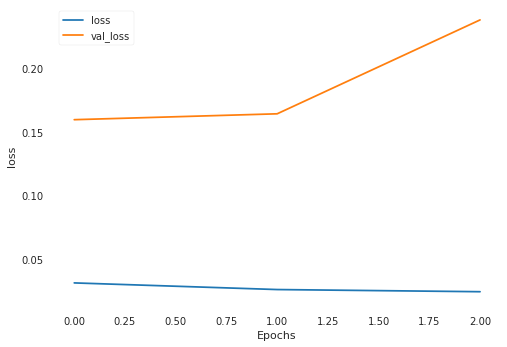

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0270 - val_loss: 0.1048
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0291 - val_loss: 0.1097
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0268 - val_loss: 0.1109
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.386934], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36838415, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3884532], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3665423, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3394176], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4283219, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4018865], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3504571, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4024848], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34974906, shape=(), dtype=float32)
loss cut

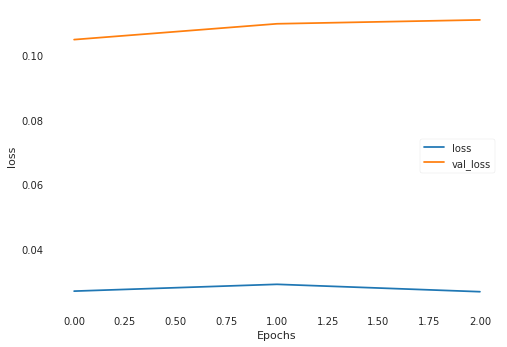

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0271 - val_loss: 0.2968
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0240 - val_loss: 0.2676
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0236 - val_loss: 0.2862
loss cuts = tf.Tensor([0.78942597], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4088656, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90293777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.56691533, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8388562], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47452292, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71583486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32016912, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6822685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2833098, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.681150

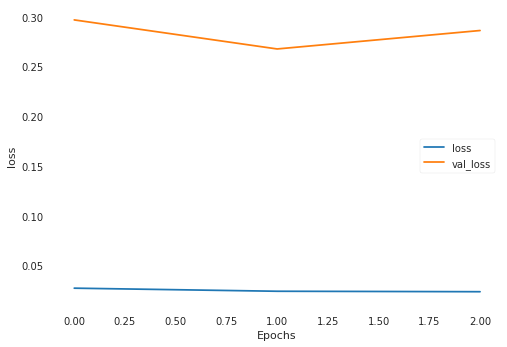

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0273 - val_loss: 0.2467
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0346 - val_loss: 0.2328
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0268 - val_loss: 0.2629
loss cuts = tf.Tensor([1.4529938], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8062412, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4797317], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7350863, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2082971], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5238447, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4788415], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7374321, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4947615], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.695717, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4792116], sha

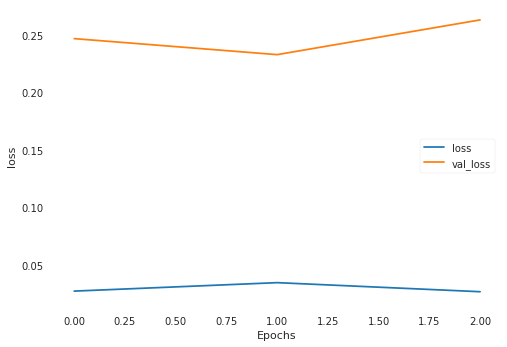

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0261 - val_loss: 0.3031
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0288 - val_loss: 0.1914
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0241 - val_loss: 0.1656
loss cuts = tf.Tensor([1.2289203], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12920052, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2257924], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12696166, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2307777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13053924, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2559745], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14938141, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2249042], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12632947, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2426219

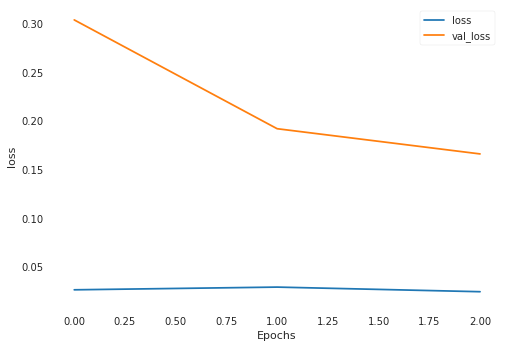

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0262 - val_loss: 0.0999
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0252 - val_loss: 0.1410
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0268 - val_loss: 0.1339
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4361567], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012286898, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5255833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00045880626, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5085448], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0014790354, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3663957], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.032619003, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3941143], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.023374977, shape=(), dtype=float

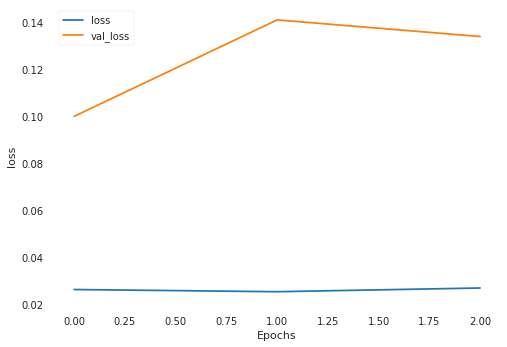

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0252 - val_loss: 1.3311
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0253 - val_loss: 1.0811
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0272 - val_loss: 1.2110
loss cuts = tf.Tensor([1.0956463], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(39.27503, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0633876], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(39.6804, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0648772], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(39.661636, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0751545], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(39.532288, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0685453], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(39.615448, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0677044], shape

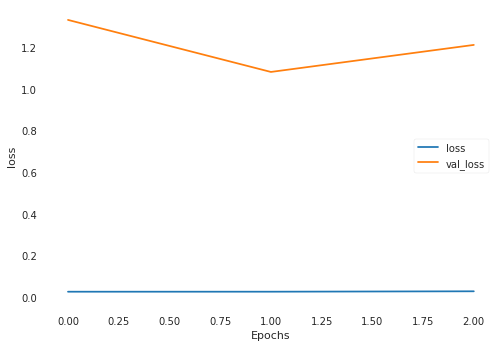

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0333 - val_loss: 0.4134
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0331 - val_loss: 0.3481
Epoch 3/3
882/882 [==============================] - 0s 362us/sample - loss: 0.0268 - val_loss: 0.2011
loss cuts = tf.Tensor([1.5895412], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.974776, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5465636], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.274068, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6230452], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.74402, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6198927], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.765638, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6226592], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.746666, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5816901], sha

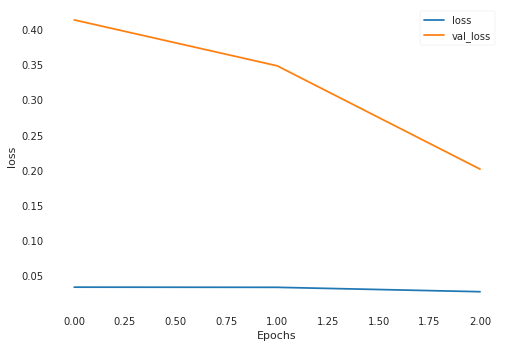

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0277 - val_loss: 0.2376
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0342 - val_loss: 0.2294
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0282 - val_loss: 0.1514
loss cuts = tf.Tensor([2.540607], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011966854, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2266753], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17920391, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1058383], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29611206, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1011517], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30123454, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.277541], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13872583, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1955173]

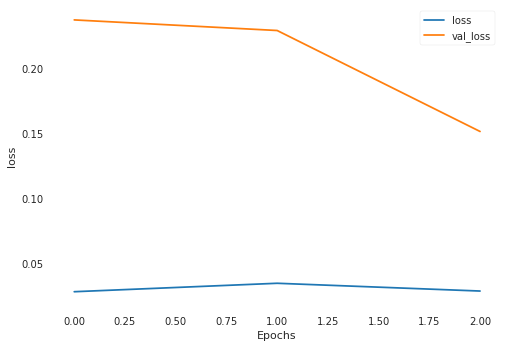

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0285 - val_loss: 0.0740
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0294 - val_loss: 0.0878
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0255 - val_loss: 0.0668
loss cuts = tf.Tensor([1.6098009], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.960892, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7273432], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.506843, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7192702], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5371442, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7261944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.511147, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7155457], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5511677, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.888635], shape=

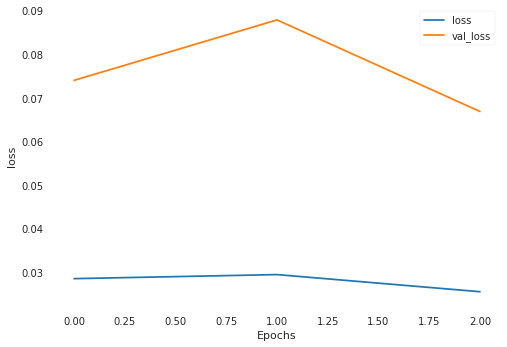

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0268 - val_loss: 0.7461
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0255 - val_loss: 0.3275
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0277 - val_loss: 0.5800
loss cuts = tf.Tensor([1.443011], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05103164, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4809577], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.035327137, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4821703], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.034872778, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4284594], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.057817876, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6365592], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.001046758, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6676

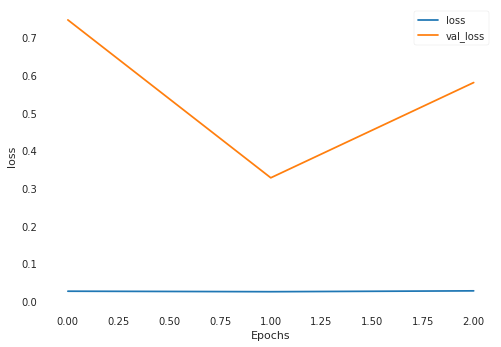

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.1158 - val_loss: 0.8116
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.1035 - val_loss: 0.3759
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0467 - val_loss: 0.1218
loss cuts = tf.Tensor([1.9802345], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.732935, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8782597], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.37961, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.968556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.805942, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0490012], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.308593, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0577927], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.255025, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9553177], shape=(1

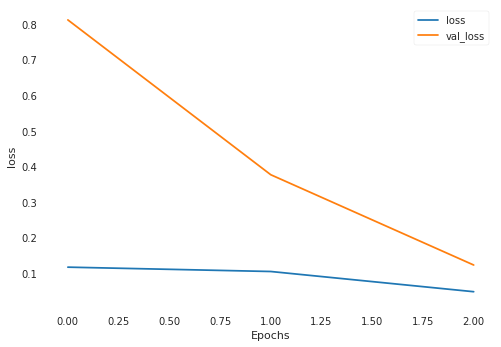

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0286 - val_loss: 0.1625
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0259 - val_loss: 0.1406
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0255 - val_loss: 0.2743
loss cuts = tf.Tensor([2.2783582], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6927063, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2484658], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.808485, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2925043], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.638539, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3625712], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3761437, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3054943], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5891511, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.354019], shape

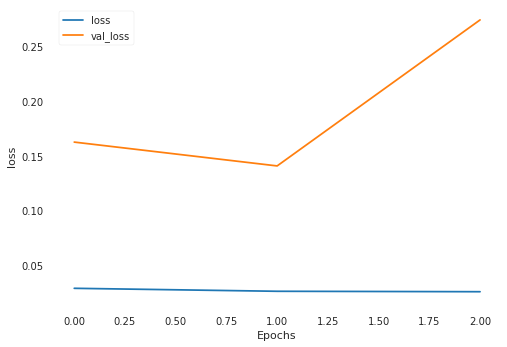

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0273 - val_loss: 0.1279
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0346 - val_loss: 0.1786
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0296 - val_loss: 0.0757
loss cuts = tf.Tensor([2.383983], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4404118, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4131763], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5324748, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.421976], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5605597, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.646582], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6802635, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6453923], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6783024, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6899561], shape

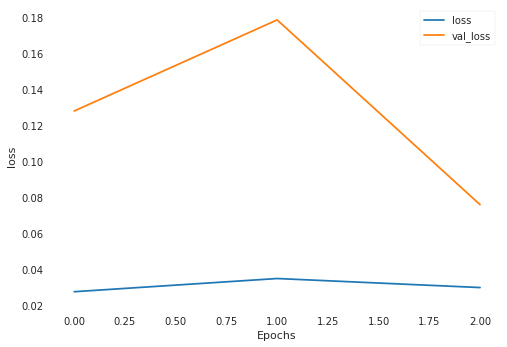

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0249 - val_loss: 0.4647
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0248 - val_loss: 0.5133
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0243 - val_loss: 0.4276
loss cuts = tf.Tensor([2.7131891], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08709201, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7183824], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0840538, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7681856], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05765621, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.80107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.042945396, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.005817], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.1789633e-06, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.046259]

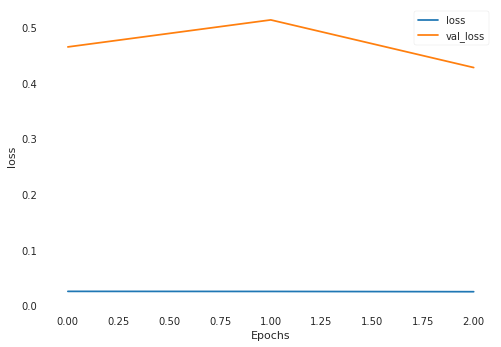

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0270 - val_loss: 0.2340
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0354 - val_loss: 0.1722
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0314 - val_loss: 0.3216
loss cuts = tf.Tensor([2.5303266], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7646583, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.516819], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8007278, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.508047], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.824347, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7814636], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.160505, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.55778], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09057151, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.5528193], shape=(

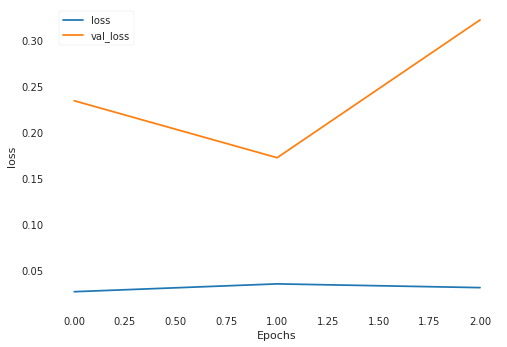

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0307 - val_loss: 0.1833
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0253 - val_loss: 0.0798
Epoch 3/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0263 - val_loss: 0.1892
loss cuts = tf.Tensor([3.511941], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7620478, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.5598423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9235609, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.668985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.308706, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.6381433], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1974564, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.5925553], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0364988, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.4847965], shape

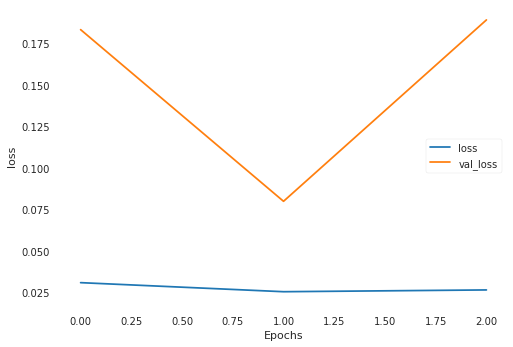

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0303 - val_loss: 0.2027
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0305 - val_loss: 0.1995
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0288 - val_loss: 0.2114
loss cuts = tf.Tensor([2.84628], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.74067, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8470566], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.7447033, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9216661], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.1378, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8645582], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.8359146, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8683054], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.8555236, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.1384203], shape=(1,

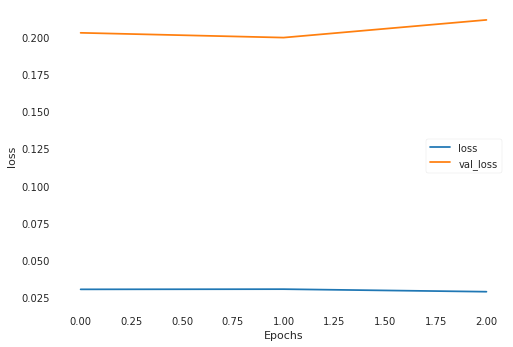

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0245 - val_loss: 0.1368
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0239 - val_loss: 0.1062
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0224 - val_loss: 0.1006
loss cuts = tf.Tensor([2.278736], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.68680346, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2825463], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.69313323, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3007913], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7238457, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1045022], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42837307, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.020078], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3249888, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0367093], s

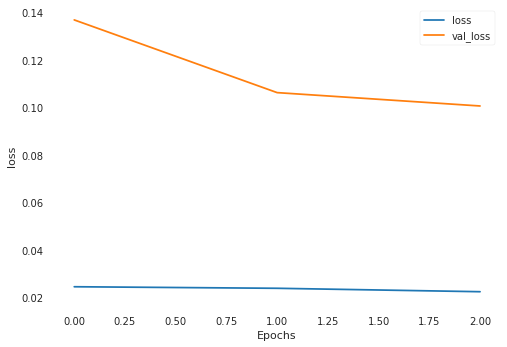

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0247 - val_loss: 0.1759
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0325 - val_loss: 0.2684
Epoch 3/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0343 - val_loss: 0.1369
loss cuts = tf.Tensor([2.5015798], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.751787, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5047293], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.73543, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4934902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.793893, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.502924], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.7448034, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4892578], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.815974, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4870312], shape=(1

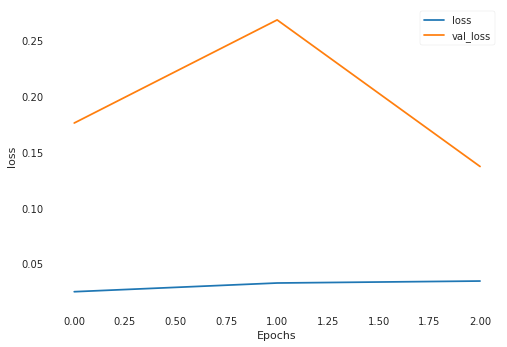

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0291 - val_loss: 0.2467
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0266 - val_loss: 0.1479
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0258 - val_loss: 0.1172
loss cuts = tf.Tensor([1.1571352], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40999237, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1862943], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37350115, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.127322], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4490605, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2167133], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3372455, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1563928], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.41094372, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1529933], 

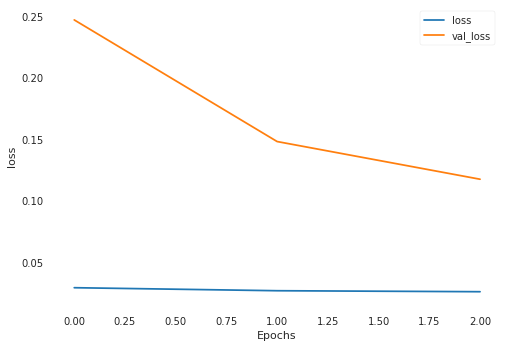

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0241 - val_loss: 0.1178
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0251 - val_loss: 0.1066
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0246 - val_loss: 0.1496
loss cuts = tf.Tensor([1.0438403], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3797764, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0097601], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33893338, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9654715], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28932697, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8070047], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14396288, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77067435], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.117713526, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.761047

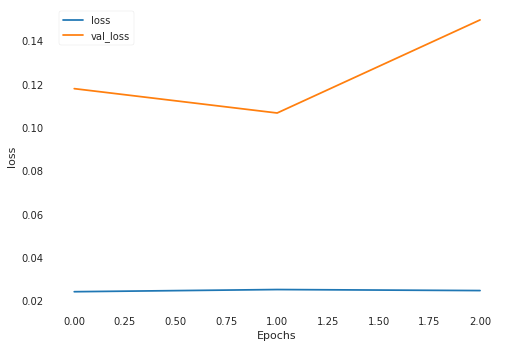

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0331 - val_loss: 1.0754
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0378 - val_loss: 0.9508
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0303 - val_loss: 0.9789
loss cuts = tf.Tensor([0.01381214], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(19.37098, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.01408493], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(19.368578, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.01357708], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(19.373049, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.01597102], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(19.351978, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.01728653], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(19.34041, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.01722659]

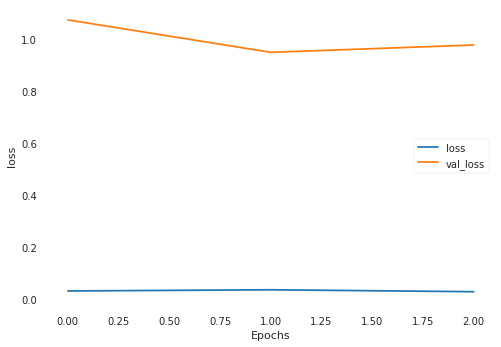

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0249 - val_loss: 0.2218
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0597 - val_loss: 0.2780
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0440 - val_loss: 0.1516
loss cuts = tf.Tensor([1.4811559], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.611422, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4677716], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.675012, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4614666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.7050915, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4484869], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.7672653, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0369264], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.9133835, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1359764], shap

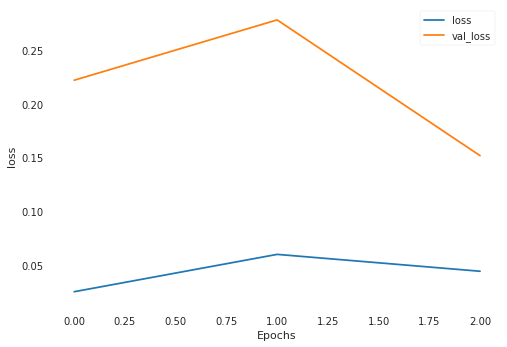

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0334 - val_loss: 0.1032
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0276 - val_loss: 0.0491
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0272 - val_loss: 0.0493
loss cuts = tf.Tensor([0.52642053], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01646204, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.47679213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0061899247, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46264625], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004164146, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46952245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0050988733, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45194608], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.002897672, shape=(), dtype=float32)
loss cuts = tf.Tensor

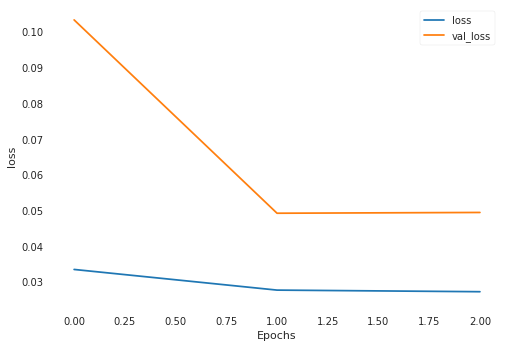

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0246 - val_loss: 0.1796
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0240 - val_loss: 0.1385
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0277 - val_loss: 0.1606
loss cuts = tf.Tensor([0.3631658], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00012469168, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37211332], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00040457558, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3776142], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0006561255, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3705704], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00034488717, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3690235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00028982505, shape=(), dtype=float32)
loss cuts = tf.Te

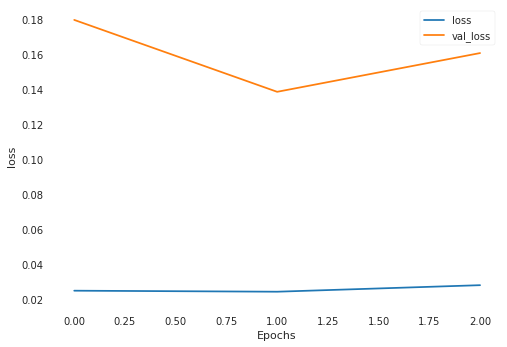

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0287 - val_loss: 0.2289
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0344 - val_loss: 0.4249
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0373 - val_loss: 0.3011
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5765351], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1469567, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6271414], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2579123, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6252505], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2536744, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3492906], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.71185696, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3538374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.71954995, shape=(), dtype=float32)
loss cu

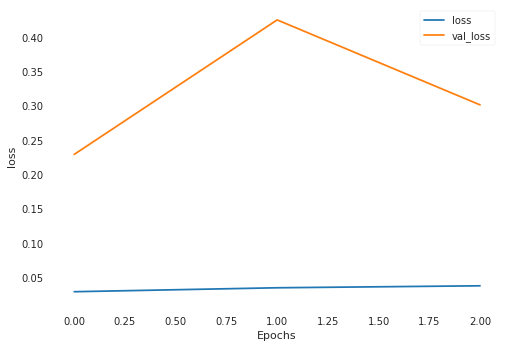

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0298 - val_loss: 0.3142
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0399 - val_loss: 0.2185
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0302 - val_loss: 0.1599
loss cuts = tf.Tensor([2.8195832], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.963112, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9769862], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.7566276, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.0183556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.973407, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.0425074], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.1015463, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.201981], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.976932, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.8367436], shape=

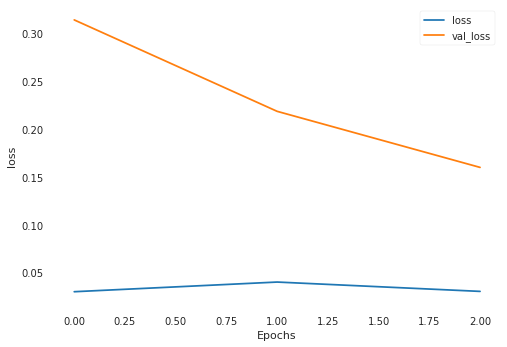

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0237 - val_loss: 0.1148
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0251 - val_loss: 0.0729
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0273 - val_loss: 0.1349
loss cuts = tf.Tensor([2.3486133], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.90513664, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5070024], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6288452, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0580196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5425152, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8594867], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0750785, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8593681], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0754201, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0869043], s

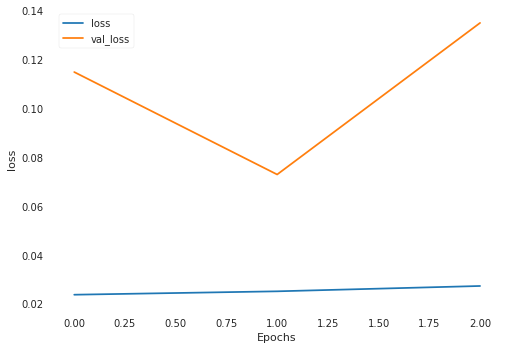

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0260 - val_loss: 0.1010
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0268 - val_loss: 0.0906
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0255 - val_loss: 0.0931
loss cuts = tf.Tensor([1.0644906], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6525342, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2082576], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3035756, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.197666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3278733, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1949394], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3341649, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1965623], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3304183, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1959101], sha

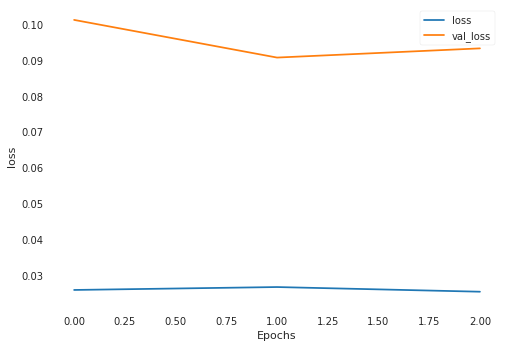

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0280 - val_loss: 0.3475
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0256 - val_loss: 0.2126
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0267 - val_loss: 0.1477
loss cuts = tf.Tensor([1.5570884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7105002, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5724983], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6847592, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4012785], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9974448, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4646477], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8748842, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4531142], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.896593, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5129516], sha

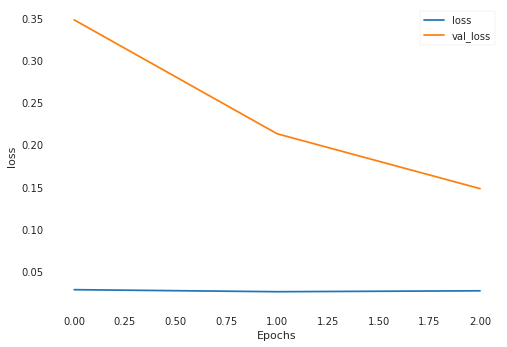

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0476 - val_loss: 0.1954
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0360 - val_loss: 0.1015
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0335 - val_loss: 0.1621
loss cuts = tf.Tensor([2.568874], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.128915, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5363076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.014764, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6279564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3414247, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6108503], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.279179, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4774072], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8136952, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.3687499], shape=

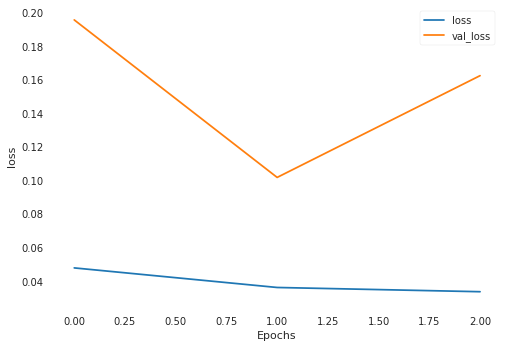

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0309 - val_loss: 0.2390
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0259 - val_loss: 0.1352
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0280 - val_loss: 0.1099
loss cuts = tf.Tensor([2.291094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1547567, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2985177], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1707666, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0088937], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.62789094, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4947426], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6339093, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.529228], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7232599, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5313797], sha

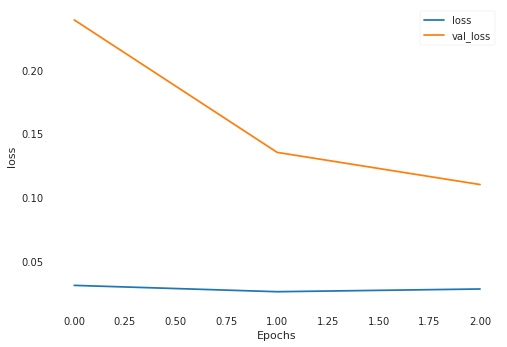

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0252 - val_loss: 0.0901
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0258 - val_loss: 0.0857
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0260 - val_loss: 0.0578
loss cuts = tf.Tensor([1.8129847], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4438071, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8038423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4153066, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1973107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7931225, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2024837], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.813299, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9388323], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8531117, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.135507], shap

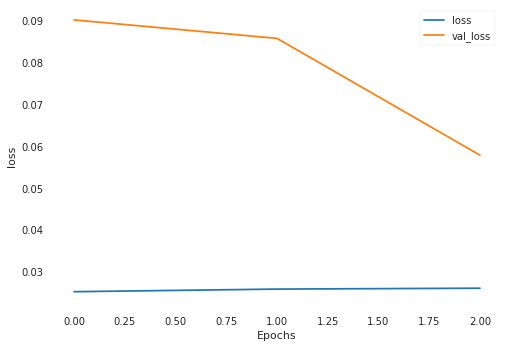

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0306 - val_loss: 0.4573
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0384 - val_loss: 0.3899
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0295 - val_loss: 0.2853
loss cuts = tf.Tensor([2.279264], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5311828, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2829082], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5402149, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2521799], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4648881, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.254149], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4696584, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3121934], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6137615, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3105342], shap

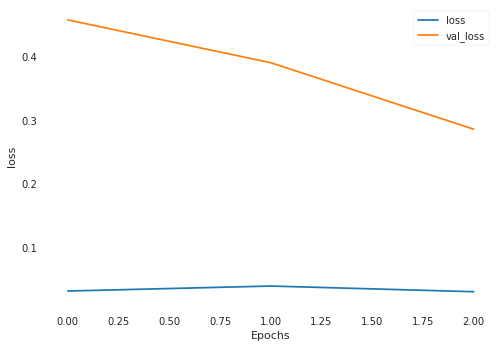

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0335 - val_loss: 0.1539
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0280 - val_loss: 0.1470
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0289 - val_loss: 0.1624
loss cuts = tf.Tensor([2.1766868], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.040226217, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2816076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09332146, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3200793], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11830663, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2652752], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08360958, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3580678], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14588255, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.421195

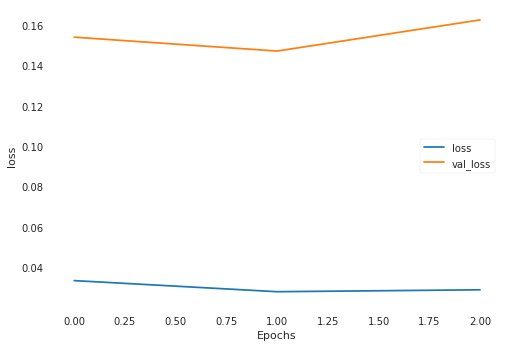

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0256 - val_loss: 0.0942
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0257 - val_loss: 0.2347
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0252 - val_loss: 0.1706
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.027452], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.044813, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1137798], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2991576, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.170827], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4754128, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0360374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0694406, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0026975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9746293, shape=(), dtype=float32)
loss cuts = 

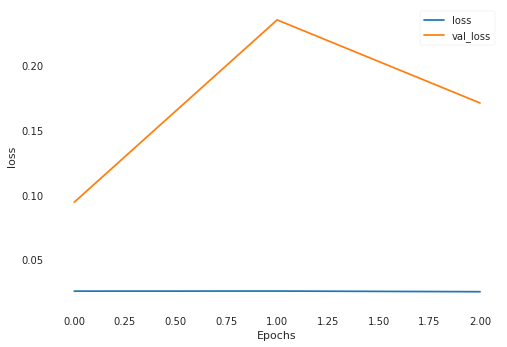

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0277 - val_loss: 0.1029
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0403 - val_loss: 0.1202
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0293 - val_loss: 0.0332
loss cuts = tf.Tensor([1.6085324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.79471445, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5921296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8242287, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0270915], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22364245, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.813983], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47061938, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8105304], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4753683, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8067433], 

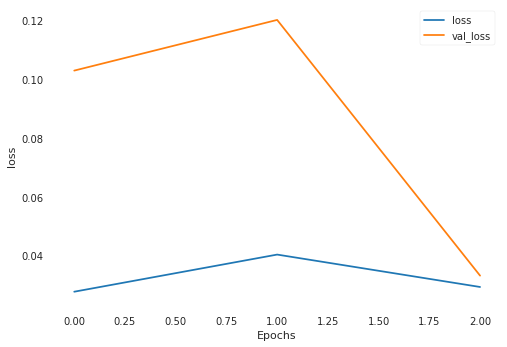

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0246 - val_loss: 0.3800
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0256 - val_loss: 0.4433
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0272 - val_loss: 0.2305
loss cuts = tf.Tensor([2.1515813], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.225033, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2048924], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3458859, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4472033], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16195321, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4428062], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15843351, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7779077], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.53749216, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7710783], 

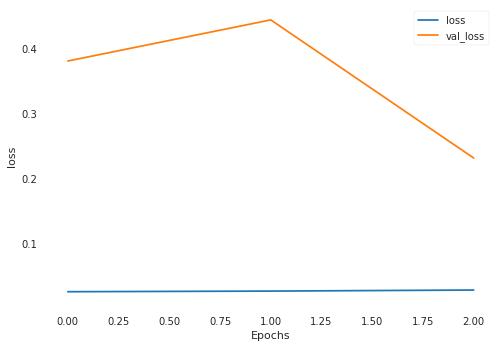

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0319 - val_loss: 0.2751
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0360 - val_loss: 0.1980
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0304 - val_loss: 0.2879
loss cuts = tf.Tensor([2.414486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8362845, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3466256], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7167748, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2192802], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5173641, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2094707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50334877, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4080997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.824645, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7225732], sha

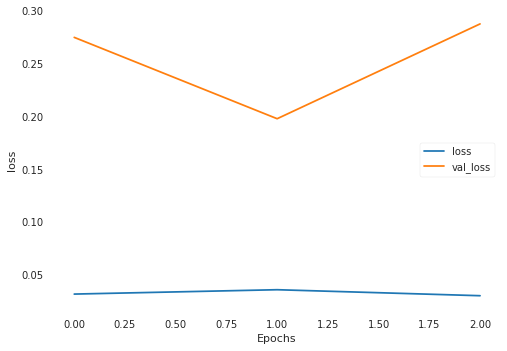

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0257 - val_loss: 0.2386
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0301 - val_loss: 0.4322
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0272 - val_loss: 0.2790
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.7855501], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00035790115, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8362783], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004850632, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.818168], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0026559802, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7513412], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.000233803, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7848586], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00033221414, shape=(), dtype=floa

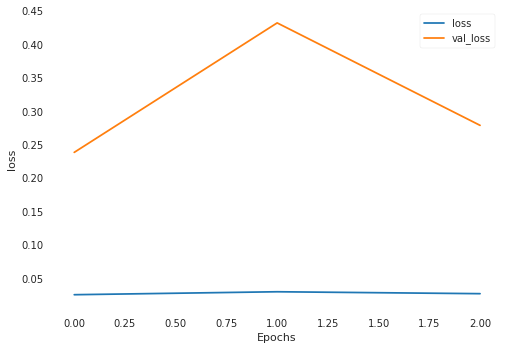

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0290 - val_loss: 0.2416
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0269 - val_loss: 0.2574
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0260 - val_loss: 0.2310
loss cuts = tf.Tensor([1.2512181], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.094797865, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7894732], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.715966, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9632579], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0402623, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9557796], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0250632, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.684373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5491515, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6916293], sh

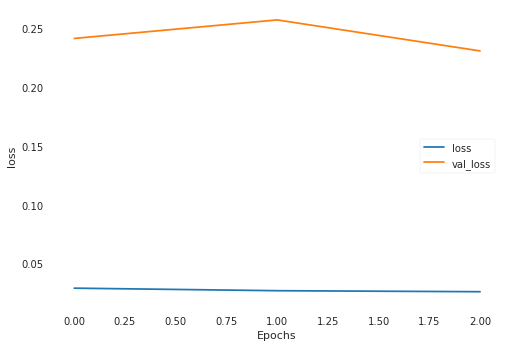

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0317 - val_loss: 3.1076
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0309 - val_loss: 0.1659
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0285 - val_loss: 0.1498
loss cuts = tf.Tensor([1.5672194], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07996489, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6550214], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03801665, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.643231], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.042753413, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6144915], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.055464283, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6249456], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.050649475, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.54536

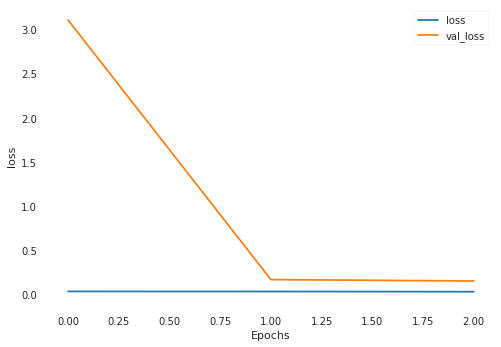

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0285 - val_loss: 0.1883
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0474 - val_loss: 0.2512
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0336 - val_loss: 0.2073
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.45342], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9558061, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4675016], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.995391, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4052165], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8233045, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3806276], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7575046, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4369833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9101032, shape=(), dtype=float32)
loss cuts = 

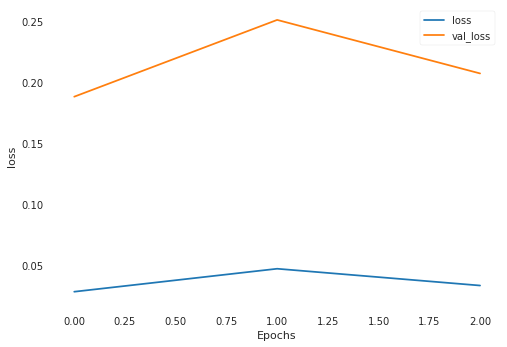

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0275 - val_loss: 0.1061
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0247 - val_loss: 0.0750
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0279 - val_loss: 0.1498
loss cuts = tf.Tensor([1.2200782], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.892235, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2617974], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.541039, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2176015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.913193, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4045403], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.365744, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3765697], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.592833, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3781732], sh

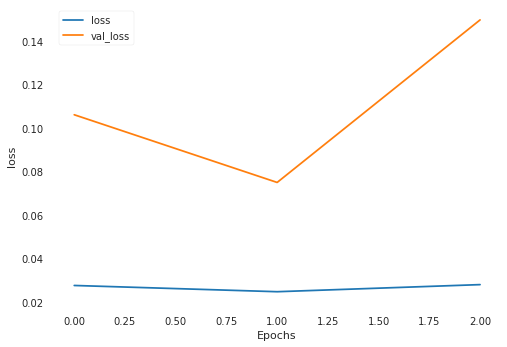

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0278 - val_loss: 0.2054
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0279 - val_loss: 0.1158
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0281 - val_loss: 0.1131
loss cuts = tf.Tensor([2.077344], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.59699726, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9747776], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7660141, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1942396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43002155, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9060965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8909537, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9287047], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8487848, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7649374], s

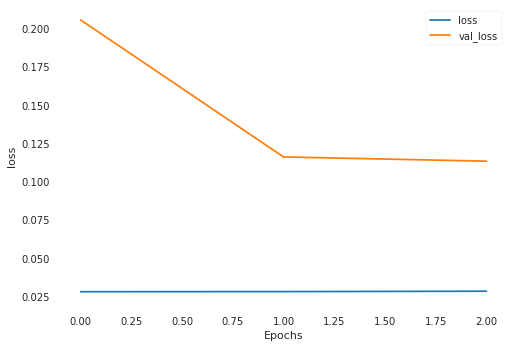

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0284 - val_loss: 0.2407
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0285 - val_loss: 0.2951
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0265 - val_loss: 0.2625
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4540906], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.111107, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9912356], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5320308, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5619886], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.6741943, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6888978], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.239053, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6170242], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.915196, shape=(), dtype=float32)
loss cuts = 

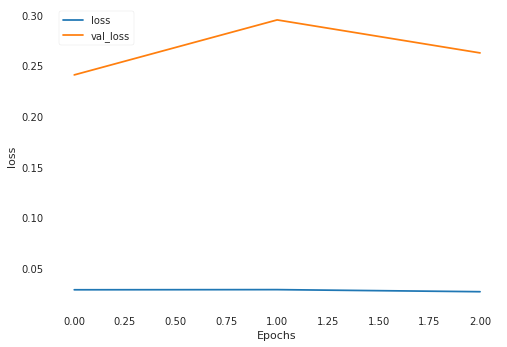

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0294 - val_loss: 0.2059
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0352 - val_loss: 0.0566
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0307 - val_loss: 0.1423
loss cuts = tf.Tensor([3.1341748], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.343785, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.225051], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.730847, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.279309], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.969819, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.0125074], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8514357, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.642555], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5362315, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0953314], shape=(1

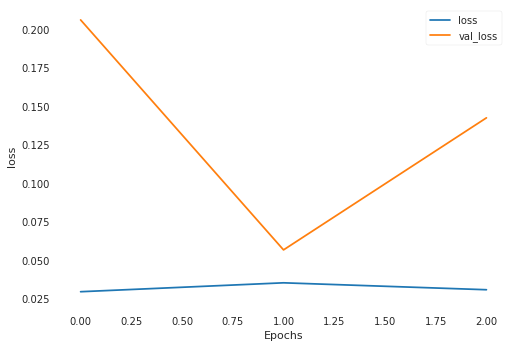

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0253 - val_loss: 0.1364
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0266 - val_loss: 0.1113
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0299 - val_loss: 0.1914
loss cuts = tf.Tensor([1.6654341], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018107962, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6945208], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011125845, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.686108], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012971378, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6800569], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.014386329, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.529869], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.072970755, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7038

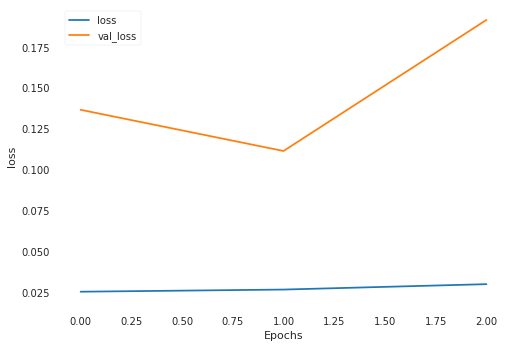

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0287 - val_loss: 0.0971
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0283 - val_loss: 0.1446
Epoch 3/3
882/882 [==============================] - 0s 362us/sample - loss: 0.0358 - val_loss: 0.0882
loss cuts = tf.Tensor([1.9070483], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48018187, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9107617], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4750493, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3747232], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.501303, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.752182], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7187952, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.725253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7651822, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5059673], shap

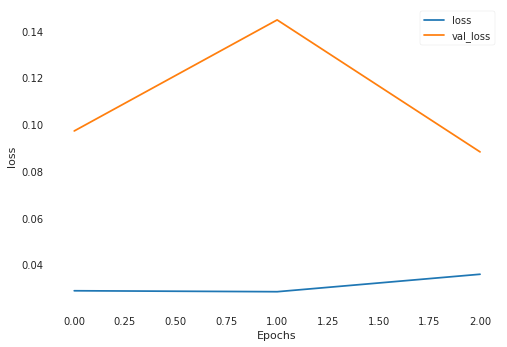

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0298 - val_loss: 0.0988
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0269 - val_loss: 0.0705
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0251 - val_loss: 0.0494
loss cuts = tf.Tensor([1.0101599], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2602631, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9625557], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21395779, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9962144], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24622872, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9686676], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21964934, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9687034], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21968287, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98750204

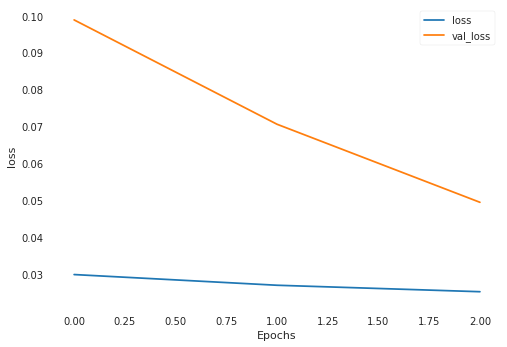

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0253 - val_loss: 0.2551
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0349 - val_loss: 0.2092
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0310 - val_loss: 0.2223
loss cuts = tf.Tensor([1.068378], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.863909, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0643092], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.902836, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0644444], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.90154, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0706097], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.842571, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0623105], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.921968, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1524625], shap

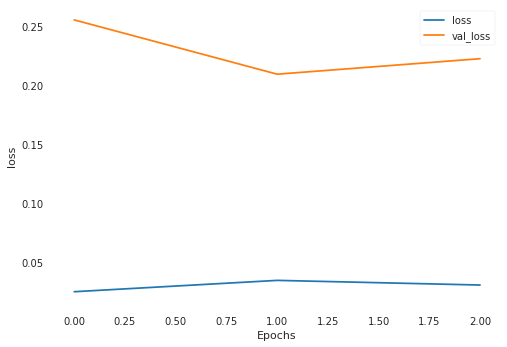

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0258 - val_loss: 0.3298
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0297 - val_loss: 0.3735
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0293 - val_loss: 0.2955
loss cuts = tf.Tensor([0.97231376], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9132334, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.96987575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.917899, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0239184], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8172663, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9902426], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8792881, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4137267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26442173, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4075028], 

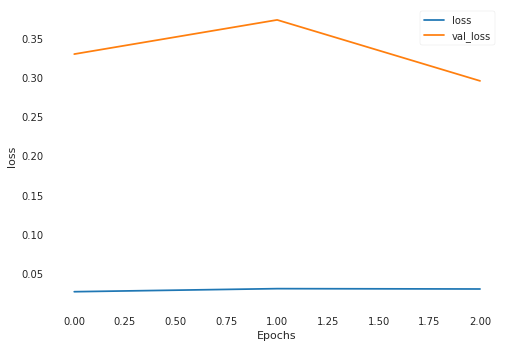

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0325 - val_loss: 0.3089
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0375 - val_loss: 0.2003
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0300 - val_loss: 0.2195
loss cuts = tf.Tensor([1.2860909], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5663482, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2791191], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5768901, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2714581], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.58858633, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2815028], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.57327473, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2897425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5608654, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.310818], s

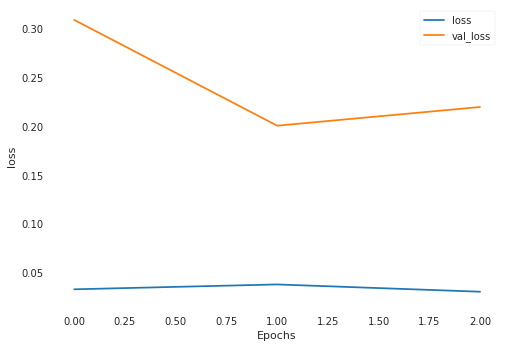

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0280 - val_loss: 0.0965
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0319 - val_loss: 0.0686
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0288 - val_loss: 0.0689
loss cuts = tf.Tensor([1.3157637], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5403619, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2580516], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4004382, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3441641], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6116648, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3782902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.3067555, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3256679], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.067079, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.657788], shap

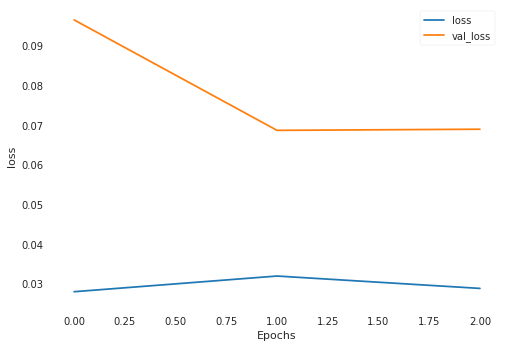

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 439us/sample - loss: 0.0293 - val_loss: 0.1548
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0282 - val_loss: 0.2449
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0250 - val_loss: 0.1894
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2195787], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6723437, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0889652], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47520632, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0980073], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48775452, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97190094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3275134, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9813032], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3383634, shape=(), dtype=float32)
loss c

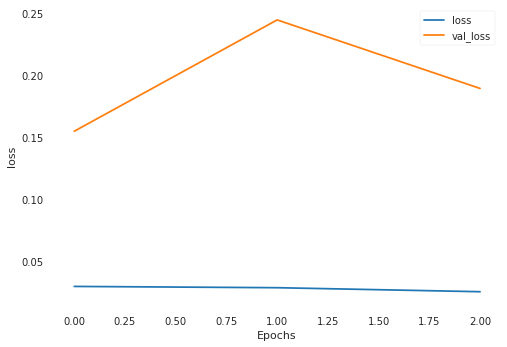

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0278 - val_loss: 0.1515
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0268 - val_loss: 0.0959
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0261 - val_loss: 0.1574
loss cuts = tf.Tensor([0.4780414], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0051780404, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48529094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0041872635, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46733826], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0068329647, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4752368], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0055895373, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.47115222], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006216975, shape=(), dtype=float32)
loss cuts = tf.Tenso

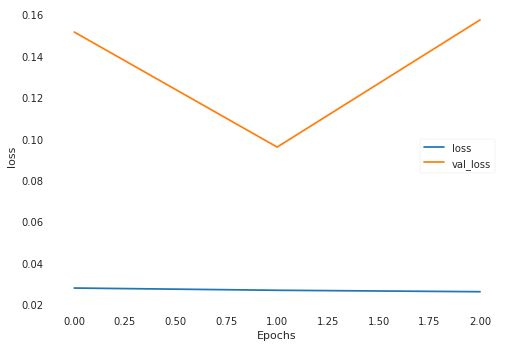

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0277 - val_loss: 0.1070
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.2901 - val_loss: 1.3595
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.4147 - val_loss: 0.2725
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5450389], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024012946, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5619473], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.019058548, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57651925], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015247492, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.59922564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010155469, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.598588], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010284393, shape=(), dtype=float32

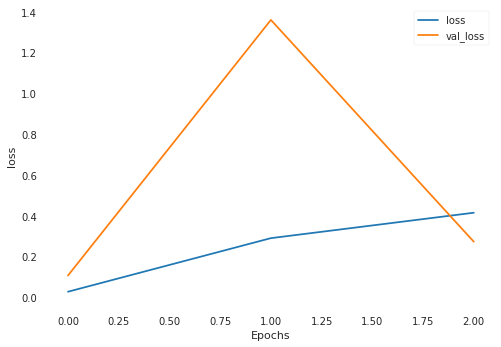

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.1392 - val_loss: 0.2024
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0682 - val_loss: 0.1048
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0493 - val_loss: 0.2442
loss cuts = tf.Tensor([1.1193718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1437438, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0744209], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0496181, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1142038], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1327167, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.31099018], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06816172, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.15201385], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010424748, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.1464145

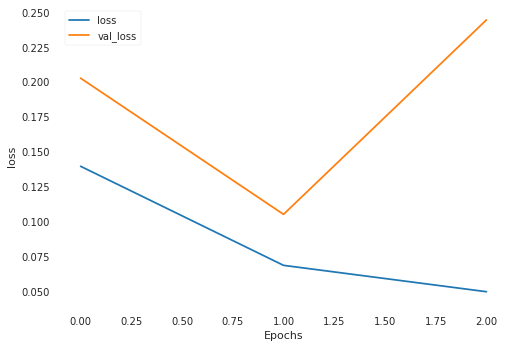

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0430 - val_loss: 0.2015
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0362 - val_loss: 0.1611
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0341 - val_loss: 0.1455
loss cuts = tf.Tensor([1.0718212], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.41209, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94998664], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.250092, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8564433], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.913648, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78926235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(13.400999, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.69418955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.106111, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.809669], s

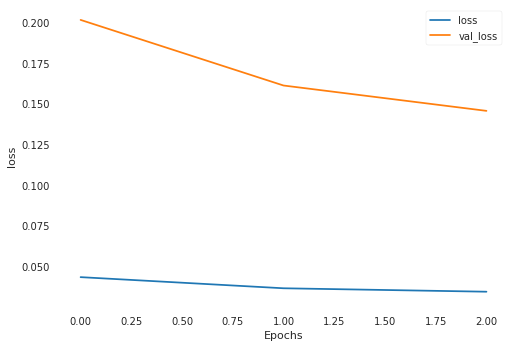

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0313 - val_loss: 0.0624
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0290 - val_loss: 0.0669
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0278 - val_loss: 0.0709
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2253335], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6800748, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.210085], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7054571, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6321354], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1746108, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6309458], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17560638, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9669783], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0068925926, shape=(), dtype=float32)
loss c

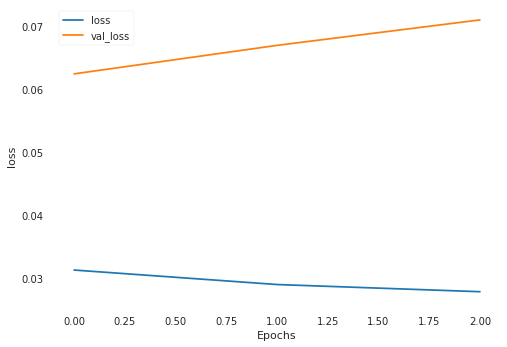

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0263 - val_loss: 0.1452
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0254 - val_loss: 0.1404
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0257 - val_loss: 0.1284
loss cuts = tf.Tensor([0.9077741], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.211191, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0274442], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.6290207, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0529761], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.5085216, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4482305], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8094046, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4665354], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7382855, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3222635], sha

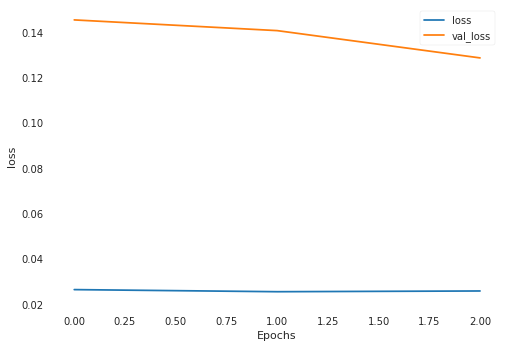

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0276 - val_loss: 0.0937
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0259 - val_loss: 0.1164
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0261 - val_loss: 0.0873
loss cuts = tf.Tensor([4.493897], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.1088295, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.4391637], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.763783, shape=(), dtype=float32)
loss cuts = tf.Tensor([5.3195643], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.040874, shape=(), dtype=float32)
loss cuts = tf.Tensor([5.3340287], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.156946, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.803132], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.170844, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.953452], shape

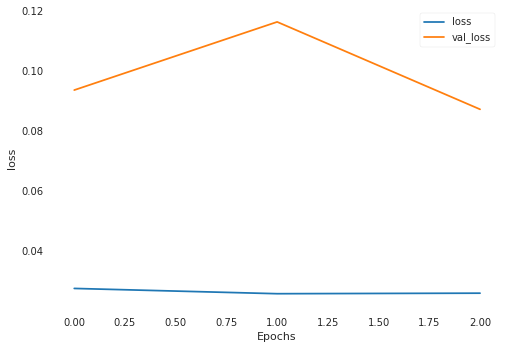

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0251 - val_loss: 0.3586
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0230 - val_loss: 0.3514
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0260 - val_loss: 0.3529
loss cuts = tf.Tensor([3.9356625], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6098069, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.7918568], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2655709, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.7978668], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2791293, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.7345262], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1398665, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.7967424], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2765872, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.734573], sha

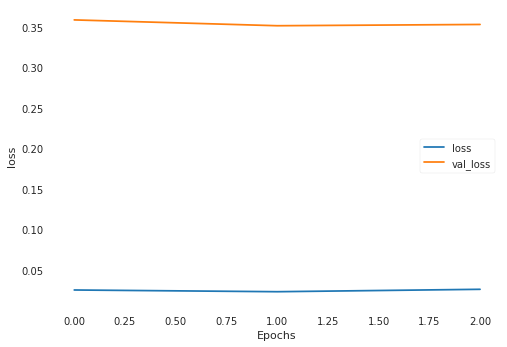

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0269 - val_loss: 0.1094
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0249 - val_loss: 0.1349
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0250 - val_loss: 0.1426
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.980809], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.885222, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9262977], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.563218, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9727623], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.837316, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.958443], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.752384, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3947024], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.7345996, shape=(), dtype=float32)
loss cuts = tf.

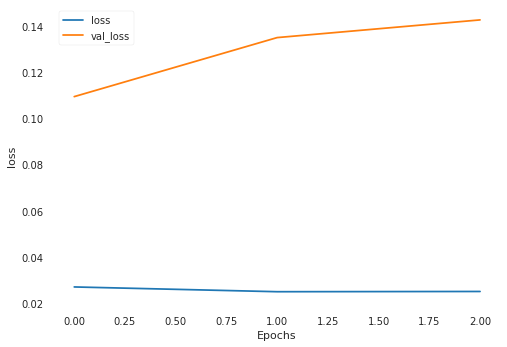

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0255 - val_loss: 0.2779
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0302 - val_loss: 0.2644
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0290 - val_loss: 0.2782
loss cuts = tf.Tensor([1.2716597], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14314134, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4213619], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05227536, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4546179], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03817417, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2835963], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13425167, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1957029], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20638582, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8799291

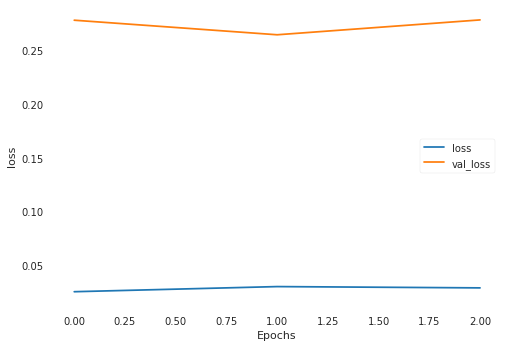

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0262 - val_loss: 0.0389
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0249 - val_loss: 0.0511
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0252 - val_loss: 0.0548
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0021415], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0980074, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0002981], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1018739, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0119469], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0775541, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.42550272], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.638991, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53233874], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3032956, shape=(), dtype=float32)
loss cut

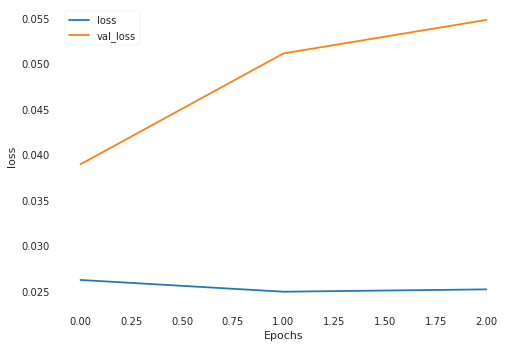

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0245 - val_loss: 0.2561
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0264 - val_loss: 0.3162
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0230 - val_loss: 0.2064
loss cuts = tf.Tensor([0.6879202], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8604741, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68665123], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.86283, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71343577], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8137878, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78293955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6932196, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.353026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06891234, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3491286], s

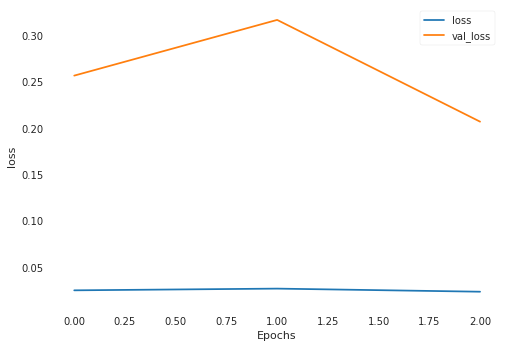

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0260 - val_loss: 0.1206
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0257 - val_loss: 0.1072
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0265 - val_loss: 0.1736
loss cuts = tf.Tensor([0.8519313], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.021924349, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.648864], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.123296514, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6093156], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15263432, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87917304], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.014599154, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8231581], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.031273063, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.820

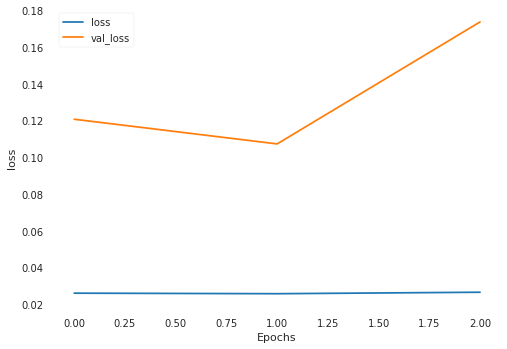

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0249 - val_loss: 0.0717
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0266 - val_loss: 0.0765
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0284 - val_loss: 0.0786
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2454826], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3329108, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1601094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.537329, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1623169], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5318596, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1338533], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6031277, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1123096], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6581469, shape=(), dtype=float32)
loss cuts 

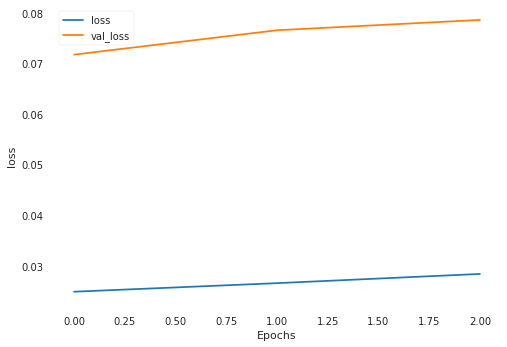

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.1950 - val_loss: 1.0000
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.3896 - val_loss: 0.2033
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.1087 - val_loss: 0.1086
loss cuts = tf.Tensor([1.3231926], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.4354796, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2638289], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.762751, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1962931], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.143644, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0962303], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.724757, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0822047], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.80781, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0552278], shape=(

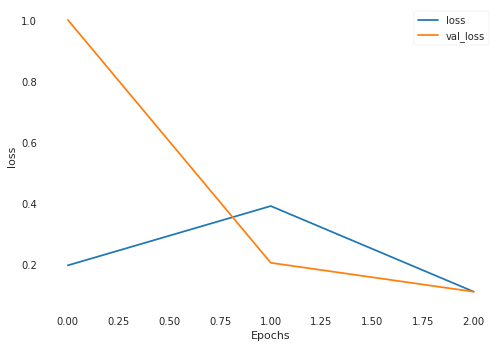

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0651 - val_loss: 0.1834
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0562 - val_loss: 0.1580
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0446 - val_loss: 0.1033
loss cuts = tf.Tensor([0.69859445], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.022080308, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6664192], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013553429, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6072776], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0032807188, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5864952], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0013319002, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8409686], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08466273, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.

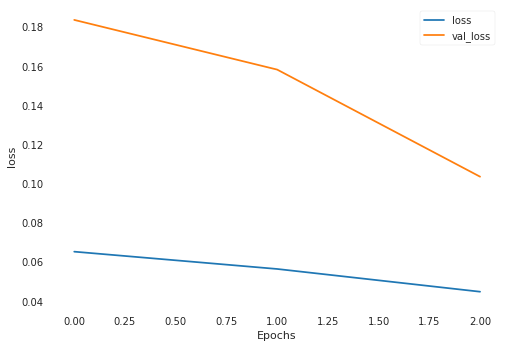

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0399 - val_loss: 0.3360
Epoch 2/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0389 - val_loss: 0.2160
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0323 - val_loss: 0.2150
loss cuts = tf.Tensor([1.4081786], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.73647046, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3113077], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.57958937, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4386876], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.78976554, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3458549], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.63338494, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1409907], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34927005, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1338491

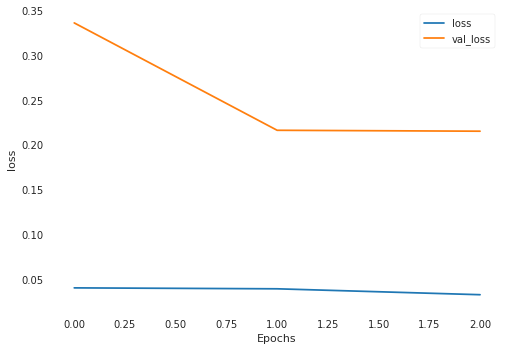

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0311 - val_loss: 0.0985
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0298 - val_loss: 0.0934
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0294 - val_loss: 0.0731
loss cuts = tf.Tensor([1.8748739], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6004295, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8894659], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6232564, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9492373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72120404, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8943384], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6309734, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7364901], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40511966, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7701007], 

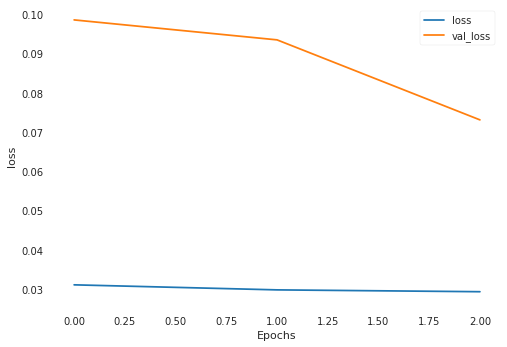

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0275 - val_loss: 0.0885
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0291 - val_loss: 0.0609
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0273 - val_loss: 0.0750
loss cuts = tf.Tensor([1.1484025], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06170379, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3395748], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19322604, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.70937836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0363366, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6486678], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.063167855, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.554725], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11921482, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4797988

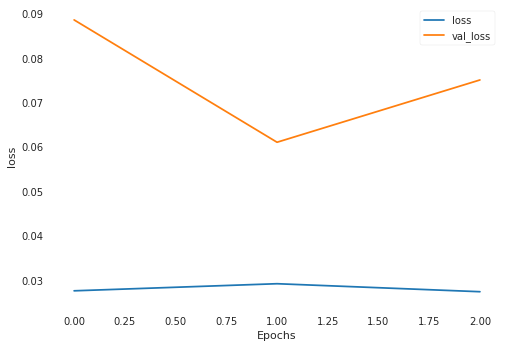

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0305 - val_loss: 0.1051
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0317 - val_loss: 0.1250
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0308 - val_loss: 0.0894
loss cuts = tf.Tensor([1.1695793], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0055428403, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98206973], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06862293, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0527452], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.036589682, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0223007], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.049163662, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9996777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.059707806, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0

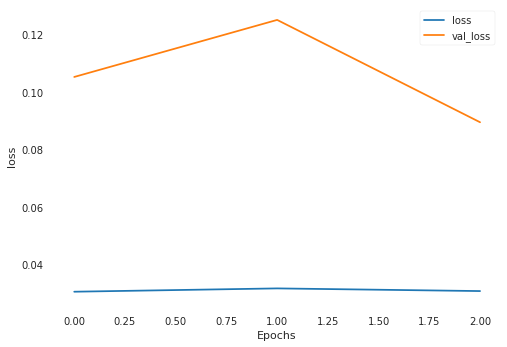

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0286 - val_loss: 0.1315
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0259 - val_loss: 0.1273
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0255 - val_loss: 0.1067
loss cuts = tf.Tensor([0.84610486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0004262465, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8030957], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0005001227, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.81138283], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.000198142, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6760725], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02231637, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67204624], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02353551, shape=(), dtype=float32)
loss cuts = tf.Tensor([0

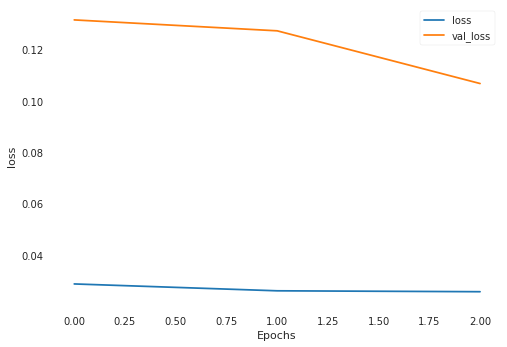

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0278 - val_loss: 0.0828
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0269 - val_loss: 0.1077
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0249 - val_loss: 0.0996
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5018162], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25181952, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.43981063], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19343339, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44045216], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1939981, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44132444], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19476727, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4617293], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21319394, shape=(), dtype=float32)
lo

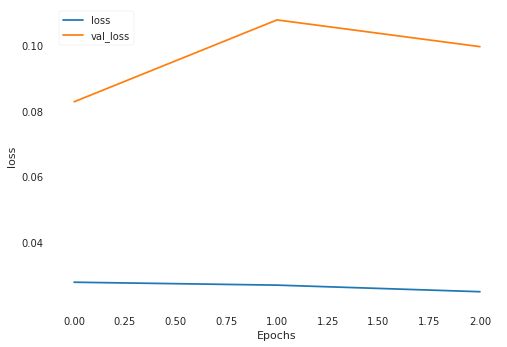

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0235 - val_loss: 0.1472
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0242 - val_loss: 0.1533
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0248 - val_loss: 0.1581
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.7514466], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06824877, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7314229], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07911189, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.811253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.040577393, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5007951], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26203766, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4770799], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28687957, shape=(), dtype=float32)
loss

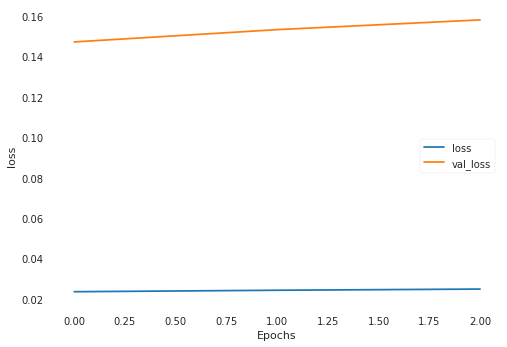

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0270 - val_loss: 0.4657
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0294 - val_loss: 0.4584
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0271 - val_loss: 0.4527
loss cuts = tf.Tensor([1.3750856], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.09403, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4481742], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.7385173, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6958985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.613027, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1960838], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.0098424, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6398616], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.856879, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4537042], shape=

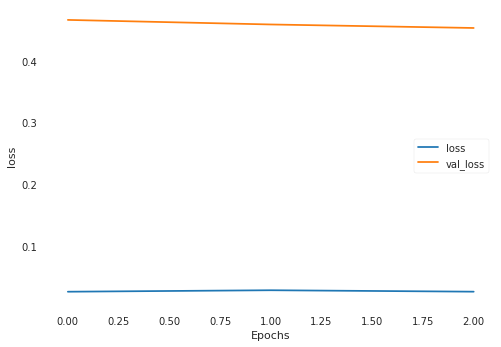

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0260 - val_loss: 0.2407
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0760 - val_loss: 0.5872
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.1132 - val_loss: 0.3280
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.3881018], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9305952, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36282992], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0177596, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3072056], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2141116, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3088389], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.208258, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35067654], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0601323, shape=(), dtype=float32)
loss cut

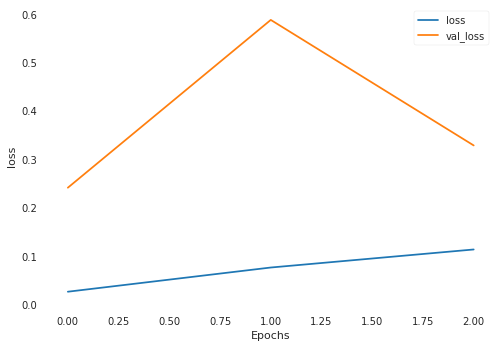

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0434 - val_loss: 0.1823
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0307 - val_loss: 0.1299
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0255 - val_loss: 0.1101
loss cuts = tf.Tensor([1.5575473], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9684589, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5717541], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.99662256, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5982482], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0502232, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5777466], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0086232, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5850272], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0233, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5829592], shap

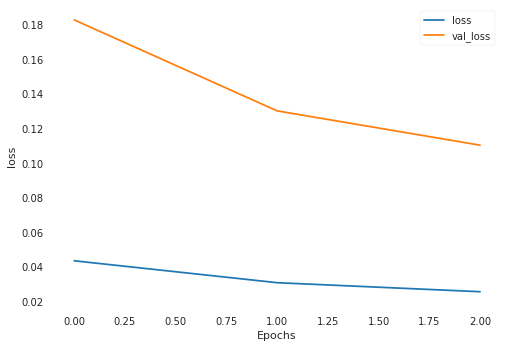

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0238 - val_loss: 0.1175
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0248 - val_loss: 0.2306
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0244 - val_loss: 0.2401
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.20059852], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.4448385, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.20147258], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.4404016, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2108587], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.3928494, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.20418367], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.4266486, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6294688], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.4512496, shape=(), dtype=float32)
loss c

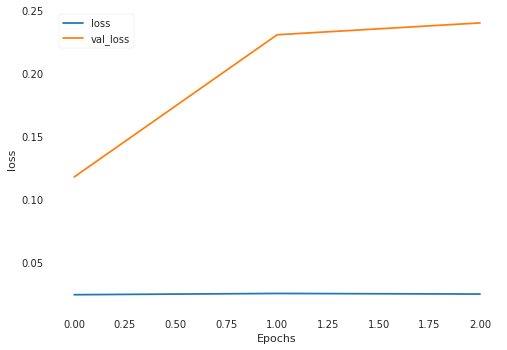

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0258 - val_loss: 0.0781
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0252 - val_loss: 0.0509
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0270 - val_loss: 0.0863
loss cuts = tf.Tensor([2.2090898], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5755413, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6765524], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.8730984, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6542817], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.981538, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6454543], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.0247936, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.645078], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.026642, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6518698], shape

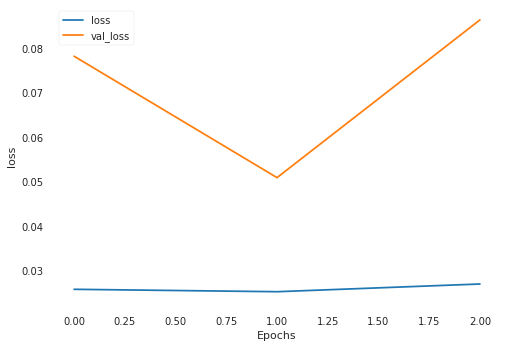

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0260 - val_loss: 0.0553
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0246 - val_loss: 0.0959
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0258 - val_loss: 0.1128
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8955556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12563083, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1592872], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00822881, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8357791], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17157897, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.83420527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17288525, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5355223], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.51047844, shape=(), dtype=float32)
los

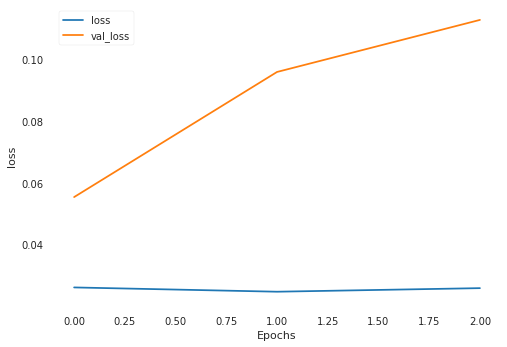

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0269 - val_loss: 0.0528
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0278 - val_loss: 0.0408
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0255 - val_loss: 0.0295
loss cuts = tf.Tensor([0.573841], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13975708, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6682581], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21926562, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68704927], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23721701, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6883335], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23846963, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.764302], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31843677, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7573385]

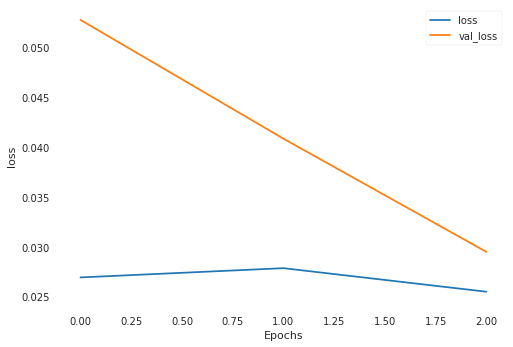

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0266 - val_loss: 0.1089
Epoch 2/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0247 - val_loss: 0.0284
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0242 - val_loss: 0.1057
loss cuts = tf.Tensor([0.64928544], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12200031, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5992477], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08954918, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58707017], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08240928, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.75910515], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21077752, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.74797183], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20067875, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.616

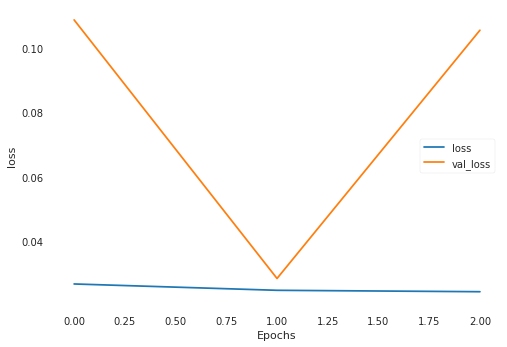

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0393 - val_loss: 0.1007
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0308 - val_loss: 0.0704
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0253 - val_loss: 0.0698
loss cuts = tf.Tensor([0.9587658], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6936495, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92434233], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8078282, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92275506], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8131504, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9343152], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7745056, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91736436], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8312624, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46296152]

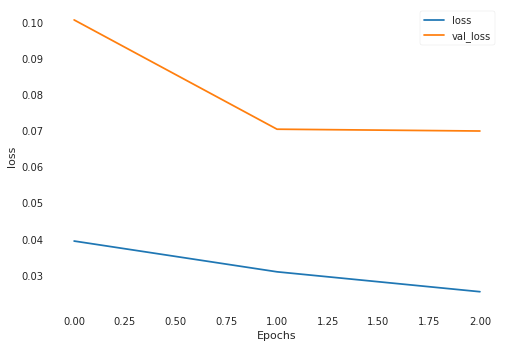

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0244 - val_loss: 0.0827
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0249 - val_loss: 0.1250
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0238 - val_loss: 0.1123
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5056206], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48517892, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.49133942], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5052779, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.49274486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50328183, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.49921364], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49414548, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4898943], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50733453, shape=(), dtype=float32)
lo

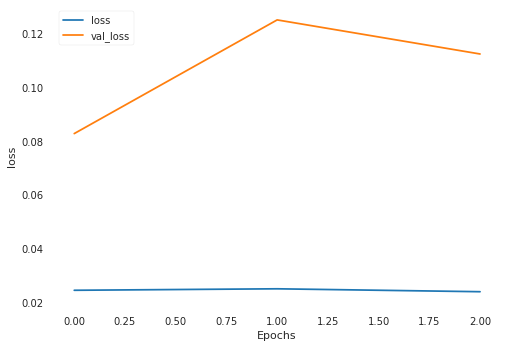

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0268 - val_loss: 0.0670
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0276 - val_loss: 0.0675
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0244 - val_loss: 0.0506
loss cuts = tf.Tensor([0.33725435], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.4698217, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35611814], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3999002, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.38531095], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2930968, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.379875], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3128555, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3840247], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2977662, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.38566005],

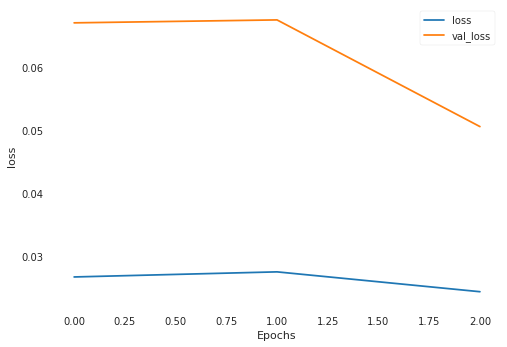

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0265 - val_loss: 0.1549
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0285 - val_loss: 0.1687
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0264 - val_loss: 0.3385
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6418193], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36988378, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55220073], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4869238, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64224327], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36936826, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6426168], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36891434, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6482568], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3620949, shape=(), dtype=float32)
loss

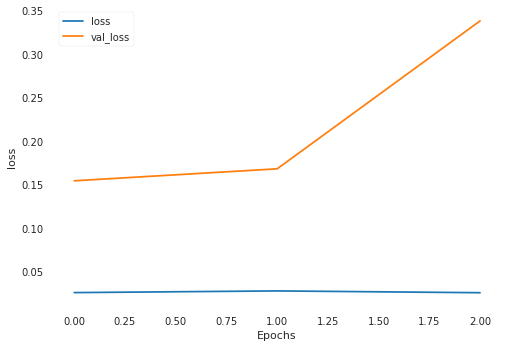

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0293 - val_loss: 0.0718
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0290 - val_loss: 0.1035
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0257 - val_loss: 0.0522
loss cuts = tf.Tensor([1.4595311], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.46443114, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4268196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42091593, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4339715], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4302472, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.436143], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43310064, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4339759], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43025297, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2272239],

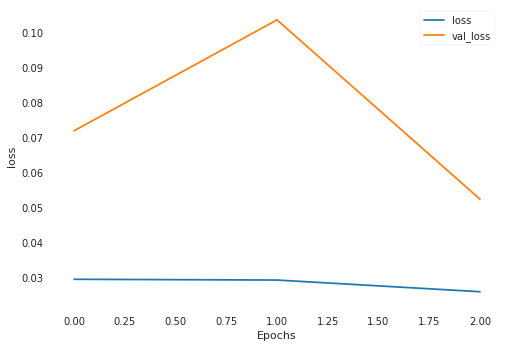

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0249 - val_loss: 0.1277
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0276 - val_loss: 0.1317
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0295 - val_loss: 0.1302
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.9719542], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3890835, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9217967], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2733686, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0969723], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09218021, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.106149], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09783667, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9459668], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.023288704, shape=(), dtype=float32)
loss c

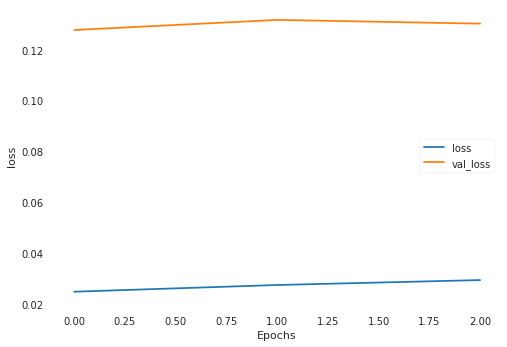

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0291 - val_loss: 0.1008
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0298 - val_loss: 0.0550
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0253 - val_loss: 0.0642
loss cuts = tf.Tensor([0.7208311], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0011749347, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.75304633], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.2521833e-06, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.74641675], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.5545104e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7706735], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00024227226, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8562174], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010223024, shape=(), dtype=float32)
loss cuts = tf.Ten

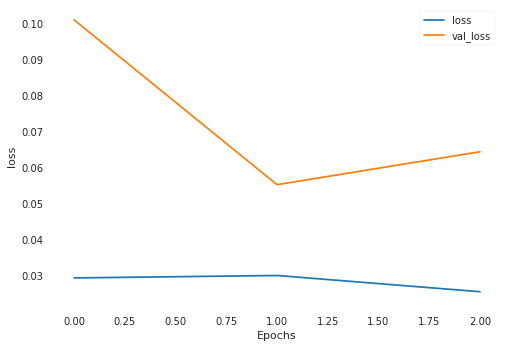

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0710 - val_loss: 0.3859
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.1507 - val_loss: 0.1369
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0561 - val_loss: 0.1073
loss cuts = tf.Tensor([0.5465668], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.078015335, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46264625], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13193806, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4464141], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14399363, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4564683], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13646428, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46430737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13073407, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4664

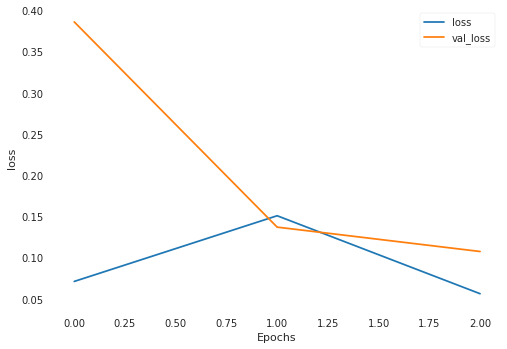

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0307 - val_loss: 0.0776
Epoch 2/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0249 - val_loss: 0.0739
Epoch 3/3
882/882 [==============================] - 0s 358us/sample - loss: 0.0232 - val_loss: 0.0599
loss cuts = tf.Tensor([1.2043854], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0108963065, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3461007], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06056554, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1405357], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0016431421, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1599703], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.003596432, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0504638], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.002453838, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1

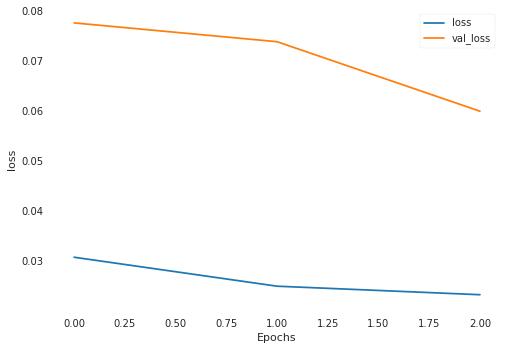

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0241 - val_loss: 0.0533
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0272 - val_loss: 0.0338
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0256 - val_loss: 0.0669
loss cuts = tf.Tensor([0.9580964], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08520772, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9143115], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11268675, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94004333], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.096073136, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0563436], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.037502818, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0729914], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.031332053, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.068

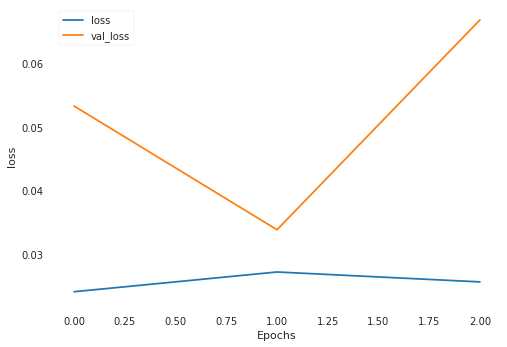

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0259 - val_loss: 0.0436
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0253 - val_loss: 0.0410
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0247 - val_loss: 0.0413
loss cuts = tf.Tensor([1.5257351], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6237508, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5868717], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.47168, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5642112], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5271738, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6425349], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3397255, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.674022], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2678264, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6830854], shape

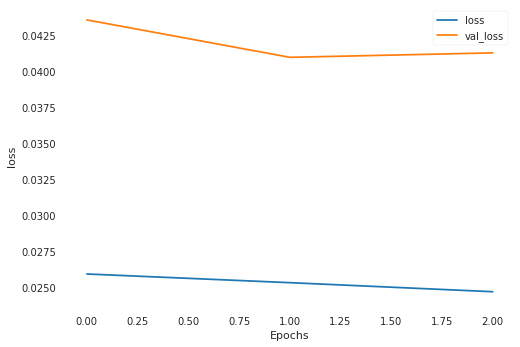

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0228 - val_loss: 0.0794
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0266 - val_loss: 0.0832
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0289 - val_loss: 0.0985
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6687471], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.028386388, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6669866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.027796244, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64815724], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.021872254, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57986724], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0063365926, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5509069], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0025646498, shape=(), dtype=floa

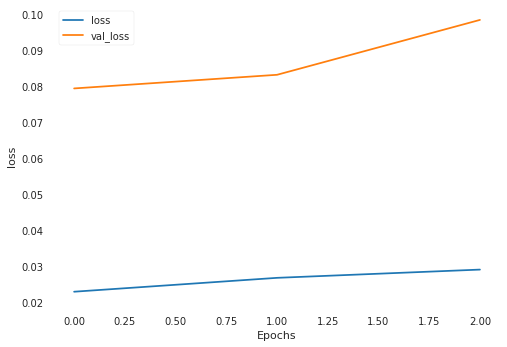

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0269 - val_loss: 0.0582
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0262 - val_loss: 0.0701
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0266 - val_loss: 0.0569
loss cuts = tf.Tensor([1.0317522], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23255135, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0281746], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22911367, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0666922], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2674708, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0914497], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2936917, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0910777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2932886, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0748796], 

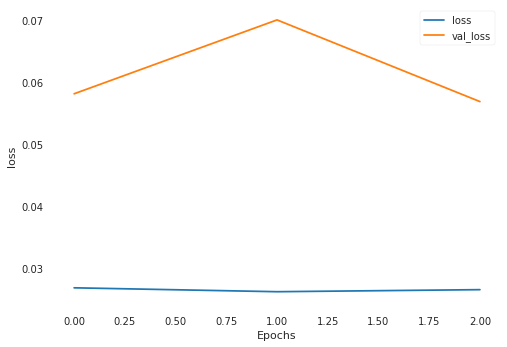

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0251 - val_loss: 0.0574
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0304 - val_loss: 0.0739
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0300 - val_loss: 0.0699
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2882787], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7027112, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2771571], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.68418884, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2616922], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6588442, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2756993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.68177927, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2736778], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.67844516, shape=(), dtype=float32)
loss c

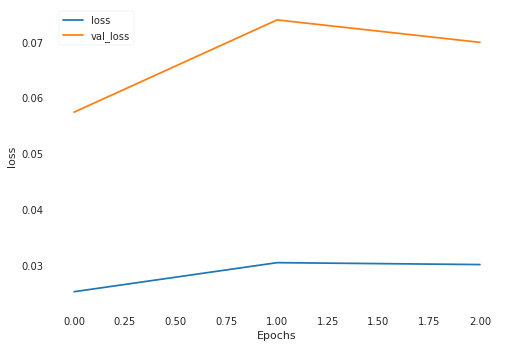

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0272 - val_loss: 0.0995
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0253 - val_loss: 0.1050
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0237 - val_loss: 0.1026
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3325386], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07982809, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1389074], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00790454, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2180685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02824703, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9224893], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01625897, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8709376], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03206333, shape=(), dtype=float32)
loss

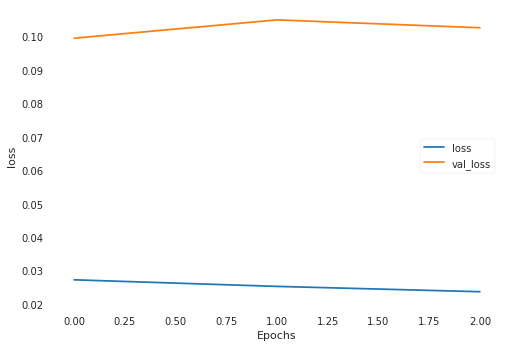

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0251 - val_loss: 0.1196
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0283 - val_loss: 0.1544
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0257 - val_loss: 0.1403
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4458632], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013422128, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4752343], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.007479289, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6414659], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006359863, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6420999], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006461379, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6708584], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0119118085, shape=(), dtype=float32

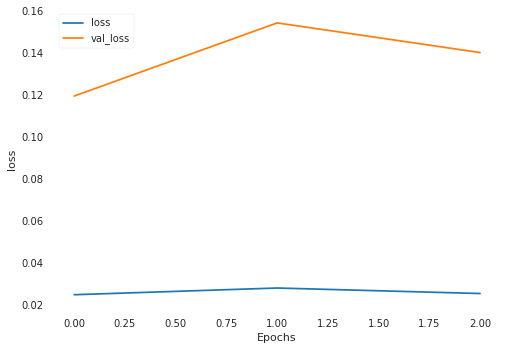

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0259 - val_loss: 0.0920
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0283 - val_loss: 0.1130
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0271 - val_loss: 0.0895
loss cuts = tf.Tensor([1.3288344], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.082027666, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3690839], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10670296, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3097405], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07145509, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3027405], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0677617, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2885584], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.060579326, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.334063

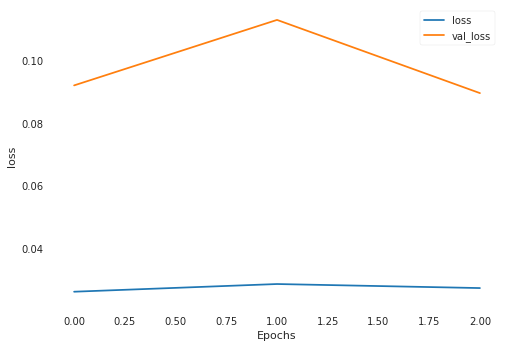

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0265 - val_loss: 0.0562
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0282 - val_loss: 0.0467
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0266 - val_loss: 0.0654
loss cuts = tf.Tensor([1.8517659], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20409243, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8488977], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20150916, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9292178], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28007153, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9347026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28590694, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8867838], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23695853, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9312447

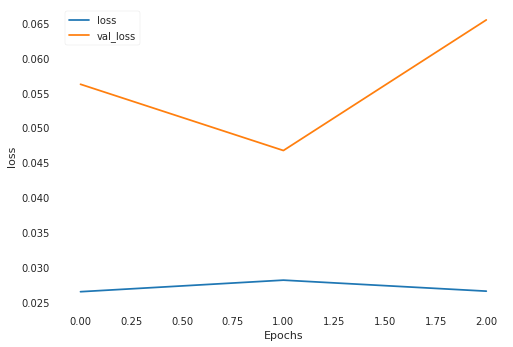

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0246 - val_loss: 0.3430
Epoch 2/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0298 - val_loss: 0.7564
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0331 - val_loss: 0.4074
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3912368], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4111846, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4000196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42252553, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4026895], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42600352, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4012123], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4240775, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2795447], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2804176, shape=(), dtype=float32)
loss cu

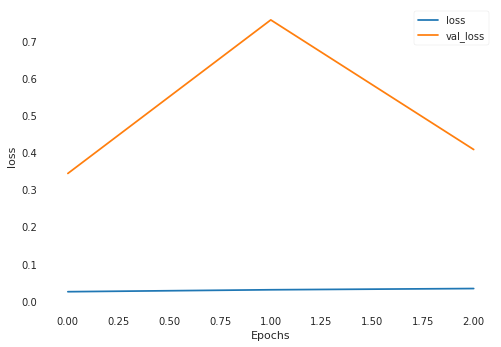

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0483 - val_loss: 1.1800
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0399 - val_loss: 1.1344
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0286 - val_loss: 1.2140
loss cuts = tf.Tensor([1.8042185], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2373621, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.838945], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1346815, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8299545], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1610336, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8406416], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1297266, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8368446], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1408236, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8296759], sha

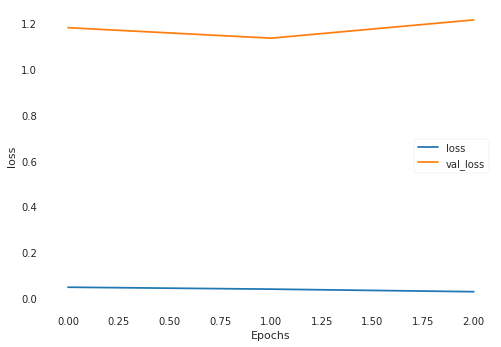

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0898 - val_loss: 0.3005
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.1391 - val_loss: 0.1158
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0453 - val_loss: 0.1016
loss cuts = tf.Tensor([1.0379766], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.893047, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0479871], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.848861, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5304612], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9568138, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.780759], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1586692, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5210974], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.989104, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.265878], shape=(

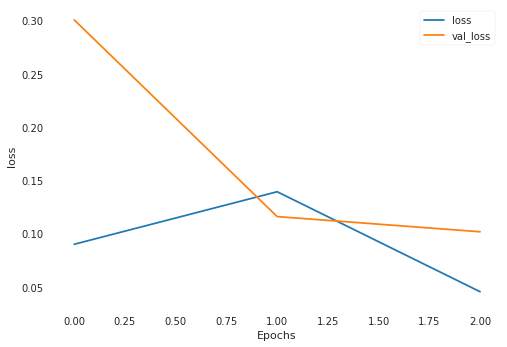

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0270 - val_loss: 0.0944
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0267 - val_loss: 0.0734
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0281 - val_loss: 0.1158
loss cuts = tf.Tensor([0.8742764], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.953845, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82223624], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.188207, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8245737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.177564, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82990026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.1533523, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8193985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.2011433, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7997424], sha

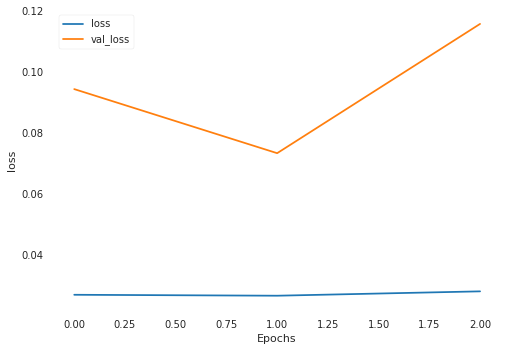

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0249 - val_loss: 0.1239
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0275 - val_loss: 0.2604
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0729 - val_loss: 0.1013
loss cuts = tf.Tensor([0.78046834], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.670306, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72982216], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.953403, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72771794], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.9652762, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7357086], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.9202366, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73938376], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.899564, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7398624], s

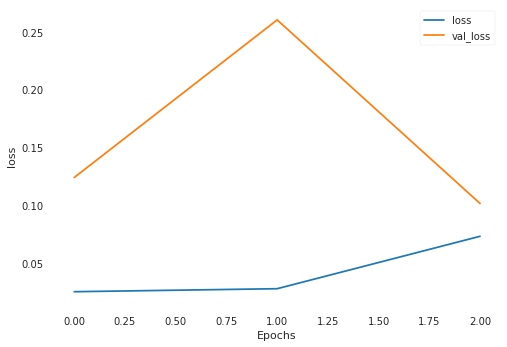

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0351 - val_loss: 0.5409
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0294 - val_loss: 0.6165
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0247 - val_loss: 0.9930
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.9313148], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6910843, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93073833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6901261, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.267767], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3636796, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4455636], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8105413, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4778858], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8985693, shape=(), dtype=float32)
loss cuts

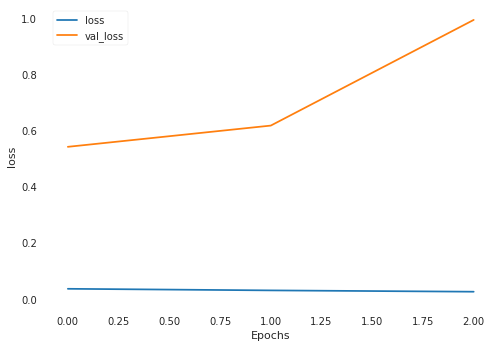

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0260 - val_loss: 0.1633
Epoch 2/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0602 - val_loss: 0.2351
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0335 - val_loss: 0.1284
loss cuts = tf.Tensor([3.1519473], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.580606, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.1628718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6158245, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.1467676], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5639913, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.143262], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5527768, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.1544826], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5887582, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.147837], shape

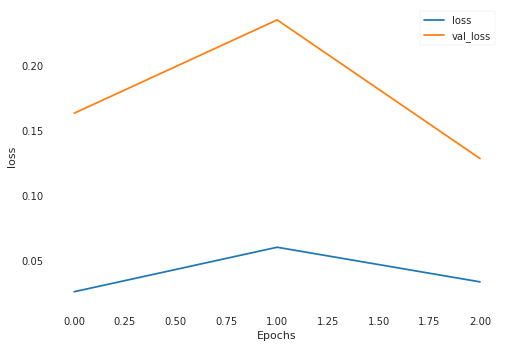

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0261 - val_loss: 0.1554
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0259 - val_loss: 0.1960
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0260 - val_loss: 0.4093
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.7274506], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6484172, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.705013], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.575891, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5614698], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1357338, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4420968], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8010772, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4410759], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7983382, shape=(), dtype=float32)
loss cuts =

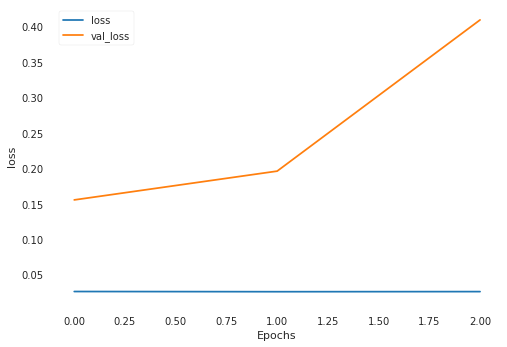

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0455 - val_loss: 0.2269
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0658 - val_loss: 0.1365
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0342 - val_loss: 0.1101
loss cuts = tf.Tensor([1.0541748], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0479054, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0615352], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0222595, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.133543], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7770786, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.138321], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7611768, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1539305], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7095444, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1020762], shap

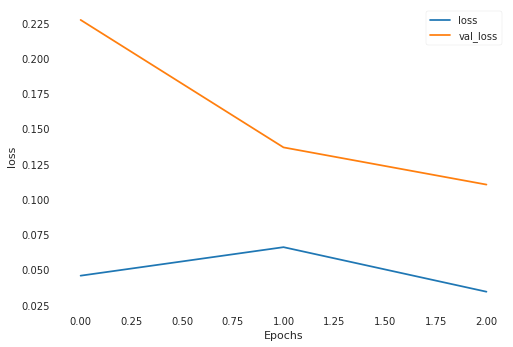

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0262 - val_loss: 1.3001
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0270 - val_loss: 0.9171
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0289 - val_loss: 1.2649
loss cuts = tf.Tensor([1.6133451], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5960408, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6336076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6476485, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8141954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.143868, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7468462], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9511793, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7517242], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9648308, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6571431], sha

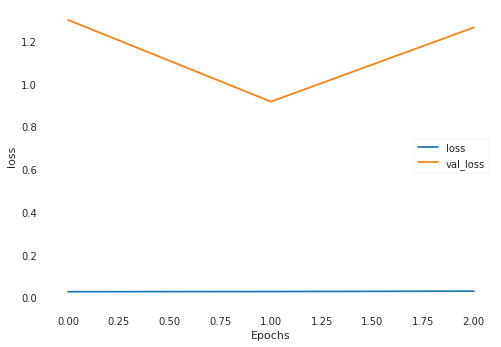

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0495 - val_loss: 0.1190
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0364 - val_loss: 0.1967
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0308 - val_loss: 0.1821
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5821891], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(24.184864, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5569916], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(24.433332, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5783093], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(24.223042, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5714059], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(24.29104, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5692002], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(24.312788, shape=(), dtype=float32)
loss cuts 

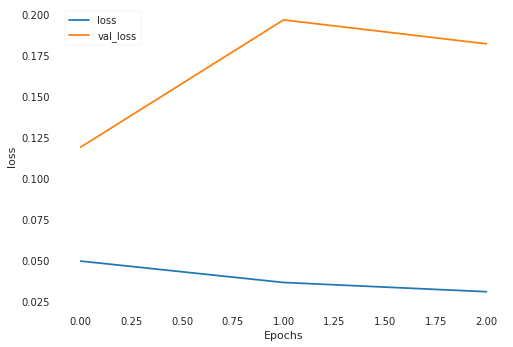

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0323 - val_loss: 0.3270
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0296 - val_loss: 0.2515
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0300 - val_loss: 0.4358
loss cuts = tf.Tensor([1.0253295], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.105839275, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0033841], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.092041925, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0120466], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.097373076, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0149693], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.099205695, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9522057], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06360773, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.994

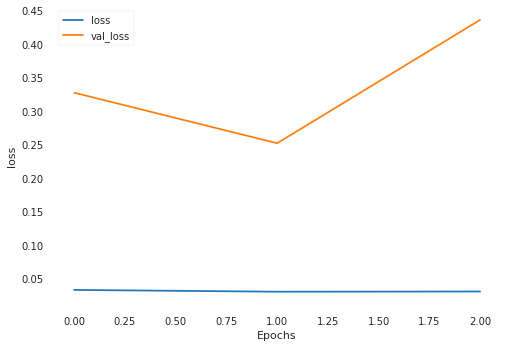

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0298 - val_loss: 0.1957
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0274 - val_loss: 0.1371
Epoch 3/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0289 - val_loss: 0.2916
loss cuts = tf.Tensor([2.071309], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8860595, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9255294], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3325574, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9175433], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3034635, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.930353], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.350192, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9779291], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5266178, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.995914], shape=

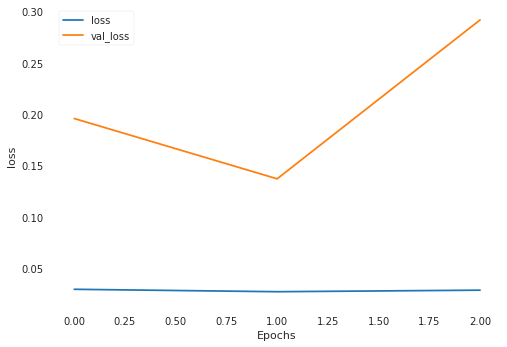

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0328 - val_loss: 0.5152
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0295 - val_loss: 0.5637
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0305 - val_loss: 0.6481
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.7232883], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14191164, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7930334], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09422846, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7676811], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11043578, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7459028], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12538478, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.470405], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39638975, shape=(), dtype=float32)
loss 

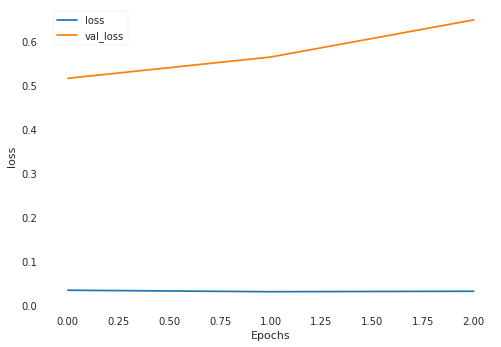

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0323 - val_loss: 0.1631
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0273 - val_loss: 0.4020
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0319 - val_loss: 0.1871
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2632589], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5427874, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1584711], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7081709, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1973442], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.64425635, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2792528], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5194766, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5781405], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17796545, shape=(), dtype=float32)
loss cu

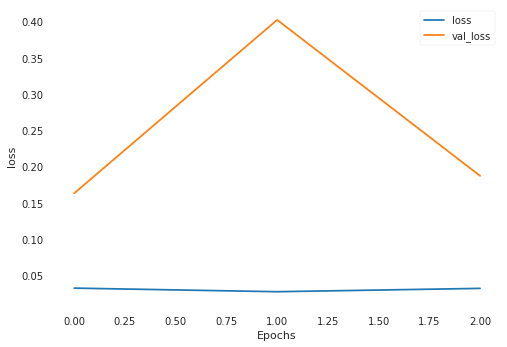

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0315 - val_loss: 0.2076
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0299 - val_loss: 0.0654
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0289 - val_loss: 0.0790
loss cuts = tf.Tensor([0.42336094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.296446, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.38204104], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.697025, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.50794315], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.487103, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.50131273], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.550032, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5030682], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.533363, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.54977685

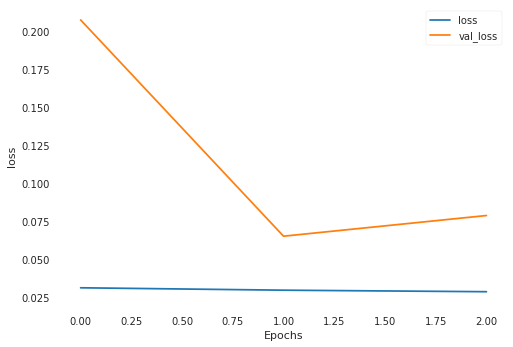

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0301 - val_loss: 0.2353
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0285 - val_loss: 0.1601
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0309 - val_loss: 0.2135
loss cuts = tf.Tensor([1.4550467], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7031468, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4138954], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5974315, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4391553], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6619215, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.394189], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5480063, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4015827], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5664594, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3992724], sha

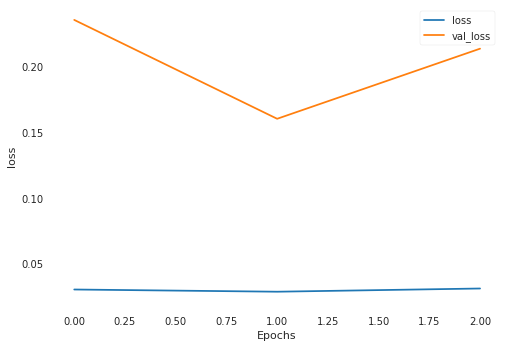

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0348 - val_loss: 1.1097
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0371 - val_loss: 0.9126
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0329 - val_loss: 1.0913
loss cuts = tf.Tensor([0.40630382], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024430886, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.43058616], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.032611363, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8123678], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31625754, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89765614], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.41945848, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87748116], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3937326, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88

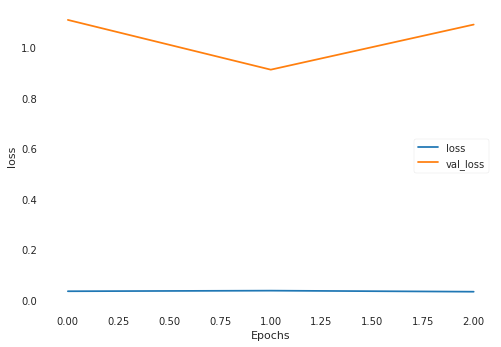

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0480 - val_loss: 0.4237
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0496 - val_loss: 0.2904
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0345 - val_loss: 0.2590
loss cuts = tf.Tensor([1.8798823], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2766341, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8559284], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2230777, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7802209], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.061355, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7534876], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0069873, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7568423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0137314, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.134731], shap

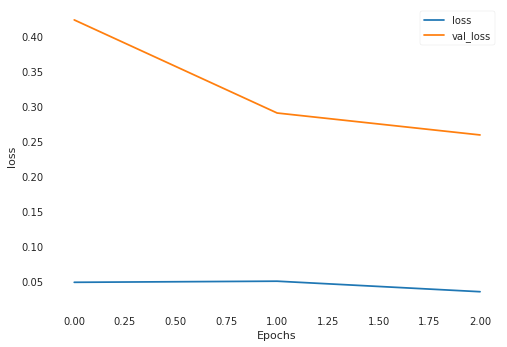

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0295 - val_loss: 0.4928
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0445 - val_loss: 0.3006
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0362 - val_loss: 0.4076
loss cuts = tf.Tensor([0.52642417], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03112549, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53517336], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.034289174, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48760396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018934852, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.490649], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.019782146, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4409979], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.008280619, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4

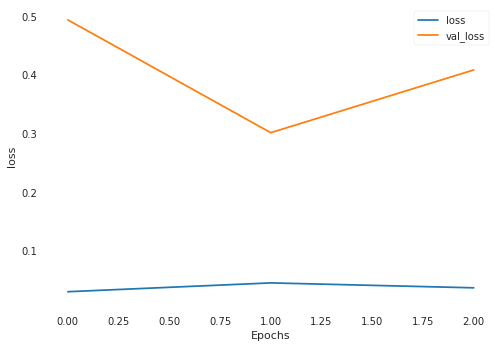

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0299 - val_loss: 0.2055
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0291 - val_loss: 0.1781
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0299 - val_loss: 0.1103
loss cuts = tf.Tensor([0.6584395], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.41159979, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6808257], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38337675, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7060718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35275066, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7208597], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3354034, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7137319], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34371024, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65041965

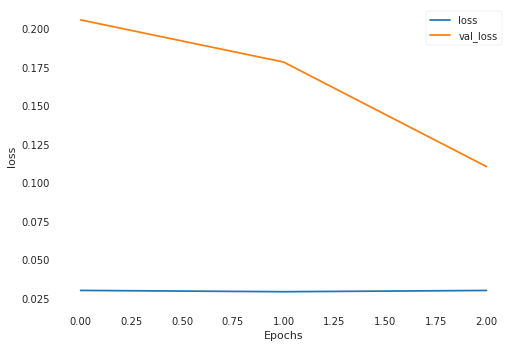

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0382 - val_loss: 0.6655
Epoch 2/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0419 - val_loss: 0.3020
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0655 - val_loss: 0.2023
loss cuts = tf.Tensor([1.0210094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7586575, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7707909], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38538125, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7642709], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37732878, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.69822794], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30055383, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.69953346], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30198705, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.704547

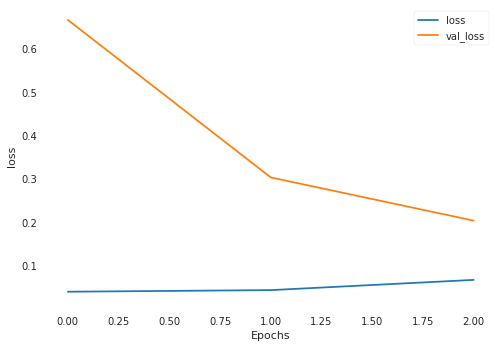

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0397 - val_loss: 0.2205
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0314 - val_loss: 0.2020
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0287 - val_loss: 0.2243
loss cuts = tf.Tensor([0.7613415], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40515652, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76640534], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4116287, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77698743], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42531925, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7673606], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.41285533, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76502645], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40986127, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.79987

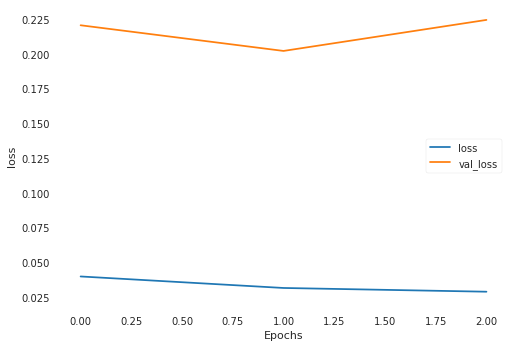

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0310 - val_loss: 0.1934
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0313 - val_loss: 0.3108
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0308 - val_loss: 0.1822
loss cuts = tf.Tensor([0.65197396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10300422, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67091334], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09120601, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63847744], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11184959, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6794614], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08611598, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6653662], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0945873, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65560

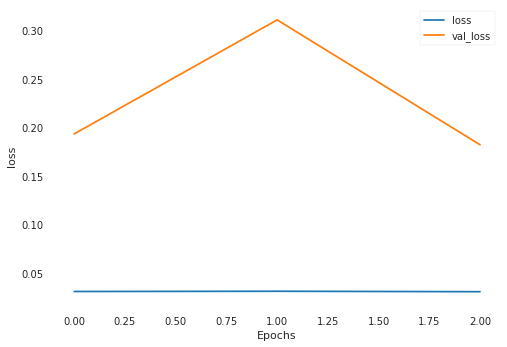

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0335 - val_loss: 0.1697
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0360 - val_loss: 0.4276
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0354 - val_loss: 0.7118
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6233574], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.312444, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57702136], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.5070386, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55277455], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.6105766, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5456116], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.6413894, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5956482], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.428296, shape=(), dtype=float32)
loss cuts

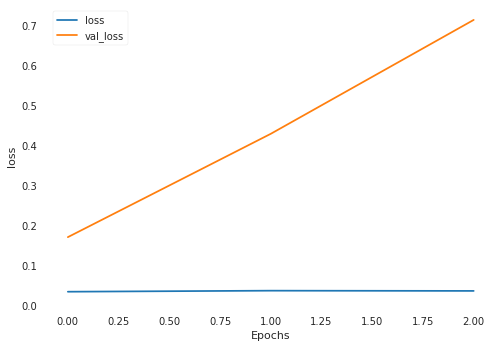

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0957 - val_loss: 0.3775
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0484 - val_loss: 0.0716
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0339 - val_loss: 0.1772
loss cuts = tf.Tensor([0.74598825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3863405, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6243043], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24987902, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6173266], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24295172, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6697155], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29734144, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.33040696], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04242845, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.529683

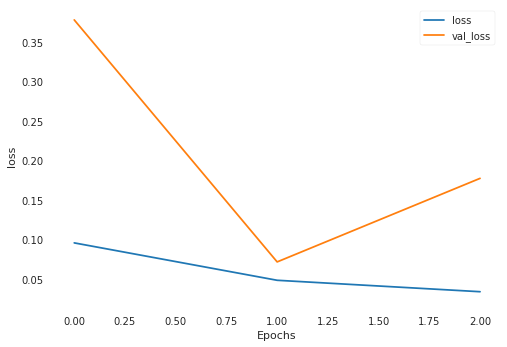

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0328 - val_loss: 0.2603
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0312 - val_loss: 0.1645
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0317 - val_loss: 0.1692
loss cuts = tf.Tensor([1.1665034], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004369557, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1245425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011677737, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0252367], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04300204, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.038567], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.037651174, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94677985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08169662, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9465

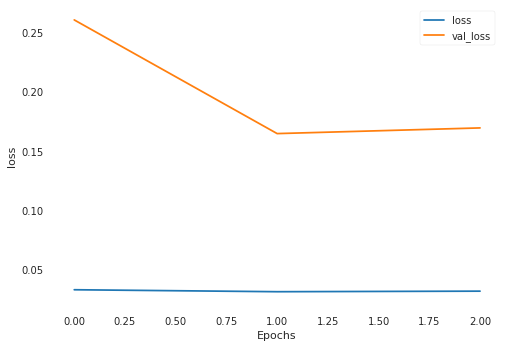

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0309 - val_loss: 0.1634
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0321 - val_loss: 0.3227
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0387 - val_loss: 0.1391
loss cuts = tf.Tensor([0.4898435], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37561867, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.47969598], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38816, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.50626296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35576203, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.50016487], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3630737, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4791075], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38889363, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4556739]

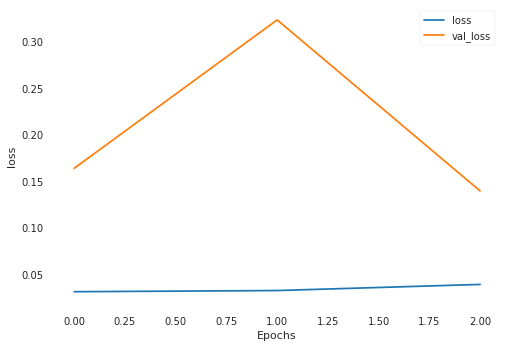

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0304 - val_loss: 0.0824
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0262 - val_loss: 0.0345
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0318 - val_loss: 0.1341
loss cuts = tf.Tensor([0.6354055], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.70136, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6470543], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.590494, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67143774], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.359303, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72923136], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(21.81608, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.71959347], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(21.906206, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7198317], s

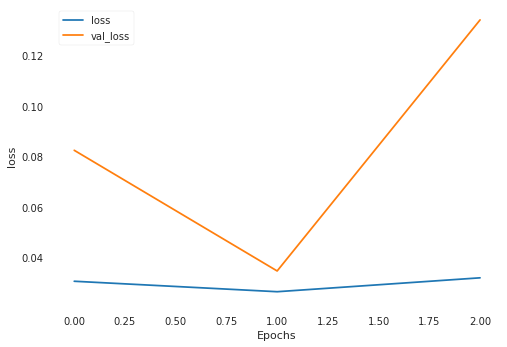

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0349 - val_loss: 0.2146
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0306 - val_loss: 0.1862
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0320 - val_loss: 0.1877
loss cuts = tf.Tensor([0.683454], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2845731, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6575603], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2576174, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6480553], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2480591, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6571335], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25718436, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6131499], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2145078, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60622066], s

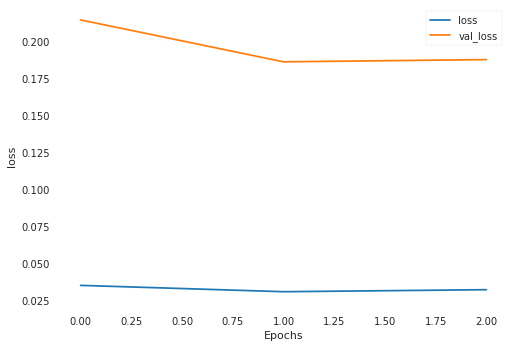

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0323 - val_loss: 0.1909
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0335 - val_loss: 0.3083
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0581 - val_loss: 0.1829
loss cuts = tf.Tensor([0.7834985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.8330944, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.74436575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.966361, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76870984], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.883097, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7532061], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9359875, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.75512457], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9294164, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.75744975], 

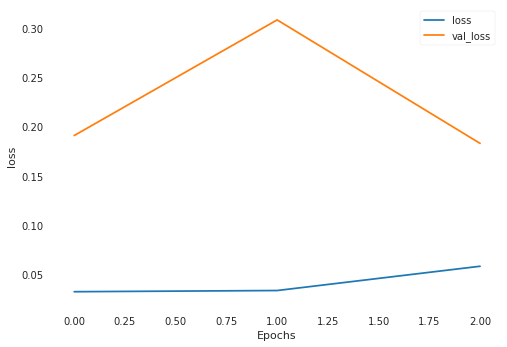

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0468 - val_loss: 0.1548
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0332 - val_loss: 0.0903
Epoch 3/3
882/882 [==============================] - 0s 362us/sample - loss: 0.0296 - val_loss: 0.1250
loss cuts = tf.Tensor([0.50729144], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2573446, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48442346], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2346661, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48205465], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23237668, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72032243], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5188644, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7440423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5535989, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7493769

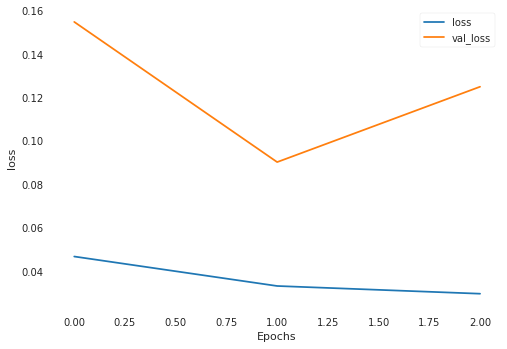

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0320 - val_loss: 0.0731
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0298 - val_loss: 0.0500
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0336 - val_loss: 0.1372
loss cuts = tf.Tensor([1.6680851], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0817993, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6119719], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9230226, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3116486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1802816, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3420643], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2472943, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3002446], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1556327, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2387788], sh

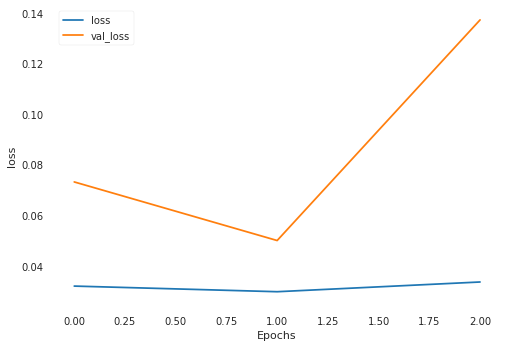

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0740 - val_loss: 0.3118
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0423 - val_loss: 0.1191
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0315 - val_loss: 0.0450
loss cuts = tf.Tensor([0.55682087], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31004947, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4602533], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2118331, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4787993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22924878, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45323208], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20541932, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.54003763], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29164064, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.49690

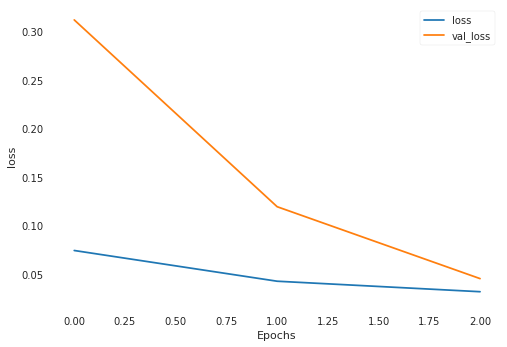

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0302 - val_loss: 0.1173
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0294 - val_loss: 0.1431
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0288 - val_loss: 0.1656
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.7698667], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39706793, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8948863], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2551398, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89659536], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2534162, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8999369], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25006306, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89596653], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25404972, shape=(), dtype=float32)
loss

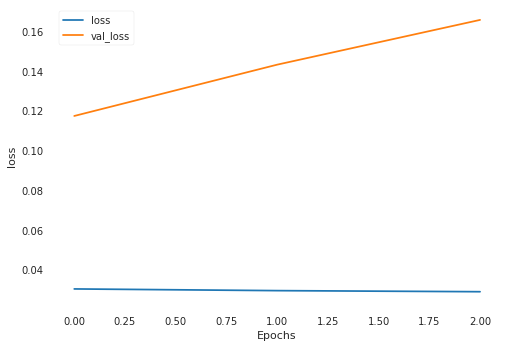

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0303 - val_loss: 0.2382
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0358 - val_loss: 0.1390
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0337 - val_loss: 0.0720
loss cuts = tf.Tensor([0.1883885], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(27.684555, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.18701625], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(27.698994, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13281216], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.272486, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13274623], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.273186, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.08538525], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.779089, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.09162036

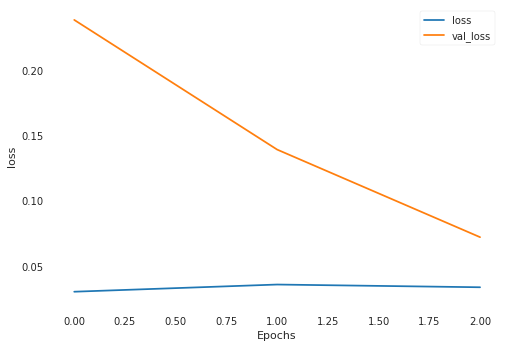

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0307 - val_loss: 0.1517
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0275 - val_loss: 0.1643
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0427 - val_loss: 0.1892
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.389913], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.01721, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3439016], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.813204, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8577867], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9165354, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8228489], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7984235, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8208004], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7915742, shape=(), dtype=float32)
loss cuts = t

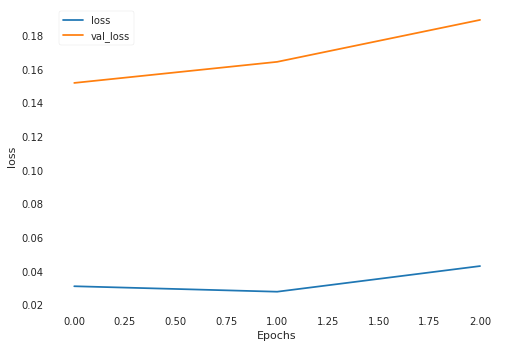

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0384 - val_loss: 0.3665
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0335 - val_loss: 0.4077
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0273 - val_loss: 0.3895
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.67019254], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.757137, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87529236], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.453828, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1262695], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.9734535, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9294468], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.123741, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90548706], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.269059, shape=(), dtype=float32)
loss cuts

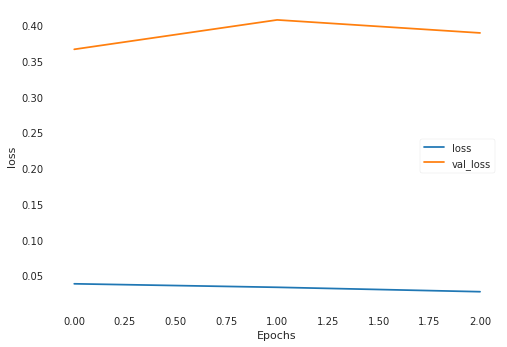

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0324 - val_loss: 0.5703
Epoch 2/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0562 - val_loss: 0.3129
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0400 - val_loss: 0.3588
loss cuts = tf.Tensor([1.0629333], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44639155, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1618224], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.58831125, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1037749], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50263417, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1089827], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5100456, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0994154], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4964717, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1144681],

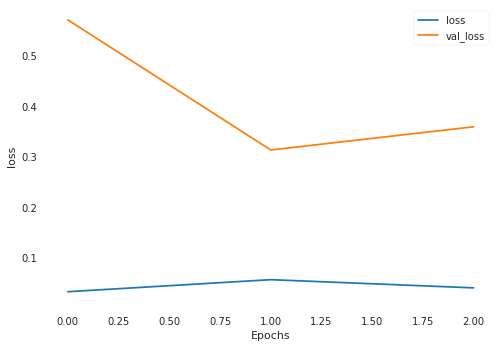

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0359 - val_loss: 0.2700
Epoch 2/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0336 - val_loss: 0.3387
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0282 - val_loss: 0.3149
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.14614907], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3386888, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13122338], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35628417, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.11798868], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37225884, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.16121763], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32137698, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.21934623], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25884956, shape=(), dtype=float32)


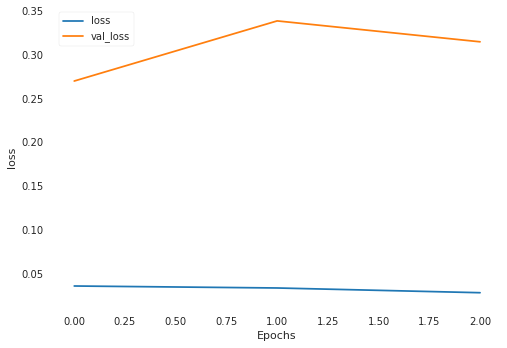

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0297 - val_loss: 0.1357
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0332 - val_loss: 0.3756
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0322 - val_loss: 0.1120
loss cuts = tf.Tensor([0.24950522], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7233414, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.252602], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.71808344, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.24158221], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.73688114, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.23065366], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7557631, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.21550344], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7823342, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2465532

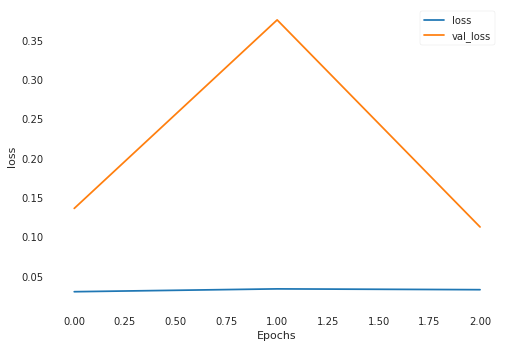

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0315 - val_loss: 0.1455
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0326 - val_loss: 0.1469
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0336 - val_loss: 0.2529
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.25269032], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5821705, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.21210499], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7142518, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7193402], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3002007, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63478476], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5001814, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6400815], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4872342, shape=(), dtype=float32)
loss c

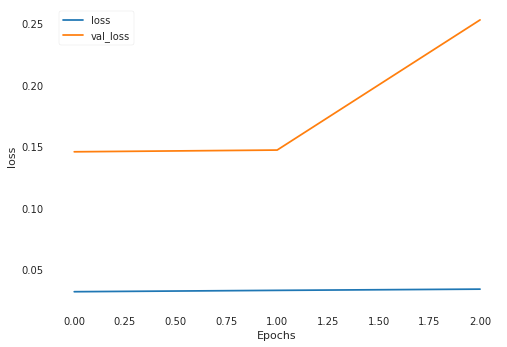

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0347 - val_loss: 0.5996
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0357 - val_loss: 0.4872
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.3021 - val_loss: 0.7795
loss cuts = tf.Tensor([0.13056707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17592399, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.14780094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1617641, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.14894801], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1608427, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.14211446], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16637063, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.1365015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17098102, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13179

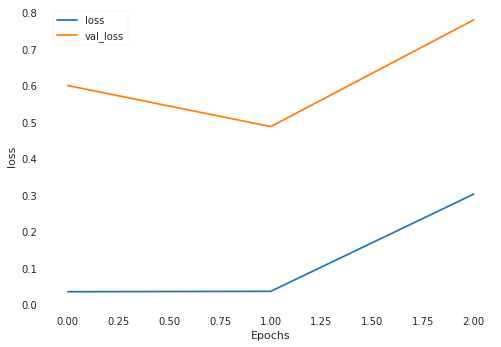

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.1381 - val_loss: 0.3763
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0494 - val_loss: 0.3233
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0338 - val_loss: 0.4044
loss cuts = tf.Tensor([1.353355], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0954659, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3442752], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.114555, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3148654], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1775174, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2994683], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2111703, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3009292], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2079569, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2723262], shap

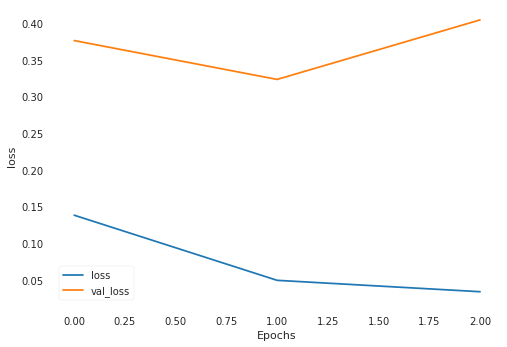

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0311 - val_loss: 0.1127
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0268 - val_loss: 0.0974
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0255 - val_loss: 0.0755
loss cuts = tf.Tensor([1.4978423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36259377, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3997514], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49034792, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3730866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.528403, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2987937], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6419314, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.293129], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.65104073, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3698493], s

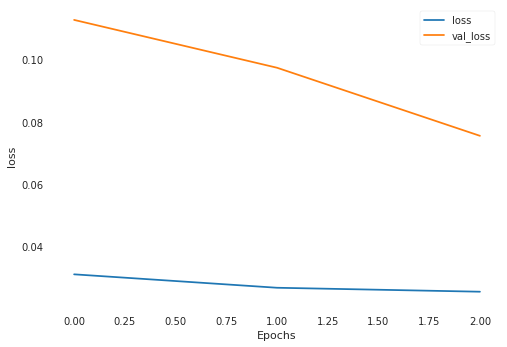

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0287 - val_loss: 0.0785
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0296 - val_loss: 0.1074
Epoch 3/3
882/882 [==============================] - 0s 362us/sample - loss: 0.0304 - val_loss: 0.0865
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.09029993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(25.097092, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.09722102], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(25.027798, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.09939145], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(25.006084, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.09219579], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(25.0781, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.10559951], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(24.944036, shape=(), dtype=float32)
loss c

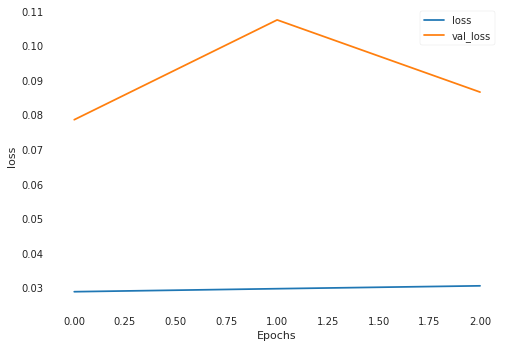

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0296 - val_loss: 0.2211
Epoch 2/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0305 - val_loss: 0.2263
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0320 - val_loss: 0.2372
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.5645027], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9598637, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6159503], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.167266, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9389572], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.861574, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9464136], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8819767, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9452943], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8789067, shape=(), dtype=float32)
loss cuts =

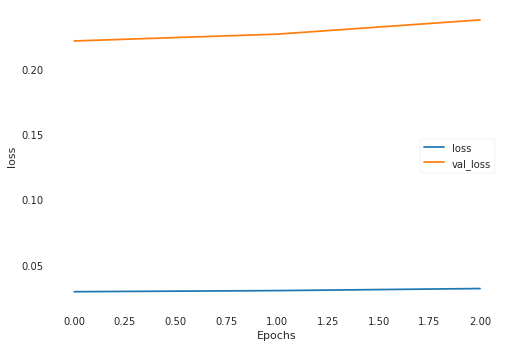

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0359 - val_loss: 0.1061
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0345 - val_loss: 0.0772
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0305 - val_loss: 0.1131
loss cuts = tf.Tensor([1.462767], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3520269, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4323125], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2821317, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4117671], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2360259, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4515163], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3259896, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4029707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2165442, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4149294], sha

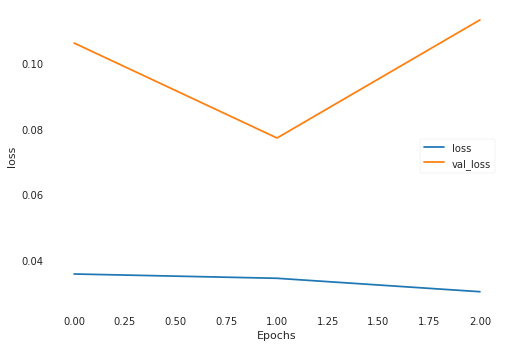

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0300 - val_loss: 0.2235
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0299 - val_loss: 0.2238
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0303 - val_loss: 0.1723
loss cuts = tf.Tensor([0.45244172], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.023238475, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.51123166], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.044618808, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45350724], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.023564471, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4562382], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024410374, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5901109], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08416433, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.

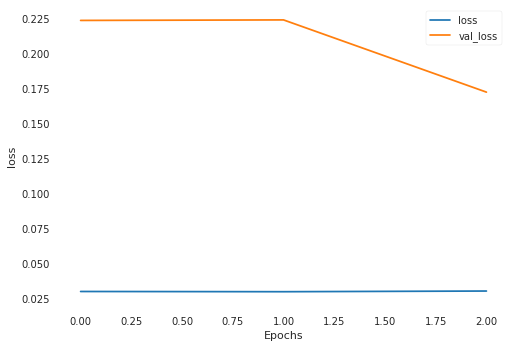

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0309 - val_loss: 0.0593
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0349 - val_loss: 0.0380
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0333 - val_loss: 0.0603
loss cuts = tf.Tensor([2.8139827], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.045788646, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.0688152], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2197878, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.3025088], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4935188, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.2950969], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4831598, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.2987976], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48831823, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.279772], 

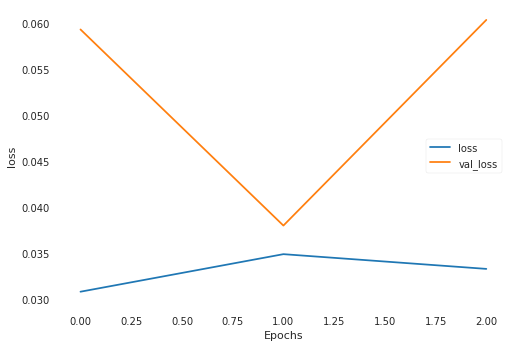

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0323 - val_loss: 0.1063
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0299 - val_loss: 0.0883
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0271 - val_loss: 0.0707
loss cuts = tf.Tensor([2.6309042], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9239814, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6269426], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9083023, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6080325], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8338912, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.614596], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.859637, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6301239], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9208906, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6591086], shap

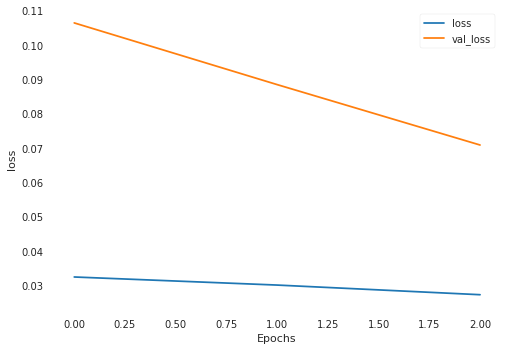

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0295 - val_loss: 0.1352
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0334 - val_loss: 0.0840
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0302 - val_loss: 0.0966
loss cuts = tf.Tensor([2.252756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.203944, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2287421], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.257219, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.232645], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2484819, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.19668], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3301467, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1967473], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3299916, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2183177], shape=(1

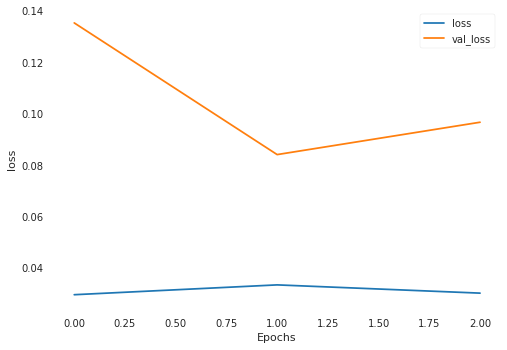

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0325 - val_loss: 0.0867
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0394 - val_loss: 0.8441
Epoch 3/3
882/882 [==============================] - 0s 360us/sample - loss: 0.2846 - val_loss: 0.2286
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2061782], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.914093, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1956718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8941134, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1614417], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8305508, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1029687], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72739166, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1682031], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.84292054, shape=(), dtype=float32)
loss cut

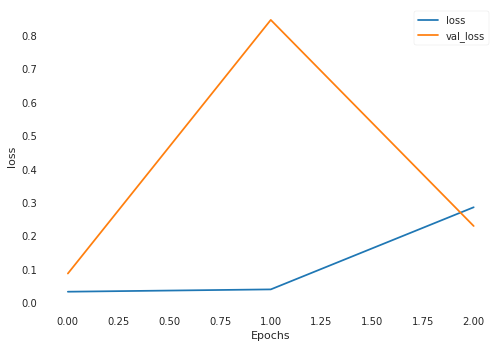

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0811 - val_loss: 0.2022
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0453 - val_loss: 0.1389
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0354 - val_loss: 0.0826
loss cuts = tf.Tensor([1.1489346], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0009913028, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1489604], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0009929249, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1447529], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00074546575, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1369324], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00037957684, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1552384], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0014279896, shape=(), dtype=float32)
loss cuts = tf.Tenso

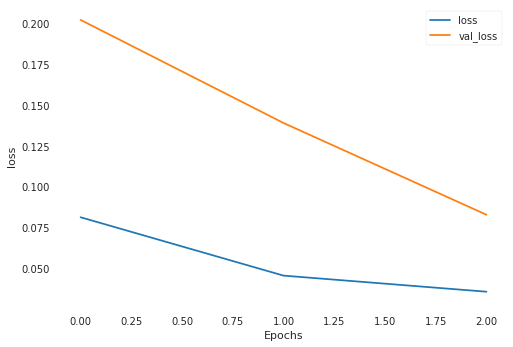

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0314 - val_loss: 0.1004
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0341 - val_loss: 0.3623
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0347 - val_loss: 0.1396
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.8667756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0972431, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8373836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0365311, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.742063], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.85152507, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8457915], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0537218, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.770469], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.90475684, shape=(), dtype=float32)
loss cuts

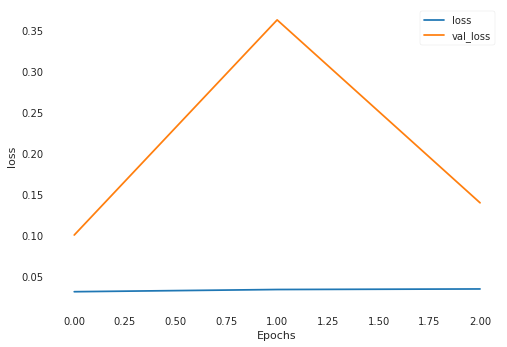

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0291 - val_loss: 0.0739
Epoch 2/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0273 - val_loss: 0.0711
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0264 - val_loss: 0.0618
loss cuts = tf.Tensor([1.1963581], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3721818, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1101359], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1776145, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80523527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.608835, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.63193524], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36842322, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60961694], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34182787, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6123955]

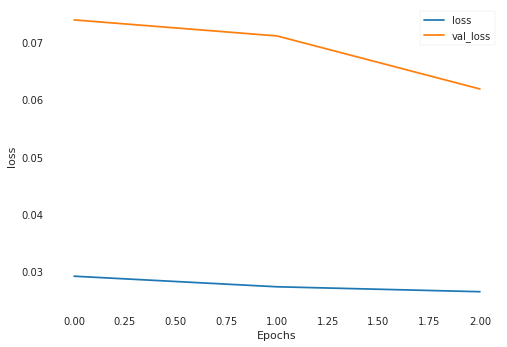

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0319 - val_loss: 0.1407
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0354 - val_loss: 0.1397
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0332 - val_loss: 0.1085
loss cuts = tf.Tensor([2.1282048], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.986692, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1891415], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2010274, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.058639], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7510836, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6963757], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.68059, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8463666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0919766, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2093246], shape=

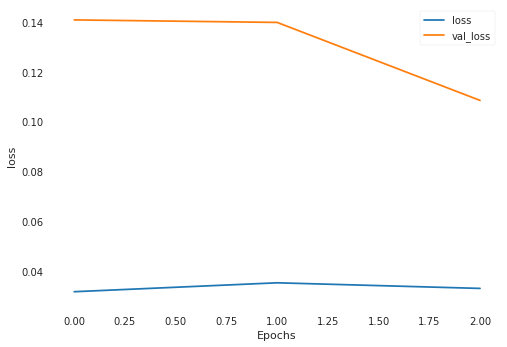

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0339 - val_loss: 0.0831
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0391 - val_loss: 0.0916
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0307 - val_loss: 0.0411
loss cuts = tf.Tensor([0.47792348], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.111163, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.43441597], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.3281627, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.47015005], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.1496563, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.485204], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.0752196, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5078629], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.964034, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4070022], sh

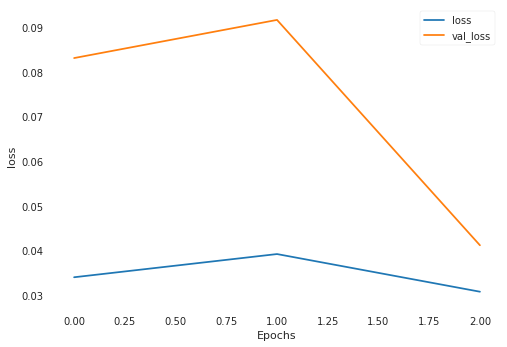

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0311 - val_loss: 0.3146
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0350 - val_loss: 0.4292
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0392 - val_loss: 0.3812
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.88602054], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.104285695, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9024188], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.093963526, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8972299], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0971716, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8739798], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.112207375, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8818049], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10702622, shape=(), dtype=float32)
l

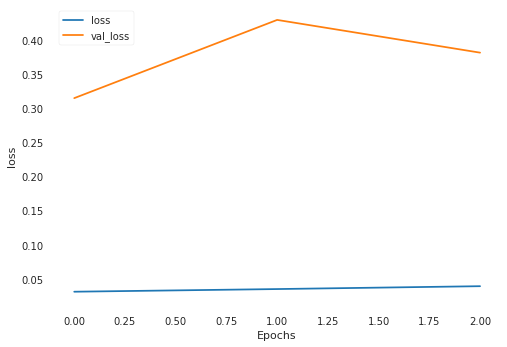

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0297 - val_loss: 0.2526
Epoch 2/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0360 - val_loss: 0.1972
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0376 - val_loss: 0.7415
loss cuts = tf.Tensor([1.5486728], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10017886, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7984765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004449794, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5243921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11613858, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3924799], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22344844, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3792211], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23615922, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.359970

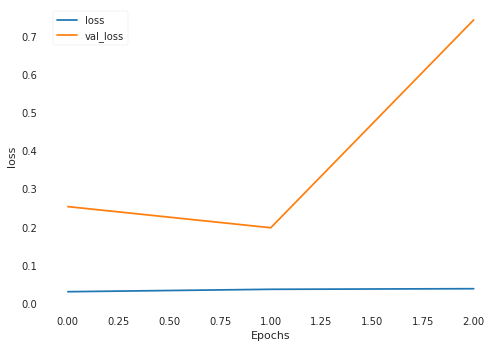

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0931 - val_loss: 0.1702
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0555 - val_loss: 0.1070
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0317 - val_loss: 0.1135
loss cuts = tf.Tensor([0.9471219], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12452291, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95038843], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12222821, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88560236], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17172536, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8386235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21286821, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.716975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33991814, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.693498

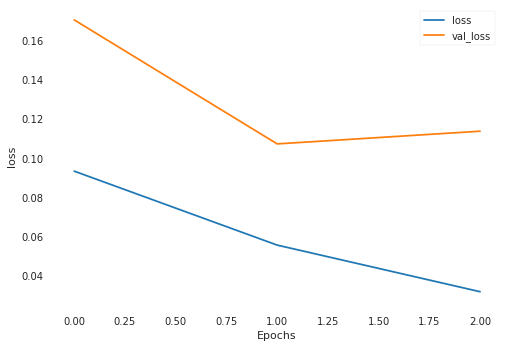

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.2464 - val_loss: 0.4869
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.1300 - val_loss: 0.1805
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0509 - val_loss: 0.1460
loss cuts = tf.Tensor([1.4704692], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0169187, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5085416], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1265075, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4872588], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.064889, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4834749], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0540285, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4891641], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0703683, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0533415], sha

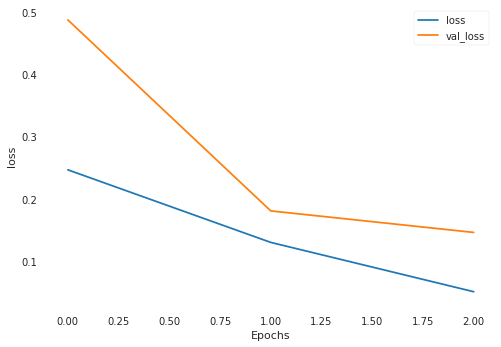

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0374 - val_loss: 0.1114
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0339 - val_loss: 0.0720
Epoch 3/3
882/882 [==============================] - 0s 362us/sample - loss: 0.0313 - val_loss: 0.1187
loss cuts = tf.Tensor([0.6274321], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7491859, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.54872525], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9635711, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4825993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.153265, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48836493], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.136377, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8258116], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2637997, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9650909], sh

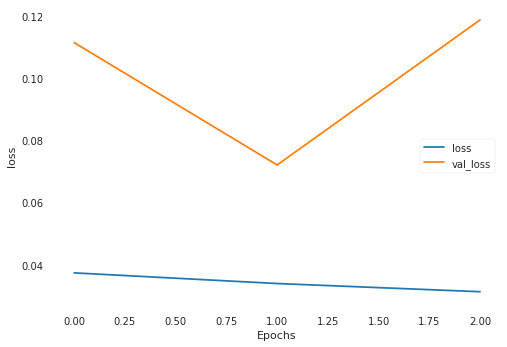

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0329 - val_loss: 0.1306
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0307 - val_loss: 0.1311
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0290 - val_loss: 0.1129
loss cuts = tf.Tensor([0.7610707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2904447, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8800861], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17632762, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8827955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17405954, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8175936], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23271592, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.74142784], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3120028, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7449567]

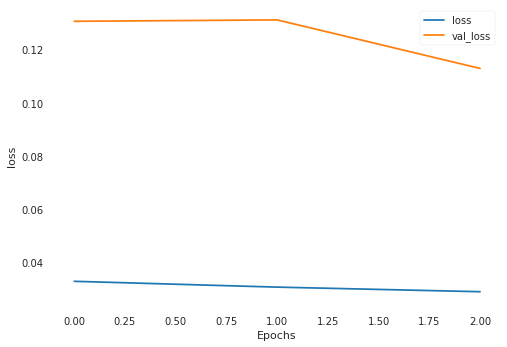

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0310 - val_loss: 0.1861
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0345 - val_loss: 0.2957
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0315 - val_loss: 0.2332
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2304965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6897245, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2280021], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.68558747, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2157898], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.66551304, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7730078], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13913482, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7560854], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12679681, shape=(), dtype=float32)
loss 

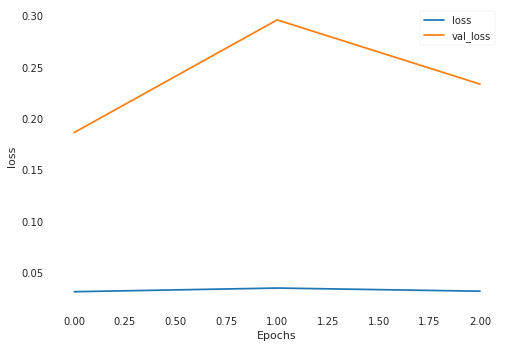

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0317 - val_loss: 0.0477
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0306 - val_loss: 0.0609
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0330 - val_loss: 0.0940
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5896516], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.343243, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57269025], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.49653, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5449022], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.748915, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55615205], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.646555, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58005756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.429878, shape=(), dtype=float32)
loss cu

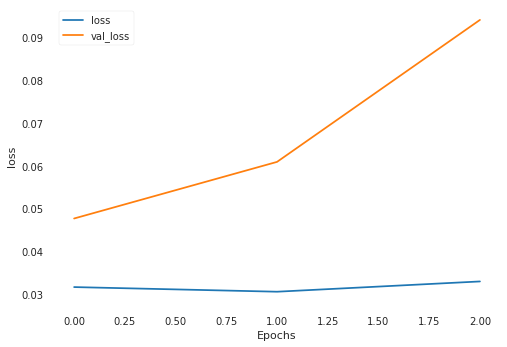

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0342 - val_loss: 0.1126
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0324 - val_loss: 0.0814
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0323 - val_loss: 0.0674
loss cuts = tf.Tensor([0.8387738], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.071178064, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2257804], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4274528, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.025471], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20565261, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0945971], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27312696, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0802999], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25838745, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6331087]

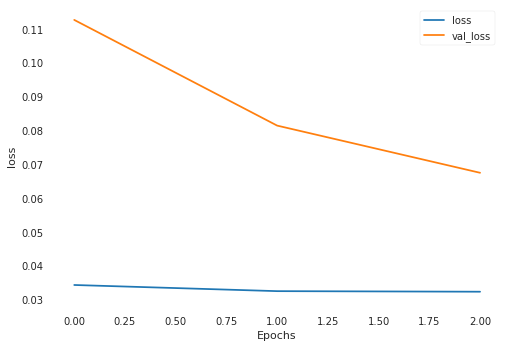

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0334 - val_loss: 0.1255
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0416 - val_loss: 0.1611
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0393 - val_loss: 0.0859
loss cuts = tf.Tensor([0.6846596], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.585746, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7054973], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.55428433, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6452138], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.64768094, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.621145], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6870007, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8303278], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3839937, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.025394], sha

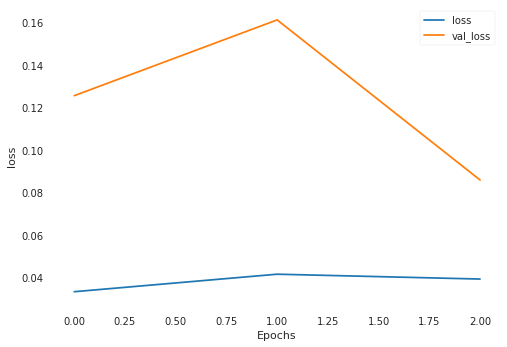

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0319 - val_loss: 0.1622
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0277 - val_loss: 0.2220
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0273 - val_loss: 0.1724
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5093207], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4023257, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5076134], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3982852, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4901786], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3573561, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4903553], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3577677, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.470417], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3116999, shape=(), dtype=float32)
loss cuts 

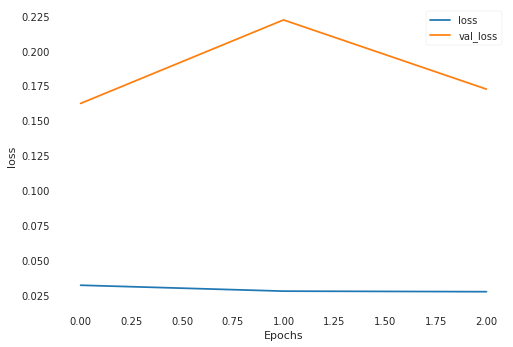

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0299 - val_loss: 0.2433
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0426 - val_loss: 0.1321
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0360 - val_loss: 0.1363
loss cuts = tf.Tensor([1.6833519], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6966081, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.672101], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.67795414, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6846491], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.69877523, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6743431], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.68165135, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6752483], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6831468, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7232282], 

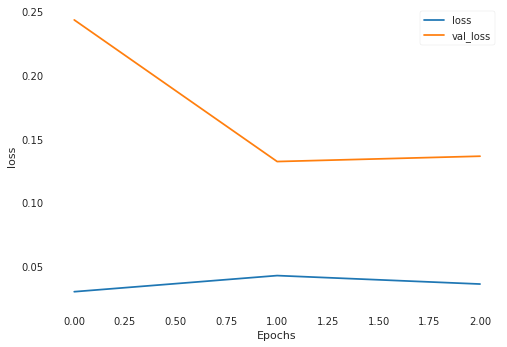

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0338 - val_loss: 0.2178
Epoch 2/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0307 - val_loss: 0.1939
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0304 - val_loss: 0.1676
loss cuts = tf.Tensor([1.8147054], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5994798, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7841159], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.523042, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7609963], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4665122, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7461056], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4306684, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7467897], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4323057, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7353612], sha

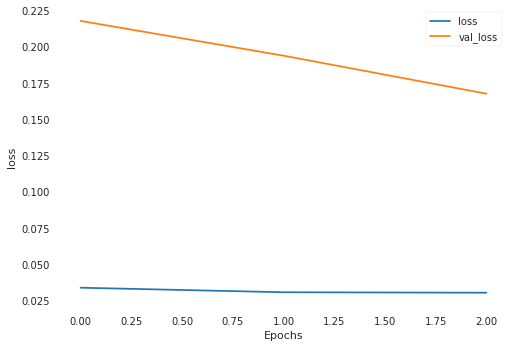

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0319 - val_loss: 0.1669
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0311 - val_loss: 0.1108
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0301 - val_loss: 0.1192
loss cuts = tf.Tensor([1.4127017], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43917358, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4520918], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49293292, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5064151], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5721638, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4654981], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5119375, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2197897], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22070241, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78721315]

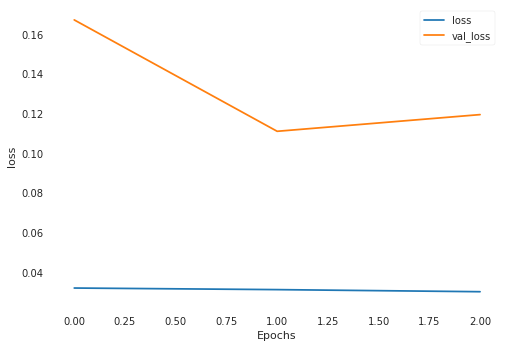

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0304 - val_loss: 0.0742
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0340 - val_loss: 0.0641
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0332 - val_loss: 0.0434
loss cuts = tf.Tensor([0.8610567], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34685427, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.893527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30966228, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88563454], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31850842, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90647614], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29541823, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88564265], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.31849927, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90406

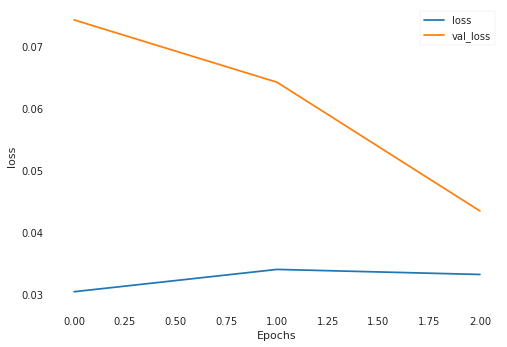

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0296 - val_loss: 0.0701
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0330 - val_loss: 0.0660
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0312 - val_loss: 0.0651
loss cuts = tf.Tensor([0.5433099], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2567348, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5496096], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2503905, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53407633], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26617718, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5396847], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26042163, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.534045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26620954, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.54506934]

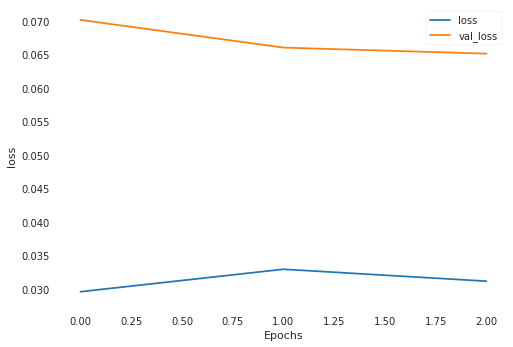

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0292 - val_loss: 0.1092
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0309 - val_loss: 0.0997
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0366 - val_loss: 0.1046
loss cuts = tf.Tensor([1.2970887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9455381, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2833713], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.919049, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2867653], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.925568, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2759174], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9048129, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2854873], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9231105, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2865256], shap

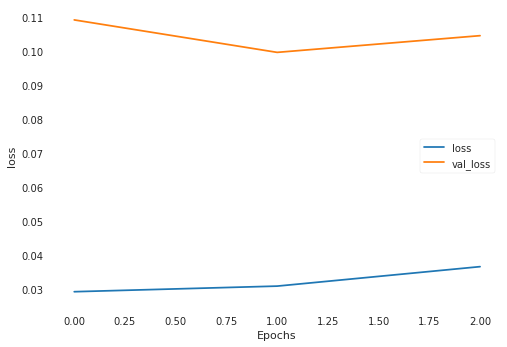

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0344 - val_loss: 0.0874
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0306 - val_loss: 0.0773
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0304 - val_loss: 0.1229
loss cuts = tf.Tensor([1.1066469], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1701192, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1072112], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1713405, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1132323], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1844096, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1085806], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1743064, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6767202], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4248352, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66710174], s

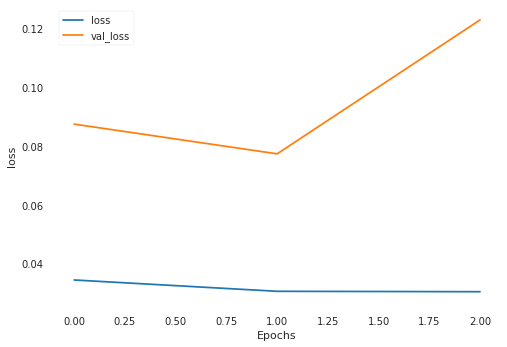

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0282 - val_loss: 0.2114
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0322 - val_loss: 0.2450
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0346 - val_loss: 0.1882
loss cuts = tf.Tensor([1.8612164], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05057374, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8886037], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.039005775, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9240124], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02627319, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.916955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.028610874, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8846178], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.040596075, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.84668

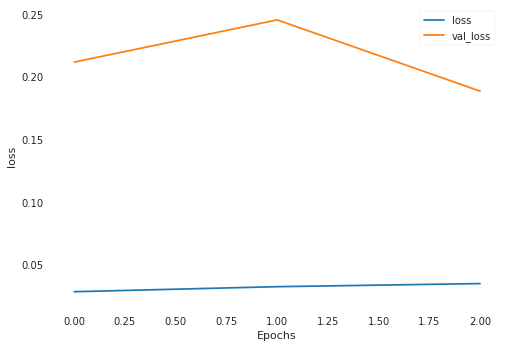

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0327 - val_loss: 0.1937
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0286 - val_loss: 0.2792
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0307 - val_loss: 0.2782
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1046816], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.055430204, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0867559], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06419227, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95554644], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14789514, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90885276], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18598954, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0471945], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.085804075, shape=(), dtype=float32)


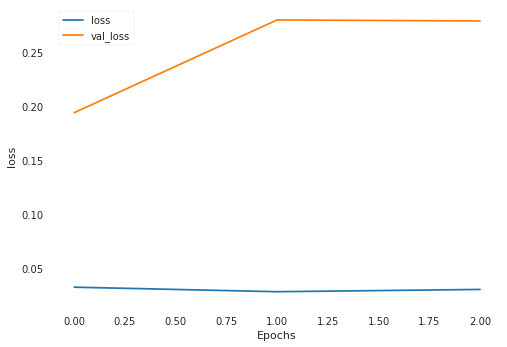

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0366 - val_loss: 0.1322
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0388 - val_loss: 0.2753
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0368 - val_loss: 0.1643
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0989888], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.90057975, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0730077], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.85194325, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0418268], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.79535514, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0463666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.80347306, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.069886], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8461902, shape=(), dtype=float32)
loss c

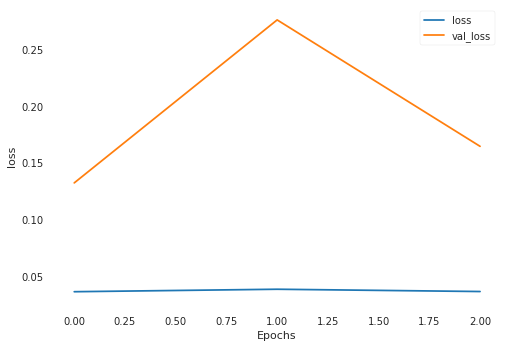

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0323 - val_loss: 0.1224
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0331 - val_loss: 0.1048
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0365 - val_loss: 0.1298
loss cuts = tf.Tensor([0.9353187], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5994189, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.942452], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5814272, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9579479], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5426934, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7811036], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.013267, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9526941], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.555772, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9508062], shape

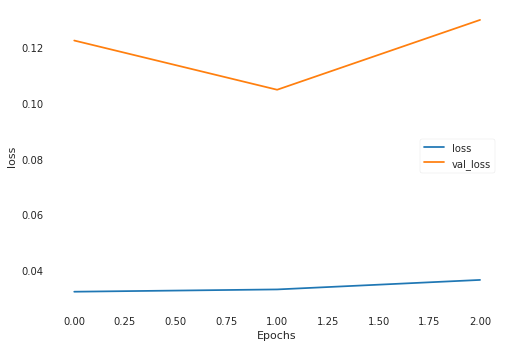

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0317 - val_loss: 0.5278
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0684 - val_loss: 0.2184
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0406 - val_loss: 0.2125
loss cuts = tf.Tensor([0.9701138], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.44922, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9215412], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6036112, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91041625], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6396368, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9092164], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.643537, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90612406], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.653602, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9971582], shap

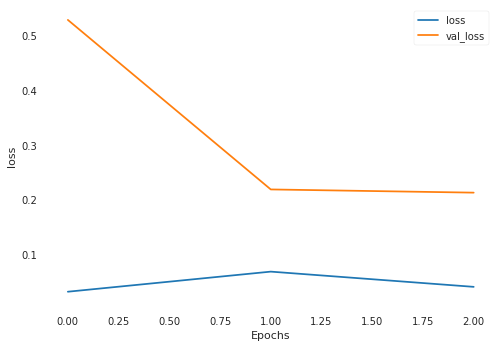

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0302 - val_loss: 0.1509
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0322 - val_loss: 0.1715
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.2602 - val_loss: 0.9371
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.4148282], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.995993, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2417276], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.7997766, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.28605652], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.588229, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.31404287], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.4566965, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36315858], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.2296433, shape=(), dtype=float32)
loss cut

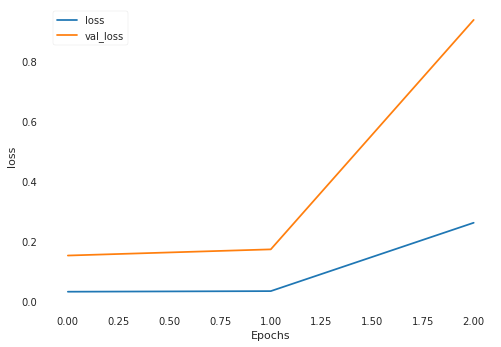

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.3862 - val_loss: 0.2180
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.1039 - val_loss: 0.1413
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0550 - val_loss: 0.1064
loss cuts = tf.Tensor([1.8912823], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(19.880161, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2887902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.493423, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3248053], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.202192, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3199139], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.241594, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.248795], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.819881, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2598705], sha

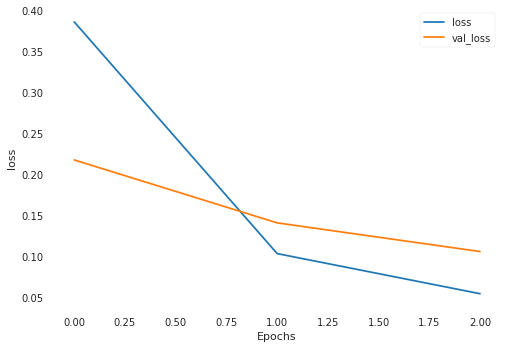

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0419 - val_loss: 0.6506
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0358 - val_loss: 0.5656
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0320 - val_loss: 0.5855
loss cuts = tf.Tensor([0.1484274], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.959508, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.21143317], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.586295, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.22144988], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.527693, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.11008706], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.190502, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.12416463], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.105346, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13081326], sh

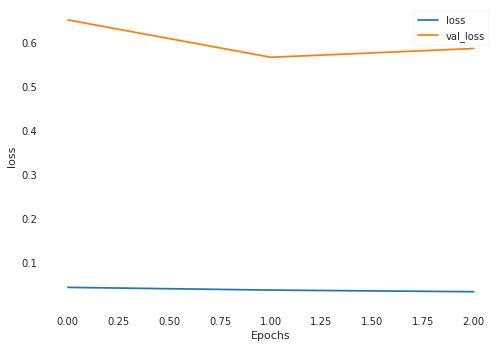

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0313 - val_loss: 0.3567
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0331 - val_loss: 0.2844
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0299 - val_loss: 0.1928
loss cuts = tf.Tensor([1.3126963], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13154864, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1699512], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.048378535, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1560026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04243709, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2300291], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07841631, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2988627], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12170519, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.086957

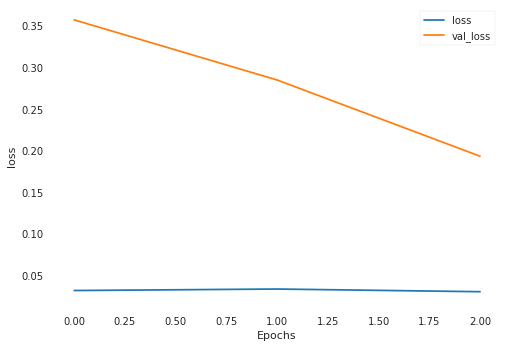

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0304 - val_loss: 0.0675
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0336 - val_loss: 0.1156
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0366 - val_loss: 0.0714
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.7647114], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.263033, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.789526], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.3661184, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6006887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6126173, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6035008], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6233153, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.619997], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6863885, shape=(), dtype=float32)
loss cuts = 

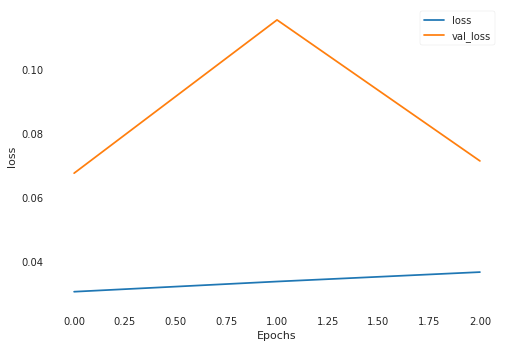

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0315 - val_loss: 0.3563
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0289 - val_loss: 0.2238
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0261 - val_loss: 0.2069
loss cuts = tf.Tensor([1.0472004], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0966288, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0518919], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1064767, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2055902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4534478, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2250993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5008683, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2261056], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5033349, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2221388], sh

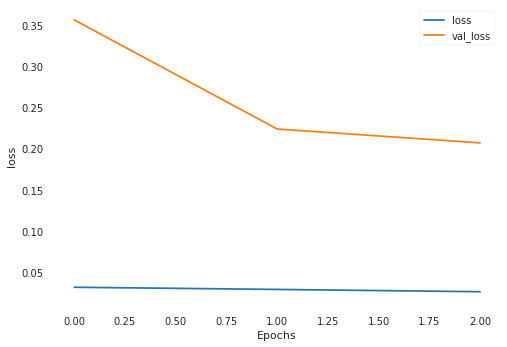

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0291 - val_loss: 0.4009
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0393 - val_loss: 0.3547
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0332 - val_loss: 0.2595
loss cuts = tf.Tensor([0.904957], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0376475, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8447956], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1638337, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8280591], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.200225, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8586184], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1342005, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8293384], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1974237, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80545837], sha

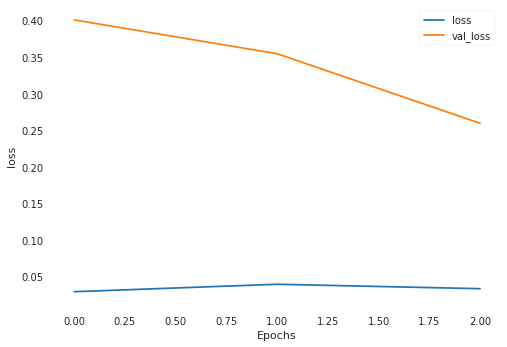

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0362 - val_loss: 0.1054
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0321 - val_loss: 0.0332
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0286 - val_loss: 0.0283
loss cuts = tf.Tensor([2.3930724], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9406506, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2513251], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5658146, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.302059], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6953574, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3011472], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6929841, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2688317], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.609934, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2080169], shap

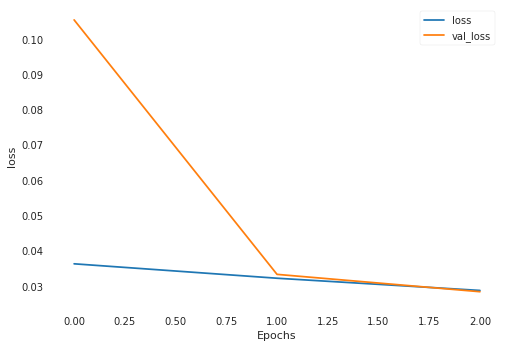

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0296 - val_loss: 0.0870
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0310 - val_loss: 0.0633
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0390 - val_loss: 0.1033
loss cuts = tf.Tensor([0.9038472], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3905885, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90908575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3744168, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8293793], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6264114, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8853494], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4481316, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9603157], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2191594, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94054747], 

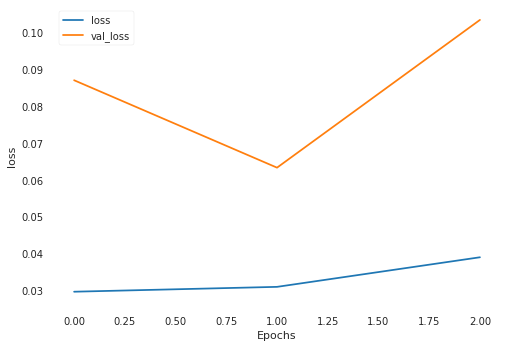

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0505 - val_loss: 0.1911
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0324 - val_loss: 0.2046
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0282 - val_loss: 0.2020
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.7009848], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.76815426, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5366721], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5071311, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5060736], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.46448705, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5228039], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48757145, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5287578], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4959217, shape=(), dtype=float32)
loss c

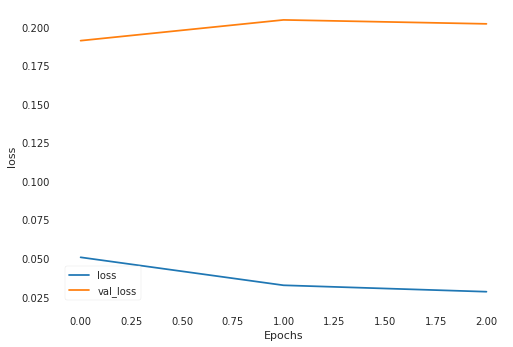

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0290 - val_loss: 0.2489
Epoch 2/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0281 - val_loss: 0.2350
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0281 - val_loss: 0.2210
loss cuts = tf.Tensor([0.8390072], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8799342, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5302737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5544643, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0440447], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.53730446, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0174586], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.57698715, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0097978], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.588684, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0093713], s

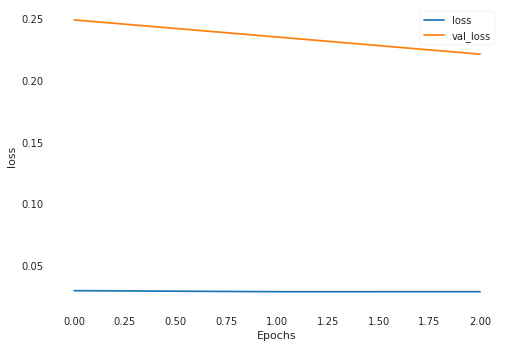

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0272 - val_loss: 0.1838
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0578 - val_loss: 0.1299
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0398 - val_loss: 0.0926
loss cuts = tf.Tensor([1.7494249], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7206025, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7618737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7618241, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.812244], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9317796, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8072834], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9148166, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8071551], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9143786, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8314784], sha

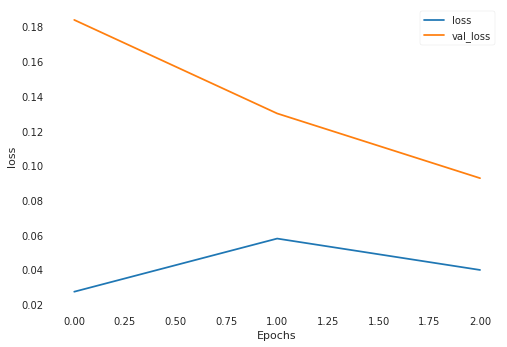

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0338 - val_loss: 0.1619
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0313 - val_loss: 0.1204
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0305 - val_loss: 0.0764
loss cuts = tf.Tensor([0.56604624], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13398986, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5888623], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1512139, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6019011], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16152452, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.56660557], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13439965, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.479609], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07818121, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9867471

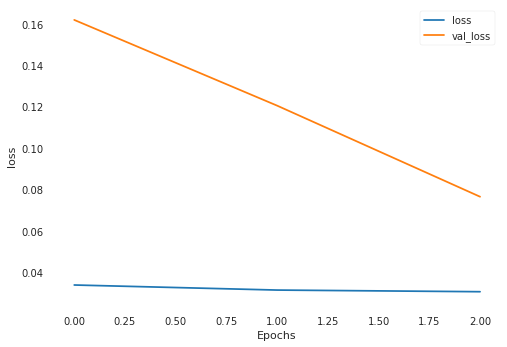

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0313 - val_loss: 0.1294
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0276 - val_loss: 0.1267
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0380 - val_loss: 0.1034
loss cuts = tf.Tensor([1.0820627], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4833711, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0761536], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4977998, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1232327], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3847811, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1363277], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.354133, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1639069], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2907073, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1744145], sha

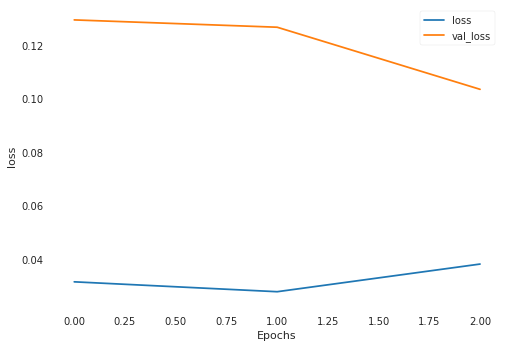

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0342 - val_loss: 0.1369
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0358 - val_loss: 0.1254
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0320 - val_loss: 0.0912
loss cuts = tf.Tensor([1.3810407], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6877655, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4182519], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7508698, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5991253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0970485, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6087952], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1173985, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6104369], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1208721, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6258723], sh

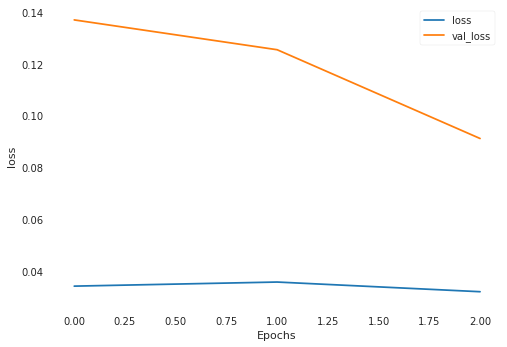

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0292 - val_loss: 0.0816
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0296 - val_loss: 0.1865
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0285 - val_loss: 0.1203
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.48199174], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.698821, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.49450195], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6780616, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48231706], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6982772, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.47342533], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7132167, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.43688986], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7762615, shape=(), dtype=float32)
loss 

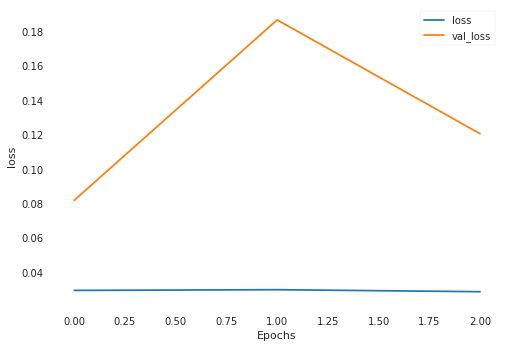

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0284 - val_loss: 0.1206
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0325 - val_loss: 0.1013
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0333 - val_loss: 0.2395
loss cuts = tf.Tensor([0.78162336], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.001413427, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.72189695], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0004897744, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7396414], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9240202e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73747635], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.2921427e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7573589], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00017771864, shape=(), dtype=float32)
loss cuts = tf.Te

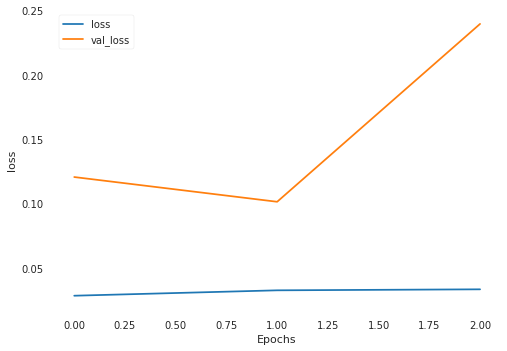

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0305 - val_loss: 0.1901
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0354 - val_loss: 0.1322
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0371 - val_loss: 0.1302
loss cuts = tf.Tensor([1.3336878], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2852479, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.33403], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.286024, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3142496], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2415521, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.311024], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2343742, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3173662], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2485073, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3171835], shape=

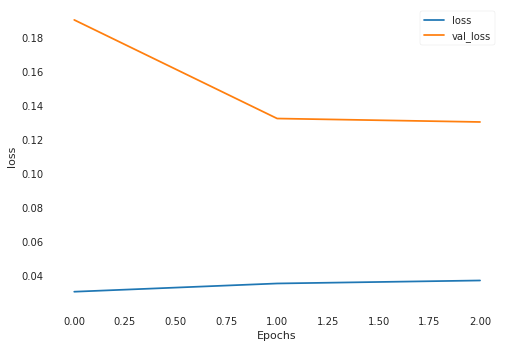

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0399 - val_loss: 0.2246
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0309 - val_loss: 0.2217
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0324 - val_loss: 0.2030
loss cuts = tf.Tensor([1.3103681], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05958538, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2861353], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07200309, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0346197], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27024356, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0479355], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25657642, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1355283], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17551148, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1391681

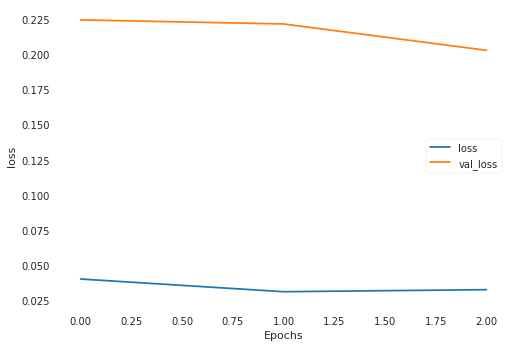

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0343 - val_loss: 0.1177
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0305 - val_loss: 0.0886
Epoch 3/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0288 - val_loss: 0.1158
loss cuts = tf.Tensor([1.4625444], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47070387, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4668944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4766916, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4368961], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4361681, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4424369], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4435175, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4575992], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.46394262, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4577363], 

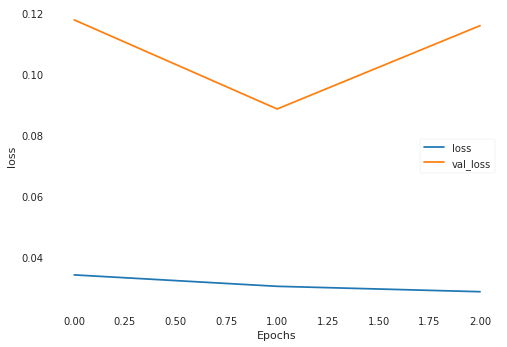

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0316 - val_loss: 0.1911
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0407 - val_loss: 0.1831
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0414 - val_loss: 0.1490
loss cuts = tf.Tensor([1.5117595], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0036242811, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4488393], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01515908, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4041595], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.028157502, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3559984], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.046640072, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0837226], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23837726, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.114

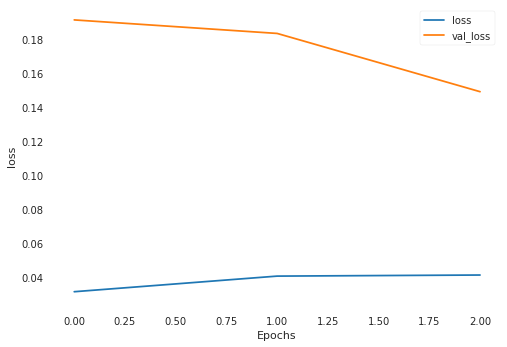

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0327 - val_loss: 0.1019
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0300 - val_loss: 0.1199
Epoch 3/3
882/882 [==============================] - 0s 366us/sample - loss: 0.0300 - val_loss: 0.1156
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.77415115], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0998694, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77596873], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.09606, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8998812], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.85195947, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9710766], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7255991, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9785913], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7128532, shape=(), dtype=float32)
loss cut

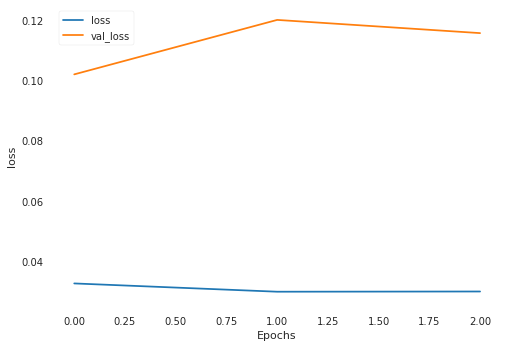

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0339 - val_loss: 2.1564
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0467 - val_loss: 0.4101
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0314 - val_loss: 0.4442
loss cuts = tf.Tensor([1.237314], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.61986333, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2229124], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.59739363, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.196588], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5573937, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1559108], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49831015, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1078882], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43281692, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1450794], 

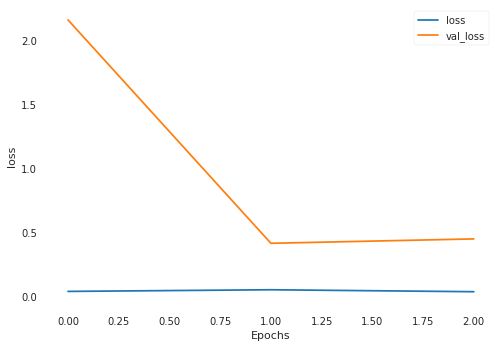

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0371 - val_loss: 0.3805
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0341 - val_loss: 0.3549
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0306 - val_loss: 0.3158
loss cuts = tf.Tensor([0.37073168], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(32.25409, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37580428], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(32.1965, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5684786], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(30.04708, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6117589], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(29.57447, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5571143], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(30.171797, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5213555], shape

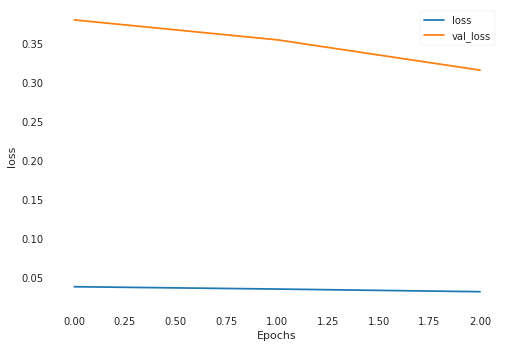

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0300 - val_loss: 0.0679
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0336 - val_loss: 0.0768
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0346 - val_loss: 0.1326
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5296698], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22121054, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.507511], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2425454, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5367041], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21464312, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5180769], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23224987, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4899867], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2601136, shape=(), dtype=float32)
loss cu

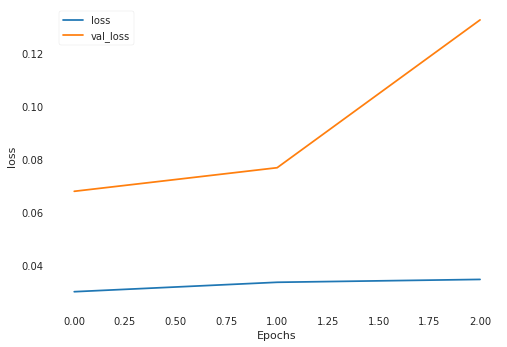

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0409 - val_loss: 0.0877
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0356 - val_loss: 0.0424
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0319 - val_loss: 0.0574
loss cuts = tf.Tensor([2.2388682], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.9008355, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2797568], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.083544, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4880955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.0664196, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2699196], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.0392814, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2770176], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.0711994, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2933588], sha

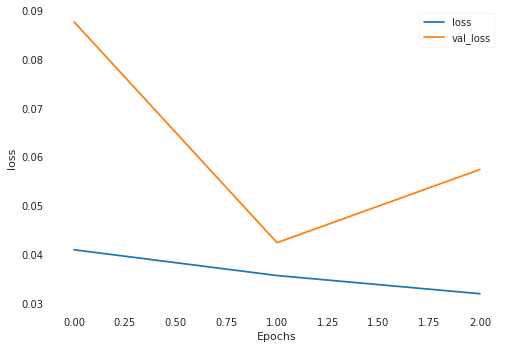

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0310 - val_loss: 0.2057
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0295 - val_loss: 0.1921
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0298 - val_loss: 0.1979
loss cuts = tf.Tensor([1.2499061], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013425414, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2621975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.016424863, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2702049], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018541433, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4699541], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11283967, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2231679], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.007944143, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.215

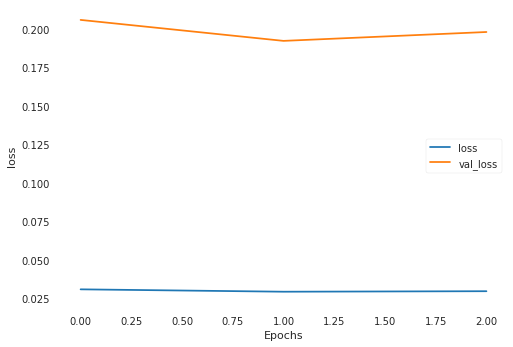

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0339 - val_loss: 0.0488
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0407 - val_loss: 0.0778
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0988 - val_loss: 0.1911
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.9104729], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15173134, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9621062], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11417217, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.0311847], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.072261654, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7326195], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4566815, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5429837], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0871062, shape=(), dtype=float32)
loss 

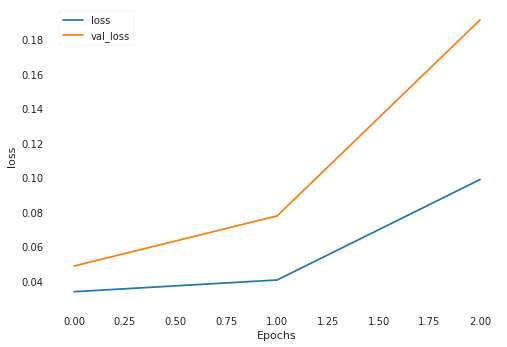

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0870 - val_loss: 0.3964
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0382 - val_loss: 0.1684
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0290 - val_loss: 0.1552
loss cuts = tf.Tensor([0.84256816], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.55789286, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.84955645], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5475023, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95041347], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40841934, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0066692], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3396806, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99889666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.348801, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9852078

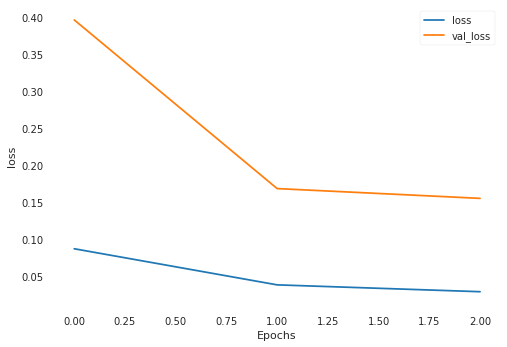

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0332 - val_loss: 0.0424
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0427 - val_loss: 0.0549
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0422 - val_loss: 0.0466
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.494596], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.020907998, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4739594], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015365939, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4953614], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.021129943, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4801325], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01693445, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4697223], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.014333417, shape=(), dtype=float32)
l

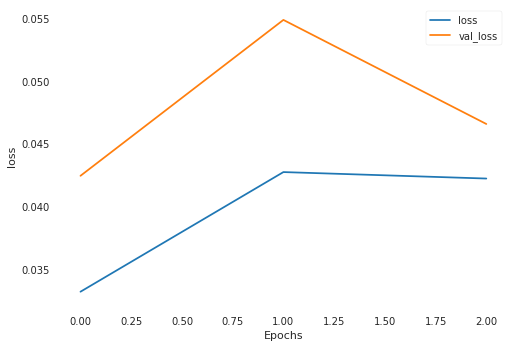

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0319 - val_loss: 0.1706
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0263 - val_loss: 0.1307
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0273 - val_loss: 0.1137
loss cuts = tf.Tensor([1.8314347], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.68726647, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5345217], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2831329, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4798504], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22794041, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6117077], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37123227, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9267112], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8543154, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9641275],

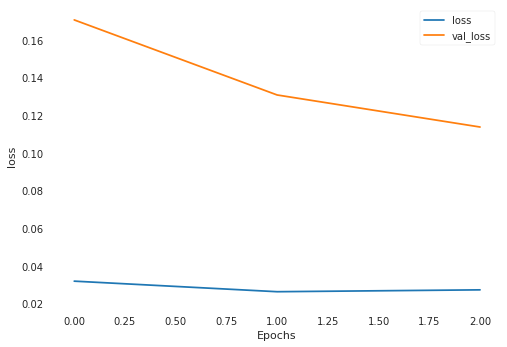

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0288 - val_loss: 0.1406
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0344 - val_loss: 0.1422
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0399 - val_loss: 0.0954
loss cuts = tf.Tensor([1.737252], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40609008, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7690754], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44766185, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7563213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43075764, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7446219], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.41553733, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7187811], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38289005, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6831249]

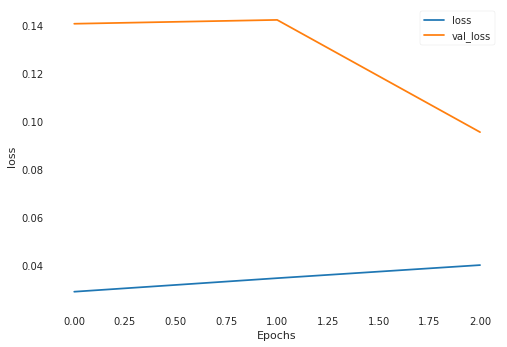

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0332 - val_loss: 0.1535
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0312 - val_loss: 0.1957
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0287 - val_loss: 0.1970
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8534921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49490106, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90778655], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5742404, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9282213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6056283, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4120998], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5928961, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2096227], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1228004, shape=(), dtype=float32)
loss cu

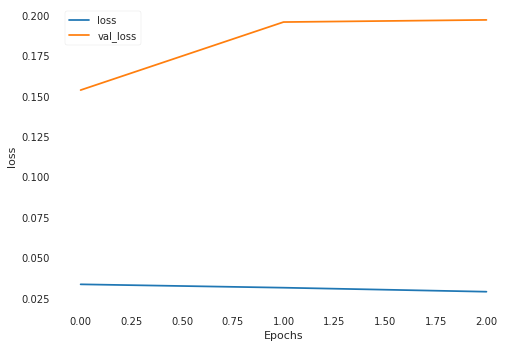

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0330 - val_loss: 0.2676
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0453 - val_loss: 0.0699
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0510 - val_loss: 0.1942
loss cuts = tf.Tensor([1.196916], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018562313, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2171004], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013469734, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0976868], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05544744, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1904944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.020353345, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1945567], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01921075, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.19167

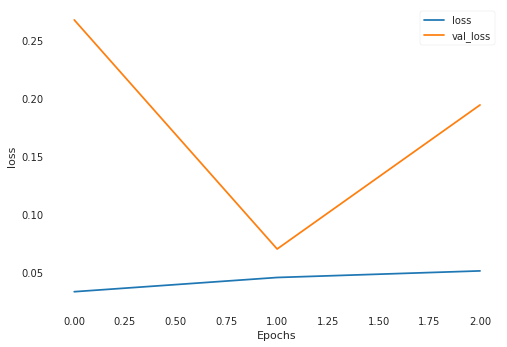

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0366 - val_loss: 0.2726
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0292 - val_loss: 0.4300
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0258 - val_loss: 0.3996
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.72058225], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006610973, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8452921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0018837298, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9126533], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012268485, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91149235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012012645, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9568631], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024016622, shape=(), dtype=float

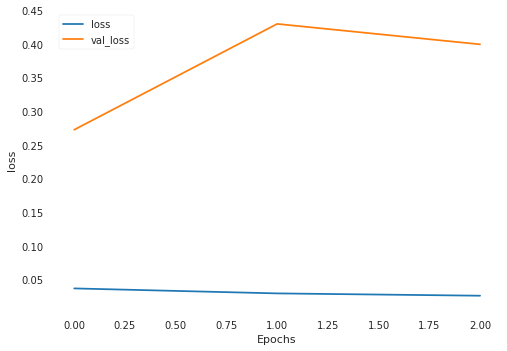

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.1603 - val_loss: 0.6894
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.2069 - val_loss: 0.2248
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0546 - val_loss: 0.1222
loss cuts = tf.Tensor([1.2106237], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.039489962, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1474361], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018369252, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1448088], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017663963, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.029399], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00030611383, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0506966], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0015049499, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.

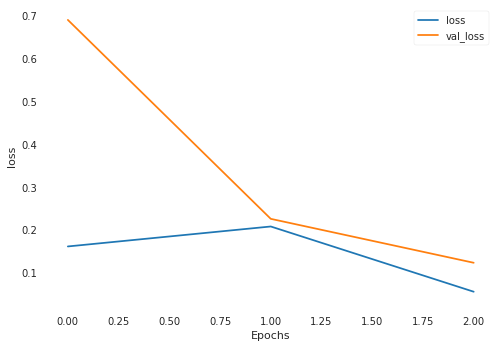

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0327 - val_loss: 0.2753
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0277 - val_loss: 0.2194
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0287 - val_loss: 0.2199
loss cuts = tf.Tensor([0.9241411], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.88165665, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0078826], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.73140854, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0350184], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6857304, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0505154], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.66030484, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8343214], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0583996, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8325554],

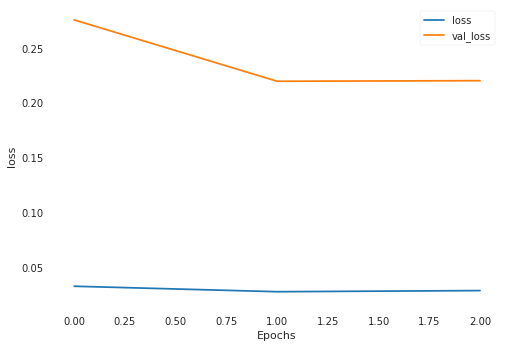

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0298 - val_loss: 0.1646
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0324 - val_loss: 0.1571
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0304 - val_loss: 0.1304
loss cuts = tf.Tensor([1.1697268], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4972632, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1969608], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4119308, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1875424], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4412737, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.186214], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4454267, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0896916], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7566237, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0988883], sha

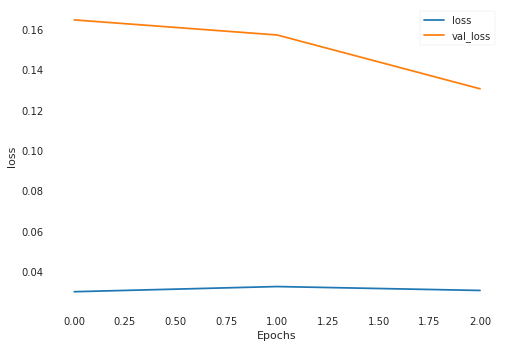

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0295 - val_loss: 0.1580
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0304 - val_loss: 0.1123
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0307 - val_loss: 0.2405
loss cuts = tf.Tensor([1.000529], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0025531861, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0099834], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0035980123, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6199374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1089413, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6347327], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09939345, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6425342], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09453522, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65610

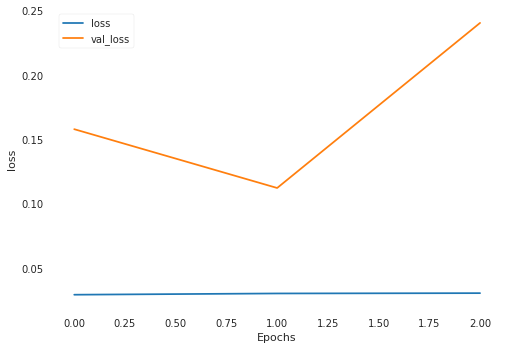

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0305 - val_loss: 0.0720
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0337 - val_loss: 0.0729
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0366 - val_loss: 0.1004
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5991649], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2525055, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.91811717], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3968468, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97737765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2602807, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97399676], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2678831, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9694928], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2780464, shape=(), dtype=float32)
loss c

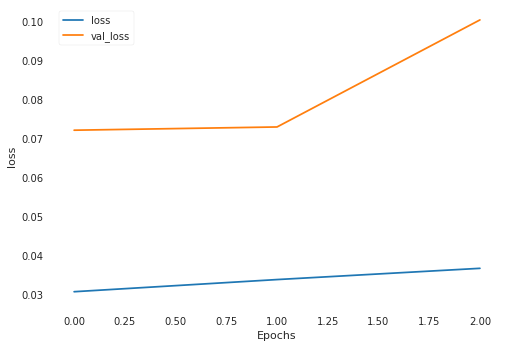

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0373 - val_loss: 0.2298
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0312 - val_loss: 0.1513
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0297 - val_loss: 0.1557
loss cuts = tf.Tensor([1.023973], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3947866, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0593204], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35161698, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2494102], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16231495, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2136723], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19238852, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2144859], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19167545, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2701137],

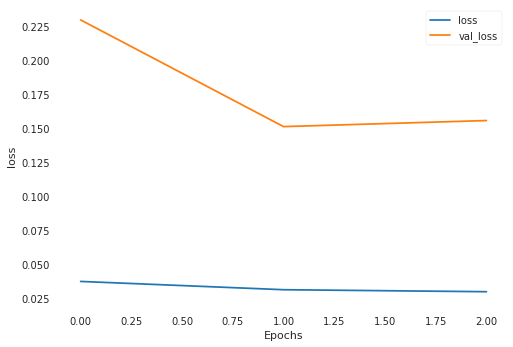

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 418us/sample - loss: 0.0335 - val_loss: 0.2908
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0355 - val_loss: 0.1971
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0317 - val_loss: 0.1636
loss cuts = tf.Tensor([0.7437125], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03752452, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7738081], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05009007, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2451371], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.48321557, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2289807], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.46101472, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2234094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4534802, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5820083]

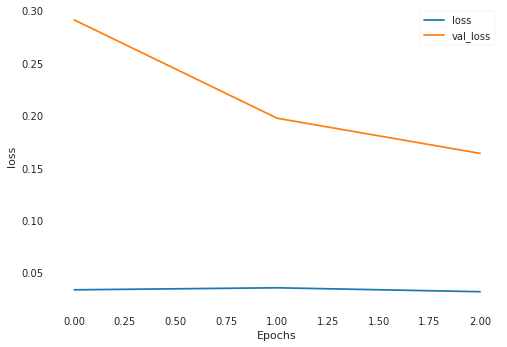

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0296 - val_loss: 0.2479
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0313 - val_loss: 0.2753
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0500 - val_loss: 0.3262
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.7214678], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01533135, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.74873394], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.022826971, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7386339], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.019877026, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7388603], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.019940926, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6879343], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.008151619, shape=(), dtype=float32)

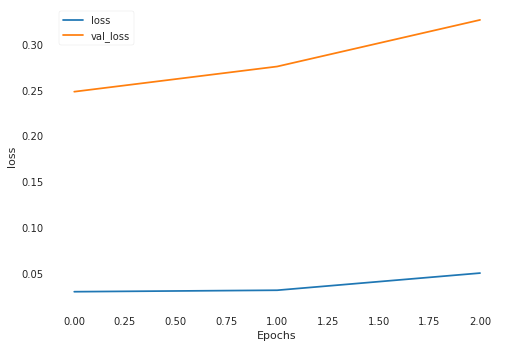

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0386 - val_loss: 0.0992
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0398 - val_loss: 0.1080
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0346 - val_loss: 0.0693
loss cuts = tf.Tensor([2.1464052], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7724588, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0546677], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6196191, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9743205], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49958274, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0036063], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5418395, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9710581], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49498156, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.151868], s

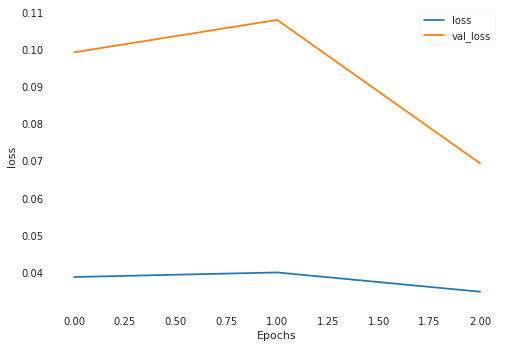

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0300 - val_loss: 0.2230
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0305 - val_loss: 0.3039
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0319 - val_loss: 0.2372
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.153511], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8162053, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1777048], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9113162, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6826675], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1983027, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.18574], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9431632, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.198136], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9925478, shape=(), dtype=float32)
loss cuts = t

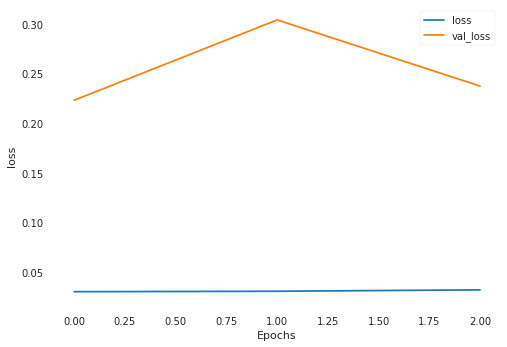

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0329 - val_loss: 0.2025
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0328 - val_loss: 0.2744
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0307 - val_loss: 0.1658
loss cuts = tf.Tensor([1.1180063], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013925498, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1235955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015275842, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1172012], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013736123, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1724988], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.029755844, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1702944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.029000184, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.15

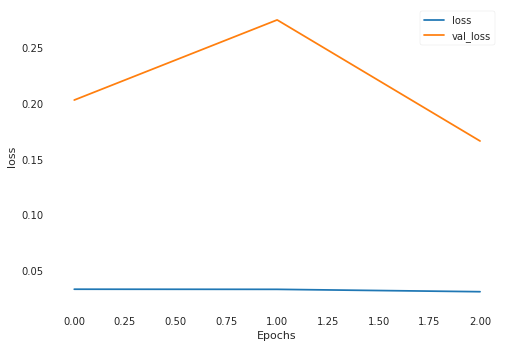

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0348 - val_loss: 0.2241
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0968 - val_loss: 0.2716
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0906 - val_loss: 0.2954
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.6194913], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04817642, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6107766], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.044426773, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57711595], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03137006, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.55330884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0235036, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.53433096], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018044807, shape=(), dtype=float32)


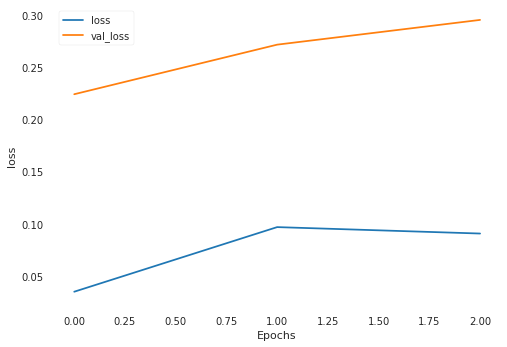

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0488 - val_loss: 0.0999
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0335 - val_loss: 0.0647
Epoch 3/3
882/882 [==============================] - 0s 363us/sample - loss: 0.0312 - val_loss: 0.0990
loss cuts = tf.Tensor([1.8239607], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8877681, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7794886], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7675397, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5482202], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2060874, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.415655], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.93248963, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4613576], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0228441, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6099062], sh

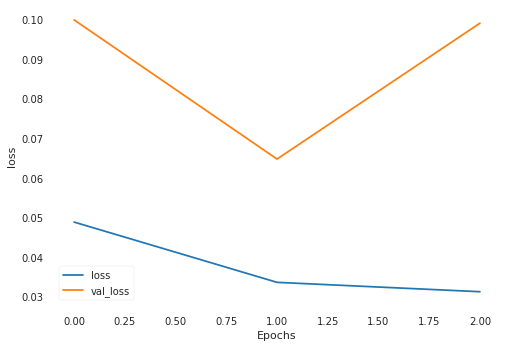

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0345 - val_loss: 0.1846
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.1103 - val_loss: 0.2351
Epoch 3/3
882/882 [==============================] - 0s 365us/sample - loss: 0.0516 - val_loss: 0.2638
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1510228], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47931275, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0756097], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5894205, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0755148], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.58956623, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.10316], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5478767, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1149409], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5305754, shape=(), dtype=float32)
loss cuts

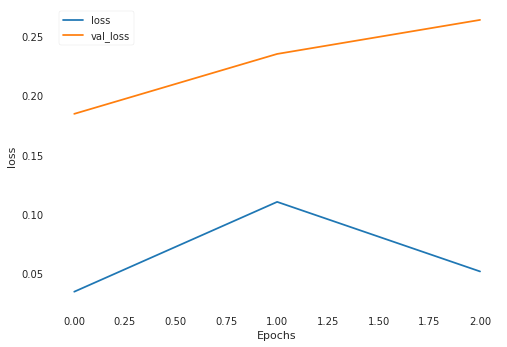

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0317 - val_loss: 0.0782
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0285 - val_loss: 0.0836
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0313 - val_loss: 0.1194
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.35606518], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2182026, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44796836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.896912, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.37473166], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.151578, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3696264], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1697304, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3650818], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1859334, shape=(), dtype=float32)
loss cut

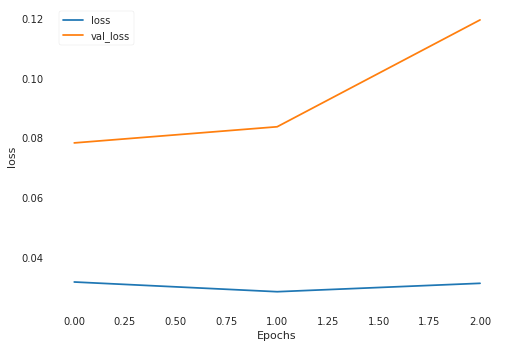

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0353 - val_loss: 0.1145
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0333 - val_loss: 0.0913
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0266 - val_loss: 0.0951
loss cuts = tf.Tensor([0.58335334], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02777111, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5137888], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05579572, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5460912], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0415788, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.61053556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01945033, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73307985], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00028629144, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88

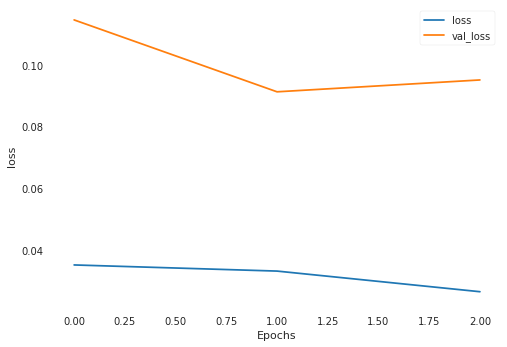

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0273 - val_loss: 0.1363
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0304 - val_loss: 0.1205
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0338 - val_loss: 0.1045
loss cuts = tf.Tensor([0.8240199], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.030030318, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.80446863], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.023636388, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.78291506], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017473595, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7648102], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013014901, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7829476], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017482199, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.

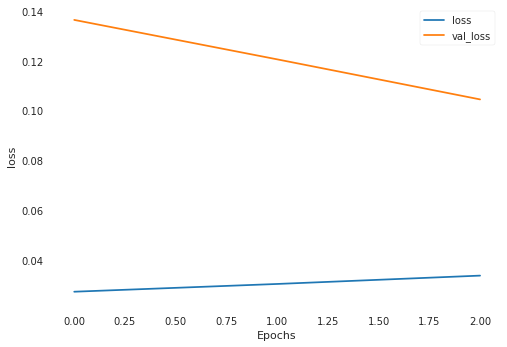

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0362 - val_loss: 0.3127
Epoch 2/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0419 - val_loss: 0.2330
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0335 - val_loss: 0.1993
loss cuts = tf.Tensor([1.1667299], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24135588, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1510955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.25696206, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1237448], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.285439, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1310987], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27763522, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1324958], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27616498, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1383747],

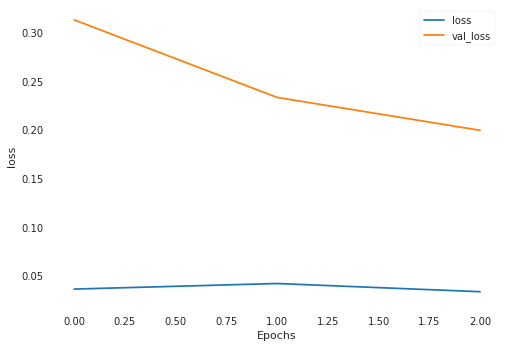

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0336 - val_loss: 0.1795
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0463 - val_loss: 0.1804
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0344 - val_loss: 0.1176
loss cuts = tf.Tensor([1.0132684], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38574174, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.99162185], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.41309878, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97858703], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43002436, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0266403], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36931044, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0214546], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37564015, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.02664

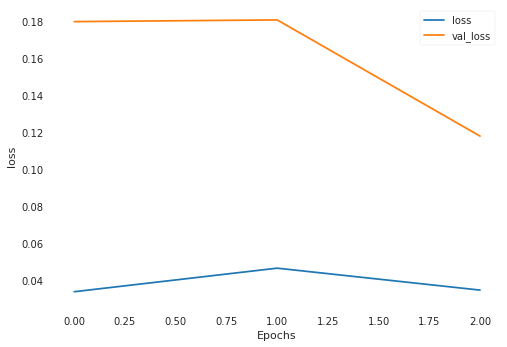

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0321 - val_loss: 0.0722
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0303 - val_loss: 0.0510
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0283 - val_loss: 0.0430
loss cuts = tf.Tensor([1.1875386], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.54396325, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1704477], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.51904494, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1195744], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44832993, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92572796], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22631711, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9213408], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22216219, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.774443

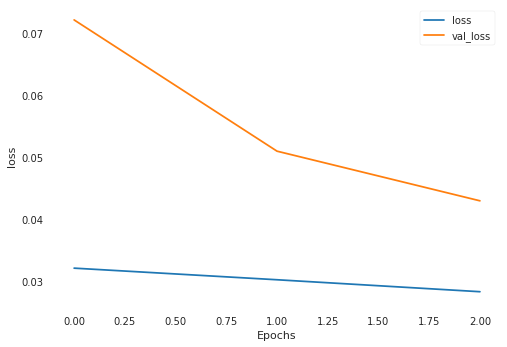

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0287 - val_loss: 0.1202
Epoch 2/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0337 - val_loss: 0.1327
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0416 - val_loss: 0.3595
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.97348154], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.021956997, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9490657], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.015317301, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9303408], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011033029, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6034981], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.049197234, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6177197], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.043090656, shape=(), dtype=float32

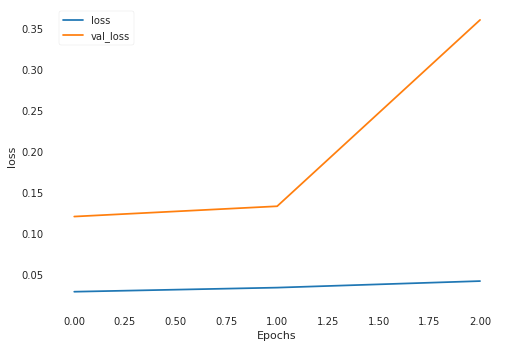

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0485 - val_loss: 0.2085
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0462 - val_loss: 0.2140
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0336 - val_loss: 0.1991
loss cuts = tf.Tensor([0.43125165], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.55284154, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4506454], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5243779, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3757051], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6385283, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44123334], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.53809774, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45021325], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5250039, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4513574

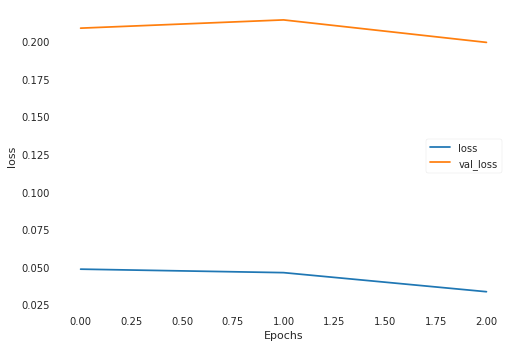

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0309 - val_loss: 0.2119
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0281 - val_loss: 0.1442
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0305 - val_loss: 0.1508
loss cuts = tf.Tensor([0.59528446], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.92859876, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5889069], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.94093084, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.623528], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.87496334, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9633059], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35475945, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.86757475], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47796208, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.857357

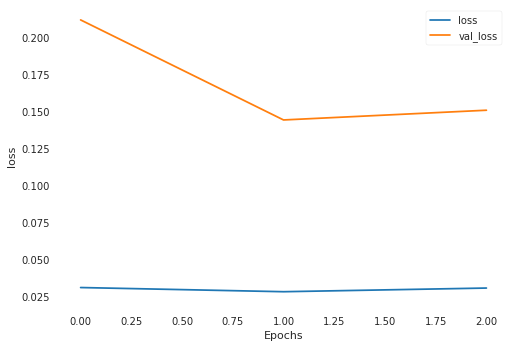

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0304 - val_loss: 0.0526
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0335 - val_loss: 0.0695
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0396 - val_loss: 0.0780
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8449991], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19802417, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8288493], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18391173, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82429737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18002824, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8316363], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1863099, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.84354633], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19673334, shape=(), dtype=float32)
los

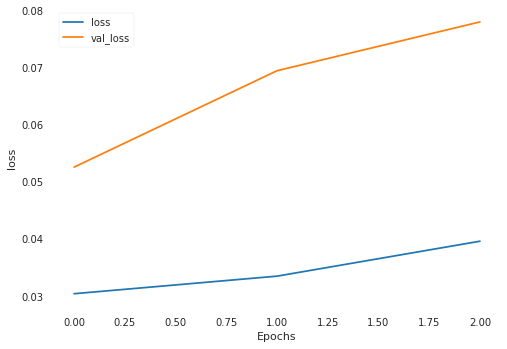

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0459 - val_loss: 0.0920
Epoch 2/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0414 - val_loss: 0.0580
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0291 - val_loss: 0.1346
loss cuts = tf.Tensor([1.0871936], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.921272, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.075628], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.0107565, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0542215], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.177088, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0594937], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.136039, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0627999], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.110323, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0511863], sh

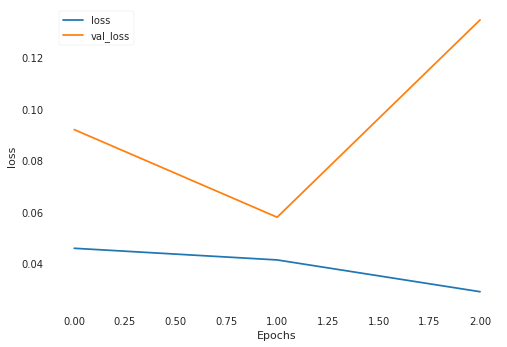

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0306 - val_loss: 0.0860
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0332 - val_loss: 0.1002
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0325 - val_loss: 0.1282
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.9755995], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.84556, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9486059], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.074348, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97294205], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.86802, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6592652], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.618273, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.69134843], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.327936, shape=(), dtype=float32)
loss cuts

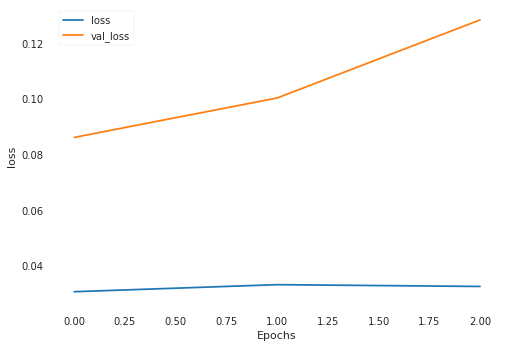

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0332 - val_loss: 0.4531
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0315 - val_loss: 0.4058
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0325 - val_loss: 0.3150
loss cuts = tf.Tensor([0.8097833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7093534, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7761322], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8401072, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76504314], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.883691, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7703015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.862993, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76628333], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8788047, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7673036], sh

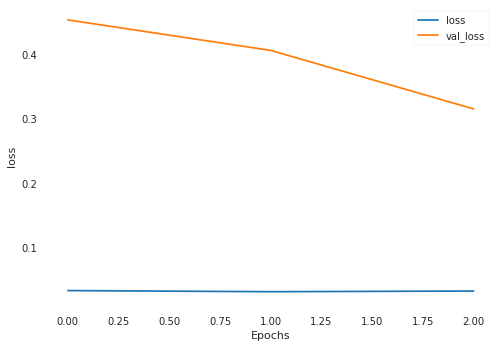

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0453 - val_loss: 0.5726
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.2213 - val_loss: 0.3082
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0630 - val_loss: 0.1369
loss cuts = tf.Tensor([0.652669], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.6110306, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6761466], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.5107527, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66223913], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.5700216, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66139185], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.573644, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66575325], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.5550094, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.59600544], 

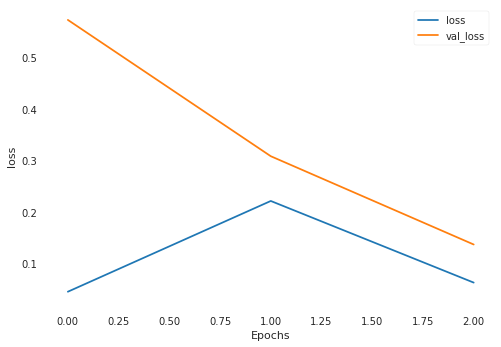

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0333 - val_loss: 0.2671
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0289 - val_loss: 0.2648
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0262 - val_loss: 0.4171
loss cuts = tf.Tensor([1.2158258], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4178975, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1462939], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2571412, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1136348], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1849717, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1226666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2047166, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1175749], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1935652, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0333012], sh

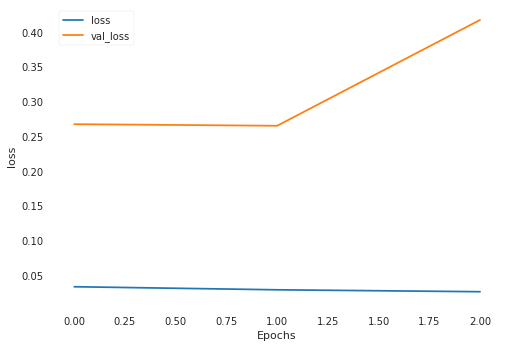

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0273 - val_loss: 0.9559
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0309 - val_loss: 0.3020
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0355 - val_loss: 0.2148
loss cuts = tf.Tensor([0.6763195], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0151958, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6870843], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.977927, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6768564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0133317, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67622507], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.015524, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.62273425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2041614, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5639983], sh

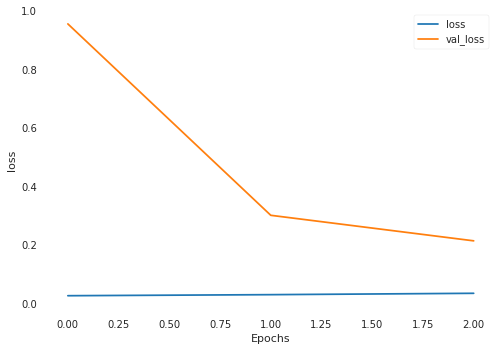

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0358 - val_loss: 0.2702
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0372 - val_loss: 0.4263
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0327 - val_loss: 0.3717
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.6689425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.71487117, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3742373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30337554, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3786755], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30828428, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3709587], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29977462, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3699025], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29861915, shape=(), dtype=float32)
loss

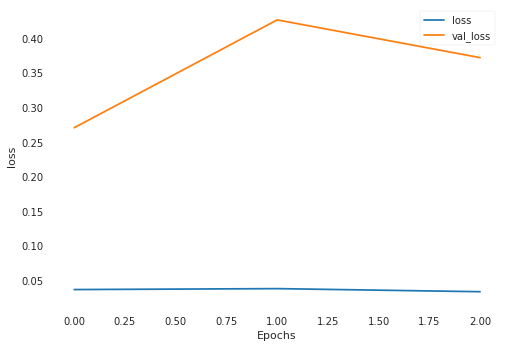

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0315 - val_loss: 0.1908
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.2373 - val_loss: 0.4582
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.1179 - val_loss: 0.3430
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.0183712], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9867401, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0043596], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.95909965, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2720209], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.555003, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2504071], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5015653, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2571062], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5180281, shape=(), dtype=float32)
loss cuts

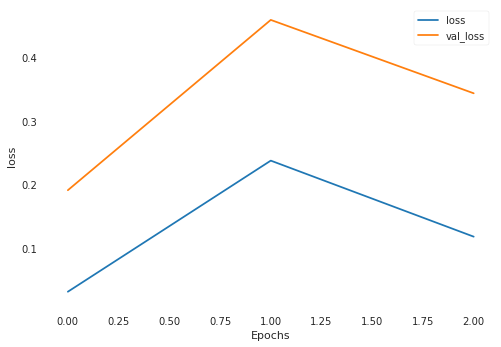

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0530 - val_loss: 0.2207
Epoch 2/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0340 - val_loss: 0.2949
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0302 - val_loss: 0.3885
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5115962], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.56964254, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6003662], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4435249, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5920402], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.45468414, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.597452], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.44741493, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.248242], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0365293, shape=(), dtype=float32)
loss cut

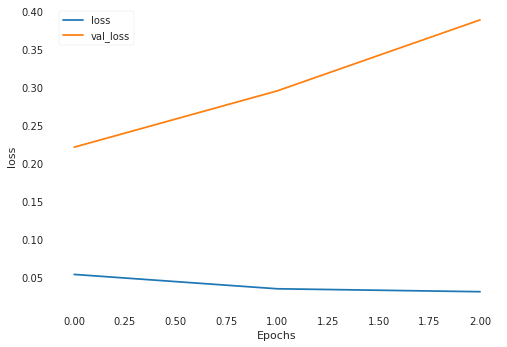

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.1021 - val_loss: 0.2630
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0731 - val_loss: 0.1962
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0374 - val_loss: 0.1532
loss cuts = tf.Tensor([1.091745], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19920649, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0415126], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2465698, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5162171], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00047757314, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6946406], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024514189, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7006786], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026441371, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6726

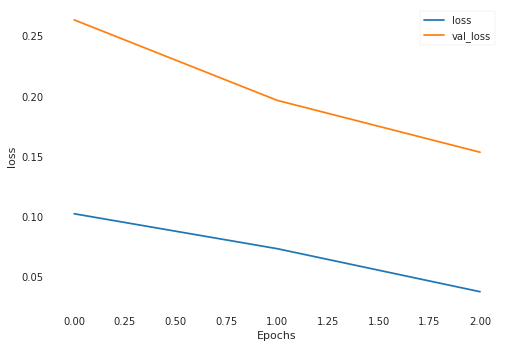

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0290 - val_loss: 0.3004
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0277 - val_loss: 0.2243
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0282 - val_loss: 0.3250
loss cuts = tf.Tensor([0.834077], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.061734412, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6946554], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15045531, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0114987], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005047025, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0240569], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0034204014, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0165706], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0043521123, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95

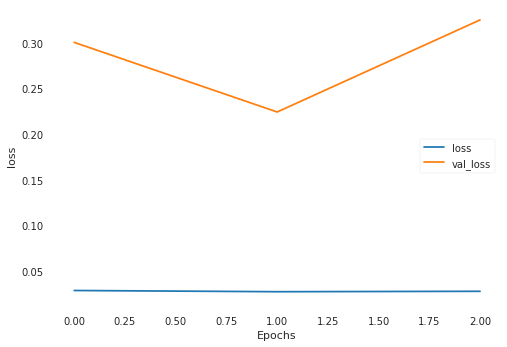

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0312 - val_loss: 0.1353
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0297 - val_loss: 0.1216
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0303 - val_loss: 0.0686
loss cuts = tf.Tensor([0.6369119], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(14.160833, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7063215], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(13.643262, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8581357], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.544804, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.85404694], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.573785, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48596117], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(15.3197, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.46620297], s

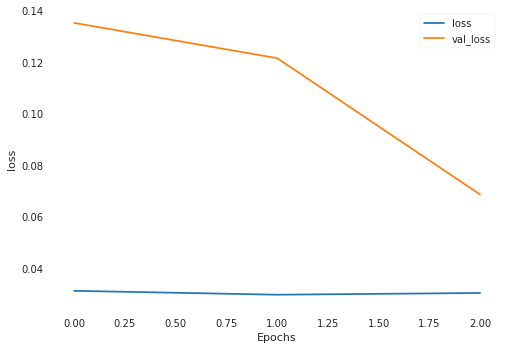

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0464 - val_loss: 0.2353
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0361 - val_loss: 0.2138
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0312 - val_loss: 0.1460
loss cuts = tf.Tensor([1.651966], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.014348006, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6546037], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.013723049, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7609321], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0217512, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.89334893], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7715869, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9865676], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.61651003, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9884494

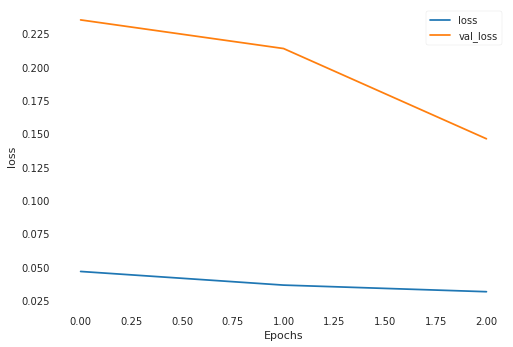

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 431us/sample - loss: 0.0319 - val_loss: 0.1033
Epoch 2/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0323 - val_loss: 0.0670
Epoch 3/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0287 - val_loss: 0.0725
loss cuts = tf.Tensor([0.55325365], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0045398087, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7788919], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02504628, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.79690814], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.031073363, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6364733], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0002509545, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.58503467], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0012671525, shape=(), dtype=float32)
loss cuts = tf.Tensor(

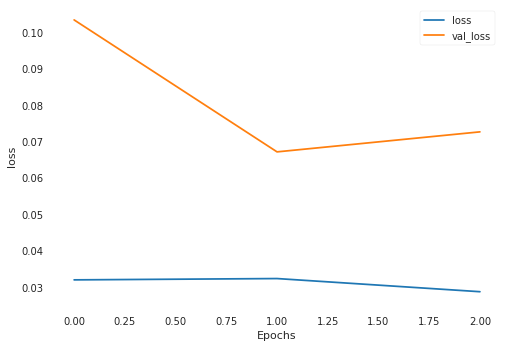

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0329 - val_loss: 0.1950
Epoch 2/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0357 - val_loss: 0.2720
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0276 - val_loss: 0.2050
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.6011835], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5654602, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7086627], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8459644, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0331585], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.46670556, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92847896], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33463788, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90333015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30617428, shape=(), dtype=float32)
loss

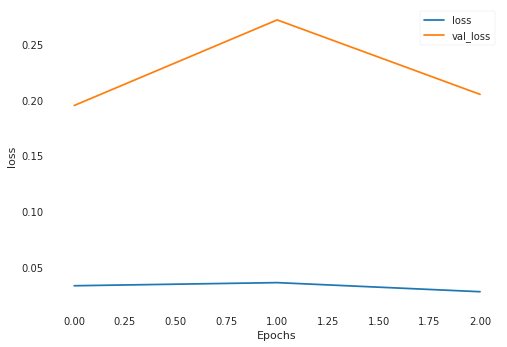

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0350 - val_loss: 0.0595
Epoch 2/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0375 - val_loss: 0.0765
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0389 - val_loss: 0.0803
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8139325], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.190037, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8152095], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1854768, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8322161], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1250598, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8852067], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9405158, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6778562], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.850349, shape=(), dtype=float32)
loss cuts =

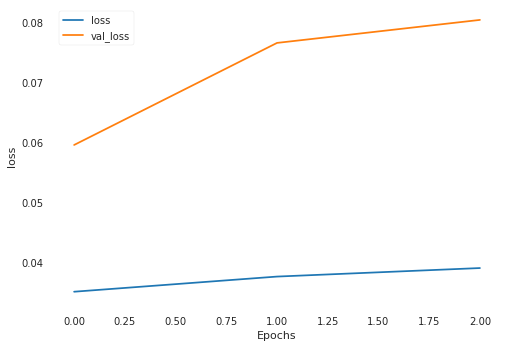

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0329 - val_loss: 0.0548
Epoch 2/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0331 - val_loss: 0.0595
Epoch 3/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0570 - val_loss: 0.1276
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3291721], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0600961, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3279629], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0576074, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4687669], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3670391, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.30746], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0158573, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2761018], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.95362914, shape=(), dtype=float32)
loss cuts 

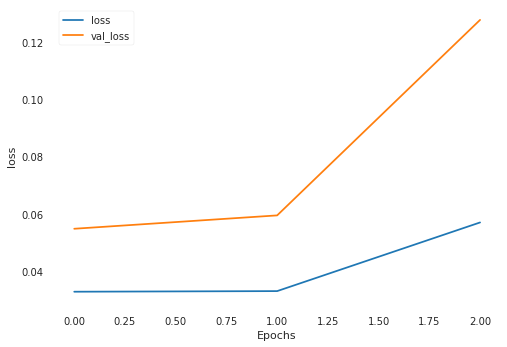

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 437us/sample - loss: 0.0530 - val_loss: 0.1014
Epoch 2/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0353 - val_loss: 0.0537
Epoch 3/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0314 - val_loss: 0.0663
loss cuts = tf.Tensor([1.7691152], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0811684, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7863042], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1310585, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0343993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9169552, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8849211], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4287083, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7142947], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9260026, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7155827], sh

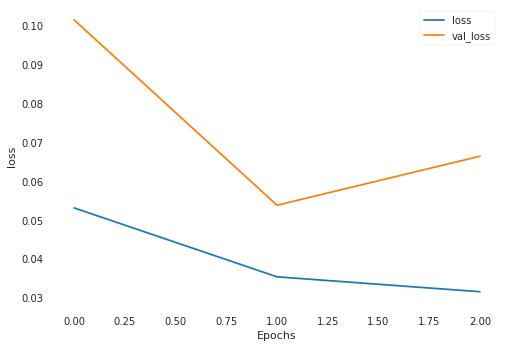

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 487us/sample - loss: 0.0304 - val_loss: 0.3868
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0333 - val_loss: 0.3628
Epoch 3/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0340 - val_loss: 0.2298
loss cuts = tf.Tensor([0.9381776], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2611243, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9063215], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22958206, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90144], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22492798, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9222937], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.24514325, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0055032], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33446425, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0445524], 

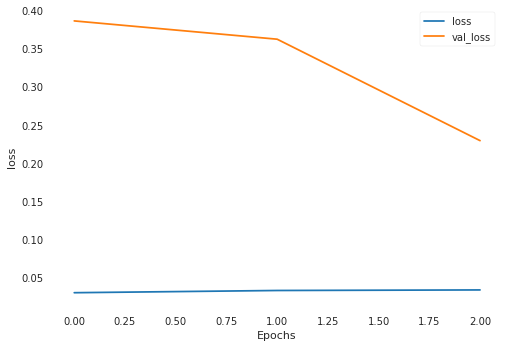

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 424us/sample - loss: 0.0330 - val_loss: 0.1189
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0301 - val_loss: 0.0711
Epoch 3/3
882/882 [==============================] - 0s 425us/sample - loss: 0.0377 - val_loss: 0.0705
loss cuts = tf.Tensor([1.8020201], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.7495003, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.842334], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.5416555, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.891045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.294855, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6603963], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.505429, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6415172], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.609228, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8251848], shape=(

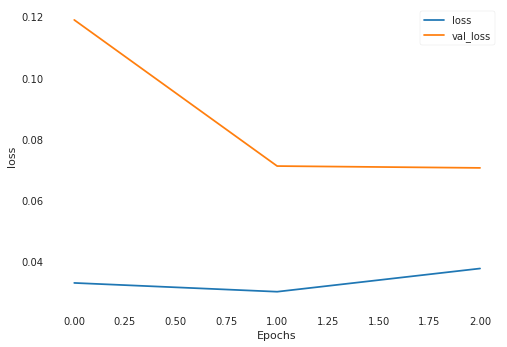

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 433us/sample - loss: 0.0382 - val_loss: 0.1013
Epoch 2/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0313 - val_loss: 0.2397
Epoch 3/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0349 - val_loss: 0.0675
loss cuts = tf.Tensor([1.1308179], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.072459, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9997835], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16017322, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1886015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04468932, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1995132], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.040194947, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1994152], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04023425, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0532013]

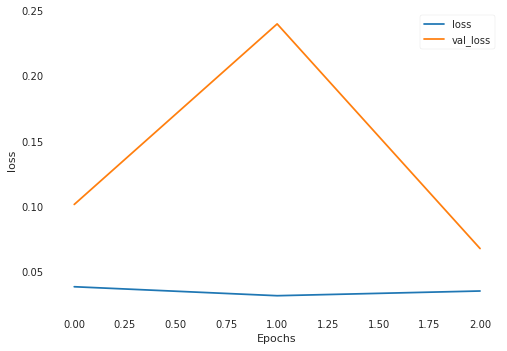

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 439us/sample - loss: 0.0338 - val_loss: 0.0817
Epoch 2/3
882/882 [==============================] - 0s 431us/sample - loss: 0.0315 - val_loss: 0.0795
Epoch 3/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0306 - val_loss: 0.0494
loss cuts = tf.Tensor([1.9531765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0093747815, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9878366], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0038642825, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5397369], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2603684, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4386468], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37375268, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4493103], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36082804, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8378

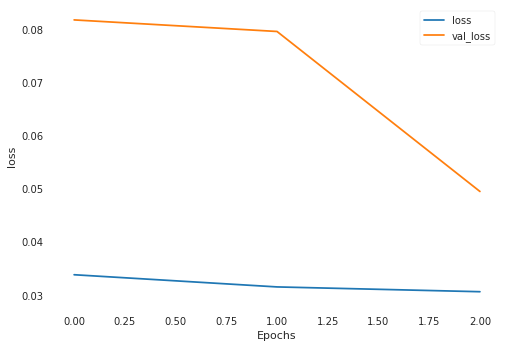

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 457us/sample - loss: 0.0295 - val_loss: 0.1914
Epoch 2/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0309 - val_loss: 0.2052
Epoch 3/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0316 - val_loss: 0.1709
loss cuts = tf.Tensor([1.0668341], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23787953, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94363993], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37322706, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8907738], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4406162, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0097932], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29677424, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0076847], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29907593, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0262625

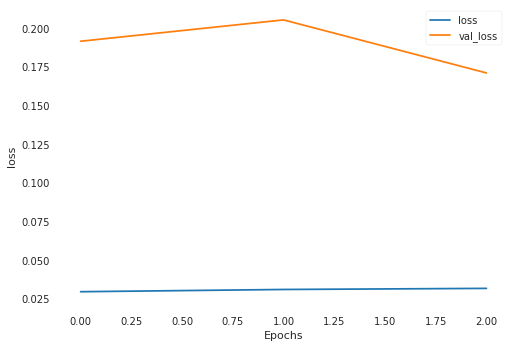

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 438us/sample - loss: 0.0486 - val_loss: 0.2256
Epoch 2/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0531 - val_loss: 0.2986
Epoch 3/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0396 - val_loss: 0.1926
loss cuts = tf.Tensor([0.45471045], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1258195, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4690185], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13617465, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.60614765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2561854, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7021265], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3625563, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.64082795], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.29249486, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6627147

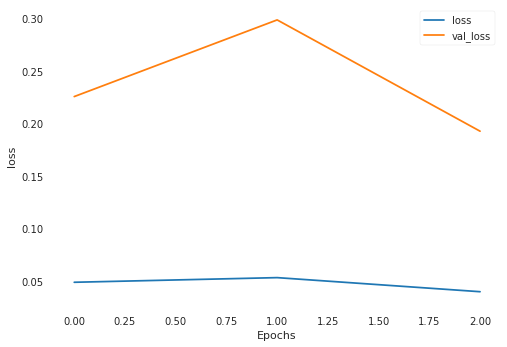

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 425us/sample - loss: 0.0314 - val_loss: 0.1710
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0446 - val_loss: 0.1979
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0388 - val_loss: 0.1878
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1781988], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22867411, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90321755], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04129738, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90411866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.041664433, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9031297], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04126168, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8966896], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0386868, shape=(), dtype=float32)
lo

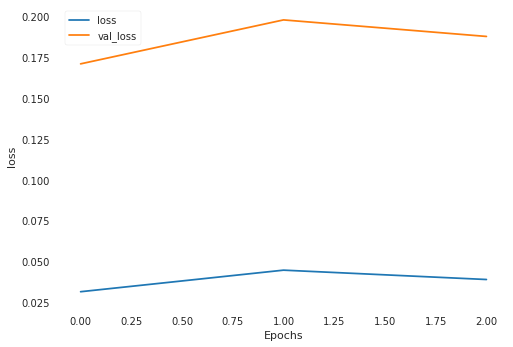

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0415 - val_loss: 0.1466
Epoch 2/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0921 - val_loss: 0.1581
Epoch 3/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0786 - val_loss: 0.0704
loss cuts = tf.Tensor([0.3465315], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28443584, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35709304], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2732819, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35785276], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27248818, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36282992], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26731676, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.44044685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19308107, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5995

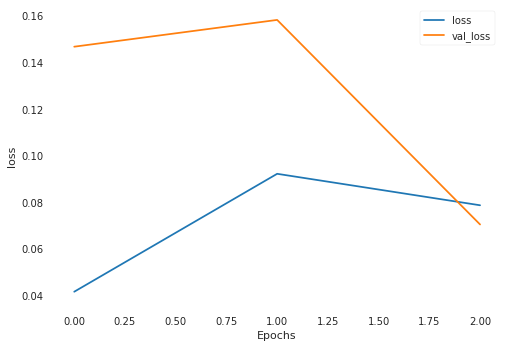

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0383 - val_loss: 0.0758
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0274 - val_loss: 0.0928
Epoch 3/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0262 - val_loss: 0.0749
loss cuts = tf.Tensor([0.58186644], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.28291038, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6808562], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39801332, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6524162], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.36293754, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7102821], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43600777, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.699975], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.42250228, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6958994

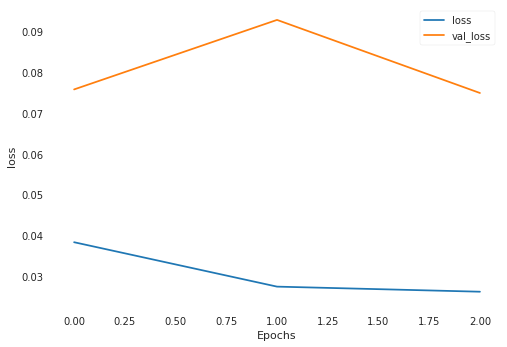

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0278 - val_loss: 0.0982
Epoch 2/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0302 - val_loss: 0.0872
Epoch 3/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0375 - val_loss: 0.1059
loss cuts = tf.Tensor([0.37717545], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005303413, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36382675], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0074258265, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.34411883], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011210819, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.34105507], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011868997, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.28766063], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026354067, shape=(), dtype=float32)
loss cuts = tf.Tensor

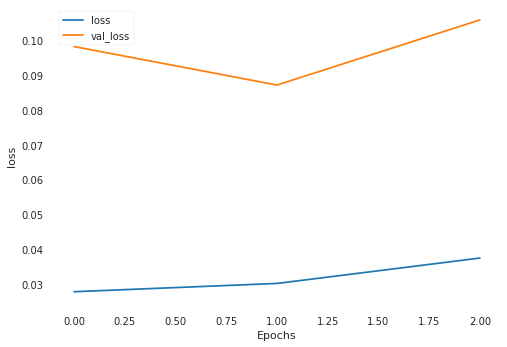

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 424us/sample - loss: 0.0316 - val_loss: 0.0709
Epoch 2/3
882/882 [==============================] - 0s 425us/sample - loss: 0.0315 - val_loss: 0.0609
Epoch 3/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0322 - val_loss: 0.0660
loss cuts = tf.Tensor([0.3721547], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1830516, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.36760822], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18696266, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3573621], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19592834, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3993383], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1605298, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.40944064], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15253663, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2943202

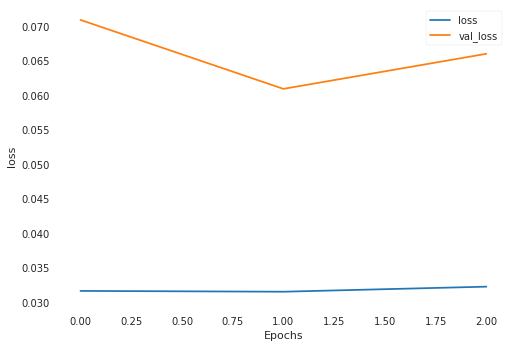

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 428us/sample - loss: 0.0299 - val_loss: 0.0990
Epoch 2/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0337 - val_loss: 0.0531
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0325 - val_loss: 0.0653
loss cuts = tf.Tensor([0.19902685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.005608698, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.22214524], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0026804279, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.24843922], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0006491728, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.23961696], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0011765676, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.25855994], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00023587277, shape=(), dtype=float32)
loss cuts = tf.Te

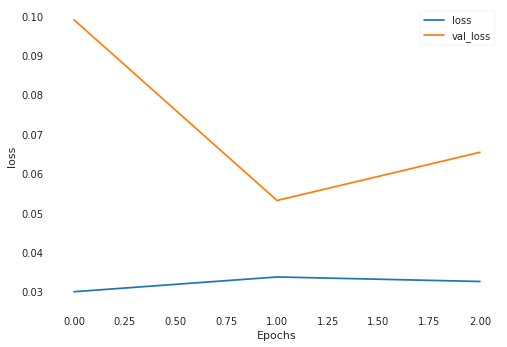

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 434us/sample - loss: 0.0307 - val_loss: 0.0590
Epoch 2/3
882/882 [==============================] - 0s 466us/sample - loss: 0.0307 - val_loss: 0.0467
Epoch 3/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0295 - val_loss: 0.0560
loss cuts = tf.Tensor([0.3234076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3708002e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.30763525], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00037926686, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3091933], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00032100847, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.35135216], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.000587681, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3499734], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00052273454, shape=(), dtype=float32)
loss cuts = tf.Te

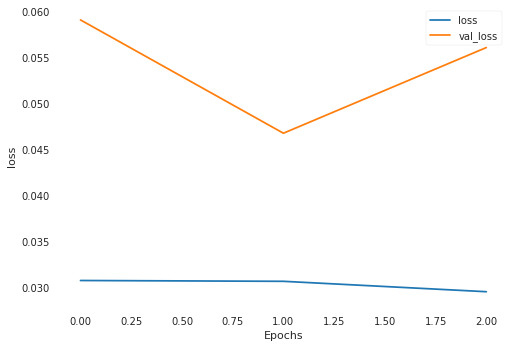

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 446us/sample - loss: 0.0284 - val_loss: 0.0588
Epoch 2/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0299 - val_loss: 0.0953
Epoch 3/3
882/882 [==============================] - 0s 426us/sample - loss: 0.0472 - val_loss: 1.8640
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.59673], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.95946, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6272083], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.615788, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.57179457], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(32.242016, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1538484], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(25.970758, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0886273], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(26.639769, shape=(), dtype=float32)
loss cuts =

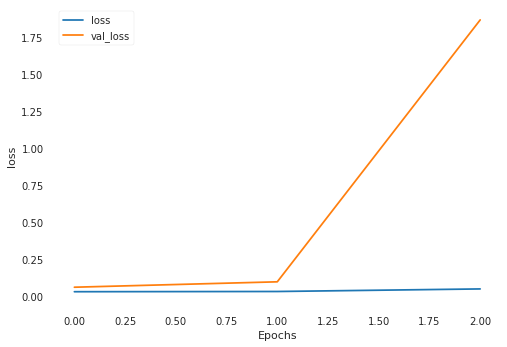

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 432us/sample - loss: 0.6079 - val_loss: 0.4888
Epoch 2/3
882/882 [==============================] - 0s 451us/sample - loss: 0.1573 - val_loss: 0.5158
Epoch 3/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0623 - val_loss: 0.3701
loss cuts = tf.Tensor([0.89440256], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.042270314, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8310592], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.072329156, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7448499], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1261316, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.75459814], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11930246, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.62421626], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22637019, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.618

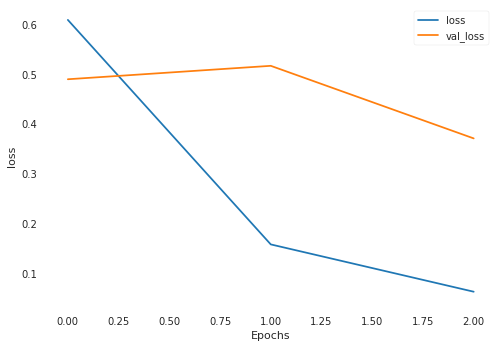

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0471 - val_loss: 0.2075
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0373 - val_loss: 0.1436
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0510 - val_loss: 0.1963
loss cuts = tf.Tensor([0.23320413], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3771207, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2608287], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2927012, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3360415], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0705888, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3447746], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.045532, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3604034], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.001071, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3541317], sha

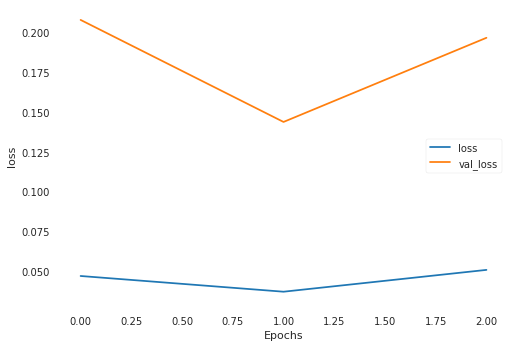

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 438us/sample - loss: 0.0424 - val_loss: 0.0916
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0347 - val_loss: 0.1396
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0312 - val_loss: 0.1052
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.88934606], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.002894458, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0742397], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017185505, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2073776], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06981819, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2025752], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0673034, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2005198], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06624115, shape=(), dtype=float32)
lo

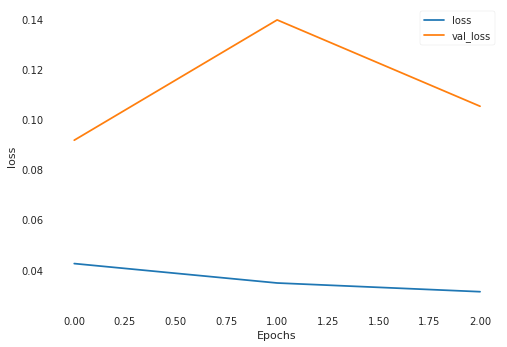

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0318 - val_loss: 0.1036
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0317 - val_loss: 0.1036
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0336 - val_loss: 0.0769
loss cuts = tf.Tensor([0.9697479], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004864773, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97052664], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0049740095, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0079446], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.011652038, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0298438], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01685942, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9186143], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00034649408, shape=(), dtype=float32)
loss cuts = tf.Tensor([1

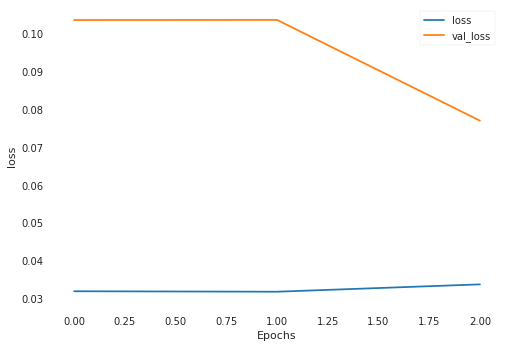

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0333 - val_loss: 0.2508
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0361 - val_loss: 0.2434
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0313 - val_loss: 0.1460
loss cuts = tf.Tensor([0.6667724], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07116752, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6594232], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06730038, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65227157], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.063640945, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6633297], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06934254, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6884628], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08321078, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.47891

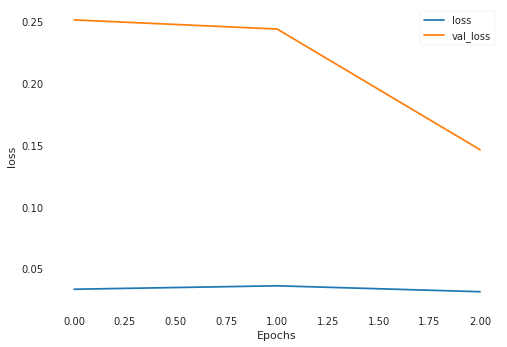

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0298 - val_loss: 0.0706
Epoch 2/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0306 - val_loss: 0.0833
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0307 - val_loss: 0.0637
loss cuts = tf.Tensor([0.92277384], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.623774, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94155675], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.47096, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.94451916], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.446926, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.97817725], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.17506, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9002147], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.808239, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.88509226],

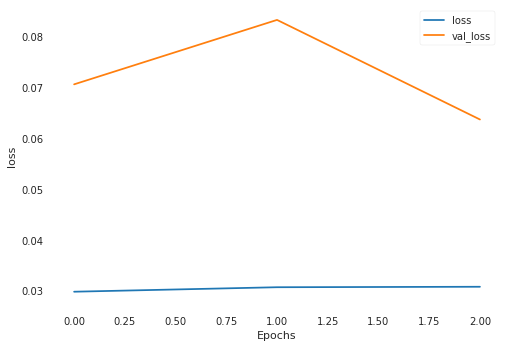

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0269 - val_loss: 0.2167
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0296 - val_loss: 0.2080
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0352 - val_loss: 0.2109
loss cuts = tf.Tensor([1.1763335], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2043962, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3594725], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8359645, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3742465], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8091667, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3500373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8533069, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4088286], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.74814683, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5042429], s

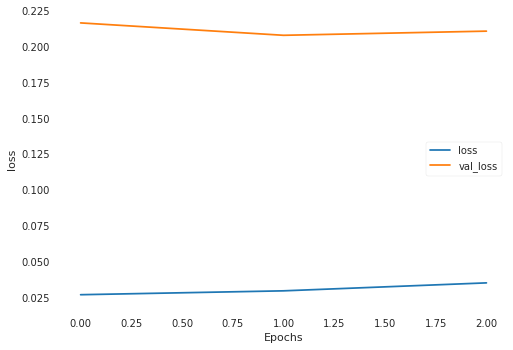

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 433us/sample - loss: 0.0325 - val_loss: 0.0724
Epoch 2/3
882/882 [==============================] - 0s 411us/sample - loss: 0.0312 - val_loss: 0.1201
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0284 - val_loss: 0.1022
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.54612374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.150714, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66269845], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.91420114, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65131074], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9361073, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5333564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1782683, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7289771], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.79185086, shape=(), dtype=float32)
loss 

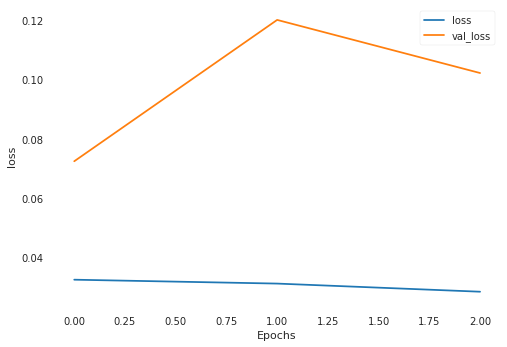

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0290 - val_loss: 0.1485
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0293 - val_loss: 0.0472
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0276 - val_loss: 0.1723
loss cuts = tf.Tensor([0.7707666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.3232107, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7663194], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.341725, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.76550686], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.345112, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66244125], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.785413, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7380613], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.460284, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.73762023], sha

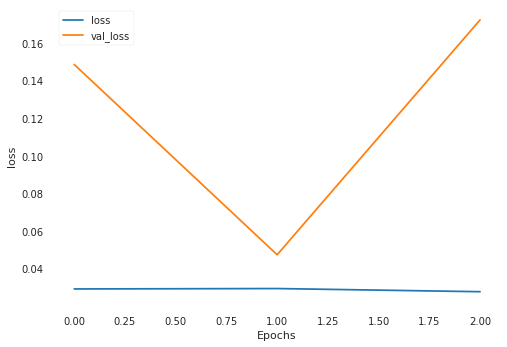

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 427us/sample - loss: 0.0361 - val_loss: 0.0554
Epoch 2/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0397 - val_loss: 0.1416
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0350 - val_loss: 0.0662
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.57694775], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0019976448, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6906858], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0047669415, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.96811527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.120043196, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0078163], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14913, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93418574], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09768311, shape=(), dtype=float32)

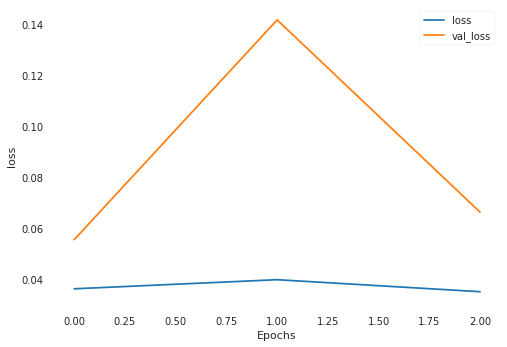

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 427us/sample - loss: 0.0284 - val_loss: 0.0833
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0320 - val_loss: 0.0710
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0302 - val_loss: 0.0608
loss cuts = tf.Tensor([1.7003655], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.823487, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6443819], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6754243, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9058882], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.420788, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5035038], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3305709, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4860857], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2906905, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5591], shape=(

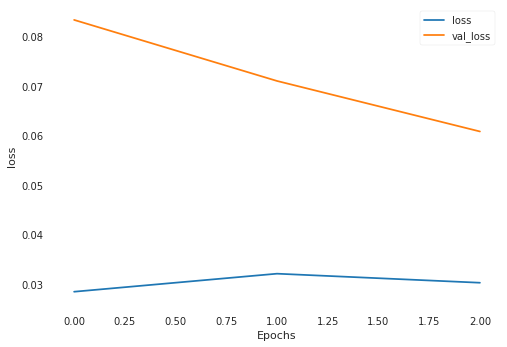

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0311 - val_loss: 0.1217
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0304 - val_loss: 0.1007
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0298 - val_loss: 0.1189
loss cuts = tf.Tensor([1.0369009], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.012791406, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98843694], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.026102616, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9939765], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024343334, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9949683], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024034822, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0623608], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0076806317, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.

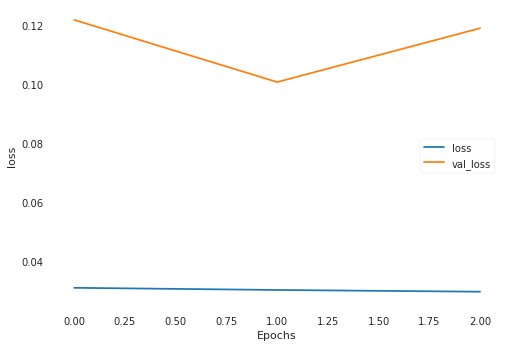

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 423us/sample - loss: 0.0336 - val_loss: 0.1123
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0338 - val_loss: 0.1249
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0337 - val_loss: 0.0998
loss cuts = tf.Tensor([1.219159], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.109455734, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.224352], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10604659, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2292254], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10289632, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2337322], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.100025274, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2192053], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.10942513, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1830721

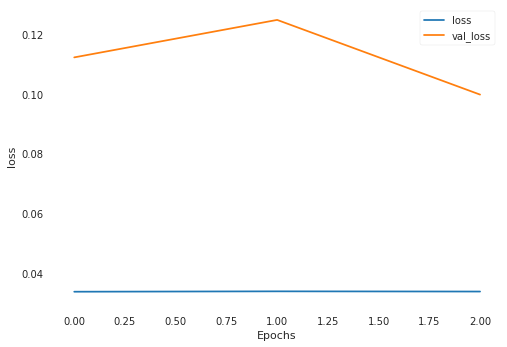

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0396 - val_loss: 0.1150
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0452 - val_loss: 0.0754
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0542 - val_loss: 0.1311
loss cuts = tf.Tensor([1.2242718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8926278, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2299501], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8770366, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2393689], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8513167, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.238304], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8542157, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2305213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8754716, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2145785], sha

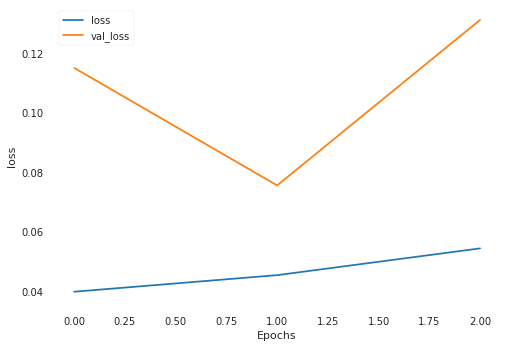

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0363 - val_loss: 0.1144
Epoch 2/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0345 - val_loss: 0.1250
Epoch 3/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0303 - val_loss: 0.1200
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3075281], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.054806206, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.229541], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024373474, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2935435], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04845395, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2904122], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.047085226, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3013989], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.051973965, shape=(), dtype=float32)
l

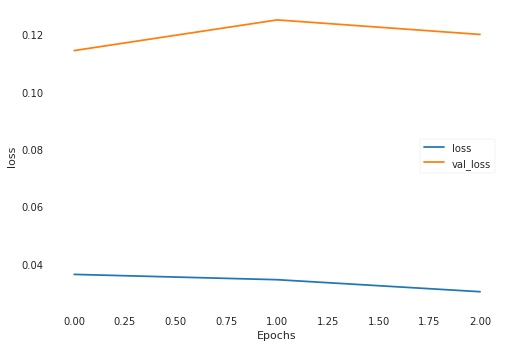

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0292 - val_loss: 0.1691
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0312 - val_loss: 0.1571
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0340 - val_loss: 0.1455
loss cuts = tf.Tensor([1.2019923], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.063500114, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1692396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.048066024, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0848556], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018186023, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1433862], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.037398245, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.171233], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04894407, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0221

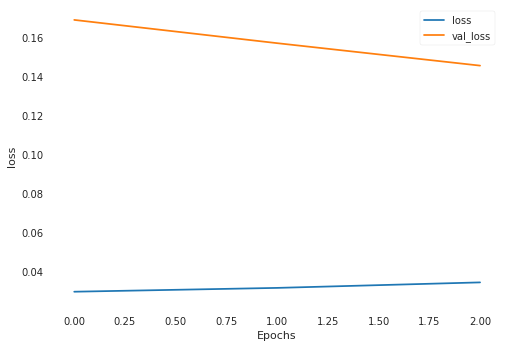

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0398 - val_loss: 0.7306
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0341 - val_loss: 0.4096
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0282 - val_loss: 0.4233
loss cuts = tf.Tensor([0.82535076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14036208, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7920338], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16643646, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1555672], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0019742807, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1928892], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.0563962e-05, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1747159], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0006392893, shape=(), dtype=float32)
loss cuts = tf.Tensor([1

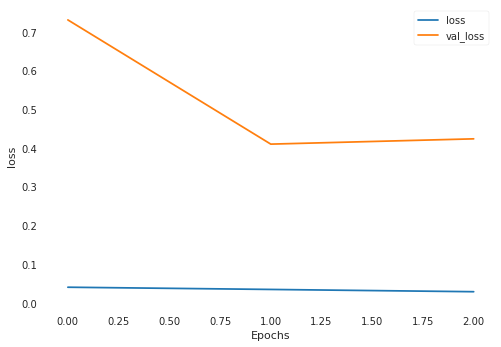

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0876 - val_loss: 0.3511
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0978 - val_loss: 0.2568
Epoch 3/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0497 - val_loss: 0.2397
loss cuts = tf.Tensor([1.7362435], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1274193, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5655365], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.034689583, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5879264], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.043531187, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5824564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.04127856, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5737417], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03781336, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.532704

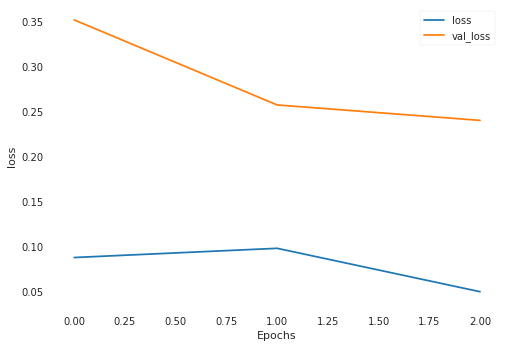

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0342 - val_loss: 0.2456
Epoch 2/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0385 - val_loss: 0.3167
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0530 - val_loss: 0.4869
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1687506], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06999835, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1863325], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06100416, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1705225], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.069063954, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0976815], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11265498, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0960532], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11375067, shape=(), dtype=float32)
los

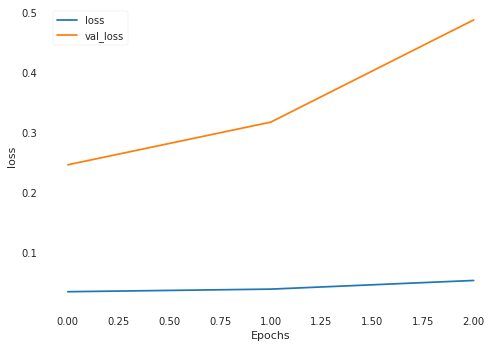

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0383 - val_loss: 0.6739
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0379 - val_loss: 0.6899
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0408 - val_loss: 0.5659
loss cuts = tf.Tensor([0.8483719], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8371341, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92608213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5387263, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9775717], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3476582, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98896897], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3060818, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9858725], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3173518, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2592747], 

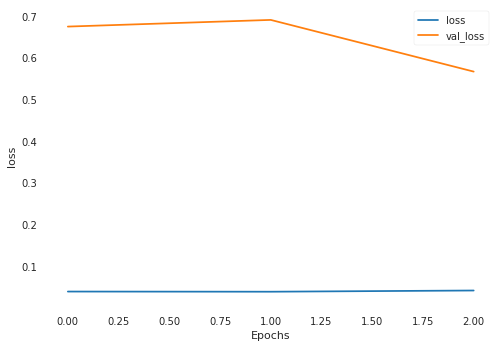

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0368 - val_loss: 1.1589
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0850 - val_loss: 0.8242
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0466 - val_loss: 0.6829
loss cuts = tf.Tensor([1.0500185], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.16001485, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0065888], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1271556, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0256984], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14114933, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0286552], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14337976, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0243146], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14011148, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0274047]

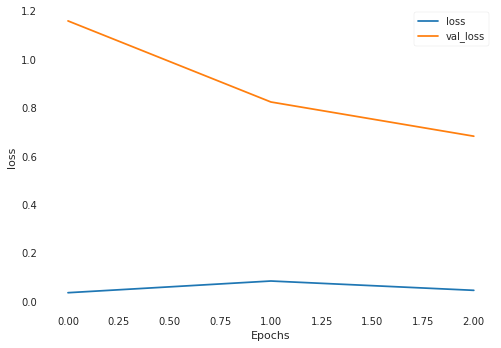

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0381 - val_loss: 0.8318
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0475 - val_loss: 0.2699
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0312 - val_loss: 0.2889
loss cuts = tf.Tensor([0.97163945], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.38643566, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9817309], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39908394, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.738538], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1509618, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7372365], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14995211, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7096039], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12931497, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7538669]

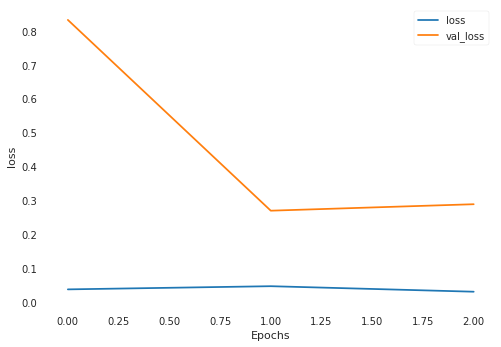

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0321 - val_loss: 0.1867
Epoch 2/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0326 - val_loss: 0.1665
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0361 - val_loss: 0.2015
loss cuts = tf.Tensor([0.5522467], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010454388, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5521438], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.010433361, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5499234], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.009984693, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5007599], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0025765686, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.48400486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.001156331, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.

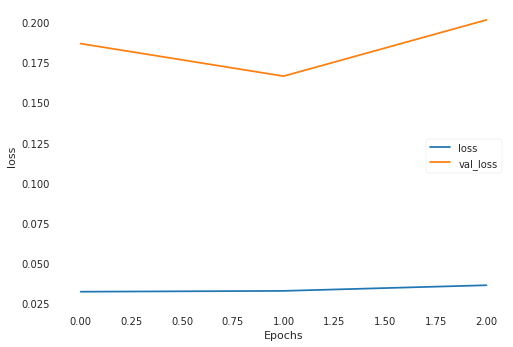

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0370 - val_loss: 0.7225
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0627 - val_loss: 0.4331
Epoch 3/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0480 - val_loss: 0.3867
loss cuts = tf.Tensor([0.69022167], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0196524, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6220987], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1618713, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.65096796], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1004683, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.61575234], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1755931, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5782213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2583876, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.595238], 

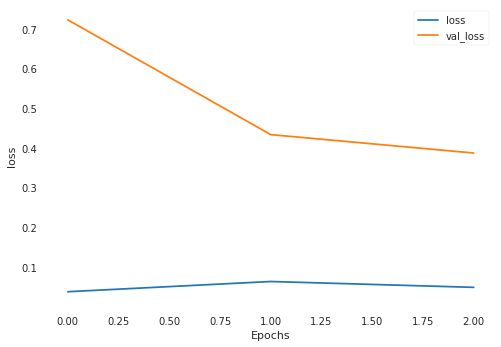

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0405 - val_loss: 0.1479
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0355 - val_loss: 0.1408
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0352 - val_loss: 0.2598
loss cuts = tf.Tensor([0.34366015], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20824607, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.34594718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20616397, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.34628347], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2058587, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3451057], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20692883, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.3458246], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2062753, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.334608

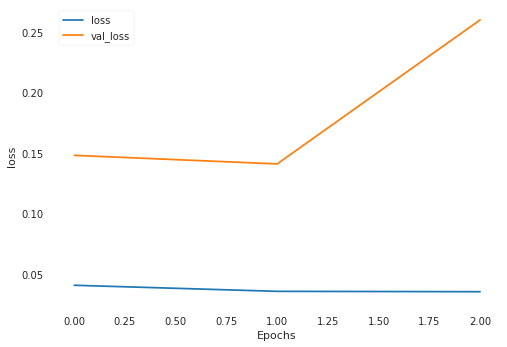

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0501 - val_loss: 0.1856
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0683 - val_loss: 0.2200
Epoch 3/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0457 - val_loss: 0.1056
loss cuts = tf.Tensor([0.5210435], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6067732, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.510472], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6233544, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5061152], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.630253, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6843021], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.37908384, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67068285], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39604002, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6696744], s

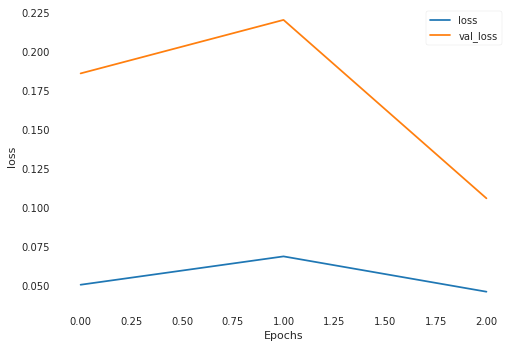

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0413 - val_loss: 0.1628
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0331 - val_loss: 0.0891
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0300 - val_loss: 0.1112
loss cuts = tf.Tensor([1.0627239], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.74185336, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0739897], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7613871, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0777161], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.76790404, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1177077], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8395928, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1247702], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8525852, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1238406], 

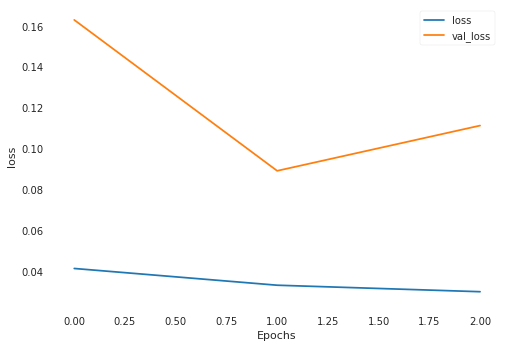

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0296 - val_loss: 0.1927
Epoch 2/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0316 - val_loss: 0.1939
Epoch 3/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0303 - val_loss: 0.1831
loss cuts = tf.Tensor([1.5557076], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.420226, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5216944], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.315554, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5324455], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3483894, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4472489], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0945294, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2860928], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6540346, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9139075], shap

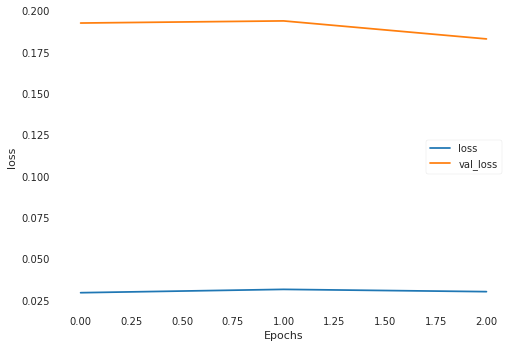

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0347 - val_loss: 0.1389
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0311 - val_loss: 0.2602
Epoch 3/3
882/882 [==============================] - 0s 369us/sample - loss: 0.0329 - val_loss: 0.1273
loss cuts = tf.Tensor([0.9393109], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47758734, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9391382], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47734863, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95427805], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.49849823, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9092448], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43693528, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90517074], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.4315659, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.905964

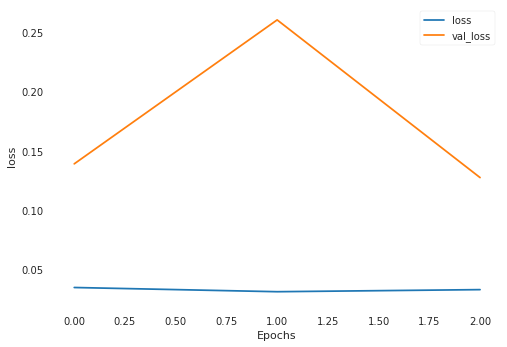

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0376 - val_loss: 0.4455
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0444 - val_loss: 0.4702
Epoch 3/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0336 - val_loss: 0.5463
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.83536536], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.160147, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8190973], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.2474732, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8167893], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.259905, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.81306154], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.280008, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8170271], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.258624, shape=(), dtype=float32)
loss cuts =

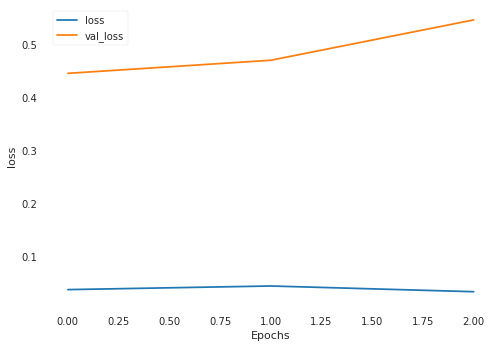

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0388 - val_loss: 0.2037
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0831 - val_loss: 0.4013
Epoch 3/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0591 - val_loss: 0.3014
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.5533253], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7533312, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.557447], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7424326, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.90940243], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9371343, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98444617], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.79747266, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.96512884], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.83234704, shape=(), dtype=float32)
loss 

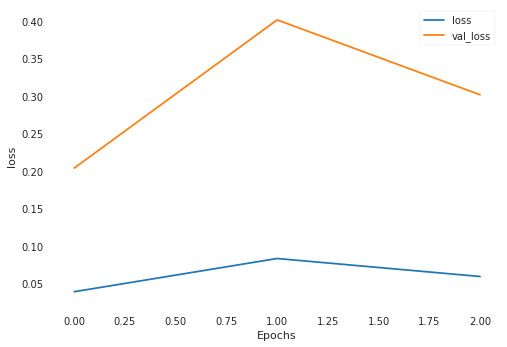

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0361 - val_loss: 0.5982
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0323 - val_loss: 0.3613
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0303 - val_loss: 0.3090
loss cuts = tf.Tensor([0.4419], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20985557, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.43689314], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21446794, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.41802615], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23229878, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67030156], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.052761365, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5437714], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12689881, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.517336

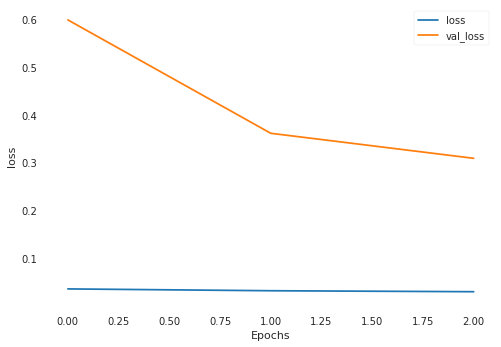

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0335 - val_loss: 0.2436
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0357 - val_loss: 0.1239
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0433 - val_loss: 0.2897
loss cuts = tf.Tensor([1.3333966], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21771874, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3151889], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23504177, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4181823], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14578475, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.639774], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7052206, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6701915], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7572334, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6552672], 

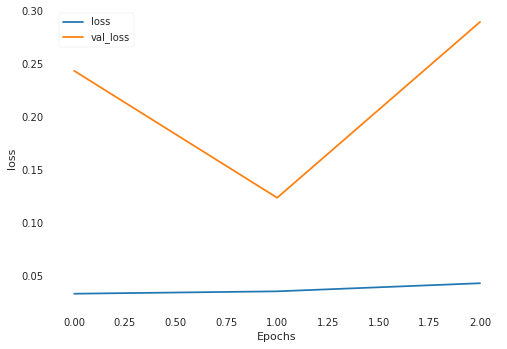

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0517 - val_loss: 0.2966
Epoch 2/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0758 - val_loss: 0.2821
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0417 - val_loss: 0.1916
loss cuts = tf.Tensor([1.5873641], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5150409, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6761048], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6502877, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6370113], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5887657, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3555062], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.207618, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.354854], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2056808, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.341783], shape

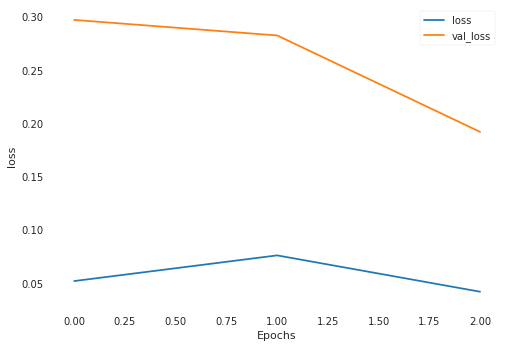

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0344 - val_loss: 0.1597
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0309 - val_loss: 0.1740
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0279 - val_loss: 0.2015
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.3193395], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7588602, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3296144], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7768672, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3397424], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.79482347, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3528819], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8184246, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2698497], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.67508566, shape=(), dtype=float32)
loss cu

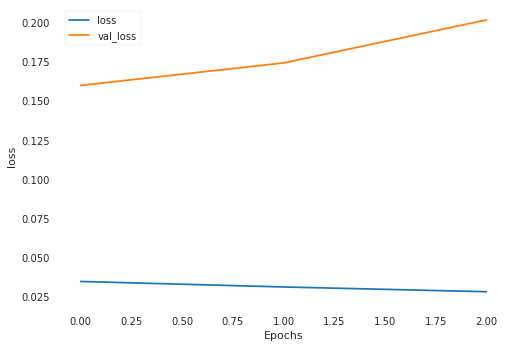

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0308 - val_loss: 0.1887
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0346 - val_loss: 0.2172
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0361 - val_loss: 0.1141
loss cuts = tf.Tensor([1.2642131], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34314632, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2652757], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.34190252, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2669756], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33991742, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2752986], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33028173, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.983636], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01785858, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8940818]

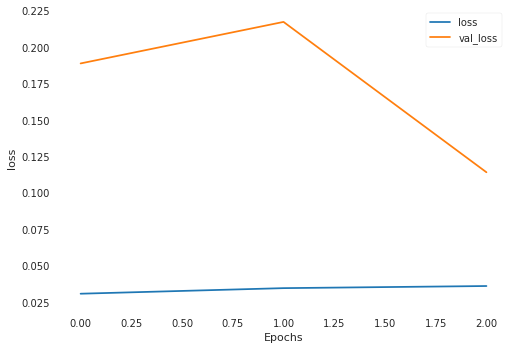

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0347 - val_loss: 0.5793
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0360 - val_loss: 0.5353
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0331 - val_loss: 0.5978
loss cuts = tf.Tensor([1.7715685], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21588537, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7612553], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20640792, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7069311], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15999779, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7438707], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19091381, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7073286], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1603159, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3054632]

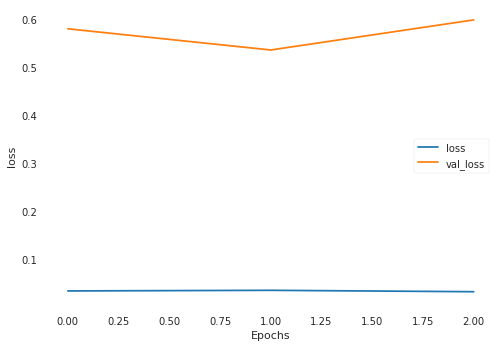

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0358 - val_loss: 0.4395
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0381 - val_loss: 0.3044
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0342 - val_loss: 0.3311
loss cuts = tf.Tensor([1.970738], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.135513, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9444042], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.042946, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9505668], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.064484, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9568071], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0863712, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9629493], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.10799, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9595422], shape=(1

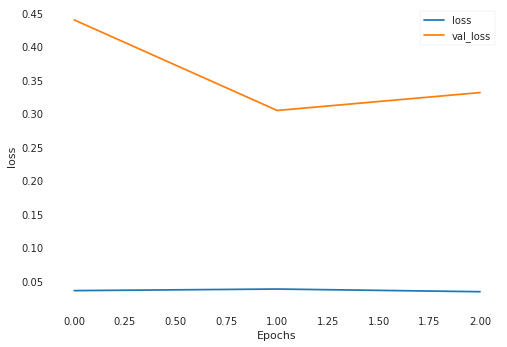

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0337 - val_loss: 0.1808
Epoch 2/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0385 - val_loss: 0.1902
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.1118 - val_loss: 0.2773
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4827007], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23299997, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4655792], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21676394, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4776151], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2281162, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4646398], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21589012, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4568405], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20870325, shape=(), dtype=float32)
loss 

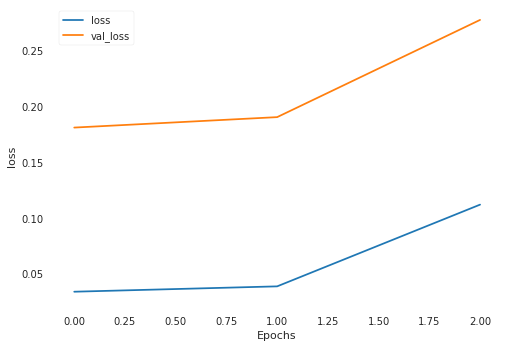

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0804 - val_loss: 0.1437
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0476 - val_loss: 0.1850
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0366 - val_loss: 0.1816
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5317816], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4593089, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4899476], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5922685, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4920921], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.5853674, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.547103], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4114885, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.532737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.456313, shape=(), dtype=float32)
loss cuts = 

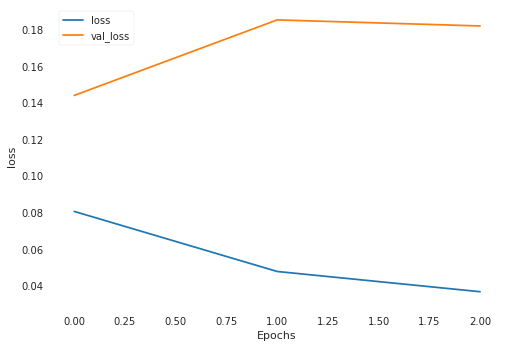

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0332 - val_loss: 0.4252
Epoch 2/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0399 - val_loss: 0.5426
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0374 - val_loss: 0.3313
loss cuts = tf.Tensor([2.1635947], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08202801, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9744332], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22616385, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1186337], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.109803624, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.230725], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.048081525, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8107791], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.40860343, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.817818

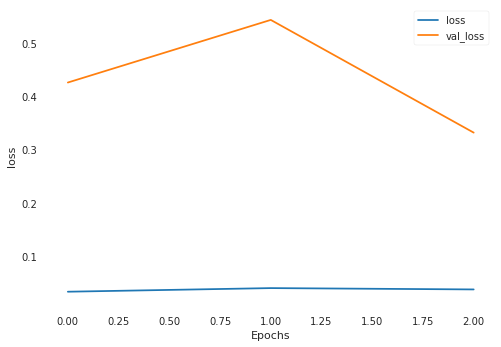

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0307 - val_loss: 0.4806
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0307 - val_loss: 0.3850
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0380 - val_loss: 0.7660
loss cuts = tf.Tensor([1.394086], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8912984, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4023976], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9070613, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5307369], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1679922, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5275561], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1611272, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5270643], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1600674, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5453091], sha

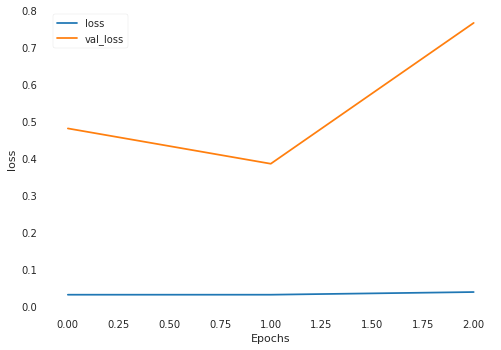

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 419us/sample - loss: 0.0381 - val_loss: 1.3392
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 2.1141 - val_loss: 1.8463
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.6789 - val_loss: 0.6560
loss cuts = tf.Tensor([1.2660633], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2850883, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1707361], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39597303, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3298018], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22108631, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6281697], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.373186, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.66077006], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2978448, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6211947], 

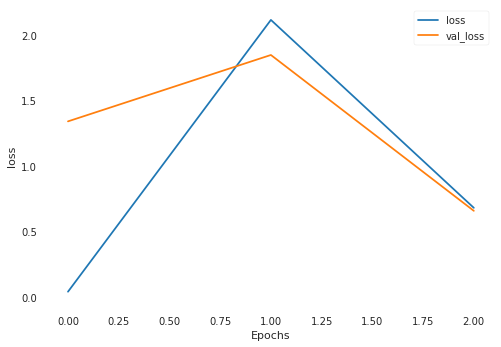

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.2540 - val_loss: 0.3931
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.1561 - val_loss: 0.2040
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.1169 - val_loss: 0.2788
loss cuts = tf.Tensor([1.3183933], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5404437, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4077947], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.212, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3755788], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3285131, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4763826], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9708571, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9046496], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6779327, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4197944], shape=

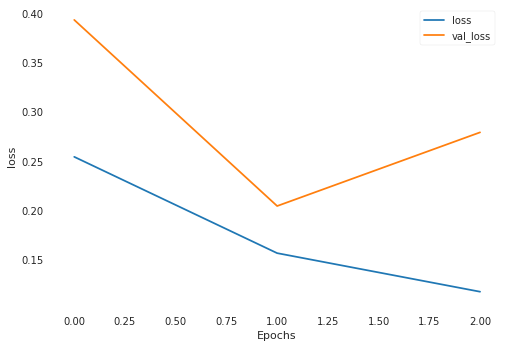

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 415us/sample - loss: 0.0943 - val_loss: 0.2580
Epoch 2/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0797 - val_loss: 0.2500
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0701 - val_loss: 0.2891
loss cuts = tf.Tensor([0.5242271], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14594784, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.52440226], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14581402, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5189427], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15001336, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.5305099], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14118686, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.67364466], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.054109097, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8031

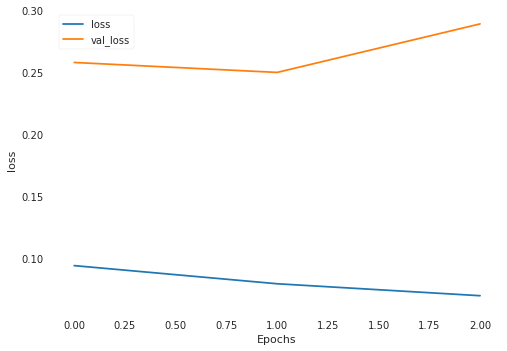

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0703 - val_loss: 0.5113
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0629 - val_loss: 0.3750
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0569 - val_loss: 0.3532
loss cuts = tf.Tensor([0.7565295], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.06580739, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9572157], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20904621, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8007748], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.090465486, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.016252], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.26651618, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9786893], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22914346, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7904351

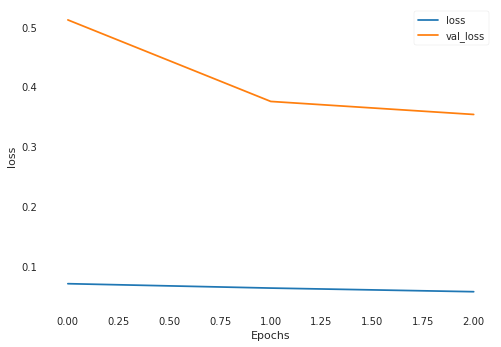

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0534 - val_loss: 0.1341
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0500 - val_loss: 0.1854
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0473 - val_loss: 0.1832
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.1866057], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(115.850655, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4092176], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(111.108086, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5647662], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(107.85308, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6180184], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(106.74985, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.588902], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(107.35234, shape=(), dtype=float32)
loss cut

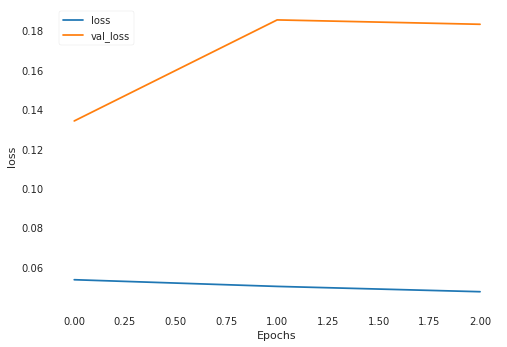

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0463 - val_loss: 0.7687
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0442 - val_loss: 0.8024
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0410 - val_loss: 0.8488
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.7679517], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(34.39462, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8525243], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(33.40979, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9809088], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.942118, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9804208], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.947632, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.98228955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.926516, shape=(), dtype=float32)
loss cuts 

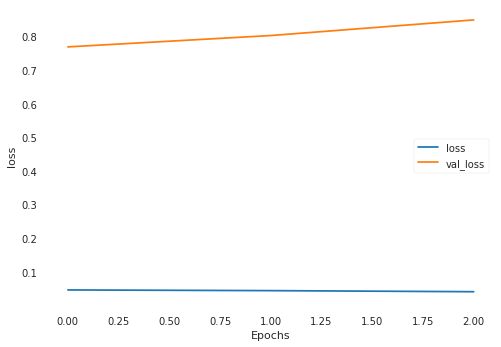

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0472 - val_loss: 0.6511
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0489 - val_loss: 0.6932
Epoch 3/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0459 - val_loss: 0.6199
loss cuts = tf.Tensor([0.8149186], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.638598, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8805906], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.194825, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8919578], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.118889, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.68838423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.517962, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6056193], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(13.110469, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8949829], s

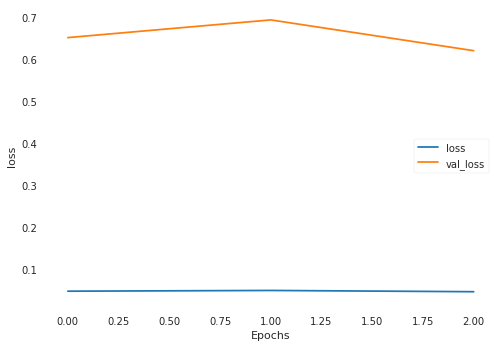

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0415 - val_loss: 0.3446
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0422 - val_loss: 0.3519
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0377 - val_loss: 0.3467
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8850866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.235309, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92915946], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2800097, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.92233485], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.27283365, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.82760423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18284537, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8751511], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22576857, shape=(), dtype=float32)
loss

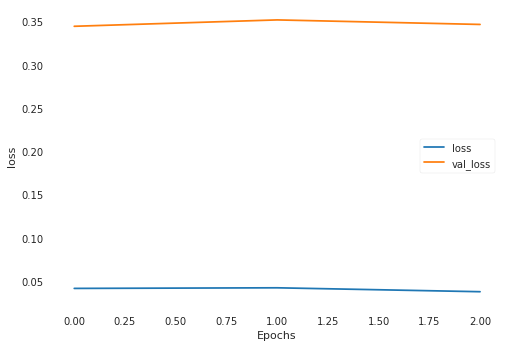

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0398 - val_loss: 0.2060
Epoch 2/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0384 - val_loss: 0.3054
Epoch 3/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0390 - val_loss: 0.1510
loss cuts = tf.Tensor([1.0359004], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.081739016, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0179114], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07177654, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0308442], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07887347, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.305296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.30835357, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3282264], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.33434582, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3244972

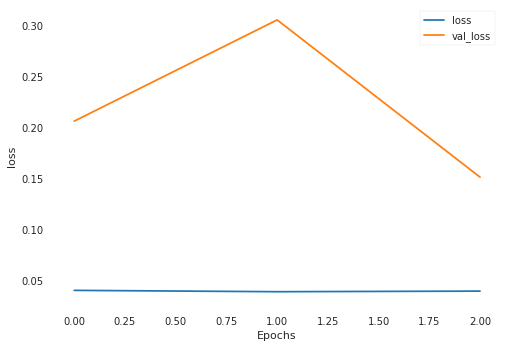

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 412us/sample - loss: 0.0409 - val_loss: 0.2825
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0340 - val_loss: 0.1921
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0340 - val_loss: 0.2050
loss cuts = tf.Tensor([1.5024285], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01749478, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.535293], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.02726867, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7016958], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.109915525, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7274663], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.12766732, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7585665], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15085907, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4652241

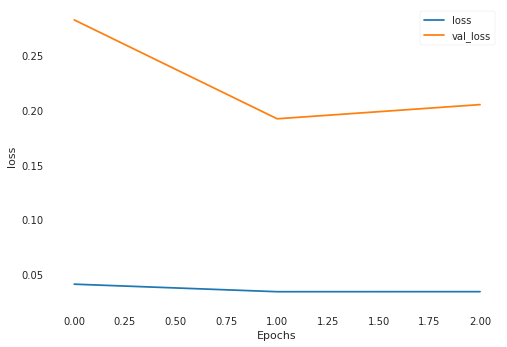

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0360 - val_loss: 0.3856
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.0377 - val_loss: 0.4294
Epoch 3/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0350 - val_loss: 0.5090
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.13214865], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.963761, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.14761628], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.871382, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.15489666], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.828066, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.15613271], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.820724, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.1510856], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.850728, shape=(), dtype=float32)
loss cuts 

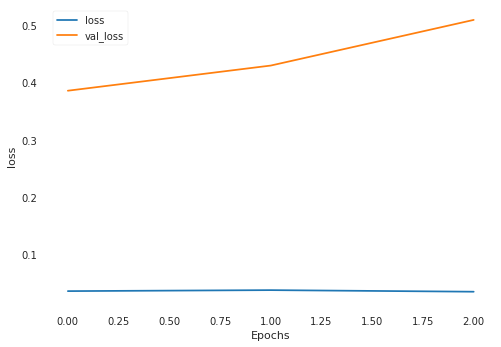

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0351 - val_loss: 0.3855
Epoch 2/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0316 - val_loss: 0.2699
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0327 - val_loss: 0.3286
loss cuts = tf.Tensor([0.1384398], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.995462, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.1332061], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.028584, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13215649], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.035232, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13113143], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.041728, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.13021784], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.047519, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.1884695], 

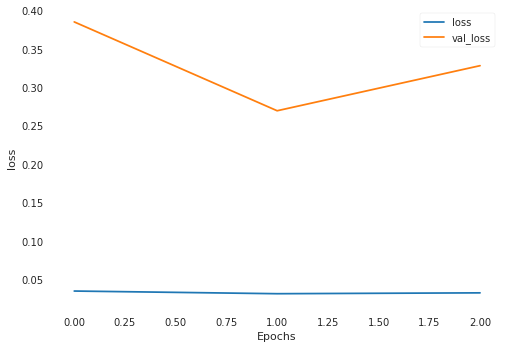

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0319 - val_loss: 0.4821
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0312 - val_loss: 0.7726
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0319 - val_loss: 0.4737
loss cuts = tf.Tensor([1.55807], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.82459104, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4668367], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6672222, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4993792], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.721445, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4843297], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6961061, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.127446], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.22795476, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1095569], shap

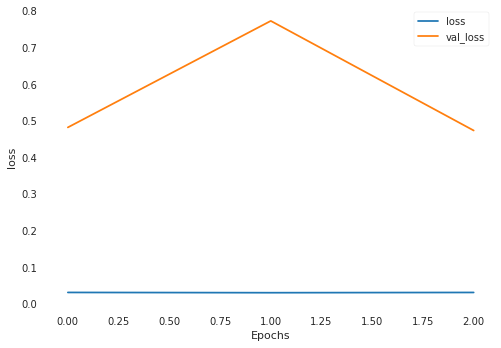

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0342 - val_loss: 0.1743
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0333 - val_loss: 0.3155
Epoch 3/3
882/882 [==============================] - 0s 377us/sample - loss: 0.0338 - val_loss: 0.1941
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.69401443], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.99017, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.69373494], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.993332, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9421208], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(29.245153, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.95083416], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(29.15099, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4674535], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.83926, shape=(), dtype=float32)
loss cuts

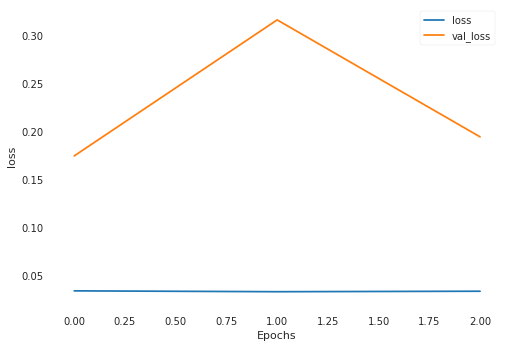

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0310 - val_loss: 0.4023
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0310 - val_loss: 0.3922
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0342 - val_loss: 0.4143
loss cuts = tf.Tensor([0.8987552], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3055923, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8828945], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.35401, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.872699], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3853996, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87013507], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.393326, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.85507816], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4401398, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9206677], shap

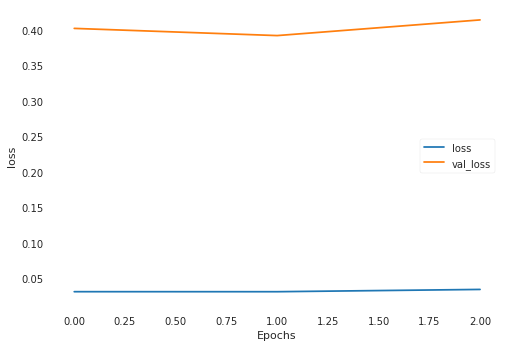

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0383 - val_loss: 0.5131
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0409 - val_loss: 0.3092
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0342 - val_loss: 0.5405
loss cuts = tf.Tensor([1.2678658], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.84247756, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4157737], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1358737, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9793652], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.654831, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6542047], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7009499, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.819927], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1606853, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8589348], sha

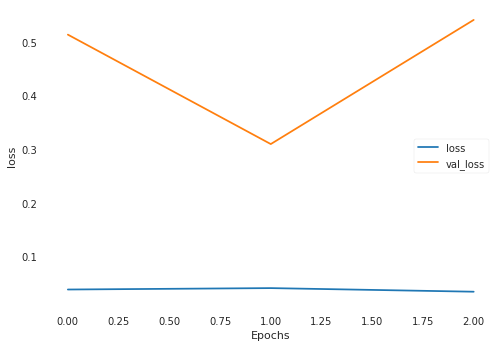

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 417us/sample - loss: 0.0311 - val_loss: 0.2716
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0534 - val_loss: 0.2335
Epoch 3/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0358 - val_loss: 0.2043
loss cuts = tf.Tensor([1.1306939], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.006511515, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1565343], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01134957, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1437899], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.008796552, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1040702], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0029235901, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4494648], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15957217, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.513

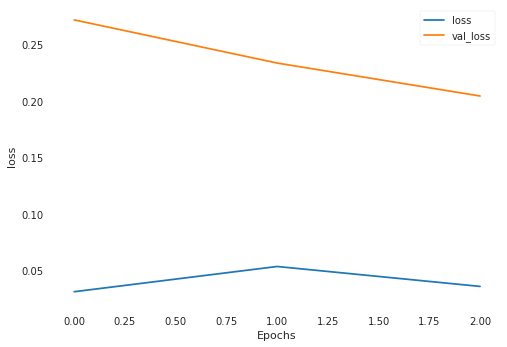

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 410us/sample - loss: 0.0298 - val_loss: 0.1162
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0297 - val_loss: 0.1403
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0431 - val_loss: 0.2128
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.178565], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.165121, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.086265], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4452672, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6651589], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9395947, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6803958], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.879341, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7379898], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6557834, shape=(), dtype=float32)
loss cuts = t

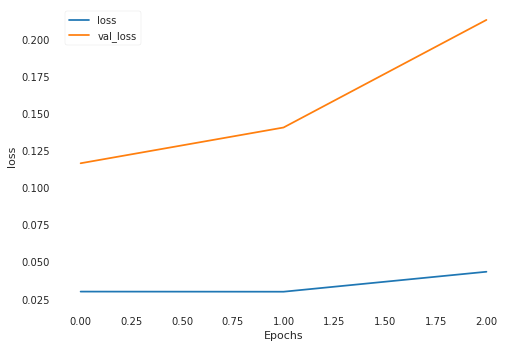

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0443 - val_loss: 0.1097
Epoch 2/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0370 - val_loss: 0.1038
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0287 - val_loss: 0.0876
loss cuts = tf.Tensor([0.78587085], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13259003, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.805308], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.11881257, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4418887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08519902, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3212943], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.029341748, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0630267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0075643566, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0988

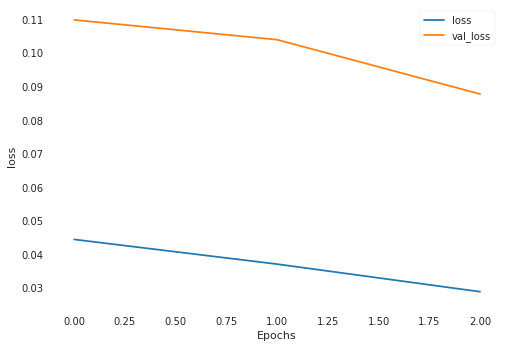

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 427us/sample - loss: 0.0290 - val_loss: 0.2711
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0296 - val_loss: 0.1227
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0309 - val_loss: 0.1587
loss cuts = tf.Tensor([2.6152527], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8365875, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2902937], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.061412, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5051217], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5502156, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4444423], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4027965, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6595519], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.958619, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5577638], shap

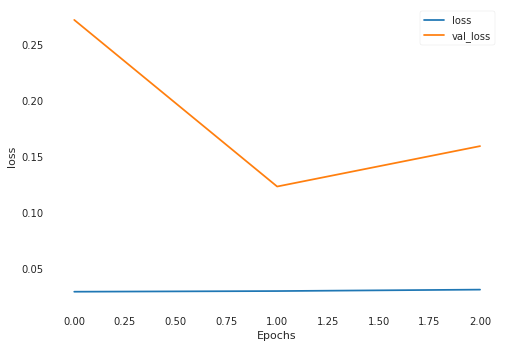

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0350 - val_loss: 0.3932
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0369 - val_loss: 0.3581
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0323 - val_loss: 0.4200
loss cuts = tf.Tensor([1.0111371], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0353906, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0094594], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0412395, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9982866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.080333, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0179219], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.011795, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0049893], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0568504, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5780491], shap

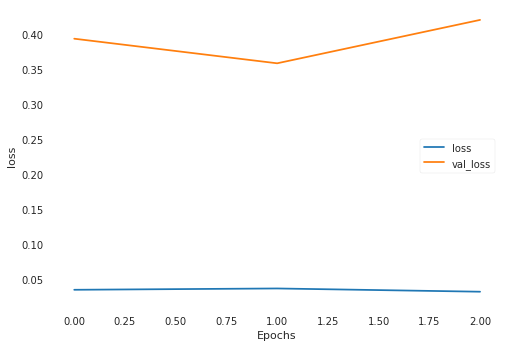

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0303 - val_loss: 0.1995
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.1435 - val_loss: 0.6309
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.1059 - val_loss: 0.2867
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.350587], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.039765522, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4140575], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018480353, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5085555], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00171764, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.494107], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0031240212, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.422819], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01617499, shape=(), dtype=float32)
los

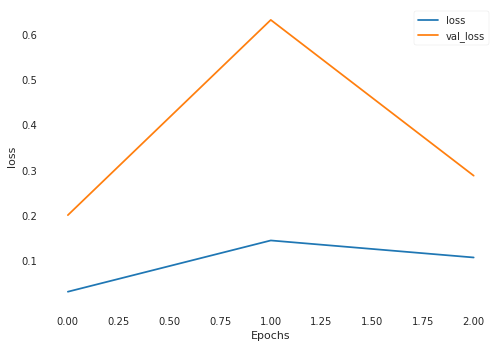

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0481 - val_loss: 0.3937
Epoch 2/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0407 - val_loss: 0.0794
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0325 - val_loss: 0.0904
loss cuts = tf.Tensor([2.6548145], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.016829, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1276424], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.708515, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1049259], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6215384, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5838952], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9099331, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8294679], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.6490035, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.831306], shape

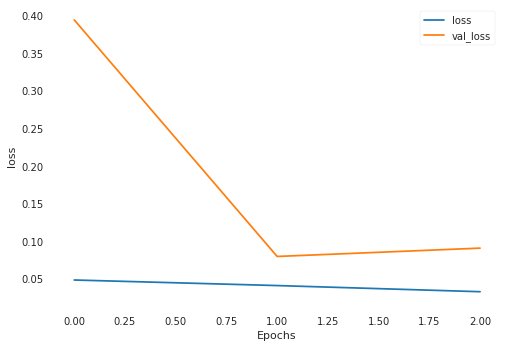

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0302 - val_loss: 0.6816
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0297 - val_loss: 0.7036
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0323 - val_loss: 0.6236
loss cuts = tf.Tensor([1.479908], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.490886, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4790845], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.493964, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4797474], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.491486, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3861167], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8501604, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2634537], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.346581, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2450392], shape=(

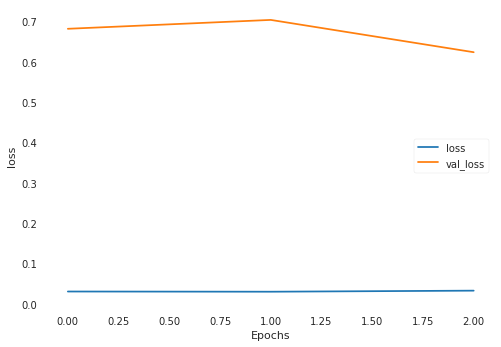

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0315 - val_loss: 0.9669
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0430 - val_loss: 0.9693
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0399 - val_loss: 1.1004
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.8725693], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17856485, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.879887], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18480283, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8881134], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19194335, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8702501], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17661016, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.87064415], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.17694151, shape=(), dtype=float32)
loss

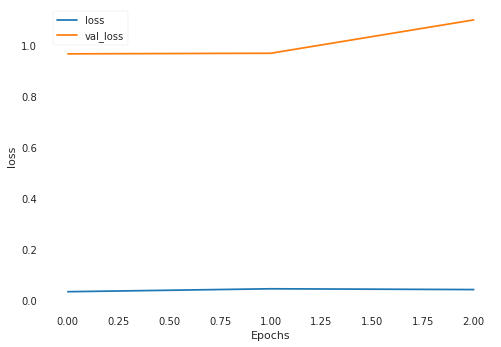

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.0649 - val_loss: 0.4254
Epoch 2/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0502 - val_loss: 0.5468
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0397 - val_loss: 0.4523
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.96447396], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.1894116, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9462805], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.280268, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.8252776], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.9013877, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.93287146], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.347656, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9173537], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.426089, shape=(), dtype=float32)
loss cuts 

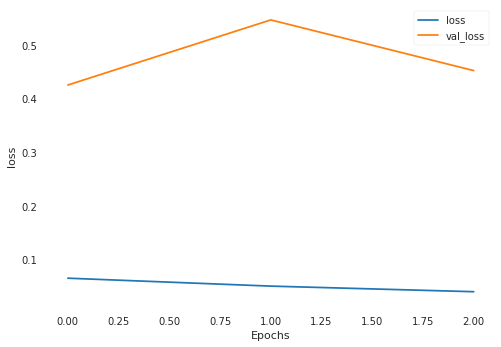

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 424us/sample - loss: 0.0383 - val_loss: 0.1535
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0340 - val_loss: 0.1389
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0323 - val_loss: 0.1714
loss cuts = tf.Tensor([1.052161], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.23222299, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9993819], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18414065, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0373316], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.21815047, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0014], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.18587671, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6925336], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.014949425, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.6403697], 

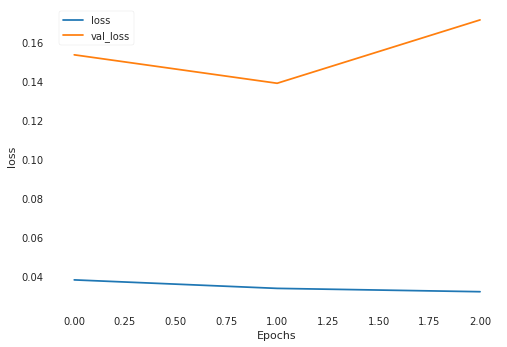

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0331 - val_loss: 0.4175
Epoch 2/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0314 - val_loss: 0.4893
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0306 - val_loss: 0.4968
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.1067078], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.2792506, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1407877], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.1238046, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1266179], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.1881537, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1962557], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.875768, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2381388], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.6925573, shape=(), dtype=float32)
loss cuts 

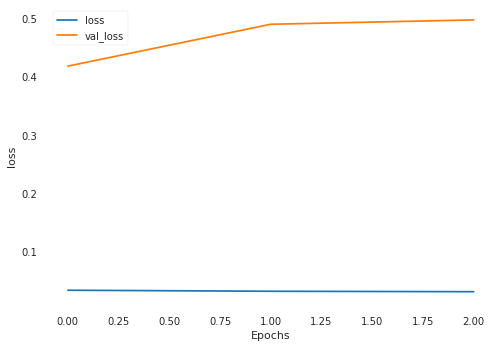

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0360 - val_loss: 1.3261
Epoch 2/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0372 - val_loss: 1.3476
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0349 - val_loss: 1.5262
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.4977932], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(19.681284, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6274382], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.54779, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6458318], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.389692, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6376035], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.460333, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6384374], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.45317, shape=(), dtype=float32)
loss cuts =

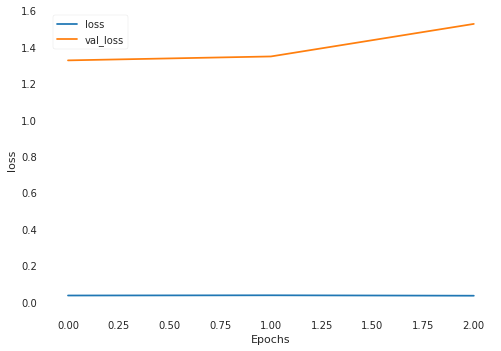

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0433 - val_loss: 0.6444
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.1282 - val_loss: 0.3802
Epoch 3/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0778 - val_loss: 0.2012
loss cuts = tf.Tensor([4.5995216], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.225704, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.5449734], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.594205, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.6247234], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.057463, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.661163], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.816448, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.6371746], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.974811, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.592037], shap

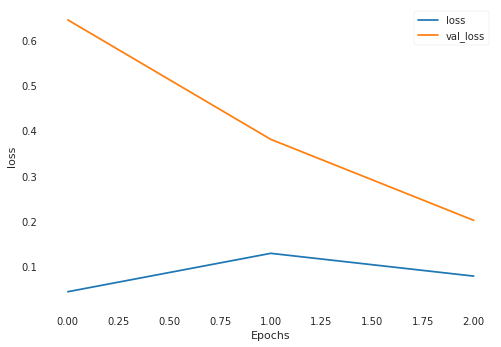

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 436us/sample - loss: 0.0498 - val_loss: 0.2467
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0421 - val_loss: 0.2621
Epoch 3/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0354 - val_loss: 0.2481
Epoch 00003: early stopping
loss cuts = tf.Tensor([3.3678486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1459874, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.361709], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1328803, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.2909617], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.98728293, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.3182979], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0423536, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.271267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.94853246, shape=(), dtype=float32)
loss cuts

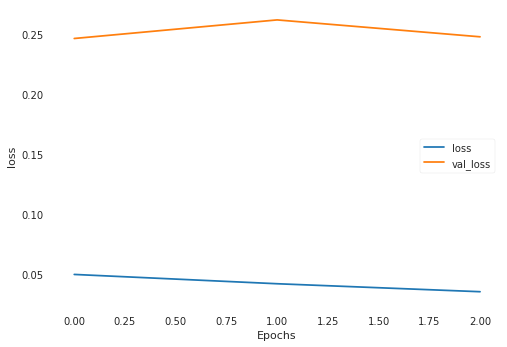

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0347 - val_loss: 0.2768
Epoch 2/3
882/882 [==============================] - 0s 413us/sample - loss: 0.0331 - val_loss: 0.5902
Epoch 3/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0333 - val_loss: 0.5190
Epoch 00003: early stopping
loss cuts = tf.Tensor([3.2471502], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.685695, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.2371926], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.627101, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.2541308], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.72689, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.235373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.616415, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.1827068], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(8.3099985, shape=(), dtype=float32)
loss cuts = tf.

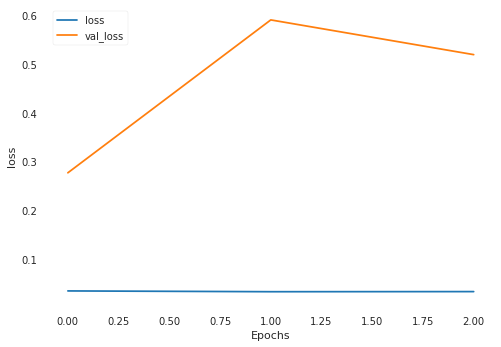

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0347 - val_loss: 0.2279
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0366 - val_loss: 0.1193
Epoch 3/3
882/882 [==============================] - 0s 420us/sample - loss: 0.0306 - val_loss: 0.1962
loss cuts = tf.Tensor([1.4841809], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(23.676195, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5623753], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.921347, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.72486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(21.391922, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7898471], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.794996, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9890287], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(19.018072, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0066402], shap

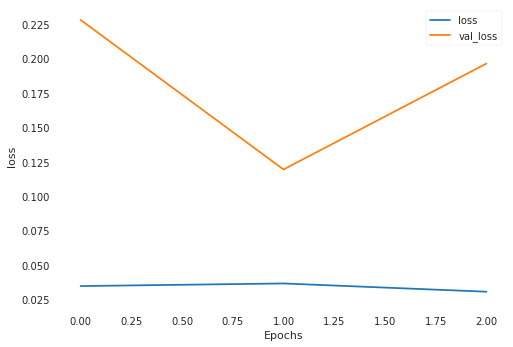

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 418us/sample - loss: 0.0327 - val_loss: 0.2955
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0329 - val_loss: 0.4767
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0357 - val_loss: 0.3525
Epoch 00003: early stopping
loss cuts = tf.Tensor([4.202932], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.783355, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.0880995], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.2942443, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.1147504], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.4054093, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.107994], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.3770933, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.9535227], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7546, shape=(), dtype=float32)
loss cuts = tf.

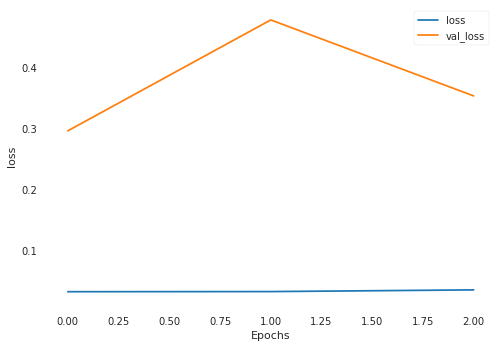

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0372 - val_loss: 2.3095
Epoch 2/3
882/882 [==============================] - 0s 401us/sample - loss: 0.0378 - val_loss: 2.3698
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0380 - val_loss: 2.2173
loss cuts = tf.Tensor([3.776801], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(26.390915, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.4220276], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.177906, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.7538147], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(17.307226, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.8032], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.898762, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.8465867], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.543932, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.8658366], shape=

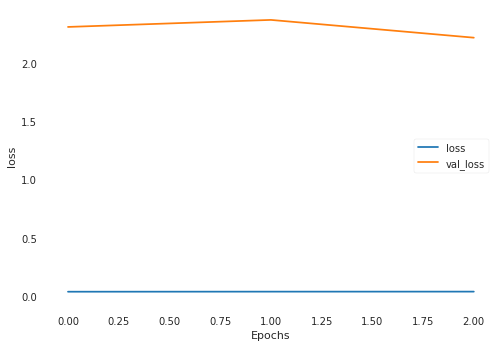

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 436us/sample - loss: 0.0391 - val_loss: 1.1707
Epoch 2/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0335 - val_loss: 0.8206
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0363 - val_loss: 1.2293
loss cuts = tf.Tensor([3.1148882], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6512295, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.1294022], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6141392, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.0902762], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.715088, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5906394], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2733877, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6142013], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.188684, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6038945], shap

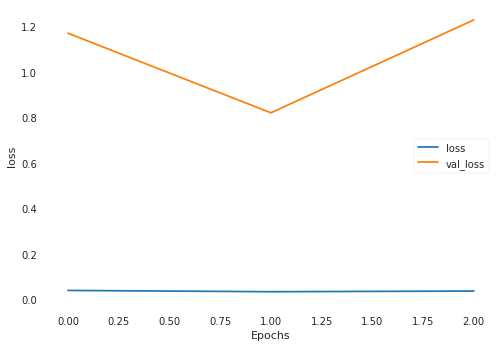

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 403us/sample - loss: 1.0262 - val_loss: 2.0054
Epoch 2/3
882/882 [==============================] - 0s 414us/sample - loss: 0.4493 - val_loss: 1.3292
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.1630 - val_loss: 1.0002
loss cuts = tf.Tensor([2.0282693], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.50233805, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9749588], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5807486, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8217468], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8377385, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8274996], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.82724077, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0019217], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5403805, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.11329], sh

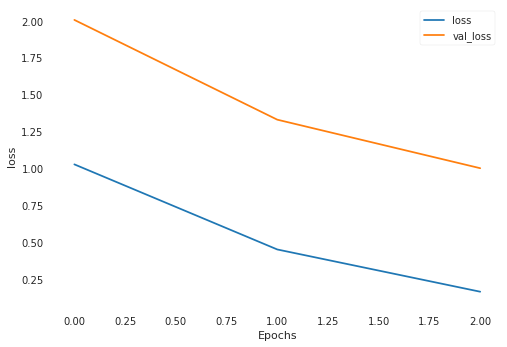

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.1262 - val_loss: 1.3993
Epoch 2/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0835 - val_loss: 2.2408
Epoch 3/3
882/882 [==============================] - 0s 378us/sample - loss: 0.0875 - val_loss: 1.8903
Epoch 00003: early stopping
loss cuts = tf.Tensor([3.4376967], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.4949827, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9180274], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.9196453, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9200296], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.928531, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9911928], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.249564, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.7998466], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.609049, shape=(), dtype=float32)
loss cuts = 

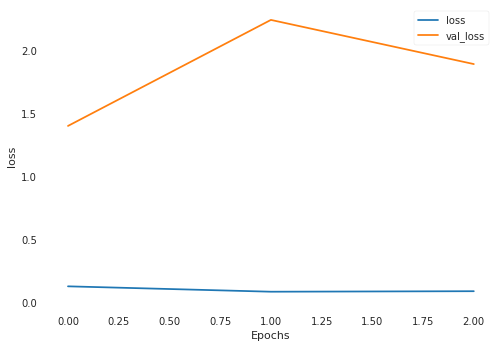

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 416us/sample - loss: 0.0870 - val_loss: 2.6355
Epoch 2/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0804 - val_loss: 2.3807
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.0619 - val_loss: 1.9182
loss cuts = tf.Tensor([4.3399267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(267.65198, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.3756056], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(266.48584, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.4770093], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(263.18546, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.2246466], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(271.43726, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.8336143], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(251.74222, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.837702], sha

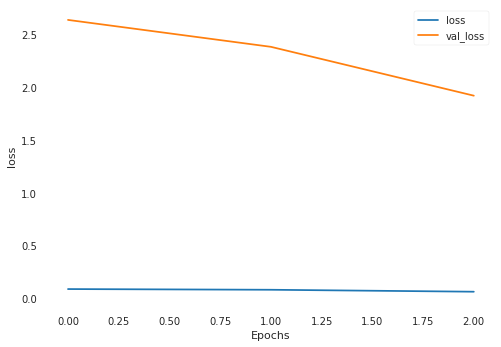

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 422us/sample - loss: 0.0478 - val_loss: 1.3209
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0953 - val_loss: 1.0039
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0620 - val_loss: 1.0863
loss cuts = tf.Tensor([2.1083732], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.533276, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1835213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.299708, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9525825], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0534682, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.429991], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6129229, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5669692], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.283759, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9691131], shape=

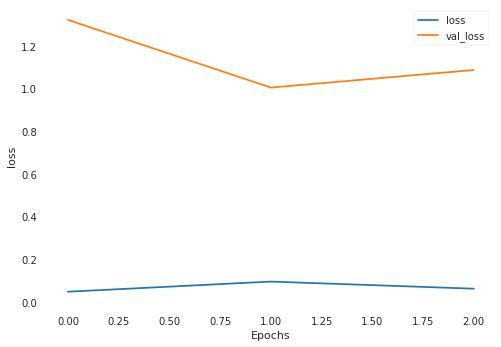

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 437us/sample - loss: 0.0713 - val_loss: 1.8659
Epoch 2/3
882/882 [==============================] - 0s 429us/sample - loss: 0.1251 - val_loss: 0.8617
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.1100 - val_loss: 0.9248
loss cuts = tf.Tensor([1.8019373], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(141.56389, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6752671], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(144.5942, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7786939], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(142.11752, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.84518], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(140.53676, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8578942], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(140.23547, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7242386], shape

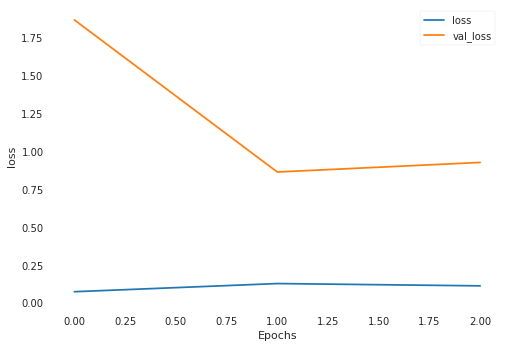

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0837 - val_loss: 1.5732
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0547 - val_loss: 1.4764
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0490 - val_loss: 0.8675
loss cuts = tf.Tensor([3.2908292], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1161645, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.5241888], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.32969266, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.5617564], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3742458, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.785254], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6976492, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.8006172], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.72354954, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.707336], sh

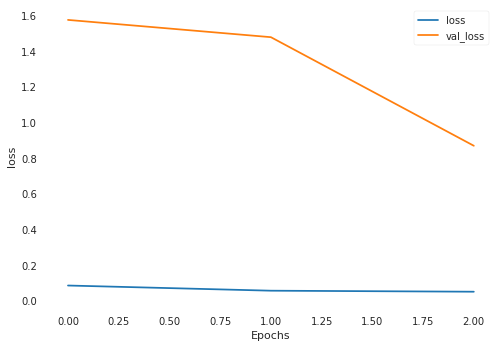

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0618 - val_loss: 4.0789
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0633 - val_loss: 4.8152
Epoch 3/3
882/882 [==============================] - 0s 387us/sample - loss: 0.0411 - val_loss: 6.1179
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.77883], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(105.834076, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0673404], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(120.97932, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8588426], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(104.194214, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8939915], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(103.47789, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7664537], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(106.08888, shape=(), dtype=float32)
loss cuts

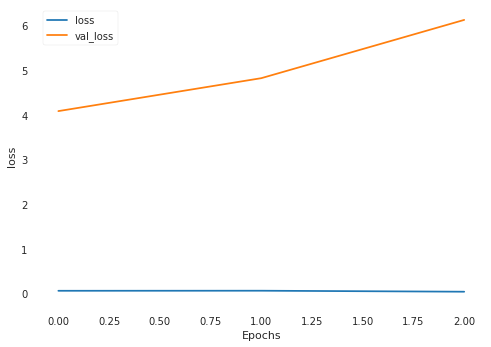

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0625 - val_loss: 2.0894
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.1646 - val_loss: 3.0569
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0774 - val_loss: 3.0883
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.9064189], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.3806946e-07, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8171308], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.007885474, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1333585], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05172326, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.128955], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.049739655, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9199777], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.00019730891, shape=(), dtype=float3

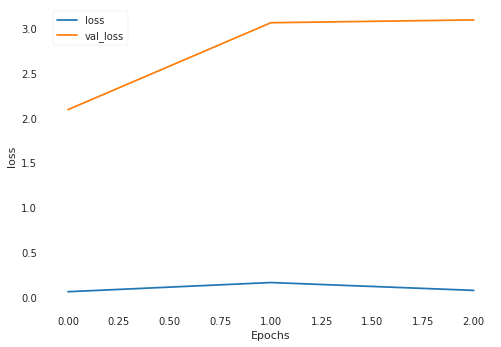

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0868 - val_loss: 3.0177
Epoch 2/3
882/882 [==============================] - 0s 404us/sample - loss: 0.1332 - val_loss: 1.9245
Epoch 3/3
882/882 [==============================] - 0s 379us/sample - loss: 0.1069 - val_loss: 2.0039
loss cuts = tf.Tensor([3.763908], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.895084, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.4156847], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.059455, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.997718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.350937, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.339371], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(11.460137, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.4602213], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(12.292966, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.4773426], shape=(

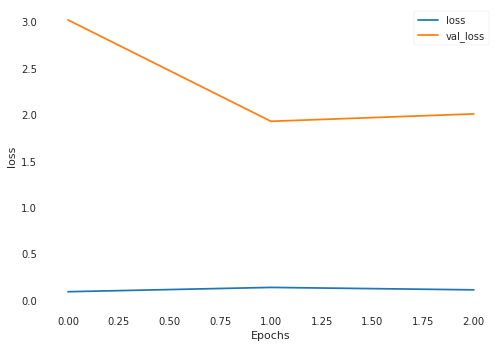

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 432us/sample - loss: 0.0996 - val_loss: 0.8694
Epoch 2/3
882/882 [==============================] - 0s 400us/sample - loss: 0.0642 - val_loss: 0.9654
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0585 - val_loss: 0.6909
loss cuts = tf.Tensor([1.9595718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5737183, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9840677], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.481703, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1405165], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9223335, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1906059], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7535884, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.179321], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.7911677, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9006813], shap

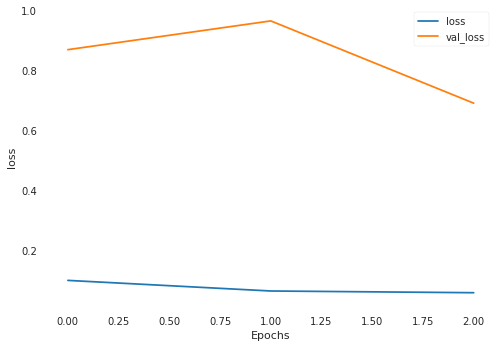

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 423us/sample - loss: 0.0422 - val_loss: 9.9474
Epoch 2/3
882/882 [==============================] - 0s 399us/sample - loss: 0.0969 - val_loss: 9.0496
Epoch 3/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0640 - val_loss: 7.1603
loss cuts = tf.Tensor([3.5653648], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.511747, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.7648675], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8369828, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.6450384], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.63208616, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.6531255], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.64501077, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.6903226], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7061423, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8190162], s

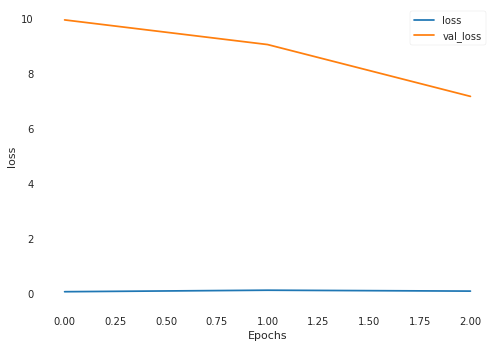

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0656 - val_loss: 0.6288
Epoch 2/3
882/882 [==============================] - 0s 405us/sample - loss: 0.3471 - val_loss: 0.8669
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.2786 - val_loss: 1.8196
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.2267222], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.736264, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2324978], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.7041698, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2201245], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.77301, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.153183], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.7309451, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.1107683], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.80526924, shape=(), dtype=float32)
loss cuts = 

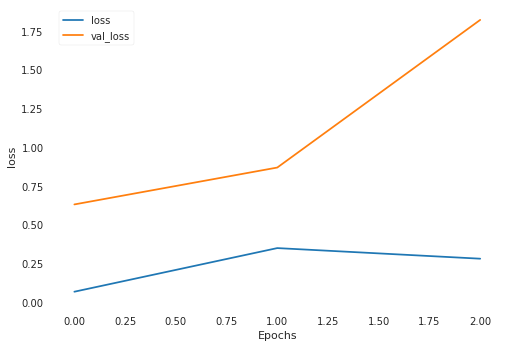

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 414us/sample - loss: 0.1845 - val_loss: 1.1071
Epoch 2/3
882/882 [==============================] - 0s 395us/sample - loss: 0.1487 - val_loss: 0.8979
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.3465 - val_loss: 1.0929
loss cuts = tf.Tensor([4.5623407], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(16.81597, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.777293], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(18.625097, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.200653], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(13.980421, shape=(), dtype=float32)
loss cuts = tf.Tensor([5.2048235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(22.498049, shape=(), dtype=float32)
loss cuts = tf.Tensor([5.003164], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(20.625687, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.271449], shape=(

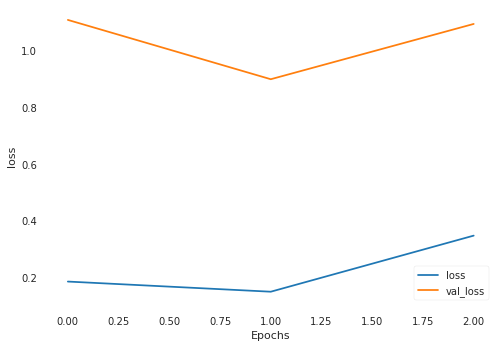

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.1807 - val_loss: 0.5248
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.1454 - val_loss: 0.4827
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0838 - val_loss: 1.6232
loss cuts = tf.Tensor([2.6719763], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7704349, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.559786], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4844661, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6077235], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.6035765, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3429327], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0030689, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.901282], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4332337, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9798236], shap

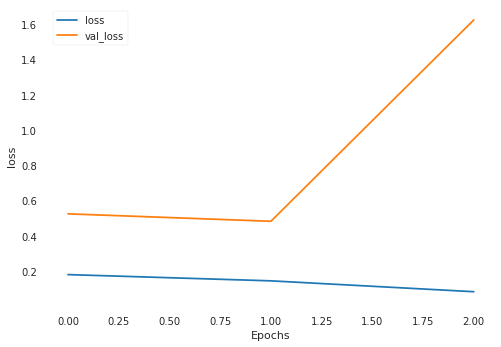

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 430us/sample - loss: 0.0931 - val_loss: 3.2928
Epoch 2/3
882/882 [==============================] - 0s 406us/sample - loss: 0.0782 - val_loss: 3.9333
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.1333 - val_loss: 3.6522
Epoch 00003: early stopping
loss cuts = tf.Tensor([3.8908172], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.7209954, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.4121995], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.69619, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.5357447], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.480861, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.523615], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.40247, shape=(), dtype=float32)
loss cuts = tf.Tensor([4.4895234], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.1837225, shape=(), dtype=float32)
loss cuts = 

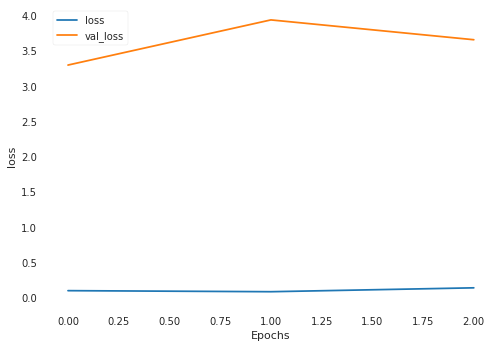

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 437us/sample - loss: 0.1456 - val_loss: 0.8356
Epoch 2/3
882/882 [==============================] - 0s 431us/sample - loss: 0.1570 - val_loss: 2.3269
Epoch 3/3
882/882 [==============================] - 0s 388us/sample - loss: 0.1446 - val_loss: 0.5974
loss cuts = tf.Tensor([2.1588478], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.3494609, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0090888], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.5489495, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8309991], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8445626, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7763557], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.94798315, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7679244], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.9644724, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8768103], s

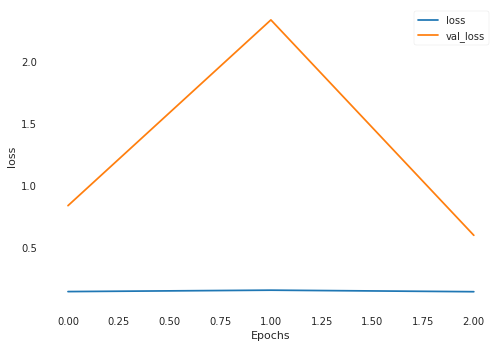

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0925 - val_loss: 1.4838
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.1178 - val_loss: 0.6166
Epoch 3/3
882/882 [==============================] - 0s 384us/sample - loss: 0.0661 - val_loss: 0.5050
loss cuts = tf.Tensor([0.22844711], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.4336445, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.19994156], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5400991, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.20579554], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5181048, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.20664403], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5149224, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.24861315], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3593154, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.2553275

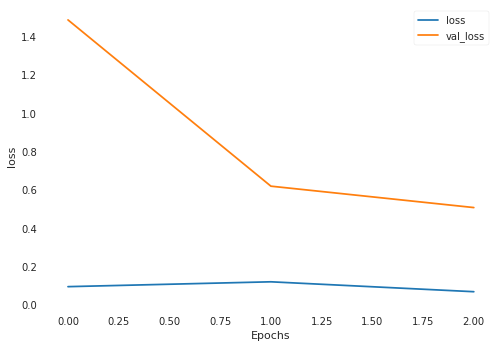

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0602 - val_loss: 1.2720
Epoch 2/3
882/882 [==============================] - 0s 403us/sample - loss: 0.0693 - val_loss: 1.5786
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0491 - val_loss: 1.3467
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.819911], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.3555837, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.77416337], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.588338, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3606086], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9217098, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4041295], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.7512321, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4201273], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.6895187, shape=(), dtype=float32)
loss cuts 

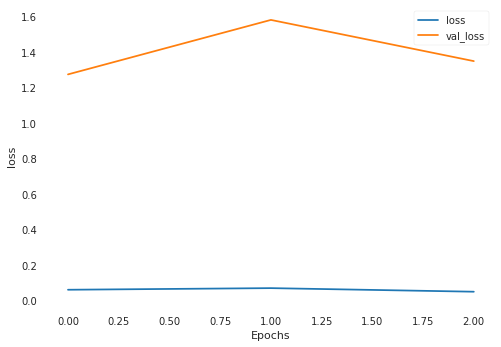

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0435 - val_loss: 1.8066
Epoch 2/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0448 - val_loss: 1.1144
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0381 - val_loss: 0.9470
loss cuts = tf.Tensor([1.4570026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.611416, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4137204], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.881659, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9646162], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.7216506, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0112844], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.481844, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0046515], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.5156617, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8467417], shape

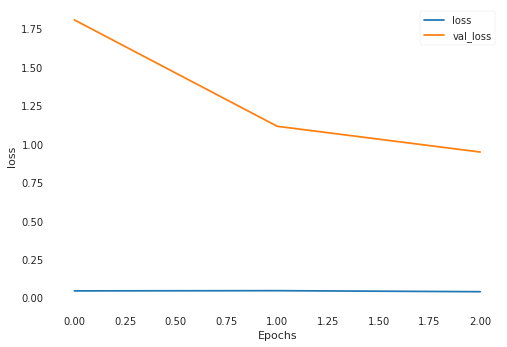

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 428us/sample - loss: 0.0356 - val_loss: 3.6466
Epoch 2/3
882/882 [==============================] - 0s 396us/sample - loss: 0.0319 - val_loss: 3.3031
Epoch 3/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0342 - val_loss: 3.8161
loss cuts = tf.Tensor([0.8835637], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(39.72087, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.209998], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(35.712757, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1790994], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(36.08301, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0853157], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(37.21851, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1177044], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(36.82437, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1181514], shape=(

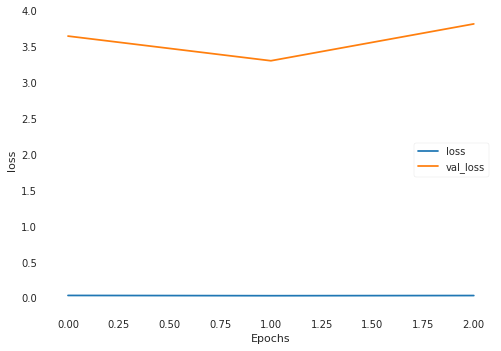

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 402us/sample - loss: 0.0528 - val_loss: 0.3800
Epoch 2/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0459 - val_loss: 0.2874
Epoch 3/3
882/882 [==============================] - 0s 391us/sample - loss: 0.0340 - val_loss: 0.1201
loss cuts = tf.Tensor([9.784146], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(38.243668, shape=(), dtype=float32)
loss cuts = tf.Tensor([9.611984], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(36.143955, shape=(), dtype=float32)
loss cuts = tf.Tensor([9.597772], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(35.973267, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8778552], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.9657824, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8205409], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.1664743, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7846909], shape

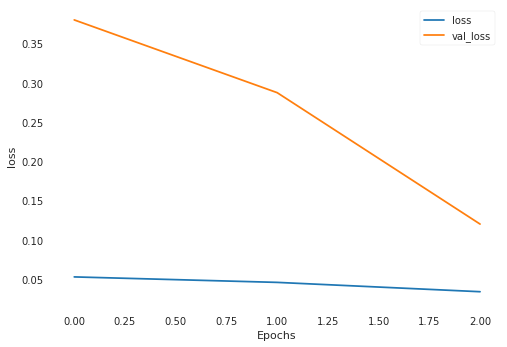

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0338 - val_loss: 0.5002
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0352 - val_loss: 0.5160
Epoch 3/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0364 - val_loss: 0.5771
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.6958535], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.35504133, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4788216], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.14350581, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0128078], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.8332181, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.01953], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.84553546, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7864217], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.47117466, shape=(), dtype=float32)
loss cu

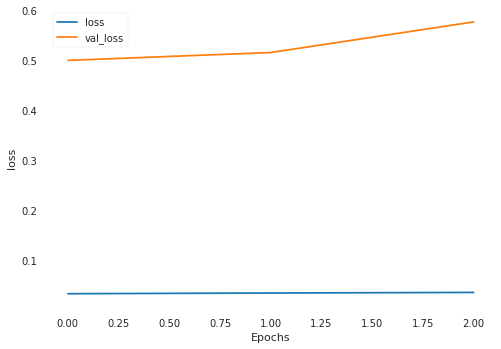

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 421us/sample - loss: 0.0408 - val_loss: 0.4632
Epoch 2/3
882/882 [==============================] - 0s 388us/sample - loss: 0.0383 - val_loss: 0.5201
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0362 - val_loss: 0.5755
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.759585], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004816436, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7543912], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0055643036, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7571712], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0051572933, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7408266], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.007771982, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8618276], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0010786074, shape=(), dtype=float3

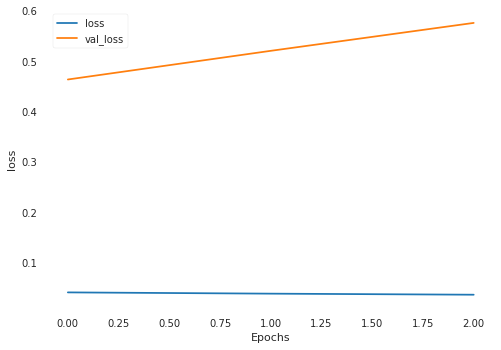

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 407us/sample - loss: 0.0399 - val_loss: 0.9532
Epoch 2/3
882/882 [==============================] - 0s 391us/sample - loss: 0.4428 - val_loss: 1.5148
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.5895 - val_loss: 4.8301
Epoch 00003: early stopping
loss cuts = tf.Tensor([0.82818836], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.3189979, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.7642151], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.556185, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.51380134], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.563345, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.4710184], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.7479615, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.45780137], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.8057356, shape=(), dtype=float32)
loss cut

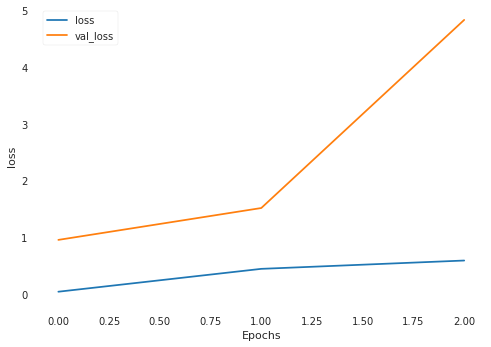

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 409us/sample - loss: 0.4477 - val_loss: 2.3723
Epoch 2/3
882/882 [==============================] - 0s 392us/sample - loss: 0.2995 - val_loss: 1.3581
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.3163 - val_loss: 1.8991
loss cuts = tf.Tensor([1.1628114], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.028617, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1185395], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.94077516, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1830425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0700635, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0446718], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.5950737, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.423006], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.172905, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.931303], shape

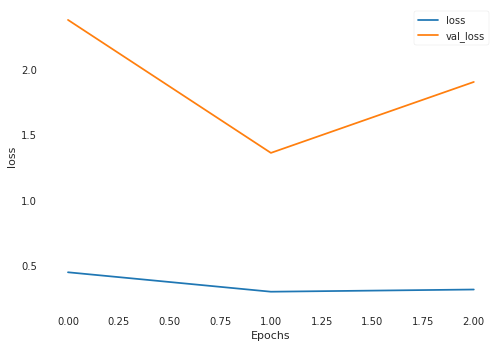

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.2396 - val_loss: 1.8079
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.1455 - val_loss: 0.5233
Epoch 3/3
882/882 [==============================] - 0s 375us/sample - loss: 0.0903 - val_loss: 0.8188
loss cuts = tf.Tensor([2.1244473], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.03043186, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1887696], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.05701089, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1144156], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.027032489, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1060398], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024348393, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0832298], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.01775016, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.08754

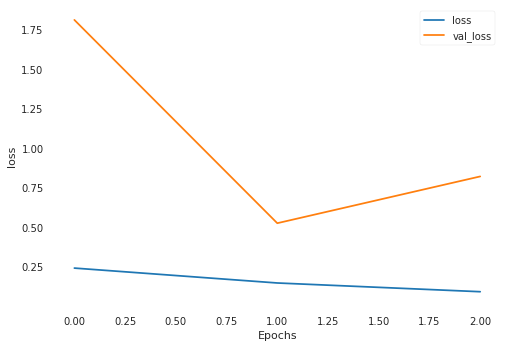

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 405us/sample - loss: 0.0717 - val_loss: 0.3847
Epoch 2/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0625 - val_loss: 0.3525
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0429 - val_loss: 0.2809
loss cuts = tf.Tensor([2.1501188], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6401901, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1103904], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.57819355, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.798881], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.20149417, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9755174], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.39127198, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0092952], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.43467015, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.052683], 

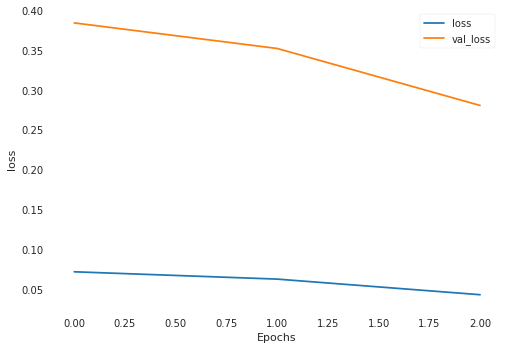

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 418us/sample - loss: 0.0373 - val_loss: 0.4836
Epoch 2/3
882/882 [==============================] - 0s 414us/sample - loss: 0.0426 - val_loss: 0.2910
Epoch 3/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0403 - val_loss: 0.3102
loss cuts = tf.Tensor([2.4778833], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(52.883682, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3749056], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(54.392017, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4045541], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(53.95557, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2635486], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(56.04695, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6289864], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(50.708836, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.7466993], shap

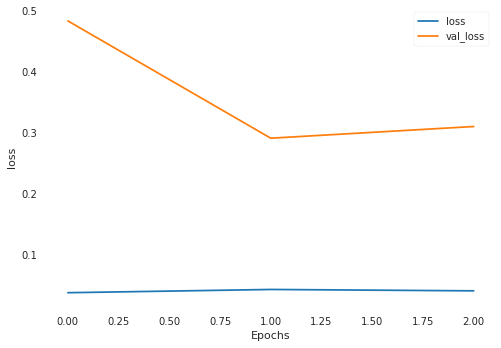

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 397us/sample - loss: 0.0363 - val_loss: 0.6933
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0423 - val_loss: 0.5446
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.0385 - val_loss: 0.7882
loss cuts = tf.Tensor([2.0457368], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1251178, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1054294], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0020472, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8698194], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.055995207, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9726026], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.017915785, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9456573], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0258551, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.950251],

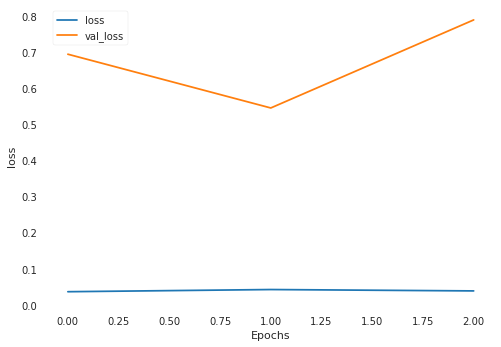

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 382us/sample - loss: 0.0455 - val_loss: 0.3246
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0372 - val_loss: 0.3431
Epoch 3/3
882/882 [==============================] - 0s 381us/sample - loss: 0.0331 - val_loss: 0.2187
loss cuts = tf.Tensor([1.3657589], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.313621, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3071866], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.1827885, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5316237], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7213385, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4468651], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.5061162, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2668167], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0966088, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3120453], sha

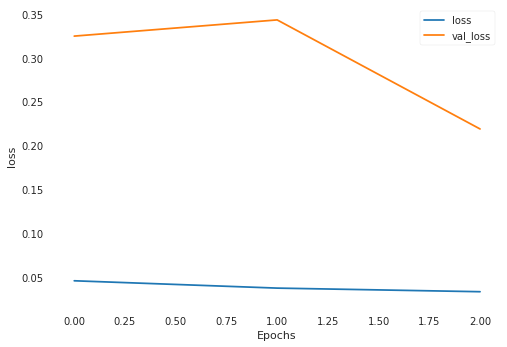

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0308 - val_loss: 1.2777
Epoch 2/3
882/882 [==============================] - 0s 378us/sample - loss: 0.4500 - val_loss: 5.5180
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 1.7046 - val_loss: 1.2311
loss cuts = tf.Tensor([2.2826781], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8703554, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.5128427], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.0177157, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.4482894], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.2461612, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3932972], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.4473453, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2914534], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.8359048, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2861154], sh

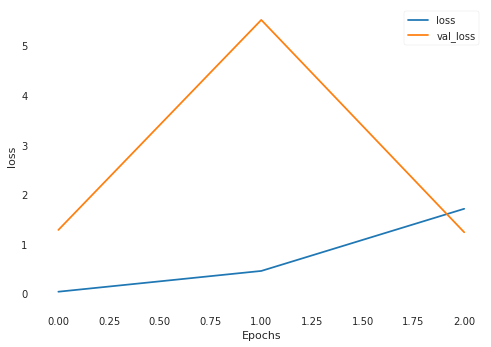

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 384us/sample - loss: 0.5847 - val_loss: 1.0100
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.3044 - val_loss: 1.0038
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.2345 - val_loss: 0.4725
loss cuts = tf.Tensor([3.603995], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.297039, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.573316], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.132234, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.714893], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(7.908476, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.9047205], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.0121765, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.9287167], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.156826, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.8330545], shape=(1,

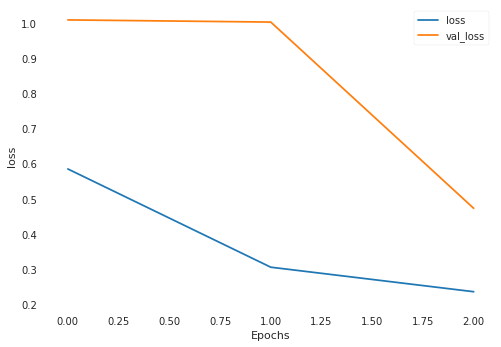

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.1708 - val_loss: 1.3832
Epoch 2/3
882/882 [==============================] - 0s 375us/sample - loss: 0.1363 - val_loss: 0.7675
Epoch 3/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0986 - val_loss: 0.4861
loss cuts = tf.Tensor([1.3492762], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.6388424, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3309135], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.60982597, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8988789], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8194742, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9187186], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.8733907, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.000639], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.1043534, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3000143], sh

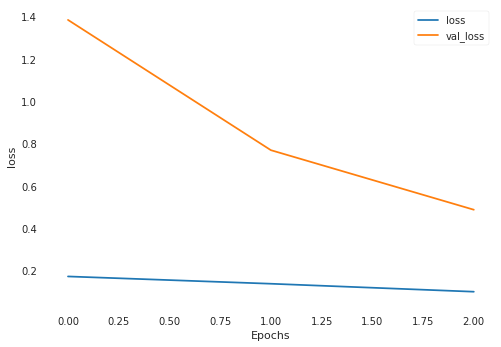

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 394us/sample - loss: 0.0970 - val_loss: 0.4533
Epoch 2/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0727 - val_loss: 0.4872
Epoch 3/3
882/882 [==============================] - 0s 383us/sample - loss: 0.0793 - val_loss: 0.7228
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.2864895], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.018629353, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9473709], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.041058596, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8646032], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08145141, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7518792], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15850024, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.8417706], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.09500539, shape=(), dtype=float32)
lo

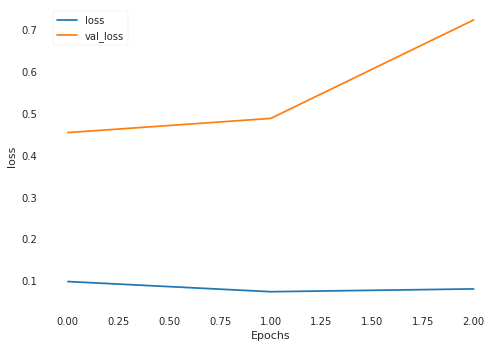

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 387us/sample - loss: 0.3224 - val_loss: 1.2615
Epoch 2/3
882/882 [==============================] - 0s 370us/sample - loss: 0.5858 - val_loss: 0.8260
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.2512 - val_loss: 0.4499
loss cuts = tf.Tensor([1.7315094], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(28.286346, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3492154], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(32.498947, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2333634], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(33.833267, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6072601], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(29.623419, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.4008318], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(31.913105, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.698665], sha

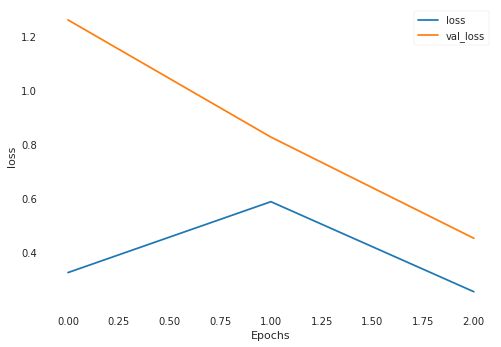

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 391us/sample - loss: 0.1093 - val_loss: 0.5949
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0790 - val_loss: 1.0055
Epoch 3/3
882/882 [==============================] - 0s 364us/sample - loss: 0.1230 - val_loss: 0.6793
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.99329], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.022826718, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6107988], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2847036, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.9855342], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.3429122, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6945267], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2023636, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6993668], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.19803236, shape=(), dtype=float32)
loss cut

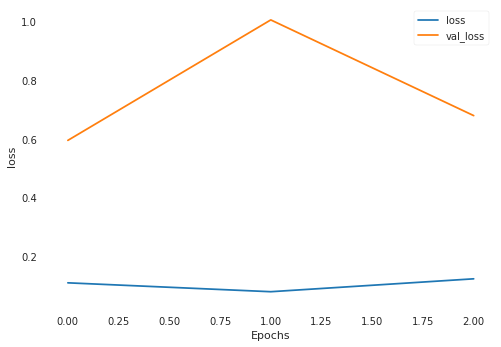

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 393us/sample - loss: 0.0934 - val_loss: 0.4819
Epoch 2/3
882/882 [==============================] - 0s 379us/sample - loss: 0.0644 - val_loss: 0.4607
Epoch 3/3
882/882 [==============================] - 0s 373us/sample - loss: 0.0596 - val_loss: 0.4672
loss cuts = tf.Tensor([1.90255], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.08847654, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.3572292], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.024721017, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.2642634], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.004129777, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.0322127], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.028152583, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.041425], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.025146049, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.156736

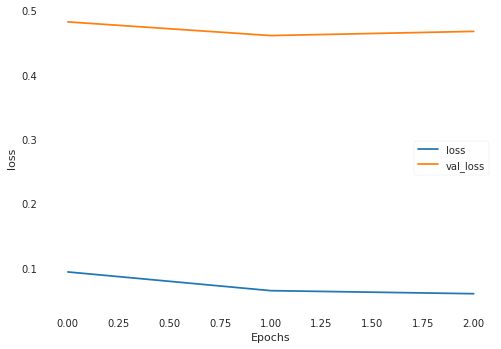

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 398us/sample - loss: 0.0501 - val_loss: 0.2609
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0457 - val_loss: 0.4909
Epoch 3/3
882/882 [==============================] - 0s 370us/sample - loss: 0.0949 - val_loss: 0.5421
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5316974], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.2222109, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6417046], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.13059936, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6054766], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.15809633, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6630948], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1155967, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.963155], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0015947941, shape=(), dtype=float32)
loss 

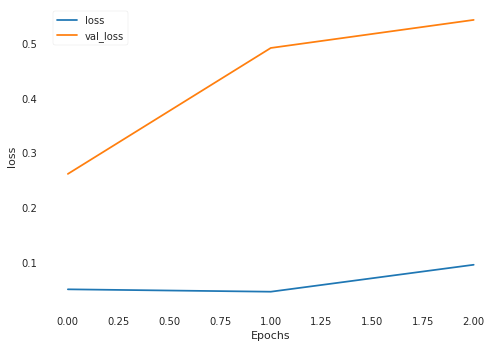

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 392us/sample - loss: 0.1132 - val_loss: 0.1799
Epoch 2/3
882/882 [==============================] - 0s 389us/sample - loss: 0.0601 - val_loss: 0.1063
Epoch 3/3
882/882 [==============================] - 0s 376us/sample - loss: 0.1004 - val_loss: 0.1365
loss cuts = tf.Tensor([2.4873576], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4098182, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6883855], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.9276145, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8765879], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4856296, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.428105], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.5288315, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.4242103], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(4.5122695, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.0652823], sha

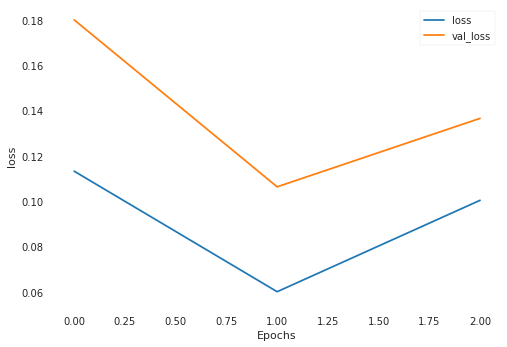

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0940 - val_loss: 0.3683
Epoch 2/3
882/882 [==============================] - 0s 374us/sample - loss: 0.0493 - val_loss: 0.6407
Epoch 3/3
882/882 [==============================] - 0s 368us/sample - loss: 0.0413 - val_loss: 0.3762
Epoch 00003: early stopping
loss cuts = tf.Tensor([2.7726974], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.847078, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8235335], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.095513, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.902268], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.490488, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8601127], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.277472, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.9081082], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.5202804, shape=(), dtype=float32)
loss cuts = tf

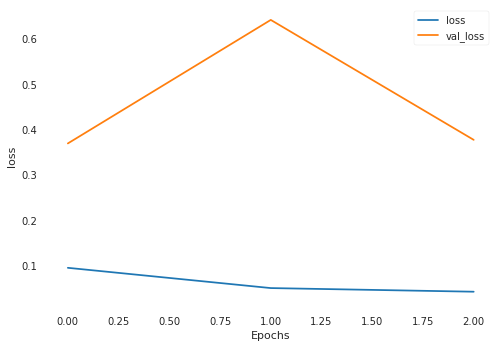

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 386us/sample - loss: 0.0386 - val_loss: 0.2010
Epoch 2/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0375 - val_loss: 0.0787
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0353 - val_loss: 0.3778
loss cuts = tf.Tensor([1.317835], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.0067510875, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.1342169], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.07064064, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.2464232], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.023585813, shape=(), dtype=float32)
loss cuts = tf.Tensor([0.9605806], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1930894, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0191138], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(0.1450743, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.0392693

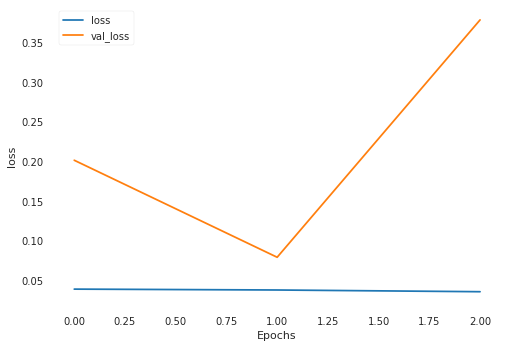

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 408us/sample - loss: 0.0356 - val_loss: 0.0966
Epoch 2/3
882/882 [==============================] - 0s 372us/sample - loss: 0.0341 - val_loss: 0.1094
Epoch 3/3
882/882 [==============================] - 0s 371us/sample - loss: 0.0453 - val_loss: 0.2428
Epoch 00003: early stopping
loss cuts = tf.Tensor([1.5027319], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4465638, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6083025], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.7116551, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.5099806], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.4640528, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3082871], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.016643, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.3486931], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.0997574, shape=(), dtype=float32)
loss cuts 

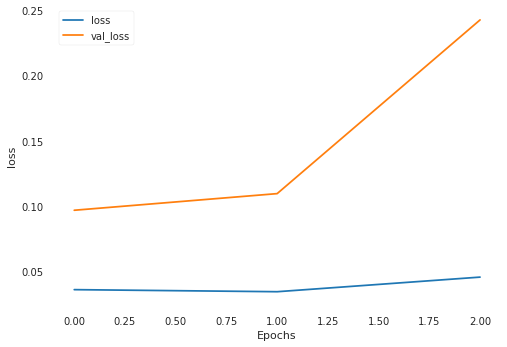

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 404us/sample - loss: 0.0457 - val_loss: 0.1553
Epoch 2/3
882/882 [==============================] - 0s 385us/sample - loss: 0.0354 - val_loss: 0.0984
Epoch 3/3
882/882 [==============================] - 0s 380us/sample - loss: 0.0360 - val_loss: 0.1268
loss cuts = tf.Tensor([2.550599], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.406755, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.6570706], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(5.9132357, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8687534], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(6.9875493, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.260943], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(9.2147875, shape=(), dtype=float32)
loss cuts = tf.Tensor([3.458965], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(10.456227, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.8749573], shape=

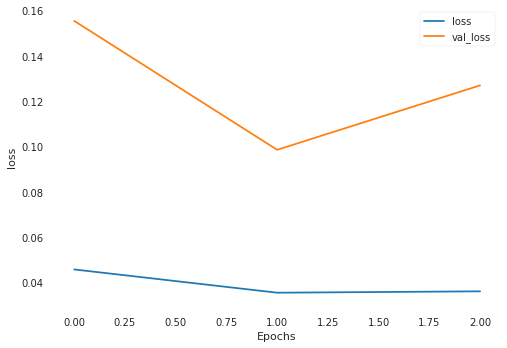

Train on 882 samples, validate on 1 samples
Epoch 1/3
882/882 [==============================] - 0s 395us/sample - loss: 0.0419 - val_loss: 0.1628
Epoch 2/3
882/882 [==============================] - 0s 390us/sample - loss: 0.0379 - val_loss: 0.1333
Epoch 3/3
882/882 [==============================] - 0s 367us/sample - loss: 0.0384 - val_loss: 0.1362
loss cuts = tf.Tensor([1.6916953], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.2251549, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.6294358], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.0432866, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.7617669], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(2.4391158, shape=(), dtype=float32)
loss cuts = tf.Tensor([1.334338], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(1.2867224, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.1875398], shape=(1,), dtype=float32)
model2 loss = tf.Tensor(3.9503143, shape=(), dtype=float32)
loss cuts = tf.Tensor([2.194894], shap

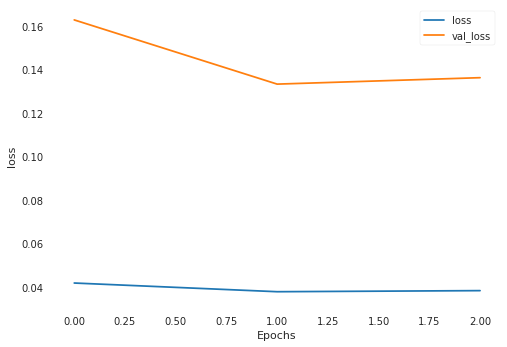

In [16]:
current_train_start = df.loc[prepro.date_to_index(df, train_start), 'date']
current_train_end = df.loc[prepro.date_to_index(df, train_end), 'date']
current_test_start = df.loc[prepro.date_to_index(df, test_start), 'date']
current_test_end = df.loc[prepro.date_to_index(df, test_start) + trans_day - 1, 'date']


#  각 transfer 구간의 예측값들을 합치기 위하여
test_prediction1 = []
test_prediction2 = []
test_target = []

while True:

    gc.collect()

    train_data, test_data = prepro.get_train_test_data(df, target_column, remove_columns, 
                                                           current_train_start, current_train_end,
                                                           current_test_start, current_test_end,
                                                           future_day, n_timestep, time_interval)


    train_x, train_y = prepro.get_LSTM_dataset(train_data, n_timestep, time_interval, input_size, future_day)
    test_x, test_y = prepro.get_LSTM_dataset(test_data, n_timestep, time_interval, input_size, future_day)
    test_y_target = np.expand_dims(test_y[:, :, 3], axis=2)

    # the firs training dataset
    train_x = train_x[:train_end_back]
    train_y_target = np.expand_dims(train_y[:train_end_back, :, 3], axis=2)

    # model1 training
    early_stopping1 = tf.keras.callbacks.EarlyStopping(patience=2, verbose=1)
    model1.load_weights(checkpoint_path)
    history = model1.fit(train_x, train_y_target, batch_size=batch_size, epochs=3, callbacks=[early_stopping1], validation_data=(test_x, test_y_target))
    model1.save_weights(checkpoint_path)
    
    # model2 test input 생성
    preds = tf.cast(tf.math.sign(model1(test_x)), dtype=tf.float64)
    targets = test_y_target.copy()
    targets[:, -max(1, int(future_day/time_interval)):, :] = 0    
    test_x_m2 = tf.concat([test_x, preds, targets], 2)  

    # model2 training
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)    
    early_stopping2 = learn.EarlyStopping(patience=2, verbose=1)
    iter = epochs
    basic_epochs = tf.cast(epochs / 5, dtype=tf.int32)
    for iteration in range(iter):
        batch_input, batch_output = learn.next_random_interval_batch(train_x, train_y, batch_size, future_day)

        gradients2 = gradient2(model1, model2, batch_input, batch_output)
        optimizer.apply_gradients(zip(gradients2, model2.trainable_variables))
        if iteration % 100 == 0:

            # model2의 test output 생성
            loss_cuts = tf.reshape(model2(test_x_m2)[:, -1, 0]*10, [-1])
            print('loss cuts =', loss_cuts)       

            # model2의 test loss
            loss2 = loss_fn_model2(model1, model2, test_x, test_y)
            print('model2 loss =', loss2)  


        if iteration > iter / 2 and early_stopping2.validate(loss2)==True:
            break    

    if iter > basic_epochs: iter -= basic_epochs
    if iter < basic_epochs: iter = basic_epochs

    print('test dates ' + current_test_start + "~" + current_test_end)

    # prediction1 accuracy
    updown = np.sign(test_y[:, -1, 0]).reshape((-1))
    prediction1 = model1.predict(test_x)[:, -1, 0].reshape(-1)
    temp = tf.math.multiply(updown, prediction1)
    accu = tf.reduce_sum(list(map(lambda x: 1 if x > 0 else 0, temp)))/len(temp)
    print('prediction1 accuracy = ', accu)

    # reinforced prediction2
    preds = tf.cast(tf.math.sign(model1(test_x)), dtype=tf.float64)
    test_x_m2 = tf.concat([test_x, preds, targets], 2)
    prediction2 = tf.reshape(model2(test_x_m2)[:, -1, 0]*10, [-1])    
    print('prediction2 = ', prediction2)

    # loss graph
    plot_graphs(history, 'loss')

    test_prediction1.append(prediction1)
    test_prediction2.append(prediction2)

    # escape from while
    if current_test_end == test_end:
     break

    #train, start dates shift
    current_train_end = df.loc[prepro.date_to_index(df, current_train_end) + trans_day, 'date']
    current_train_start = df.loc[prepro.date_to_index(df, current_train_end) - 1000, 'date']
    current_test_start = df.loc[prepro.date_to_index(df, current_test_start) + trans_day, 'date']
    if prepro.date_to_index(df, test_end) - prepro.date_to_index(df, current_test_start) < trans_day:
        current_test_end = test_end
    else:
        current_test_end = df.loc[prepro.date_to_index(df, current_test_end) + trans_day, 'date']

In [17]:
t1 = np.concatenate(test_prediction1)
t2 = np.concatenate(test_prediction2)

In [18]:
#test_prediction = np.concatenate(test_prediction, axis=0).reshape((-1, n_timestep, 1))
#train_prediction = learn.predict_batch_test(model1, train_x[:batch_size], len(train_x[:batch_size]))

# 원 지수, 날짜는 target conversion이 되기 전 dataframe에서 가져옴 - 종가를 test base price로 하는 경우
test_dates, test_base_prices, train_dates, train_base_prices = prepro.get_test_dates_prices(dataframe, test_start, test_end,
                                                      train_start, train_end, n_timestep, time_interval, future_day, target_column)


# 전체 test_oouput 생성
_, test_data = prepro.get_train_test_data(df, target_column, remove_columns,
                                                   train_start, train_end,
                                                   test_start, test_end,
                                                   future_day, n_timestep, time_interval)
_, test_y = prepro.get_LSTM_dataset(test_data, n_timestep, time_interval, input_size, future_day)

In [19]:
updown = np.sign(test_y[:, -1, 3]).reshape((-1))
#calculate accuracy
temp = tf.math.multiply(updown, t1.reshape((-1)))
accu = tf.reduce_sum(list(map(lambda x: 1 if x > 0 else 0, temp)))/len(temp)
print('accuracy = ', accu)

accuracy =  tf.Tensor(0.5351941747572816, shape=(), dtype=float64)


In [20]:
updown.shape

(824,)

In [21]:
#train_base_prices = train_base_prices[:batch_size]
#train_prediction = train_prediction[:batch_size]
#train_y = train_y[:batch_size]

In [22]:
result = GenerateResult(t1, t2, test_y[:, -1, 3].reshape(-1), test_dates, n_timestep, future_day, train_end_back, trans_day)

In [23]:
test_start_index = prepro.date_to_index(df, test_start)
test_end_index = prepro.date_to_index(df, test_end)
test_open_prices = list(map(float, df.loc[test_start_index - future_day: test_end_index - future_day, '시가']))
test_high_prices = list(map(float, df.loc[test_start_index - future_day: test_end_index - future_day, '고가']))
test_low_prices = list(map(float, df.loc[test_start_index - future_day: test_end_index - future_day, '저가']))

In [24]:
#result.extract_last_output()
result.convert_price(test_base_prices,conversion_type=target_type)
# 손익 계산
profits = np.zeros(len(test_dates))
for i in range(len(test_dates)):
    if result.test_predict_price[i]-test_open_prices[i] > 0:
        profits[i] = result.test_output_price[i] - test_open_prices[i]
    else:
        profits[i] = test_open_prices[i] - result.test_output_price[i]
# 손절 손익 계산
profits2 = np.zeros(len(test_dates))
for i in range(len(test_dates)):
    if result.test_predict_price[i] - test_open_prices[i] > 0:
        if test_open_prices[i] - test_low_prices[i] > t2[i]:
            profits2[i] = -t2[i]
        else:
            profits2[i] = profits[i]
    else:
        if test_high_prices[i] - test_open_prices[i] > t2[i]:
            profits2[i] = -t2[i]
        else:
            profits2[i] = profits[i]

info : loss_cut-2_kospi200f_loss_cut_30_4_2_0.502
MSE : 20.4576 , Accuracy : 0.502
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: models/loss_cut-2_kospi200f_loss_cut_30_4_2_0.502/assets


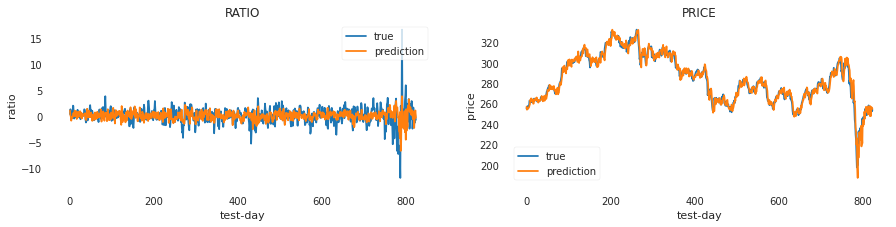

In [25]:
import operator
preds = np.array(result.test_predict_price) - np.array(test_open_prices)
trues = np.array(result.test_output_price) - np.array(test_open_prices)
result.evaluation(preds, trues)
result.table(test_open_prices, test_high_prices, test_low_prices, profits, profits2)
result.save_result(model_name,item_name,n_unit,target_type,batch_size,n_timestep,time_interval,epochs,str(alpha),comment)
result.save_visualization()
result.save_model(model2)

In [26]:
"""
current_train_start = df.loc[prepro.date_to_index(df, train_start), 'date']
current_train_end = df.loc[prepro.date_to_index(df, train_end), 'date']
current_test_start = df.loc[prepro.date_to_index(df, test_start), 'date']
current_test_end = df.loc[prepro.date_to_index(df, test_start) + trans_day - 1, 'date']


#  각 transfer 구간의 예측값들을 합치기 위하여
test_prediction1 = []
test_prediction2 = []
test_target = []

# early_stopping = tf.keras.callbacks.EarlyStopping(patience=3, verbose=1)
early_stopping = learn.EarlyStopping(patience=2, verbose=1)


gc.collect()

train_data, test_data = prepro.get_train_test_data(df, target_column, remove_columns, 
                                                       current_train_start, current_train_end,
                                                       current_test_start, current_test_end,
                                                       future_day, n_timestep, time_interval)

# input_size, columns reset
input_size = len(df.columns) - len(remove_columns)
input_columns = df.columns.copy()

train_x, train_y = prepro.get_LSTM_dataset(train_data, n_timestep, time_interval, input_size, future_day)
test_x, test_y = prepro.get_LSTM_dataset(test_data, n_timestep, time_interval, input_size, future_day)

#model.compile(optimizer='adam',
#          loss=loss_fn)
#          #callbacks=[cp-callback]
#          #metrics=['accuracy'])

# the firs training dataset
train_x = train_x[:-future_day]
train_y = train_y[:-future_day]    

#global_step = tf.train.get_or_create_global_step()
global_step = tf.Variable(0, trainable=False)
#lr_decay = tf.train.exponential_decay(learning_rate, global_step,
#                                      train_input.shape[0]/batch_size*5, 0.5, staircase=True)
lr_decay = tf.compat.v1.train.exponential_decay(learning_rate,global_step, int(len(train_y)/batch_size), 0.96, staircase=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
#optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=learning_rate)

updown = np.sign(test_y[:, -1, 0]).reshape((-1))    
epochs = len(train_y)
for iteration in range(399):
    batch_input, batch_output = learn.next_random_interval_batch(train_x, train_y, batch_size, future_day)

    #noise = 2*np.random.randn(batch_size,n_timestep,1)
    #batch_output = batch_output+noise
    #batch_input = encoder(train_input[idx])
    gradients1 = gradient1(model1, model2, batch_input, batch_output)
    optimizer.apply_gradients(zip(gradients1, model1.trainable_variables))
    
    targets = tf.reshape(train_y[:, -1, 0], [-1])
    rates = targets / 100
    preds = tf.reshape(model1(train_x, training=False)[:, -1, 0], [-1])
    
    n = len(targets)    
    returns = [1.0]
    losses = []
    for i in range(n - 1):
       
        # average_return, std of returns, remaining days, preds[0] 
        state = []
        
        random_rates = []
        for k in range(i+1):
            random_rates.append(rates[k])
        # 실재 수익률을 기반으로 random 수익률 생성, 예측에 의한 porfits 생성 
        for k in range(i+1, n):
            random_rates.append(tf.random.normal((), mean=targets[k] / 100, stddev=0.1, dtype=tf.float64))
        profits = tf.convert_to_tensor(random_rates, dtype=tf.float64)*tf.cast(preds, dtype=tf.float64) + 1
        
        # 현재까지의 예측에 의한 수익률 기하평균 구하기
        returns_past = []
        for k in range(i+1):
            returns_past.append(profits[k])
        avg_return = tf.cast(tf.math.reduce_prod(returns_past)**(1/(i+1)), dtype=tf.float64)
        
        state.append(avg_return)
        state.append(tf.math.reduce_std(returns))
        state.append((n - i) / n)
        state.append(preds[i])
        state = np.array(state).reshape((1, 4))
     
        # 목표일까지의 기대 기하 평균 수익률 구하기 
        returns_future = []
        for j in range(i+1, n):
            returns_future.append(profits[j])
        avg_return_future = tf.math.reduce_prod(returns_future)**(1/(n-i-1))

        # 예측 기하 평균 수익률과 기대 기하 평균 수익률의 MSE
        value = tf.cast(model2(state, training=True)[0, 0], dtype=tf.float64)
        losses.append((value - avg_return_future)**2)
        if n == 3: break
    print("losses", losses)
    print("value", value)    
    with tf.GradientTape() as tape:
        gradients2 = tape.gradient(tf.math.reduce_sum(losses), model2.trainable_variables)
    optimizer.apply_gradients(zip(gradients2, model2.trainable_variables))
    

    
    if iteration % 100 == 0:
        #test_MSE = model.evaluate(test_x, test_y)
        prediction = model1.predict(test_x)
        prediction_MSE = sum((updown - np.sign(prediction[:, -1, 0]).reshape(-1))**2)/len(test_y)
        print('prediction_MSE =', prediction_MSE)

    if iteration > epochs / 2 and early_stopping.validate(prediction_MSE)==True:
        break
epochs -= epochs / 5
if epochs <= 0: epochs = 100
"""

'\ncurrent_train_start = df.loc[prepro.date_to_index(df, train_start), \'date\']\ncurrent_train_end = df.loc[prepro.date_to_index(df, train_end), \'date\']\ncurrent_test_start = df.loc[prepro.date_to_index(df, test_start), \'date\']\ncurrent_test_end = df.loc[prepro.date_to_index(df, test_start) + trans_day - 1, \'date\']\n\n\n#  각 transfer 구간의 예측값들을 합치기 위하여\ntest_prediction1 = []\ntest_prediction2 = []\ntest_target = []\n\n# early_stopping = tf.keras.callbacks.EarlyStopping(patience=3, verbose=1)\nearly_stopping = learn.EarlyStopping(patience=2, verbose=1)\n\n\ngc.collect()\n\ntrain_data, test_data = prepro.get_train_test_data(df, target_column, remove_columns, \n                                                       current_train_start, current_train_end,\n                                                       current_test_start, current_test_end,\n                                                       future_day, n_timestep, time_interval)\n\n# input_size, columns reset\ninput_size 